In [5]:
# Librerias importantes
import numpy as np
import matplotlib.pyplot as plt
import pandas 
import csv
from scipy import signal

def lect_var(file):
    """
    Funcion de lectura DVT de variables TPDO en formato csv
    """
    df = pandas.read_csv(file, sep=',', low_memory=False)
    df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
    df = df.loc[:, ~df.columns.str.contains('Time')]
    df = df.loc[:, ~df.columns.str.contains('0x0082_Supply_critical')]
    df['1. Velocity RPM (1)'] = df['1. Velocity RPM (1)'].astype('float')
    # df['Target torque % of peak (0.1)'] = df['Target torque % of peak (0.1)'].astype('float')
    # if 'P' in df['1. Current A(RMS) (1)'].values:
    #     d = np.asarray(df['1. Current A(RMS) (1)'])
    #     df = df.drop(['1. Current A(RMS) (1)'], axis = 1)
    #     dd = np.where(d == 'P')
    #     d[int(dd[0]):len(d)-1] = 0
    #     df.insert(loc=0, column='1. Current A(RMS) (1)', value=d)
    # df['1. Current A(RMS) (1)'] = df['1. Current A(RMS) (1)'].astype('float')
    return df
def lect_parm(file):
    """
    Funcion de lectura DVT de paramtros de configuracion entre dos archivos
    .dfc en csv o ddde la lectura de TPDO
    """
    List = []
    with open(file, 'r') as file:
        reader = csv.reader(file, delimiter = '\t')
        for row in reader:
            List.append(row)
        idx=List.index(['<CONTROLLER_CONFIG>'])     
        if idx != 0:
            List = List[idx:]
    return List
def lectura_comparativas(file):
    """
    Funcion de lectura DVT de comparativas de configuracion entre dos archivos
    .dfc en csv o ddde la lectura de TPDO
    """
    List = []
    with open(file, 'r') as file:
        reader = csv.reader(file, delimiter = '\t')
        for row in reader:
            List.append(row)
    return List
def rpm2rad(Rpm):
    """
    RPM a velocidad angular
    """
    w = (2 * np.pi * Rpm) / 60
    return w
def Rpm2KmHrs(Rpm):
    return (3 / 25) * np.pi * 0.31 *Rpm

def pot_out(Rpm, trq):
    """
    Funcion calculo de potenci de salida motor
    """
    Pot= rpm2rad(Rpm) * trq 
    return Pot
from scipy.signal import savgol_filter
def filtro_ruido(data):
    """
    Funcion filtro de ruido
    """
    flt = savgol_filter(data, 401, 2)
    return flt
def p_in(V_bat, I_bat):
    """
    Funcion calculo de potencia inversor-motor
    """ 
    Pin = (V_bat * I_bat)
    return Pin
def I_Mag(Iq, Id):
    """
    Funcion calculo de magnitud de corriente
    """
    return np.sqrt(Id**2 + Iq**2)
def pot_controler(Iq, Vq, Id, Vd):
    """
    Funcion calculo de potencia salida inversor-motor
    """ 
    pinc =  ((Vq * Iq) + (Vd * Id))
    return pinc
def eff(Rpm, trq, V_bat, I_bat):
    """
    Funcion calculo de eficiencia sistema bateria-inversor-motor
    """ 
    pot = pot_out(Rpm, trq)
    pot = np.asarray(pot)
    pot[pot == 0] = 1e-16
    pin = p_in(V_bat, I_bat)
    pin = np.asarray(pin)
    pin[pin == 0] = 1
    for i in range(len(pin)):
        if pin[i] == 0:
            pin[i] = 1
            pot[i] = 1e-16
    D = pot / pin
    D[D > 0.99999999999999] = 1
    D[D < 0] = 0
    return D    
def eff_media(Rpm, trq, V_bat, I_bat):
    """
    Funcion calculo de eficiencia MEDIA sistema bateria-inversor-motor
    """ 
    mean_V_bat = np.mean(V_bat)
    mean_I_bat = np.mean(I_bat)
    mean_trq = np.mean(trq)
    mean_RPM = np.mean(rpm2rad(Rpm))
    return 100 * (mean_trq * mean_RPM) / (mean_V_bat * mean_I_bat )
def eff2(Rpm, trq, Iq, Vq, Id, Vd):
    """
    Funcion calculo de eficiencia sistema bateria-inversor-motor
    """ 
    pot = pot_out(Rpm, trq)
    pot = np.asarray(pot)
    pot[pot == 0] = 1e-16
    pot_controle = np.sqrt(3)* pot_controler(Iq, Vq, Id, Vd)
    pin = np.asarray(pot_controle)
    pin[pin == 0] = 1
    for i in range(len(pin)):
        if pin[i] == 0:
            pin[i] = 1
            pot[i] = 1e-6
    D = pot / pin
    D[D > 0.99999999999999] = 1
    D[D < 0] = 0
    return D
def Ts(file):
    df = pandas.read_csv(file, sep=',', low_memory=False)
    # df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
    # df = df.loc[:, ~df.columns.str.contains('^CONTROLLER_CONFIG')]
    time = df['Time (s).1']
    mins = time.loc[time.idxmin()] 
    maxs = time.loc[time.idxmax()] 
    d = np.asarray(time).astype(float)
    # d = np.nan_to_num(d)
    # d = d[d != 0]
    # tf = np.max(d)
    # t0 = np.min(d)
    t = np.linspace(mins, maxs, len(time))
    return t
# time.time()
from scipy.optimize import curve_fit
def modelo_lineal(k, x):
    """
    fad
    """
    out = k * x
    return out
def func_minimizar(k, x):
    """
    fad
    """
    out = modelo_lineal(k, x)
    return out
# def butter_lowpass(cutoff, nyq_freq, order=4):
#     normal_cutoff = float(cutoff) / nyq_freq
#     b, a = signal.butter(order, normal_cutoff, btype='lowpass')
#     return b, a
# def butter_lowpass_filter(data, cutoff_freq, nyq_freq, order=6):
#     b, a = butter_lowpass(cutoff_freq, nyq_freq, order=order)
#     y = signal.filtfilt(b, a, data)
#     return y

from scipy.signal import butter, lfilter, freqz
import matplotlib.pyplot as plt


def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def butter_lowpass_filter(data, cutoff, fs, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = lfilter(b, a, data)
    return y

MAPA POTENCIA

1-VACIO SIN LIMITE

In [6]:
import matplotlib.pyplot as plt
import numpy as np
# p = 'prueba_carga_pancho_130222_173408.csv'
# p = 'vizcachas_220122_182408.csv'
# d_DIRECTA = 'master_slave_UD_650_5_0_dir_250222_124248.csv'

p = 'prueba1_cte_140122_222915.csv'
tm_p= Ts(p)  #[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)  #[12000:16200]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 2)
# ax2.set_ylim(-7, 2)
# ax3.set_ylim(-7, 2)
# ax4.set_ylim(0, 240)
ax1.set_title("Velocidad y torque vacío directa, $K_{t} = 0.61$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[Km/hrs]", fontsize=15)
ax2.set_ylabel("[V]", fontsize=15)
ax3.set_ylabel("[Nm]", fontsize=15)

line1, = ax1.plot(tm_p, Rpm2KmHrs(dF_p['1. Velocity RPM (1)']), color='red', label="Velocidad")
line2, = ax2.plot(tm_p, butter_lowpass_filter((dF_p['1. Throttle Input Voltage V (0.00390625)']), 3, 110, 4), color='green', label="acelerador")
line3, = ax3.plot(tm_p, butter_lowpass_filter((dF_p['1. Torque demand value Nm (0.0625)']), 3, 110, 4), color='yellow', label="Torque demandado")
line4, = ax3.plot(tm_p, butter_lowpass_filter((dF_p['1. Torque actual value Nm (0.0625)']), 3, 110, 4), color='blue', label="Torque aplicado")
line1.set_zorder(-1)
line2.set_zorder(-1)
line3.set_zorder(-1)
line4.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
ax3.tick_params(axis='x', labelsize=15)
ax3.tick_params(axis='y', labelsize=15)
lns = [line1, line2, line3, line4]
ax1.legend(handles=lns, loc='best',  prop={'size': 13})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'prueba1_cte_140122_222915.csv'

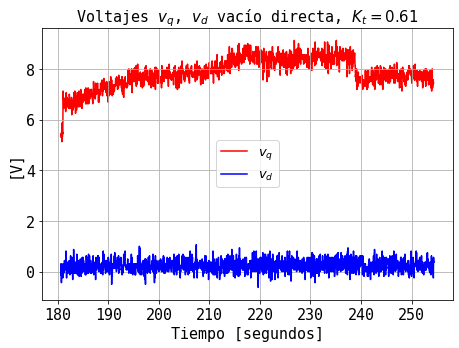

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'prueba1_cte_140122_222915.csv'
# p ='vacio_enero_rev_240122_195303.csv'

tm_p= Ts(p)#[7500:]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[7500:]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
fig.subplots_adjust(right=0.6)
# ax1.spines["right"].set_position(("axes", 1.2))
ax1.set_title("Voltajes $v_{q}$, $v_{d}$ vacío directa, $K_{t} = 0.61$", fontsize=15) 
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[V]", fontsize=15)
# ax2.set_ylabel("[V]", fontsize=10)
# ax1.set_ylim(-6, 22)
# ax2.set_ylim(-6, 30)
line1, = ax1.plot(tm_p, (dF_p['1. Uq V (0.0625)']), color='red', label="$v_{q}$")
line2, = ax1.plot(tm_p, dF_p['1. Ud V (0.0625)'], color='blue', label="$v_{d}$")
line1.set_zorder(-1)
# line2.set_zorder(-1)
# ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line1, line2]
ax1.legend(handles=lns, loc='center',  prop={'size': 13})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

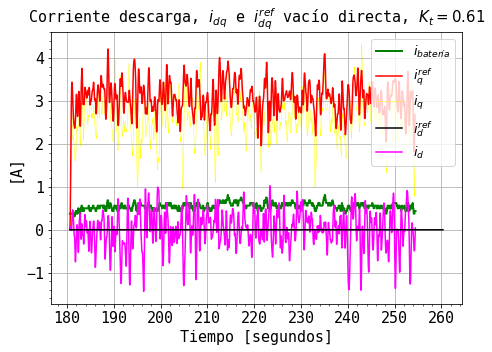

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

p = 'prueba1_cte_140122_222915.csv'

# p ='vacio_enero_rev_240122_195303.csv'

tm_p= Ts(p)#[:3000]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[:3000]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)

# ax4.set_ylim(0, 240)
ax1.set_title("Corriente descarga, $i_{dq}$ e $i^{ref}_{dq}$ vacío directa, $K_{t} = 0.61$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
ax1.set_ylabel("[A]", fontsize=15)
line2, = ax1.plot(tm_p, (dF_p['1. Battery Current A (0.0625)']),linewidth=2, color='green', label="$i_{batería}$")
line3, = ax1.plot(tm_p, (butter_lowpass_filter((dF_p['1. Iq A (0.0625)']), 3, 50, 3)), color='yellow',linewidth=0.5, label="$i_{q}$")
line4, = ax1.plot(tm_p, (butter_lowpass_filter(dF_p['1. Target Iq A (0.0625)'], 3, 50, 3)), color='red', label="$i^{ref}_{q}$")
line7, = ax1.plot(tm_p, butter_lowpass_filter((dF_p['1. Id A (0.0625)']), 3, 50, 3), color='magenta', label="$i_{d}$")
line6, = ax1.plot(tm_p,np.zeros(len(tm_p)), color='black', label="$i^{ref}_{d}$")
# ax3.set_ylabel("[Nm]", fontsize=12)
# ax4.set_ylabel("[A]", fontsize=10)
# line1, = ax1.plot(tm_p, Rpm2KmHrs(abs(dF_p['1. Velocity RPM (1)'])),linewidth=3, color='red', label="Velocidad")
# line4, = ax1.plot(tm_p, abs(dF_p['1. Torque demand value Nm (0.0625)']), color='yellow',linewidth=0.5,  label="$T^{ref}_{em}$")
# line5, = ax1.plot(tm_p, abs(dF_p['1. Torque actual value Nm (0.0625)']), color='blue',linewidth=1,  label="$T_{em}$")
# line5, = ax1.plot(tm_p, abs(dF_p['1. Iq A (0.0625)']), color='red', label="Corriente batería")
# plt.plot(tm_p, butter_lowpass_filter(abs(dF_p['1. Iq A (0.0625)']), 3, 200, 3), color='red', label="Corriente batería")
line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line4, line3,line6, line7]
ax1.legend(handles=lns, loc='best',  prop={'size': 13})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

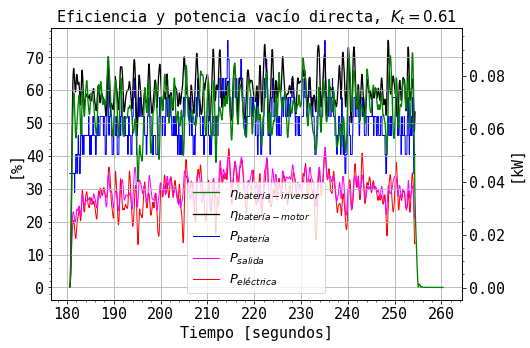

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# p = 'vacio_eficiencia enero_240122_162430.csv'
p = 'vacio_enero_rev_240122_195303.csv'
p = 'prueba1_cte_140122_222915.csv'


tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

BatV = (np.asarray(dF_p['1. Battery Voltage V (0.0625)']))
BatI = (np.asarray(dF_p['1. Battery Current A (0.0625)']))
Iq = (np.asarray(dF_p['1. Iq A (0.0625)']))
Uq = (np.asarray(dF_p['1. Uq V (0.0625)']))
Id = (np.asarray(dF_p['1. Id A (0.0625)']))
Ud = (np.asarray(dF_p['1. Ud V (0.0625)']))
Te = (np.asarray(dF_p['1. Torque actual value Nm (0.0625)']))
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad((np.asarray(dF_p['1. Velocity RPM (1)'])))

pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
pot_salida = Te * rad 
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)

DD = np.asarray(pot_salida) / np.asarray(pin)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
ax2 = ax1.twinx()


# line2, = ax2.plot(tm_p, (butter_lowpass_filter(100*D[:], 3, 124, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (butter_lowpass_filter((pin/1000), 3, 124, 3)),linewidth=1, color='blue', label="$P_{batería}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 124, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")

# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(0, 100)}
# ax2.set_ylim(0, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("Eficiencia y potencia vacío directa, $K_{t} = 0.61$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax2.set_ylabel("[kW]", fontsize=15)
ax1.set_ylabel("[%]", fontsize=15)

line1, = ax1.plot(tm_p, abs(butter_lowpass_filter((100*D[:]), 3, 84, 3)),linewidth=1.3, color='green', label="$\eta_{batería-inversor}$")
line2, = ax1.plot(tm_p, abs(butter_lowpass_filter((100*DD[:]), 3, 84, 3)),linewidth=1.3, color='black', label="$\eta_{batería-motor}$")

line4, = ax2.plot(tm_p, abs(pin/1000),linewidth=1, color='blue', label="$P_{batería}$")
line3, = ax2.plot(tm_p, abs(butter_lowpass_filter(pot/1000, 3, 74, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")
line5, = ax2.plot(tm_p, abs(butter_lowpass_filter((pot_salida/1000), 3, 74, 3)),linewidth=1, color='magenta', label="$P_{salida}$")
ax2.minorticks_on()
ax1.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
line2.set_zorder(-1)
line4.set_zorder(-1)
line3.set_zorder(-1)
# line4.set_zorder(-1)
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line1,line2, line4,line5, line3]
ax1.legend(handles=lns, loc='best',  prop={'size': 13})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

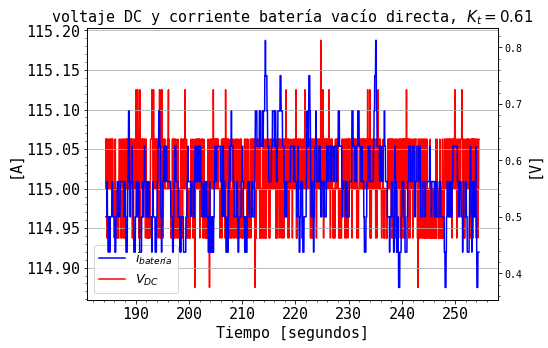

In [ ]:
d_REVERSA = 'vacio_enero_rev_240122_195303.csv'
d_REVERSA = 'prueba1_cte_140122_222915.csv'

# p = 

tm = Ts(d_REVERSA)#[7600:]   #[4000:8000]#[5600:9700]
dF_REVERSA = lect_var(d_REVERSA)#[7600:]   #[4000:8000]#[5600:9700]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("voltaje DC y corriente batería vacío directa, $K_{t} = 0.61$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[A]", fontsize=15)
ax2.set_ylabel("[V]", fontsize=15)
line1, = ax2.plot(tm[100:], (dF_REVERSA['1. Battery Current A (0.0625)'])[100:], color='blue', label='$i_{batería}$')
line2, = ax1.plot(tm[100:], np.asarray(dF_REVERSA['1. Battery Voltage V (0.0625)'])[100:], color='red', label='$V_{DC}$')

# line2, = ax1.plot(time1[:], bat_V[:], color='red', label=)
line1.set_zorder(-1)
line2.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
lns = [line1, line2]
ax1.legend(handles=lns, loc='lower left',  prop={'size': 13})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')
ax2.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

PISTA SIN LIMITE

vizcachas_220122_181647
vizcachas_220122_182408
vizcachas_220122_185404
vizcachas_220122_192809
vizcachas_220122_203324
vizcachas_220122_213002
vizcachas_220122_220938

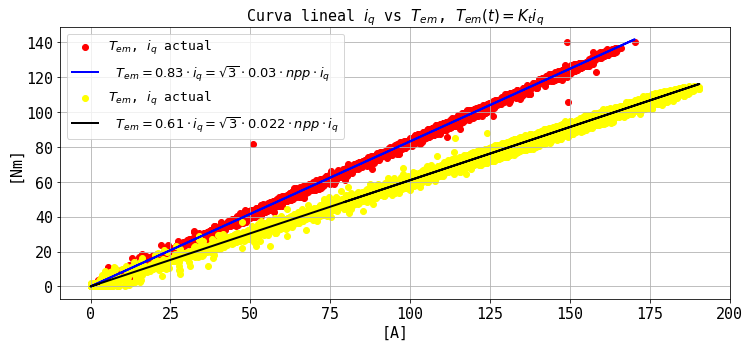

In [ ]:
files1 = 'prueba_carga_nacho_120222_195916.csv'
df1 = pandas.read_csv(files1, sep=',', low_memory=False)
df1 = df1.loc[:, ~df1.columns.str.contains('^Unnamed')]
df1 = df1.loc[:, ~df1.columns.str.contains('Time')]
df1 = df1.loc[:, ~df1.columns.str.contains('0x0082_Supply_critical')]
# df1 = df1[:800]
files2 = 'F_240122_201109.csv'
df2 = pandas.read_csv(files2, sep=',', low_memory=False)
df2 = df2.loc[:, ~df2.columns.str.contains('^Unnamed')]
df2 = df2.loc[:, ~df2.columns.str.contains('Time')]
df2 = df2.loc[:, ~df2.columns.str.contains('0x0082_Supply_critical')]
# df3 = df3[3500:4000]
files3 = 'MARIANA5_140122_200530.csv'
df3 = pandas.read_csv(files3, sep=',', low_memory=False)
df3 = df3.loc[:, ~df3.columns.str.contains('^Unnamed')]
df3 = df3.loc[:, ~df3.columns.str.contains('Time')]
df3 = df3.loc[:, ~df3.columns.str.contains('0x0082_Supply_critical')]
# df3 = df3[3500:4000]
files4 = 'prueba_chasis_6_281121_113423.csv'
df4 = pandas.read_csv(files4, sep=',', low_memory=False)
df4 = df4.loc[:, ~df4.columns.str.contains('^Unnamed')]
df4 = df4.loc[:, ~df4.columns.str.contains('Time')]
df4 = df4.loc[:, ~df4.columns.str.contains('0x0082_Supply_critical')]

files5 = 'frenados_160122_185735.csv'
df5 = pandas.read_csv(files5, sep=',', low_memory=False)
df5 = df5.loc[:, ~df5.columns.str.contains('^Unnamed')]
df5 = df5.loc[:, ~df5.columns.str.contains('Time')]
df5 = df5.loc[:, ~df5.columns.str.contains('0x0082_Supply_critical')]
df3 = df3[0:400]

fig1, (ax2) = plt.subplots(figsize=(12, 5))
ax2.set_title('Curva lineal $i_q$ vs $T_{em}$, $T_{em}(t) = K_{t} i_q$', fontsize=15)
ax2.scatter(np.asarray(abs(df1['1. Iq A (0.0625)'])), np.asarray(abs(df1['1. Torque actual value Nm (0.0625)'])), color='red', linewidth=1, label='$T_{em}$, $i_{q}$ actual')
ax2.plot(np.asarray(abs(df1['1. Iq A (0.0625)'])), 0.029998779296875 * np.sqrt(3) *16 *np.asarray(abs(df1['1. Iq A (0.0625)'])), color='blue', linewidth=2, label=' $T_{em}=0.83\cdot i_{q}=\sqrt{3}\cdot 0.03\cdot npp\cdot i_{q}$')
ax2.set_xlabel('[A]', fontsize=15)
ax2.set_ylabel('[Nm]', color='magenta', fontsize=15)
ax2.legend(loc='best', prop={'size': 13})
ax2.grid(True)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
# ax2.scatter(np.asarray(abs(df2['1. Iq A (0.0625)'])), np.asarray(abs(df2['1. Torque actual value Nm (0.0625)'])), color='blue', linewidth=2, label='$T_{em}$, $i_{q}$ actual')
# ax2.plot(np.asarray(abs(df2['1. Iq A (0.0625)'])), 0.03997802734375 * np.sqrt(3) *16 *np.asarray(abs(df2['1. Iq A (0.0625)'])), color='black', linewidth=3, label=' $K_{t} = 0.04$')
ax2.set_xlabel('[A]', fontsize=15)
ax2.set_ylabel('[Nm]', color='black', fontsize=15)
ax2.legend(loc='best', prop={'size': 13})
ax2.grid(True)
ax2.tick_params(axis='x', labelsize=13)
ax2.tick_params(axis='y', labelsize=13)
# ax2.scatter(np.asarray(abs(df3['1. Iq A (0.0625)'])), np.asarray(abs(df3['1. Torque actual value Nm (0.0625)'])), color='green', linewidth=2, label='Torque actual')
# ax2.plot(np.asarray(abs(df3['1. Iq A (0.0625)'])), 0.02197265625 * np.sqrt(3) *16 *np.asarray(abs(df3['1. Iq A (0.0625)'])), color='black', linewidth=3, label=' $K_{t} = 0.022$')
# ax2.set_xlabel('[A]', fontsize=20)
# ax2.set_ylabel('[Nm]', color='black', fontsize=20)
# ax2.legend(loc='best', prop={'size': 20})
# ax2.grid(True)
# ax2.tick_params(axis='x', labelsize=20)
# ax2.tick_params(axis='y', labelsize=20)
ax2.scatter(np.asarray(abs(df5['1. Iq A (0.0625)'])), np.asarray(abs(df5['1. Torque actual value Nm (0.0625)'])), color='yellow', linewidth=1, label='$T_{em}$, $i_{q}$ actual')
ax2.plot(np.asarray(abs(df5['1. Iq A (0.0625)'])), 0.02197265625 * np.sqrt(3) *16 *np.asarray(abs(df5['1. Iq A (0.0625)'])), color='black', linewidth=2, label=' $T_{em}=0.61\cdot i_{q}=\sqrt{3}\cdot 0.022\cdot npp\cdot i_{q}$')
ax2.set_xlabel('[A]', fontsize=15)
ax2.set_ylabel('[Nm]', color='black', fontsize=15)
ax2.legend(loc='best', prop={'size': 13})
ax2.grid(True)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax2.patch.set_visible(False)
plt.show()

In [ ]:
import matplotlib.transforms as transforms

def Ts1(file):
    df = pandas.read_csv(file, sep=',', low_memory=False)
    # df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
    # df = df.loc[:, ~df.columns.str.contains('^CONTROLLER_CONFIG')]
    time = df['Time (s).1']
    mins = time.loc[time.idxmin()] 
    maxs = time.loc[time.idxmax()] 
    d = np.asarray(time).astype(float)
    # d = np.nan_to_num(d)
    # d = d[d != 0]
    # tf = np.max(d)
    # t0 = np.min(d)
    t = np.linspace(mins, maxs, len(time))
    t = np.linspace(0, maxs-mins, len(time))
    return t

# p1 = 'vizcachas_220122_181647.csv'
p2 = 'vizcachas_220122_182408.csv'
# p3 = 'vizcachas_220122_185404.csv'
p4 = 'vizcachas_220122_192809.csv'
p5 = 'vizcachas_220122_203324.csv'
# p6 = 'vizcachas_220122_213002.csv'
p7 = 'vizcachas_220122_220938.csv'
# tm_p1 = Ts(p1)
# dF1 = lect_var(p1)
tm_p2 = Ts1(p2)
dF2 = lect_var(p2)
# tm_p3 = Ts(p3)
# dF3 = lect_var(p3)
tm_p4 = Ts1(p4)
dF4 = lect_var(p4)
tm_p5 = Ts1(p5)
dF5 = lect_var(p5)
# tm_p6 = Ts(p6)
# dF6 = lect_var(p6)
tm_p7 = Ts1(p7)
dF7 = lect_var(p7)

In [ ]:
# plt.plot(Ts1(p5), bat_I5)
np.max(tm_p2)

385.4648

In [ ]:
t2 = (np.max(tm_p2)- np.min(tm_p2))# / 60
t4 = (np.max(tm_p4)- np.min(tm_p4)) #/ 60
t5 = (np.max(tm_p5)- np.min(tm_p5)) #/ 60
t7 = (np.max(tm_p7)- np.min(tm_p7)) #/ 60

tt7 = np.linspace(0, np.max(tm_p7), len(tm_p7))
tt5 = np.linspace(np.max(tm_p7), np.max(tm_p5), len(tm_p5))
tt2 = np.linspace(np.max(tm_p5), np.max(tm_p2), len(tm_p2))
tt4 = np.linspace(np.max(tm_p2), np.max(tm_p4), len(tm_p4))


# t2 = np.linspace(0, t2, len(tm_p2))
# t4 = np.linspace(0, t2, len(tm_p4))

(t2+t4+t5+t7)/60
print(t5)
print(t7)
print(t2)
print(t4)

705.0439999999999
1685.463
385.4648
1657.6954


In [ ]:
time1 = np.concatenate((tm_p2, tm_p4, tm_p5, tm_p7), axis=0)
# len(time1)
t = np.linspace(np.min(tm_p7), (t2+t4+t5+t7), len(time1))


MemoryError: Unable to allocate 20.8 GiB for an array with shape (105878, 26333) and data type float64

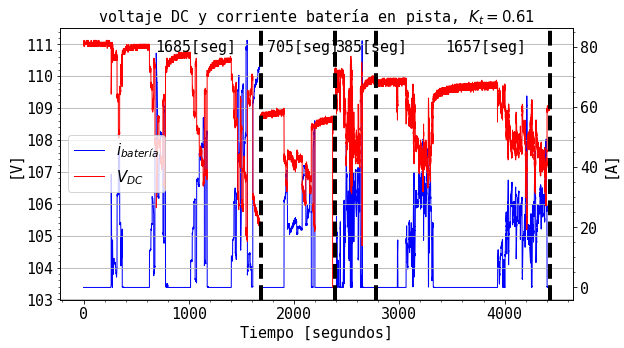

In [ ]:
tt7 = np.linspace(0, np.max(tm_p7), len(tm_p7))
tt5 = np.linspace(np.max(tm_p7), np.max(tm_p7)+np.max(tm_p5), len(tm_p5))
tt2 = np.linspace(np.max(tm_p7)+np.max(tm_p5), np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2), len(tm_p2))
tt4 = np.linspace(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2), np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4), len(tm_p4))
time1 = np.concatenate((tt7, tt5, tt2, tt4), axis=0)
temp2 = np.asarray(dF2['1. Heatsink Temperature DegC (1)'])
temp4 = np.asarray(dF4['1. Heatsink Temperature DegC (1)'])
temp5 = np.asarray(dF5['1. Heatsink Temperature DegC (1)'])
temp7 = np.asarray(dF7['1. Heatsink Temperature DegC (1)'])
Temp = np.concatenate((temp7, temp5, temp2, temp4), axis=0)
bat_I2 = np.asarray(dF2['1. Battery Current A (0.0625)'])
bat_I4 = np.asarray(dF4['1. Battery Current A (0.0625)'])
bat_I5 = np.asarray(dF5['1. Battery Current A (0.0625)'])
bat_I7 = np.asarray(dF7['1. Battery Current A (0.0625)'])
bat_I = np.concatenate((bat_I7, bat_I5, bat_I2, bat_I4), axis=0)
bat_V2 = np.asarray(dF2['1. Battery Voltage V (0.0625)'])
bat_V4 = np.asarray(dF4['1. Battery Voltage V (0.0625)'])
bat_V5 = np.asarray(dF5['1. Battery Voltage V (0.0625)'])
bat_V7 = np.asarray(dF7['1. Battery Voltage V (0.0625)'])
bat_V = np.concatenate((bat_V7, bat_V5, bat_V2, bat_V4), axis=0)
bat_V[bat_V == 0.e+00] = np.mean(bat_V)
bat_V[bat_V < 100] = np.mean(bat_V)
import matplotlib.transforms as transforms
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(15,5))
ax2 = ax1.twinx()
# axes2 = ax1.twiny()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()

# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("voltaje DC y corriente batería en pista, $K_{t} = 0.61$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax2.set_ylabel("[A]", fontsize=15)
ax1.set_ylabel("[V]", fontsize=15)
# ax1.plot(time1[:], Temp[:], color='blue', label="Corriente batería")
# ax1.plot(time1[:], bat_V[:], color='blue', label="Corriente batería")
# ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=2, label="$T^{o}[C]_{inversor}$")
# ax1.plot(time1[:], abs(Temp[:]), color='red',linewidth=2, label="$i_{batería}$")
line1, = ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=1, label='$i_{batería}$')
line2, = ax1.plot(time1[:], bat_V[:], color='red',linewidth=1, label='$V_{DC}$')

ax1.axvline(x=np.max(tm_p7),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
            linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p7)-1000, 0.9, str(int(t7))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)-650, 0.9, str(int(t5))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)-380, 0.9, str(int(t2))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4)-1000, 0.9, str(int(t4))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)




# line2.set_zorder(-1)
ax1.minorticks_on()
# axes2.set_xticks()
# axes2.minorticks_on()
# ax1.tick_params(axis='x', labelsize=12)
# ax1.tick_params(axis='y', labelsize=12)
# lns = [line1, line2]
# ax1.legend(handles=lns, loc='lower left',  prop={'size': 12})
# ax2.grid(axis='x', which='major')
# axes2.set_xlabel("x-axis 2")
# plt.grid(True)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
lns = [line1, line2]
ax1.legend(handles=lns, loc='center left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

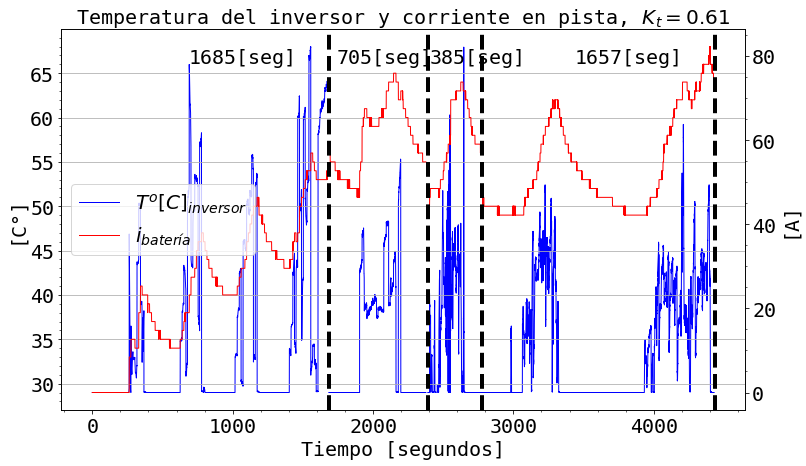

In [ ]:
import matplotlib.transforms as transforms

tt7 = np.linspace(0, np.max(tm_p7), len(tm_p7))
tt5 = np.linspace(np.max(tm_p7), np.max(tm_p7)+np.max(tm_p5), len(tm_p5))
tt2 = np.linspace(np.max(tm_p7)+np.max(tm_p5), np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2), len(tm_p2))
tt4 = np.linspace(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2), np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4), len(tm_p4))
time1 = np.concatenate((tt7, tt5, tt2, tt4), axis=0)

temp2 = np.asarray(dF2['1. Heatsink Temperature DegC (1)'])
temp4 = np.asarray(dF4['1. Heatsink Temperature DegC (1)'])
temp5 = np.asarray(dF5['1. Heatsink Temperature DegC (1)'])
temp7 = np.asarray(dF7['1. Heatsink Temperature DegC (1)'])
Temp = np.concatenate((temp7, temp5, temp2, temp4), axis=0)

bat_I2 = np.asarray(dF2['1. Battery Current A (0.0625)'])
bat_I4 = np.asarray(dF4['1. Battery Current A (0.0625)'])
bat_I5 = np.asarray(dF5['1. Battery Current A (0.0625)'])
bat_I7 = np.asarray(dF7['1. Battery Current A (0.0625)'])
bat_I = np.concatenate((bat_I7, bat_I5, bat_I2, bat_I4), axis=0)

bat_V2 = np.asarray(dF2['1. Battery Voltage V (0.0625)'])
bat_V4 = np.asarray(dF4['1. Battery Voltage V (0.0625)'])
bat_V5 = np.asarray(dF5['1. Battery Voltage V (0.0625)'])
bat_V7 = np.asarray(dF7['1. Battery Voltage V (0.0625)'])
bat_V = np.concatenate((bat_V7, bat_V5, bat_V2, bat_V4), axis=0)

bat_V[bat_V == 0.e+00] = np.mean(bat_V)
bat_V[bat_V < 100] = np.mean(bat_V)


plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(20,7))
ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()
# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("Temperatura del inversor y corriente en pista, $K_{t} = 0.61$", fontsize=20)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=20)
ax1.set_ylabel("[C°]", fontsize=20)
ax2.set_ylabel("[A]", fontsize=20)
line1, = ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=1, label="$T^{o}[C]_{inversor}$")
line2, = ax1.plot(time1[:], abs(Temp[:]), color='red',linewidth=1, label="$i_{batería}$")
ax1.axvline(x=np.max(tm_p7),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
            linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p7)-1000, 0.9, str(int(t7))+'[seg]',size=20,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)-650, 0.9, str(int(t5))+'[seg]',size=20,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)-375, 0.9, str(int(t2))+'[seg]',size=20,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4)-1000, 0.9, str(int(t4))+'[seg]',size=20,color="black", verticalalignment='bottom', transform=trans)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=20)
ax1.tick_params(axis='y', labelsize=20)
ax2.tick_params(axis='x', labelsize=20)
ax2.tick_params(axis='y', labelsize=20)
lns = [line1, line2]
ax1.legend(handles=lns, loc='center left',  prop={'size': 20})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

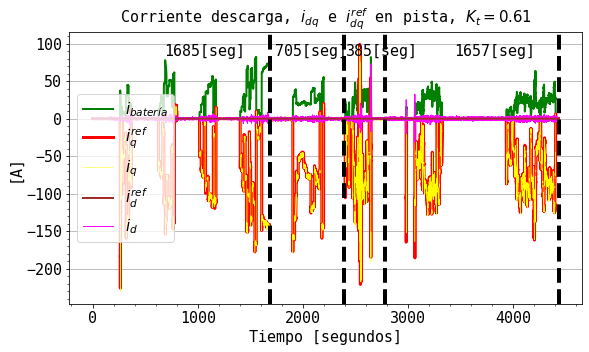

In [ ]:
import matplotlib.transforms as transforms

tt7 = np.linspace(0, np.max(tm_p7), len(tm_p7))
tt5 = np.linspace(np.max(tm_p7), np.max(tm_p7)+np.max(tm_p5), len(tm_p5))
tt2 = np.linspace(np.max(tm_p7)+np.max(tm_p5), np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2), len(tm_p2))
tt4 = np.linspace(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2), np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4), len(tm_p4))
time1 = np.concatenate((tt7, tt5, tt2, tt4), axis=0)

# iq2 = np.asarray(dF2['1. Iq A (0.0625)'])
# iq4 = np.asarray(dF4['1. Iq A (0.0625)'])
# iq5 = np.asarray(dF5['1. Iq A (0.0625)'])
# iq7 = np.asarray(dF7['1. Iq A (0.0625)'])
# Iq = np.concatenate((iq7, iq5, iq2, iq4), axis=0)

iq2 = np.asarray(butter_lowpass_filter(dF2['1. Iq A (0.0625)'], 3, 14, 3))
iq4 = np.asarray(butter_lowpass_filter(dF4['1. Iq A (0.0625)'], 3, 14, 3))
iq5 = np.asarray(butter_lowpass_filter(dF5['1. Iq A (0.0625)'], 3, 14, 3))
iq7 = np.asarray(butter_lowpass_filter(dF7['1. Iq A (0.0625)'], 3, 14, 3))
Iq = np.concatenate((iq7, iq5, iq2, iq4), axis=0)

# tiq2 = np.asarray(dF2['1. Target Iq A (0.0625)'])
# tiq4 = np.asarray(dF4['1. Target Iq A (0.0625)'])
# tiq5 = np.asarray(dF5['1. Target Iq A (0.0625)'])
# tiq7 = np.asarray(dF7['1. Target Iq A (0.0625)'])
# tiq = np.concatenate((tiq7, tiq5, tiq2, tiq4), axis=0)


tiq2 = np.asarray(butter_lowpass_filter(dF2['1. Target Iq A (0.0625)'], 3, 14, 3))
tiq4 = np.asarray(butter_lowpass_filter(dF4['1. Target Iq A (0.0625)'], 3, 14, 3))
tiq5 = np.asarray(butter_lowpass_filter(dF5['1. Target Iq A (0.0625)'], 3, 14, 3))
tiq7 = np.asarray(butter_lowpass_filter(dF7['1. Target Iq A (0.0625)'], 3, 14, 3))
tiq = np.concatenate((tiq7, tiq5, tiq2, tiq4), axis=0)



id2 = np.asarray(butter_lowpass_filter(dF2['1. Id A (0.0625)'], 3, 14, 3))
id4 = np.asarray(butter_lowpass_filter(dF4['1. Id A (0.0625)'], 3, 14, 3))
id5 = np.asarray(butter_lowpass_filter(dF5['1. Id A (0.0625)'], 3, 14, 3))
id7 = np.asarray(butter_lowpass_filter(dF7['1. Id A (0.0625)'], 3, 14, 3))
# id2 = np.asarray(dF2['1. Id A (0.0625)'])
# id4 = np.asarray(dF4['1. Id A (0.0625)'])
# id5 = np.asarray(dF5['1. Id A (0.0625)'])
# id7 = np.asarray(dF7['1. Id A (0.0625)'])
id = np.concatenate((id7, id5, id2, id4), axis=0)

bat_I2 = np.asarray(dF2['1. Battery Current A (0.0625)'])
bat_I4 = np.asarray(dF4['1. Battery Current A (0.0625)'])
bat_I5 = np.asarray(dF5['1. Battery Current A (0.0625)'])
bat_I7 = np.asarray(dF7['1. Battery Current A (0.0625)'])
bat_I = np.concatenate((bat_I7, bat_I5, bat_I2, bat_I4), axis=0)

plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(15,5))
# ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()
# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("Corriente descarga, $i_{dq}$ e $i^{ref}_{dq}$ en pista, $K_{t} = 0.61$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
ax1.set_ylabel("[A]", fontsize=15)
# line1, = ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=1, label="$T^{o}[C]_{inversor}$")
# line2, = ax1.plot(time1[:], abs(Temp[:]), color='red',linewidth=1, label="$i_{batería}$")
line2, = ax1.plot(time1, bat_I, linewidth=2, color='green', label="$i_{batería}$")
line4, = ax1.plot(time1,(tiq) ,linewidth=3, color='red', label="$i^{ref}_{q}$")
line3, = ax1.plot(time1, (Iq), color='yellow',linewidth=0.5, label="$i_{q}$")
line7, = ax1.plot(time1, id,linewidth=1, color='magenta', label="$i_{d}$")
line1, = ax1.plot(time1, np.zeros(len(time1)),linewidth=2, color='brown', label="$i^{ref}_{d}$")

ax1.axvline(x=np.max(tm_p7),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
            linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p7)-1000, 0.9, str(int(t7))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)-660, 0.9, str(int(t5))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)-370, 0.9, str(int(t2))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4)-1000, 0.9, str(int(t4))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.minorticks_on()
# ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line2, line4, line3, line1, line7]
ax1.legend(handles=lns, loc='center left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
# ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

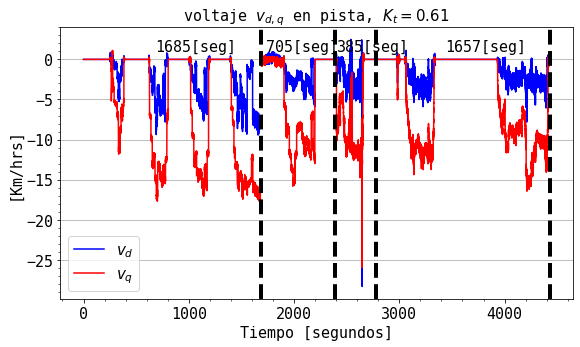

In [ ]:
import matplotlib.transforms as transforms

tt7 = np.linspace(0, np.max(tm_p7), len(tm_p7))
tt5 = np.linspace(np.max(tm_p7), np.max(tm_p7)+np.max(tm_p5), len(tm_p5))
tt2 = np.linspace(np.max(tm_p7)+np.max(tm_p5), np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2), len(tm_p2))
tt4 = np.linspace(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2), np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4), len(tm_p4))
time1 = np.concatenate((tt7, tt5, tt2, tt4), axis=0)


ud2 = np.asarray(dF2['1. Ud V (0.0625)'])
ud4 = np.asarray(dF4['1. Ud V (0.0625)'])
ud5 = np.asarray(dF5['1. Ud V (0.0625)'])
ud7 = np.asarray(dF7['1. Ud V (0.0625)'])
ud = np.concatenate((ud7, ud5,ud2, ud4), axis=0)

uq2 = np.asarray(dF2['1. Uq V (0.0625)'])
uq4 = np.asarray(dF4['1. Uq V (0.0625)'])
uq5 = np.asarray(dF5['1. Uq V (0.0625)'])
uq7 = np.asarray(dF7['1. Uq V (0.0625)'])
uq = np.concatenate((uq7, uq5,uq2, uq4), axis=0)

# ['1. Uq V (0.0625)']

# uq2 = np.asarray(dF2['1. Uq V (0.0625)'])
# uq4 = np.asarray(dF4['1. Uq V (0.0625)'])
# uq5 = np.asarray(dF5['1. Uq V (0.0625)'])
# uq7 = np.asarray(dF7['1. Uq V (0.0625)'])
# uq = np.concatenate((uq7, uq5,uq2, uq4), axis=0)

plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(15,5))
# ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()
# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
# con límite de potencia
ax1.set_title("voltaje $v_{d,q}$ en pista, $K_{t} = 0.61$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[Km/hrs]", fontsize=15)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
# ax1.set_ylabel("[V]", fontsize=12)
line1, = ax1.plot(time1[:], ud, color='blue', label="$v_{d}$")
line2, = ax1.plot(time1[:], uq, color='red', label="$v_{q}$")

# line1, = ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=1, label="$T^{o}[C]_{inversor}$")
# line2, = ax1.plot(time1[:], abs(Temp[:]), color='red',linewidth=1, label="$i_{batería}$")
# line2, = ax1.plot(time1, uq, color='red', label="$v_{q}$")
# line3, = ax1.plot(time1, ud, color='blue', label="$v_{d}$")
ax1.axvline(x=np.max(tm_p7),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
            linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p7)-1000, 0.9, str(int(t7))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)-660, 0.9, str(int(t5))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)-370, 0.9, str(int(t2))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4)-1000, 0.9, str(int(t4))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.minorticks_on()
# ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line1, line2]
ax1.legend(handles=lns, loc='best',  prop={'size': 15})
ax1.grid(axis='y', which='major')
# ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

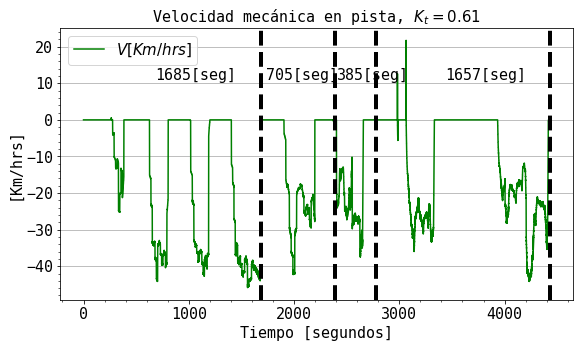

In [ ]:




import matplotlib.transforms as transforms

tt7 = np.linspace(0, np.max(tm_p7), len(tm_p7))
tt5 = np.linspace(np.max(tm_p7), np.max(tm_p7)+np.max(tm_p5), len(tm_p5))
tt2 = np.linspace(np.max(tm_p7)+np.max(tm_p5), np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2), len(tm_p2))
tt4 = np.linspace(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2), np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4), len(tm_p4))
time1 = np.concatenate((tt7, tt5, tt2, tt4), axis=0)



v2 = np.asarray(dF2['1. Velocity RPM (1)'])
v4 = np.asarray(dF4['1. Velocity RPM (1)'])
v5 = np.asarray(dF5['1. Velocity RPM (1)'])
v7 = np.asarray(dF7['1. Velocity RPM (1)'])
v = np.concatenate((v7, v5,v2, v4), axis=0)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(15,5))
# ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()
# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("Velocidad mecánica en pista, $K_{t} = 0.61$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[Km/hrs]", fontsize=15)
ax1.set_ylabel("[Km/hrs]", fontsize=15)
# ax1.set_ylabel("[V]", fontsize=12)
line1, = ax1.plot(time1[:], (Rpm2KmHrs(v)), color='green', label="$V[Km/hrs]$")
# line1, = ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=1, label="$T^{o}[C]_{inversor}$")
# line2, = ax1.plot(time1[:], abs(Temp[:]), color='red',linewidth=1, label="$i_{batería}$")
# line2, = ax1.plot(time1, uq, color='red', label="$v_{q}$")
# line3, = ax1.plot(time1, ud, color='blue', label="$v_{d}$")
ax1.axvline(x=np.max(tm_p7),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
            linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p7)-1000, 0.8, str(int(t7))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)-655, 0.8, str(int(t5))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)-370, 0.8, str(int(t2))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4)-1000, 0.8, str(int(t4))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.minorticks_on()
# ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line1]
ax1.legend(handles=lns, loc='best',  prop={'size': 15})
ax1.grid(axis='y', which='major')
# ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

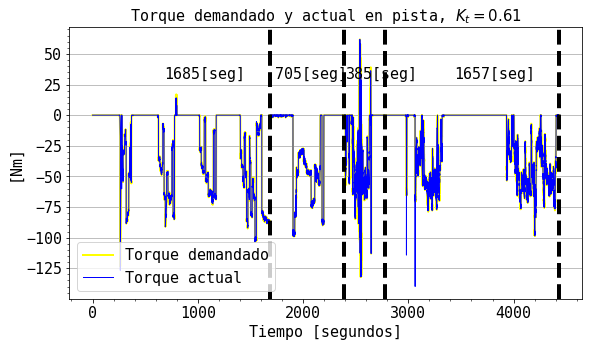

In [ ]:
import matplotlib.transforms as transforms

tt7 = np.linspace(0, np.max(tm_p7), len(tm_p7))
tt5 = np.linspace(np.max(tm_p7), np.max(tm_p7)+np.max(tm_p5), len(tm_p5))
tt2 = np.linspace(np.max(tm_p7)+np.max(tm_p5), np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2), len(tm_p2))
tt4 = np.linspace(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2), np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4), len(tm_p4))
time1 = np.concatenate((tt7, tt5, tt2, tt4), axis=0)




# ['1. Uq V (0.0625)']
tdem2 = np.asarray(dF2['1. Torque demand value Nm (0.0625)'])
tdem4 = np.asarray(dF4['1. Torque demand value Nm (0.0625)'])
tdem5 = np.asarray(dF5['1. Torque demand value Nm (0.0625)'])
tdem7 = np.asarray(dF7['1. Torque demand value Nm (0.0625)'])
tdem = np.concatenate((tdem7, tdem5, tdem2, tdem4), axis=0)
tem2 = np.asarray(dF2['1. Torque actual value Nm (0.0625)'])
tem4 = np.asarray(dF4['1. Torque actual value Nm (0.0625)'])
tem5 = np.asarray(dF5['1. Torque actual value Nm (0.0625)'])
tem7 = np.asarray(dF7['1. Torque actual value Nm (0.0625)'])
tem = np.concatenate((tem7, tem5, tem2, tem4), axis=0)

plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(15,5))
# ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()
# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("Torque demandado y actual en pista, $K_{t} = 0.61$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[Nm]", fontsize=15)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
# ax1.set_ylabel("[V]", fontsize=12)
# line1, = ax1.plot(time1[:], (Rpm2KmHrs(v)), color='green', label="$V[Km/hrs]$")
# line1, = ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=1, label="$T^{o}[C]_{inversor}$")
# line2, = ax1.plot(time1[:], abs(Temp[:]), color='red',linewidth=1, label="$i_{batería}$")
# line2, = ax1.plot(time1, uq, color='red', label="$v_{q}$")
# line3, = ax1.plot(time1, ud, color='blue', label="$v_{d}$")

line4, = ax1.plot(time1, tdem, color='yellow',linewidth=2,  label="Torque demandado")
line5, = ax1.plot(time1, tem, color='blue',linewidth=1,  label="Torque actual")


ax1.axvline(x=np.max(tm_p7),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
            linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p7)-1000, 0.8, str(int(t7))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)-660, 0.8, str(int(t5))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)-370, 0.8, str(int(t2))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4)-1000, 0.8, str(int(t4))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.minorticks_on()
# ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line4,line5]
ax1.legend(handles=lns, loc='lower left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
# ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

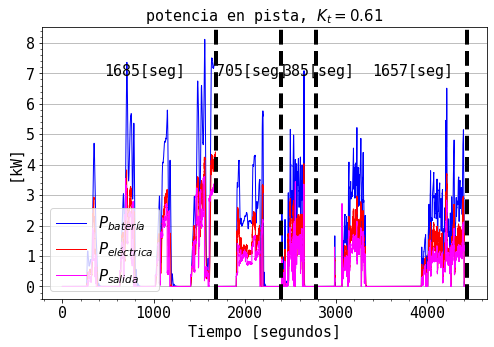

In [ ]:
import matplotlib.transforms as transforms

tt7 = np.linspace(0, np.max(tm_p7), len(tm_p7))
tt5 = np.linspace(np.max(tm_p7), np.max(tm_p7)+np.max(tm_p5), len(tm_p5))
tt2 = np.linspace(np.max(tm_p7)+np.max(tm_p5), np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2), len(tm_p2))
tt4 = np.linspace(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2), np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4), len(tm_p4))
time1 = np.concatenate((tt7, tt5, tt2, tt4), axis=0)




tem2 = np.asarray(dF2['1. Torque actual value Nm (0.0625)'])
tem4 = np.asarray(dF4['1. Torque actual value Nm (0.0625)'])
tem5 = np.asarray(dF5['1. Torque actual value Nm (0.0625)'])
tem7 = np.asarray(dF7['1. Torque actual value Nm (0.0625)'])
tem = np.concatenate((tem7, tem5, tem2, tem4), axis=0)
v2 = np.asarray(dF2['1. Velocity RPM (1)'])
v4 = np.asarray(dF4['1. Velocity RPM (1)'])
v5 = np.asarray(dF5['1. Velocity RPM (1)'])
v7 = np.asarray(dF7['1. Velocity RPM (1)'])
v = np.concatenate((v7, v5,v2, v4), axis=0)


ud2 = np.asarray(dF2['1. Ud V (0.0625)'])
ud4 = np.asarray(dF4['1. Ud V (0.0625)'])
ud5 = np.asarray(dF5['1. Ud V (0.0625)'])
ud7 = np.asarray(dF7['1. Ud V (0.0625)'])
ud = np.concatenate((ud7, ud5,ud2, ud4), axis=0)

uq2 = np.asarray(dF2['1. Uq V (0.0625)'])
uq4 = np.asarray(dF4['1. Uq V (0.0625)'])
uq5 = np.asarray(dF5['1. Uq V (0.0625)'])
uq7 = np.asarray(dF7['1. Uq V (0.0625)'])
uq = np.concatenate((uq7, uq5,uq2, uq4), axis=0)

iq2 = np.asarray(butter_lowpass_filter(dF2['1. Iq A (0.0625)'], 3, 524, 3))
iq4 = np.asarray(butter_lowpass_filter(dF4['1. Iq A (0.0625)'], 3, 524, 3))
iq5 = np.asarray(butter_lowpass_filter(dF5['1. Iq A (0.0625)'], 3, 524, 3))
iq7 = np.asarray(butter_lowpass_filter(dF7['1. Iq A (0.0625)'], 3, 524, 3))
Iq = np.concatenate((iq7, iq5, iq2, iq4), axis=0)


id2 = np.asarray(butter_lowpass_filter(dF2['1. Id A (0.0625)'], 3, 524, 3))
id4 = np.asarray(butter_lowpass_filter(dF4['1. Id A (0.0625)'], 3, 524, 3))
id5 = np.asarray(butter_lowpass_filter(dF5['1. Id A (0.0625)'], 3, 524, 3))
id7 = np.asarray(butter_lowpass_filter(dF7['1. Id A (0.0625)'], 3, 524, 3))
# id2 = np.asarray(dF2['1. Id A (0.0625)'])
# id4 = np.asarray(dF4['1. Id A (0.0625)'])
# id5 = np.asarray(dF5['1. Id A (0.0625)'])
# id7 = np.asarray(dF7['1. Id A (0.0625)'])
id = np.concatenate((id7, id5, id2, id4), axis=0)

bat_I2 =  np.asarray(butter_lowpass_filter(dF2['1. Battery Current A (0.0625)'], 3, 524, 3))
bat_I4 =  np.asarray(butter_lowpass_filter(dF4['1. Battery Current A (0.0625)'], 3, 524, 3))
bat_I5 =  np.asarray(butter_lowpass_filter(dF5['1. Battery Current A (0.0625)'], 3, 524, 3))
bat_I7 =  np.asarray(butter_lowpass_filter(dF7['1. Battery Current A (0.0625)'], 3, 524, 3))
bat_I = np.concatenate((bat_I7, bat_I5, bat_I2, bat_I4), axis=0)

# bat_I2 =  np.asarray(dF2['1. Battery Current A (0.0625)'])
# bat_I4 = np.asarray(dF4['1. Battery Current A (0.0625)'])
# bat_I5 = np.asarray(dF5['1. Battery Current A (0.0625)'])
# bat_I7 = np.asarray(dF7['1. Battery Current A (0.0625)'])
# bat_I = np.concatenate((bat_I7, bat_I5, bat_I2, bat_I4), axis=0)
bat_V2 = np.asarray(dF2['1. Battery Voltage V (0.0625)'])
bat_V4 = np.asarray(dF4['1. Battery Voltage V (0.0625)'])
bat_V5 = np.asarray(dF5['1. Battery Voltage V (0.0625)'])
bat_V7 = np.asarray(dF7['1. Battery Voltage V (0.0625)'])
bat_V = np.concatenate((bat_V7, bat_V5, bat_V2, bat_V4), axis=0)

BatV = bat_V
BatI = bat_I
Iq = Iq
Uq = uq
Id = id
Ud = ud
Te = (tem)
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad(v)


pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
pot_salida = Te * rad 
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)

DD = np.asarray(pot_salida) / np.asarray(pin)

# DD = abs(pot / pin)
DD[DD > 0.99999999999999] = np.mean(DD)
DD[DD == 0.e+00] = np.mean(DD)
DD[DD == 0] = np.mean(DD)
DD[DD == np.inf] = np.mean(DD)
DD = np.nan_to_num(DD)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(13,5))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax2 = ax1.twinx()


# line2, = ax2.plot(tm_p, (butter_lowpass_filter(100*D[:], 3, 124, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (butter_lowpass_filter((pin/1000), 3, 124, 3)),linewidth=1, color='blue', label="$P_{batería}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 124, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")

# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(0, 100)}
# ax1.set_ylim(0, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("potencia en pista, $K_{t} = 0.61$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[kW]", fontsize=15)
# ax1.set_ylabel("[%]", fontsize=13)
# line4, = ax1.plot(time1, abs((100*D[:])),linewidth=0.9, color='green', label="$\eta_{batería-inversor}$")
# line2, = ax1.plot(time1, abs((100*DD[:])),linewidth=0.9, color='brown', label="$\eta_{batería-motor}$")

line4, = ax1.plot(time1, abs(pin/1000),linewidth=1, color='blue', label="$P_{batería}$")
line3, = ax1.plot(time1, abs(pot/1000),linewidth=1, color='red', label="$P_{eléctrica}$")
line5, = ax1.plot(time1, abs(pot_salida/1000),linewidth=1, color='magenta', label="$P_{salida}$")



ax1.axvline(x=np.max(tm_p7),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
            linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p7)-2200, 0.82, str(int(t7))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)-1840, 0.82, str(int(t5))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)-1590, 0.82, str(int(t2))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4)-2400, 0.82, str(int(t4))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.minorticks_on()
# ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line4,line3,line5]
ax1.legend(handles=lns, loc='lower left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
# ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

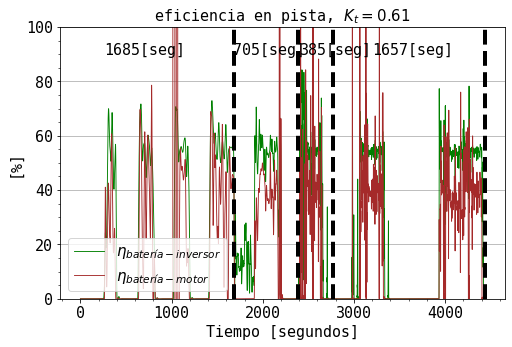

In [ ]:
import matplotlib.transforms as transforms

tt7 = np.linspace(0, np.max(tm_p7), len(tm_p7))
tt5 = np.linspace(np.max(tm_p7), np.max(tm_p7)+np.max(tm_p5), len(tm_p5))
tt2 = np.linspace(np.max(tm_p7)+np.max(tm_p5), np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2), len(tm_p2))
tt4 = np.linspace(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2), np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4), len(tm_p4))
time1 = np.concatenate((tt7, tt5, tt2, tt4), axis=0)




tem2 = np.asarray(dF2['1. Torque actual value Nm (0.0625)'])
tem4 = np.asarray(dF4['1. Torque actual value Nm (0.0625)'])
tem5 = np.asarray(dF5['1. Torque actual value Nm (0.0625)'])
tem7 = np.asarray(dF7['1. Torque actual value Nm (0.0625)'])
tem = np.concatenate((tem7, tem5, tem2, tem4), axis=0)
v2 = np.asarray(dF2['1. Velocity RPM (1)'])
v4 = np.asarray(dF4['1. Velocity RPM (1)'])
v5 = np.asarray(dF5['1. Velocity RPM (1)'])
v7 = np.asarray(dF7['1. Velocity RPM (1)'])
v = np.concatenate((v7, v5,v2, v4), axis=0)


ud2 = np.asarray(dF2['1. Ud V (0.0625)'])
ud4 = np.asarray(dF4['1. Ud V (0.0625)'])
ud5 = np.asarray(dF5['1. Ud V (0.0625)'])
ud7 = np.asarray(dF7['1. Ud V (0.0625)'])
ud = np.concatenate((ud7, ud5,ud2, ud4), axis=0)

uq2 = np.asarray(dF2['1. Uq V (0.0625)'])
uq4 = np.asarray(dF4['1. Uq V (0.0625)'])
uq5 = np.asarray(dF5['1. Uq V (0.0625)'])
uq7 = np.asarray(dF7['1. Uq V (0.0625)'])
uq = np.concatenate((uq7, uq5,uq2, uq4), axis=0)

iq2 = np.asarray(butter_lowpass_filter(dF2['1. Iq A (0.0625)'], 3, 524, 3))
iq4 = np.asarray(butter_lowpass_filter(dF4['1. Iq A (0.0625)'], 3, 524, 3))
iq5 = np.asarray(butter_lowpass_filter(dF5['1. Iq A (0.0625)'], 3, 524, 3))
iq7 = np.asarray(butter_lowpass_filter(dF7['1. Iq A (0.0625)'], 3, 524, 3))
Iq = np.concatenate((iq7, iq5, iq2, iq4), axis=0)


id2 = np.asarray(butter_lowpass_filter(dF2['1. Id A (0.0625)'], 3, 524, 3))
id4 = np.asarray(butter_lowpass_filter(dF4['1. Id A (0.0625)'], 3, 524, 3))
id5 = np.asarray(butter_lowpass_filter(dF5['1. Id A (0.0625)'], 3, 524, 3))
id7 = np.asarray(butter_lowpass_filter(dF7['1. Id A (0.0625)'], 3, 524, 3))
# id2 = np.asarray(dF2['1. Id A (0.0625)'])
# id4 = np.asarray(dF4['1. Id A (0.0625)'])
# id5 = np.asarray(dF5['1. Id A (0.0625)'])
# id7 = np.asarray(dF7['1. Id A (0.0625)'])
id = np.concatenate((id7, id5, id2, id4), axis=0)

bat_I2 =  np.asarray(butter_lowpass_filter(dF2['1. Battery Current A (0.0625)'], 3, 524, 3))
bat_I4 =  np.asarray(butter_lowpass_filter(dF4['1. Battery Current A (0.0625)'], 3, 524, 3))
bat_I5 =  np.asarray(butter_lowpass_filter(dF5['1. Battery Current A (0.0625)'], 3, 524, 3))
bat_I7 =  np.asarray(butter_lowpass_filter(dF7['1. Battery Current A (0.0625)'], 3, 524, 3))
bat_I = np.concatenate((bat_I7, bat_I5, bat_I2, bat_I4), axis=0)

# bat_I2 =  np.asarray(dF2['1. Battery Current A (0.0625)'])
# bat_I4 = np.asarray(dF4['1. Battery Current A (0.0625)'])
# bat_I5 = np.asarray(dF5['1. Battery Current A (0.0625)'])
# bat_I7 = np.asarray(dF7['1. Battery Current A (0.0625)'])
# bat_I = np.concatenate((bat_I7, bat_I5, bat_I2, bat_I4), axis=0)
bat_V2 = np.asarray(dF2['1. Battery Voltage V (0.0625)'])
bat_V4 = np.asarray(dF4['1. Battery Voltage V (0.0625)'])
bat_V5 = np.asarray(dF5['1. Battery Voltage V (0.0625)'])
bat_V7 = np.asarray(dF7['1. Battery Voltage V (0.0625)'])
bat_V = np.concatenate((bat_V7, bat_V5, bat_V2, bat_V4), axis=0)

BatV = bat_V
BatI = bat_I
Iq = Iq
Uq = uq
Id = id
Ud = ud
Te = (tem)
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad(v)


pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
pot_salida = Te * rad 
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)

DD = np.asarray(pot_salida) / np.asarray(pin)

# DD = abs(pot / pin)
DD[DD > 0.99999999999999] = np.mean(DD)
DD[DD == 0.e+00] = np.mean(DD)
DD[DD == 0] = np.mean(DD)
DD[DD == np.inf] = np.mean(DD)
DD = np.nan_to_num(DD)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(13,5))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax2 = ax1.twinx()

# line2, = ax2.plot(tm_p, (butter_lowpass_filter(100*D[:], 3, 124, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (butter_lowpass_filter((pin/1000), 3, 124, 3)),linewidth=1, color='blue', label="$P_{batería}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 124, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")

# ax4.spines["right"].set_position(("axes", 1.2))
ax1.set_ylim(0, 100)
# ax1.set_ylim(0, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("eficiencia en pista, $K_{t} = 0.61$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
# ax1.set_ylabel("[kW]", fontsize=13)
ax1.set_ylabel("[%]", fontsize=15)



line4, = ax1.plot(time1, butter_lowpass_filter(abs((100*D[:])), 3, 424, 3),linewidth=0.9, color='green', label="$\eta_{batería-inversor}$")
line2, = ax1.plot(time1, butter_lowpass_filter(abs((100*DD[:])), 3, 424, 3),linewidth=0.9, color='brown', label="$\eta_{batería-motor}$")

# line4, = ax1.plot(time1, ,linewidth=0.9, color='green', label="$\eta_{batería-inversor}$")
# line2, = ax1.plot(time1, ,linewidth=0.9, color='brown', label="$\eta_{batería-motor}$")

# line4, = ax1.plot(time1, abs(pin/1000),linewidth=1, color='blue', label="$P_{batería}$")
# line3, = ax1.plot(time1, abs(pot/1000),linewidth=1, color='red', label="$P_{eléctrica}$")
# line5, = ax1.plot(time1, abs(pot_salida/1000),linewidth=1, color='magenta', label="$P_{salida}$")



ax1.axvline(x=np.max(tm_p7),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
            linewidth = 4, linestyle ="--", color="black")
ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
            linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p7)-2200, 0.9, str(int(t7))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)-1680, 0.9, str(int(t5))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)-1430, 0.9, str(int(t2))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4)-2400,0.9, str(int(t4))+'[seg]',size=15,color="black", verticalalignment='bottom', transform=trans)
ax1.minorticks_on()
# ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line4,line2]
ax1.legend(handles=lns, loc='lower left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
# ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

In [ ]:

# ax2.set_ylabel("[V]", fontsize=10)
# ax1.set_ylim(-6, 22)
# ax2.set_ylim(-6, 30)


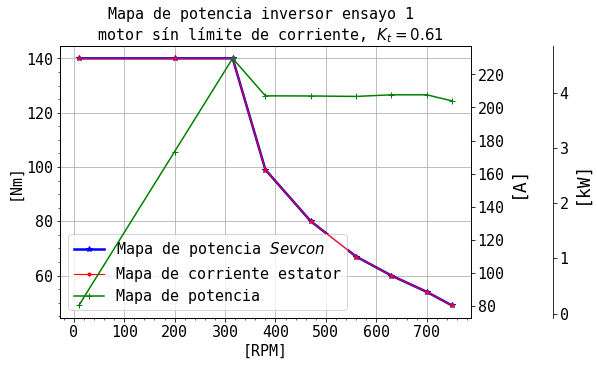

In [ ]:
# 0x4611,0: 0x12
# 0x4611,1: Pt 1 Max Torque: 140.0Nm (0x08c0)
# 0x4611,2: Pt 1 Speed: 10RPM (0x000a)
# 0x4611,3: Pt 2 Max Torque: 140.0Nm (0x08c0)
# 0x4611,4: Pt 2 Speed: 200RPM (0x00c8)
# 0x4611,5: Pt 3 Max Torque: 140.0Nm (0x08c0)
# 0x4611,6: Pt 3 Speed: 315RPM (0x013b)
# 0x4611,7: Pt 4 Max Torque: 99.0Nm (0x0630)
# 0x4611,8: Pt 4 Speed: 380RPM (0x017c)
# 0x4611,9: Pt 5 Max Torque: 80.0Nm (0x0500)
# 0x4611,10: Pt 5 Speed: 470RPM (0x01d6)
# 0x4611,11: Pt 6 Max Torque: 67.0Nm (0x0430)
# 0x4611,12: Pt 6 Speed: 560RPM (0x0230)
# 0x4611,13: Pt 7 Max Torque: 60.0Nm (0x03c0)
# 0x4611,14: Pt 7 Speed: 630RPM (0x0276)
# 0x4611,15: Pt 8 Max Torque: 54.0Nm (0x0360)
# 0x4611,16: Pt 8 Speed: 700RPM (0x02bc)
# 0x4611,17: Pt 9 Max Torque: 49.0Nm (0x0310)
# 0x4611,18: Pt 9 Speed: 750RPM (0x02ee)

# d_REVERSA = 'prueba_carga_pancho_130222_173408.csv'
# # p = 

# tm = Ts(d_REVERSA)#[7500:]   #[4000:8000]#[5600:9700]
# dF_REVERSA = lect_var(d_REVERSA)#[7500:]   #[4000:8000]#[5600:9700]
T_MAP = [140.0, 140.0, 140.0, 99.0, 80.0, 67.0, 60.0, 54.0, 49.0]
RPM_MAP = [10.0, 200, 315, 380, 470, 560, 630, 700, 750]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
ax3 = ax1.twinx()

fig.subplots_adjust(right=0.6)
ax3.spines["right"].set_position(("axes", 1.2))
ax1.set_title("Mapa de potencia inversor ensayo 1 \n motor sín límite de corriente, $K_{t} = 0.61$", fontsize=15)    
ax1.set_xlabel("[RPM]", fontsize=15)
ax1.set_ylabel("[Nm]", fontsize=15)
ax2.set_ylabel("[A]", fontsize=18)
ax3.set_ylabel("[kW]", fontsize=18)

line2, = ax1.plot(RPM_MAP, np.asarray(T_MAP), linewidth=2.5,color='blue', marker = '*', label="Mapa de potencia $Sevcon$")
line4, = ax2.plot(RPM_MAP, np.asarray(T_MAP) / 0.6096541714513237, linewidth=1.1,color='red', marker = '.', label="Mapa de corriente estator")
line1, = ax3.plot(RPM_MAP, (np.asarray(T_MAP) * abs(rpm2rad(np.asarray(RPM_MAP))))/1000, color='green', marker = '+', label="Mapa de potencia")
# line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
ax3.tick_params(axis='y', labelsize=15)

lns = [line2, line4, line1]
ax1.legend(handles=lns, loc='lower left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.patch.set_visible(False)

plt.show()

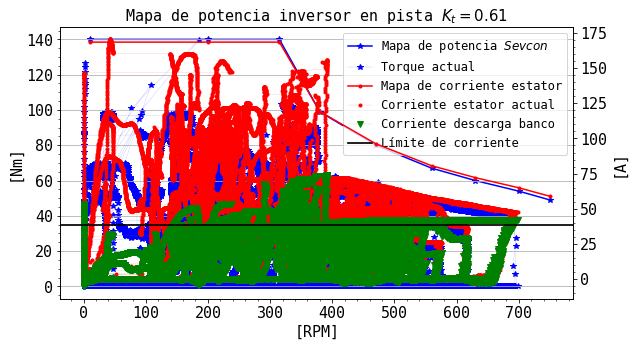

In [ ]:
# 0x4611,0: 0x12
# 0x4611,1: Pt 1 Max Torque: 140.0Nm (0x08c0)
# 0x4611,2: Pt 1 Speed: 10RPM (0x000a)
# 0x4611,3: Pt 2 Max Torque: 140.0Nm (0x08c0)
# 0x4611,4: Pt 2 Speed: 200RPM (0x00c8)
# 0x4611,5: Pt 3 Max Torque: 140.0Nm (0x08c0)
# 0x4611,6: Pt 3 Speed: 315RPM (0x013b)
# 0x4611,7: Pt 4 Max Torque: 99.0Nm (0x0630)
# 0x4611,8: Pt 4 Speed: 380RPM (0x017c)
# 0x4611,9: Pt 5 Max Torque: 80.0Nm (0x0500)
# 0x4611,10: Pt 5 Speed: 470RPM (0x01d6)
# 0x4611,11: Pt 6 Max Torque: 67.0Nm (0x0430)
# 0x4611,12: Pt 6 Speed: 560RPM (0x0230)
# 0x4611,13: Pt 7 Max Torque: 60.0Nm (0x03c0)
# 0x4611,14: Pt 7 Speed: 630RPM (0x0276)
# 0x4611,15: Pt 8 Max Torque: 54.0Nm (0x0360)
# 0x4611,16: Pt 8 Speed: 700RPM (0x02bc)
# 0x4611,17: Pt 9 Max Torque: 49.0Nm (0x0310)
# 0x4611,18: Pt 9 Speed: 750RPM (0x02ee)
iq2 = np.asarray(butter_lowpass_filter(dF2['1. Iq A (0.0625)'], 3, 524, 3))
iq4 = np.asarray(butter_lowpass_filter(dF4['1. Iq A (0.0625)'], 3, 524, 3))
iq5 = np.asarray(butter_lowpass_filter(dF5['1. Iq A (0.0625)'], 3, 524, 3))
iq7 = np.asarray(butter_lowpass_filter(dF7['1. Iq A (0.0625)'], 3, 524, 3))
Iq = np.concatenate((iq7, iq5, iq2, iq4), axis=0)
# d_REVERSA = 'prueba_carga_pancho_130222_173408.csv'
# # p = 
v2 = np.asarray(dF2['1. Velocity RPM (1)'])
v4 = np.asarray(dF4['1. Velocity RPM (1)'])
v5 = np.asarray(dF5['1. Velocity RPM (1)'])
v7 = np.asarray(dF7['1. Velocity RPM (1)'])
v = np.concatenate((v7, v5,v2, v4), axis=0)

bat_I2 =  np.asarray(butter_lowpass_filter(dF2['1. Battery Current A (0.0625)'], 3, 524, 3))
bat_I4 =  np.asarray(butter_lowpass_filter(dF4['1. Battery Current A (0.0625)'], 3, 524, 3))
bat_I5 =  np.asarray(butter_lowpass_filter(dF5['1. Battery Current A (0.0625)'], 3, 524, 3))
bat_I7 =  np.asarray(butter_lowpass_filter(dF7['1. Battery Current A (0.0625)'], 3, 524, 3))
bat_I = np.concatenate((bat_I7, bat_I5, bat_I2, bat_I4), axis=0)

tem2 = np.asarray(dF2['1. Torque actual value Nm (0.0625)'])
tem4 = np.asarray(dF4['1. Torque actual value Nm (0.0625)'])
tem5 = np.asarray(dF5['1. Torque actual value Nm (0.0625)'])
tem7 = np.asarray(dF7['1. Torque actual value Nm (0.0625)'])
tem = np.concatenate((tem7, tem5, tem2, tem4), axis=0)
# tm = Ts(d_REVERSA)#[7500:]   #[4000:8000]#[5600:9700]
# dF_REVERSA = lect_var(d_REVERSA)#[7500:]   #[4000:8000]#[5600:9700]
T_MAP = [140.0, 140.0, 140.0, 99.0, 80.0, 67.0, 60.0, 54.0, 49.0]
RPM_MAP = [10.0, 200, 315, 380, 470, 560, 630, 700, 750]


fig, ax1 = plt.subplots(figsize=(15,5))
ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax1.set_ylim(0, 150)
# ax2.set_ylim(0, 150)
ax1.set_title("Mapa de potencia inversor en pista $K_{t}=0.61$", fontsize=15)    
ax1.set_xlabel("[RPM]", fontsize=15)
ax1.set_ylabel("[Nm]", fontsize=15)
ax2.set_ylabel("[A]", fontsize=15)
# line1, = ax1.plot(abs(dF_REVERSA['1. Velocity RPM (1)']), abs(dF_REVERSA['1. Torque actual value Nm (0.0625)']), linewidth=0.09,color='blue', marker = '*', label="Torque actual")
line1, = ax1.plot(abs(v), abs(tem), linewidth=0.09,color='blue', marker = '*', label="Torque actual")

line2, = ax1.plot(RPM_MAP, np.asarray(T_MAP), linewidth=1.5,color='blue', marker = '*', label="Mapa de potencia $Sevcon$")

# line3, = ax2.plot(abs(dF_REVERSA['1. Velocity RPM (1)']), abs(dF_REVERSA['1. Iq A (0.0625)']), linewidth=0.09,color='red', marker = '.', label="Corriente estator actual")
line3, = ax2.plot(abs(v), abs(Iq), linewidth=0.09,color='red', marker = '.', label="Corriente estator actual")

line4, = ax2.plot(RPM_MAP, np.asarray(T_MAP) / 0.8314, linewidth=1.5,color='red', marker = '.', label="Mapa de corriente estator")

line5, = ax2.plot(abs(v), bat_I, linewidth=0.09,color='green', marker = 'v', label="Corriente descarga banco")

l2 = ax2.axhline(y = 4e3 / 104  ,color = 'black', linestyle = '-',linewidth=1.7, label='Límite de corriente')
line1.set_zorder(-1)
line2.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
lns = [line2, line1, line4, line3, line5, l2]
ax1.legend(handles=lns, loc='upper right',  prop={'size': 12})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')
ax1.patch.set_visible(False)

plt.show()

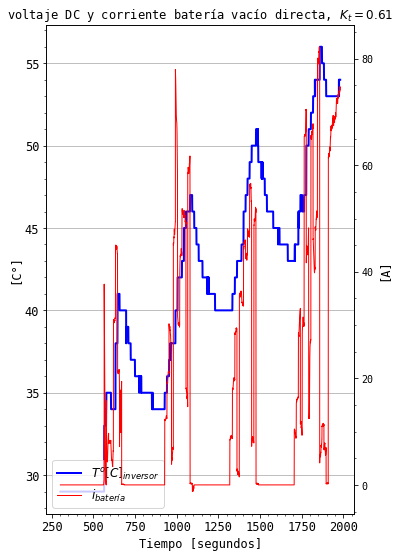

In [ ]:



import matplotlib.pyplot as plt
import numpy as np
# p = 'vizcachas_220122_220938.csv'
p = 'vizcachas_220122_220938.csv'
# p = 'prueba_vizcachas_160122_211704.csv'

# p = 'prueba_vizcachas_170122_002207.csv'
# p = 'PRUEBA_vizcachas_160122_131659.csv'



tm_p= Ts(p)#[:3000]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[:3000]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(9,9))
ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)


# ax1.set_ylim(35, 65)
# ax2.set_ylim(0, 40)
ax1.set_title("voltaje DC y corriente batería vacío directa, $K_{t} = 0.61$", fontsize=12)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=12)
ax1.set_ylabel("[C°]", fontsize=12)
ax2.set_ylabel("[]", fontsize=12)
line1, = ax1.plot(tm_p, dF_p['1. Heatsink Temperature DegC (1)'], color='blue',linewidth=2, label="$T^{o}[C]_{inversor}$")
line2, = ax2.plot(tm_p, (dF_p['1. Battery Current A (0.0625)']), color='red',linewidth=1, label="$i_{batería}$")

ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=12)
ax1.tick_params(axis='y', labelsize=12)
lns = [line1, line2]
ax1.legend(handles=lns, loc='lower left',  prop={'size': 12})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')
plt.show()
plt.show()

In [ ]:
d_REVERSA = 'vacio_enero_rev_240122_195303.csv'
d_REVERSA = 'prueba1_cte_140122_222915.csv'

# p = 

tm = Ts(d_REVERSA)#[7600:]   #[4000:8000]#[5600:9700]
dF_REVERSA = lect_var(d_REVERSA)#[7600:]   #[4000:8000]#[5600:9700]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("voltaje DC y corriente batería vacío directa, $K_{t} = 0.61$", fontsize=12)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=12)
ax1.set_ylabel("[A]", fontsize=12)
ax2.set_ylabel("[V]", fontsize=12)
line1, = ax2.plot(tm[100:], (dF_REVERSA['1. Battery Current A (0.0625)'])[100:], color='blue', label="Corriente batería")
line2, = ax1.plot(tm[100:], butter_lowpass_filter((dF_REVERSA['1. Battery Voltage V (0.0625)']), 3, 10, 3)[100:], color='red', label="Voltaje batería")
line1.set_zorder(-1)
line2.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=12)
ax1.tick_params(axis='y', labelsize=12)
lns = [line1, line2]
ax1.legend(handles=lns, loc='lower left',  prop={'size': 12})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')
plt.show()

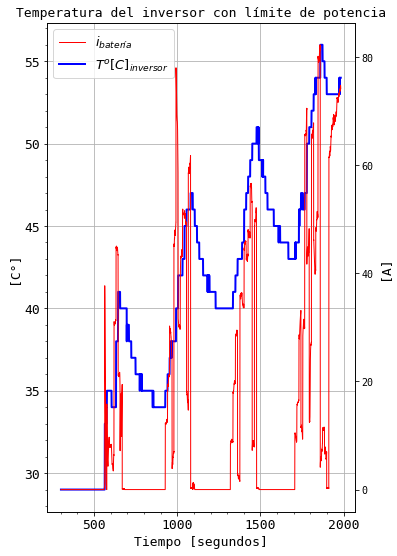

In [ ]:

tm_p= tm_p7 
dF_p = dF7
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax1.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)
# # ax4.set_ylim(0, 240)
# ax1.set_ylim(35, 65)
# ax2.set_ylim(0, 40)
ax1.set_title("Temperatura del inversor con límite de potencia", fontsize=13)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=13)
ax1.set_ylabel("[C°]", fontsize=13)
ax2.set_ylabel("[A]", fontsize=13)
line1, = ax1.plot(tm_p, dF_p['1. Heatsink Temperature DegC (1)'], color='blue',linewidth=2, label="$T^{o}[C]_{inversor}$")
line2, = ax2.plot(tm_p, abs(dF_p['1. Battery Current A (0.0625)']), color='red',linewidth=1, label="$i_{batería}$")
# line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=13)
ax1.tick_params(axis='y', labelsize=13)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line1]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 13})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')

plt.show()

LIMITE POTENCIA 1 MOTOR

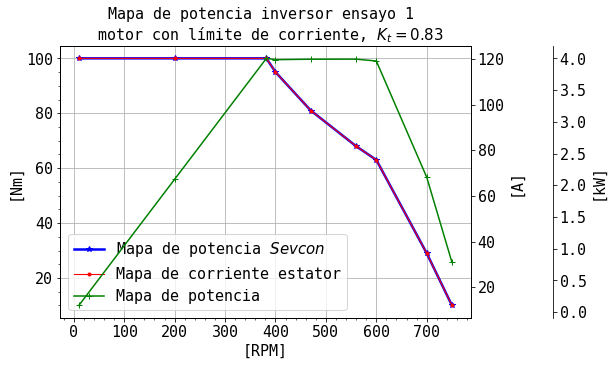

In [ ]:

T_MAP = [100.0, 100.0, 100.0, 95.0, 81.0, 68.0, 63.0, 29.0, 10.0]
RPM_MAP = [10.0, 200, 382, 400, 470, 560, 600, 700, 750]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
ax3 = ax1.twinx()

fig.subplots_adjust(right=0.6)
ax3.spines["right"].set_position(("axes", 1.2))
ax1.set_title("Mapa de potencia inversor ensayo 1 \n motor con límite de corriente, $K_{t} = 0.83$", fontsize=15)    
ax1.set_xlabel("[RPM]", fontsize=15)
ax1.set_ylabel("[Nm]", fontsize=15)
ax2.set_ylabel("[A]", fontsize=15)
ax3.set_ylabel("[kW]", fontsize=15)

line2, = ax1.plot(RPM_MAP, np.asarray(T_MAP), linewidth=2.5,color='blue', marker = '*', label="Mapa de potencia $Sevcon$")
line4, = ax2.plot(RPM_MAP, np.asarray(T_MAP) / 0.8314, linewidth=1.1,color='red', marker = '.', label="Mapa de corriente estator")
line1, = ax3.plot(RPM_MAP, (np.asarray(T_MAP) * abs(rpm2rad(np.asarray(RPM_MAP))))/1000, color='green', marker = '+', label="Mapa de potencia")
# line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
lns = [line2, line4, line1]
ax1.legend(handles=lns, loc='lower left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax2.tick_params(axis='y', labelsize=15)
ax3.tick_params(axis='y', labelsize=15)
ax1.patch.set_visible(False)

plt.show()

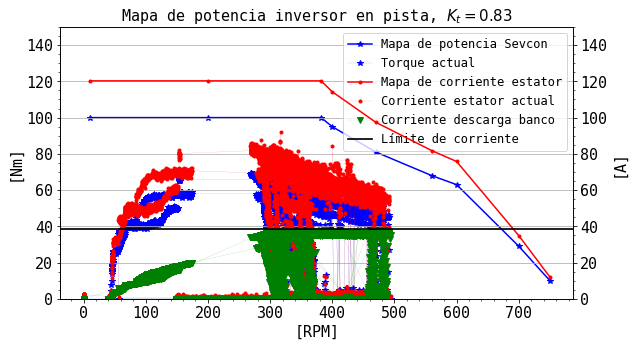

In [ ]:
d_REVERSA = 'prueba_carga_pancho_130222_173408.csv'
tm = Ts(d_REVERSA)#[7500:]   #[4000:8000]#[5600:9700]
dF_REVERSA = lect_var(d_REVERSA)#[7500:]   #[4000:8000]#[5600:9700]
T_MAP = [100.0, 100.0, 100.0, 95.0, 81.0, 68.0, 63.0, 29.0, 10.0]
RPM_MAP = [10.0, 200, 382, 400, 470, 560, 600, 700, 750]
fig, ax1 = plt.subplots(figsize=(15,5))
ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax1.set_ylim(0, 150)
ax2.set_ylim(0, 150)
ax1.set_title("Mapa de potencia inversor en pista, $K_{t} = 0.83$", fontsize=15)    
ax1.set_xlabel("[RPM]", fontsize=15)
ax1.set_ylabel("[Nm]", fontsize=15)
ax2.set_ylabel("[A]", fontsize=15)
line1, = ax1.plot(abs(dF_REVERSA['1. Velocity RPM (1)']), abs(dF_REVERSA['1. Torque actual value Nm (0.0625)']), linewidth=0.09,color='blue', marker = '*', label="Torque actual")
line2, = ax1.plot(RPM_MAP, np.asarray(T_MAP), linewidth=1.5,color='blue', marker = '*', label="Mapa de potencia Sevcon")
line3, = ax2.plot(abs(dF_REVERSA['1. Velocity RPM (1)']), abs(dF_REVERSA['1. Iq A (0.0625)']), linewidth=0.09,color='red', marker = '.', label="Corriente estator actual")
line4, = ax2.plot(RPM_MAP, np.asarray(T_MAP) / 0.8314, linewidth=1.5,color='red', marker = '.', label="Mapa de corriente estator")
line5, = ax2.plot(abs(dF_REVERSA['1. Velocity RPM (1)']), dF_REVERSA['1. Battery Current A (0.0625)'], linewidth=0.09,color='green', marker = 'v', label="Corriente descarga banco")
l2 = ax2.axhline(y = 4e3 / 104  ,color = 'black', linestyle = '-',linewidth=1.7, label='Límite de corriente')
line1.set_zorder(-1)
line2.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
lns = [line2, line1, line4, line3, line5, l2]
ax1.legend(handles=lns, loc='upper right',  prop={'size': 12})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')
# ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

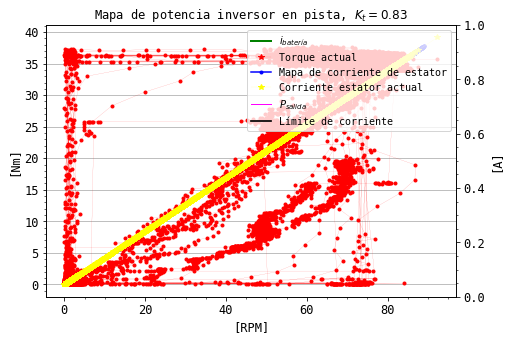

In [ ]:
d_REVERSA = 'prueba_carga_pancho_130222_173408.csv'
tm = Ts(d_REVERSA)#[7500:]   #[4000:8000]#[5600:9700]
dF_REVERSA = lect_var(d_REVERSA)#[7500:]   #[4000:8000]#[5600:9700]
T_MAP = [100.0, 100.0, 100.0, 95.0, 81.0, 68.0, 63.0, 29.0, 10.0]
RPM_MAP = [10.0, 200, 382, 400, 470, 560, 600, 700, 750]
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax1.set_ylim(0, 150)
# ax2.set_ylim(0, 150)
ax1.set_title("Mapa de potencia inversor en pista, $K_{t} = 0.83$", fontsize=12)    
ax1.set_xlabel("[RPM]", fontsize=12)
ax1.set_ylabel("[Nm]", fontsize=12)
ax2.set_ylabel("[A]", fontsize=12)

line3, = ax1.plot(abs(dF_REVERSA['1. Iq A (0.0625)']),abs(dF_REVERSA['1. Battery Current A (0.0625)']) , linewidth=0.09,color='red', marker = '.', label="Corriente estator actual")
line4, = ax1.plot((98/(72/np.sqrt(3)))*abs(dF_REVERSA['1. Battery Current A (0.0625)']), abs(dF_REVERSA['1. Battery Current A (0.0625)']), linewidth=1.5,color='blue', marker = '.', label="Mapa de corriente de estator")
line3, = ax1.plot(abs(dF_REVERSA['1. Iq A (0.0625)']), ((72/np.sqrt(3))/98)*abs(dF_REVERSA['1. Iq A (0.0625)']), linewidth=0.09,color='yellow', marker = '*', label="Corriente estator actual")


line1.set_zorder(-1)
line2.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=12)
ax1.tick_params(axis='y', labelsize=12)
ax2.tick_params(axis='x', labelsize=12)
ax2.tick_params(axis='y', labelsize=12)
lns = [line2, line1, line4, line3, line5, l2]
ax1.legend(handles=lns, loc='upper right',  prop={'size': 10})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')
# ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

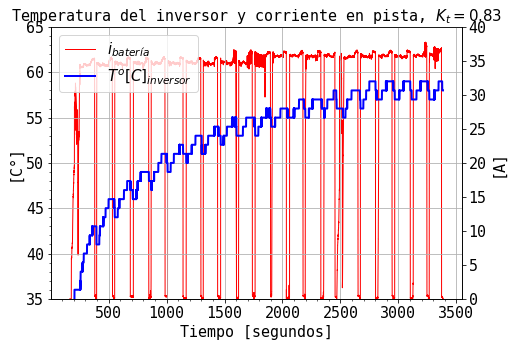

In [ ]:






import matplotlib.pyplot as plt
import numpy as np
p = 'prueba_carga_pancho_130222_173408.csv'
tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax1.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_ylim(35, 65)
ax2.set_ylim(0, 40)
ax1.set_title("Temperatura del inversor y corriente en pista, $K_{t} = 0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[C°]", fontsize=15)
ax2.set_ylabel("[A]", fontsize=15)
line1, = ax1.plot(tm_p, dF_p['1. Heatsink Temperature DegC (1)'], color='blue',linewidth=2, label="$T^{o}[C]_{inversor}$")
line2, = ax2.plot(tm_p, abs(dF_p['1. Battery Current A (0.0625)']), color='red',linewidth=1, label="$i_{batería}$")
# line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line1]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

In [ ]:
def Ts1(file):
    df = pandas.read_csv(file, sep=',', low_memory=False)
    # df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
    # df = df.loc[:, ~df.columns.str.contains('^CONTROLLER_CONFIG')]
    time = df['Time (s).1']
    mins = time.loc[time.idxmin()] 
    maxs = time.loc[time.idxmax()] 
    d = np.asarray(time).astype(float)
    # d = np.nan_to_num(d)
    # d = d[d != 0]
    # tf = np.max(d)
    # t0 = np.min(d)
    t = np.linspace(mins, maxs, len(time))
    t = np.linspace(0, maxs-mins, len(time))
    return t
p1 = 'prueba_carga_pancho_130222_154919.csv'
p2 = 'prueba_carga_pancho_130222_173408.csv'

tm_p1 = Ts(p1)
dF1 = lect_var(p1)
tm_p2 = Ts1(p2)
dF2 = lect_var(p2)

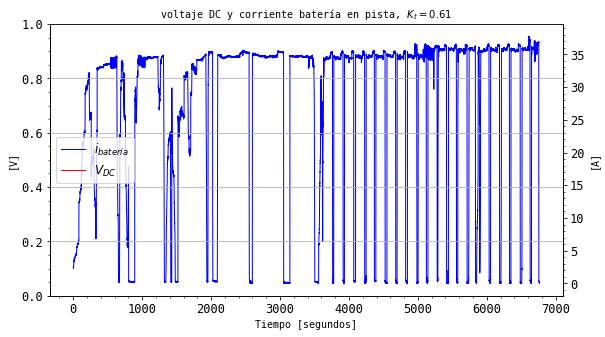

In [ ]:
# p = 'prueba_carga_pancho_130222_154919.csv'
# p = 'prueba_carga_pancho_130222_173408.csv'

tt1 = np.linspace(0, np.max(tm_p1), len(tm_p1))
tt2 = np.linspace(np.max(tm_p1), np.max(tm_p1)+np.max(tm_p2), len(tm_p2))

time1 = np.concatenate((tt1, tt2), axis=0)
temp1 = np.asarray(dF2['1. Heatsink Temperature DegC (1)'])
temp2 = np.asarray(dF4['1. Heatsink Temperature DegC (1)'])
Temp = np.concatenate((temp1, temp2), axis=0)

bat_I1 = np.asarray(dF1['1. Battery Current A (0.0625)'])
bat_I2 = np.asarray(dF2['1. Battery Current A (0.0625)'])
bat_I = np.concatenate((bat_I1, bat_I2), axis=0)

bat_V1 = np.asarray(dF1['1. Battery Voltage V (0.0625)'])
bat_V2 = np.asarray(dF2['1. Battery Voltage V (0.0625)'])
bat_V = np.concatenate((bat_V1, bat_V2), axis=0)

bat_V[bat_V == 0.e+00] = np.mean(bat_V)
bat_V[bat_V < 100] = np.mean(bat_V)
import matplotlib.transforms as transforms
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(15,5))
ax2 = ax1.twinx()
# axes2 = ax1.twiny()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()

# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("voltaje DC y corriente batería en pista, $K_{t} = 0.61$", fontsize=10)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=10)
ax2.set_ylabel("[A]", fontsize=10)
ax1.set_ylabel("[V]", fontsize=10)
# ax1.plot(time1[:], Temp[:], color='blue', label="Corriente batería")
# ax1.plot(time1[:], bat_V[:], color='blue', label="Corriente batería")
# ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=2, label="$T^{o}[C]_{inversor}$")
# ax1.plot(time1[:], abs(Temp[:]), color='red',linewidth=2, label="$i_{batería}$")
line1, = ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=1, label='$i_{batería}$')
# line2, = ax1.plot(time1[:], bat_V[:], color='red',linewidth=1, label='$V_{DC}$')

# ax1.axvline(x=np.max(tm_p7),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.text(np.max(tm_p7)-1000, 0.9, str(int(t7))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)-600, 0.9, str(int(t5))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)-380, 0.9, str(int(t2))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4)-1000, 0.9, str(int(t4))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)




# line2.set_zorder(-1)
ax1.minorticks_on()
# axes2.set_xticks()
# axes2.minorticks_on()
# ax1.tick_params(axis='x', labelsize=12)
# ax1.tick_params(axis='y', labelsize=12)
# lns = [line1, line2]
# ax1.legend(handles=lns, loc='lower left',  prop={'size': 12})
# ax2.grid(axis='x', which='major')
# axes2.set_xlabel("x-axis 2")
# plt.grid(True)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=12)
ax1.tick_params(axis='y', labelsize=12)
ax2.tick_params(axis='x', labelsize=12)
ax2.tick_params(axis='y', labelsize=12)
lns = [line1, line2]
ax1.legend(handles=lns, loc='center left',  prop={'size': 12})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

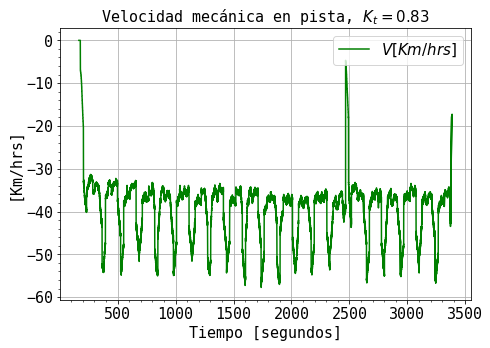

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'prueba_carga_pancho_130222_154919.csv'
p = 'prueba_carga_pancho_130222_173408.csv'

tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
# ax1.set_title("Corriente y tensión $DC$ en ensayo en pista con límite de potencia", fontsize=12)    
# ax1.set_xlabel("Tiempo [segundos]", fontsize=12)

ax1.set_title("Velocidad mecánica en pista, $K_{t} = 0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[Km/hrs]", fontsize=15)
# ax2.set_ylabel("[V]", fontsize=10)
# ax1.set_ylim(-6, 22)
# ax2.set_ylim(-6, 30)
line1, = ax1.plot(tm_p, (Rpm2KmHrs(dF_p['1. Velocity RPM (1)'])), color='green', label="$V[Km/hrs]$")
# line2, = ax1.plot(tm, abs(dF_p['1. Uq V (0.0625)']), color='red', label="$v_{q}$")
# line3, = ax1.plot(tm, dF_p['1. Ud V (0.0625)'], color='blue', label="$v_{d}$")
# line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line1]
ax1.legend(handles=lns, loc='upper right',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

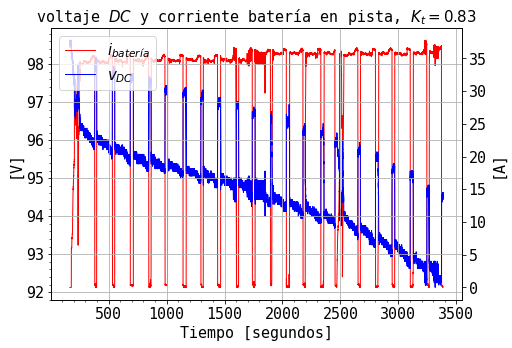

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'prueba_carga_pancho_130222_173408.csv'
tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)

ax1.set_title("voltaje $DC$ y corriente batería en pista, $K_{t} = 0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)

ax1.set_ylabel("[V]", fontsize=15)
ax2.set_ylabel("[A]", fontsize=15)
line3, = ax1.plot(tm_p, abs(dF_p['1. Battery Voltage V (0.0625)']), color='blue',linewidth=1, label="$v_{DC}$")
line2, = ax2.plot(tm_p, abs(dF_p['1. Battery Current A (0.0625)']),linewidth=1, color='red', label="$i_{batería}$")
line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line3]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

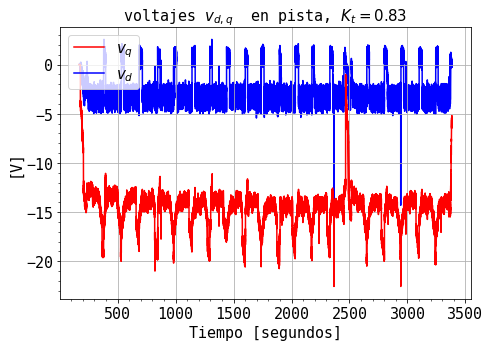

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'prueba_carga_pancho_130222_173408.csv'
tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
# d_DIRECTA = 'master_slave_UD_650_5_0_dir_250222_124248.csv'
# tm = Ts(d_DIRECTA)[3400:]   #[4000:8000]#[5600:9700]
# dF_DIRECTA = lect_var(d_DIRECTA)[3400:]   #[4000:8000]#[5600:9700]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
# ax1.set_title("Corriente y tensión $DC$ en ensayo en pista con límite de potencia", fontsize=12)    
# ax1.set_xlabel("Tiempo [segundos]", fontsize=12)

ax1.set_title("voltajes $v_{d,q}$  en pista, $K_{t} = 0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[V]", fontsize=15)
# ax2.set_ylabel("[V]", fontsize=10)
# ax1.set_ylim(-6, 22)
# ax2.set_ylim(-6, 30)
# line1, = ax1.plot(tm, abs(Rpm2KmHrs(dF_p['1. Velocity RPM (1)'])), color='green', label="$V[Km/hrs]$")
line2, = ax1.plot(tm_p, dF_p['1. Uq V (0.0625)'], color='red', label="$v_{q}$")
line3, = ax1.plot(tm_p, dF_p['1. Ud V (0.0625)'], color='blue', label="$v_{d}$")
line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line3]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

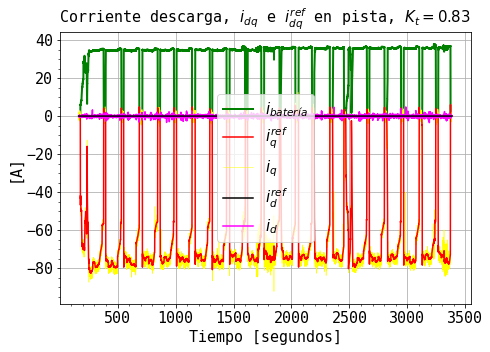

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'prueba_carga_pancho_130222_173408.csv'
tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)

# ax4.set_ylim(0, 240)
ax1.set_title("Corriente descarga, $i_{dq}$ e $i^{ref}_{dq}$ en pista, $K_{t}=0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
ax1.set_ylabel("[A]", fontsize=15)
line2, = ax1.plot(tm_p, (dF_p['1. Battery Current A (0.0625)']),linewidth=2, color='green', label="$i_{batería}$")
line3, = ax1.plot(tm_p, (dF_p['1. Iq A (0.0625)']), color='yellow',linewidth=0.5, label="$i_{q}$")
line4, = ax1.plot(tm_p, (butter_lowpass_filter(dF_p['1. Target Iq A (0.0625)'], 3, 100, 3)), color='red', label="$i^{ref}_{q}$")
line7, = ax1.plot(tm_p, butter_lowpass_filter((dF_p['1. Id A (0.0625)']), 3, 100, 3), color='magenta', label="$i_{d}$")
line6, = ax1.plot(tm_p, (dF_p['1. Target Id A (0.0625)']), color='black', label="$i^{ref}_{d}$")
# ax3.set_ylabel("[Nm]", fontsize=12)
# ax4.set_ylabel("[A]", fontsize=10)
# line1, = ax1.plot(tm_p, Rpm2KmHrs(abs(dF_p['1. Velocity RPM (1)'])),linewidth=3, color='red', label="Velocidad")
# line4, = ax1.plot(tm_p, -abs(dF_p['1. Torque demand value Nm (0.0625)']), color='yellow',linewidth=0.5,  label="$T^{ref}_{em}$")
# line5, = ax1.plot(tm_p, -abs(dF_p['1. Torque actual value Nm (0.0625)']), color='blue',linewidth=1,  label="$T_{em}$")
# line5, = ax1.plot(tm_p, abs(dF_p['1. Iq A (0.0625)']), color='red', label="Corriente batería")
# plt.plot(tm_p, butter_lowpass_filter(abs(dF_p['1. Iq A (0.0625)']), 3, 200, 3), color='red', label="Corriente batería")
# line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
# lns = [line4, line5]
lns = [line2, line4, line3, line6, line7]
ax1.legend(handles=lns, loc='center',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

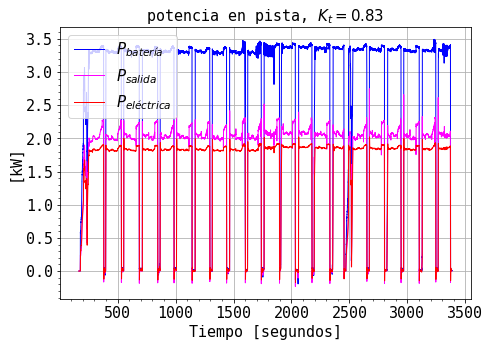

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'prueba_carga_pancho_130222_173408.csv'
# p = 'master_slave_carga_vizcachas_jose_270222_165945.csv'


tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

BatV = (np.asarray(dF_p['1. Battery Voltage V (0.0625)']))
BatI = (np.asarray(dF_p['1. Battery Current A (0.0625)']))
Iq = (np.asarray(dF_p['1. Iq A (0.0625)']))
Uq = (np.asarray(dF_p['1. Uq V (0.0625)']))
Id = (np.asarray(dF_p['1. Id A (0.0625)']))
Ud = (np.asarray(dF_p['1. Ud V (0.0625)']))


Te = (np.asarray(dF_p['1. Torque actual value Nm (0.0625)']))
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad((np.asarray(dF_p['1. Velocity RPM (1)'])))


pot_salida = Te * rad 

pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)
DS = abs(pot_salida / pin)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax2 = ax1.twinx()

# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(0, 120)
# ax2.set_ylim(0, 3.9)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("potencia en pista, $K_{t}=0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
# ax1.set_ylabel("[%]", fontsize=13)
ax1.set_ylabel("[kW]", fontsize=15)
# line2, = ax2.plot(tm_p, (100*D[:]),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line1, = ax2.plot(tm_p, (100*DS[:]),linewidth=1, color='green', label="$\eta_{batería-inversor}$")

# line3, = ax1.plot((butter_lowpass_filter((100*D[140000:142000]), 3, 304, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
line4, = ax1.plot(tm_p, (pin/1000),linewidth=1, color='blue', label="$P_{batería}$")
line5, = ax1.plot(tm_p, (butter_lowpass_filter((pot_salida/1000), 3, 104, 3)),linewidth=1, color='magenta', label="$P_{salida}$")
line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 204, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")
ax2.minorticks_on()
ax1.minorticks_on()
# # ax3.minorticks_on()
# # ax4.minorticks_on()
# # line2.set_zorder(-1)
# .set_zorder(-4)
# line5.set_zorder(1)
# line3.set_zorder(-1)
# line4.set_zorder(-1) 
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line4, line5,  line3]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
# ax2.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

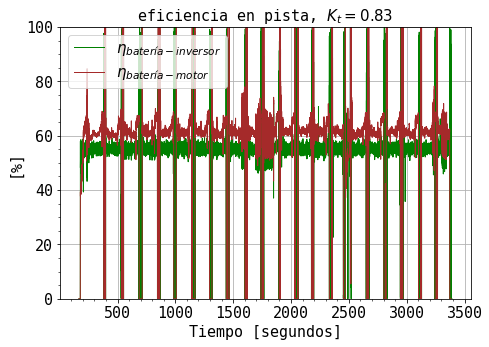

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'prueba_carga_pancho_130222_173408.csv'
# p = 'master_slave_carga_vizcachas_jose_270222_165945.csv'


tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

BatV = (np.asarray(dF_p['1. Battery Voltage V (0.0625)']))
BatI = (np.asarray(dF_p['1. Battery Current A (0.0625)']))
Iq = (np.asarray(dF_p['1. Iq A (0.0625)']))
Uq = (np.asarray(dF_p['1. Uq V (0.0625)']))
Id = (np.asarray(dF_p['1. Id A (0.0625)']))
Ud = (np.asarray(dF_p['1. Ud V (0.0625)']))


Te = (np.asarray(dF_p['1. Torque actual value Nm (0.0625)']))
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad((np.asarray(dF_p['1. Velocity RPM (1)'])))


pot_salida = Te * rad 

pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)
DS = abs(pot_salida / pin)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax2 = ax1.twinx()

# ax4.spines["right"].set_position(("axes", 1.2))
ax1.set_ylim(0, 100)
# ax2.set_ylim(0, 3.9)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("eficiencia en pista, $K_{t}=0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[%]", fontsize=15)
# ax1.set_ylabel("[kW]", fontsize=13)

line2, = ax1.plot(tm_p, (100*D[:]),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
line1, = ax1.plot(tm_p, (100*DS[:]),linewidth=1, color='brown', label="$\eta_{batería-motor}$")

# line3, = ax1.plot((butter_lowpass_filter((100*D[140000:142000]), 3, 304, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (pin/1000),linewidth=1, color='blue', label="$P_{batería}$")
# line5, = ax1.plot(tm_p, (butter_lowpass_filter((pot_salida/1000), 3, 104, 3)),linewidth=1, color='magenta', label="$P_{salida}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 204, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")
ax2.minorticks_on()
ax1.minorticks_on()
# # ax3.minorticks_on()
# # ax4.minorticks_on()
# # line2.set_zorder(-1)
# .set_zorder(-4)
# line5.set_zorder(1)
# line3.set_zorder(-1)
# line4.set_zorder(-1) 
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line1]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
# ax2.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

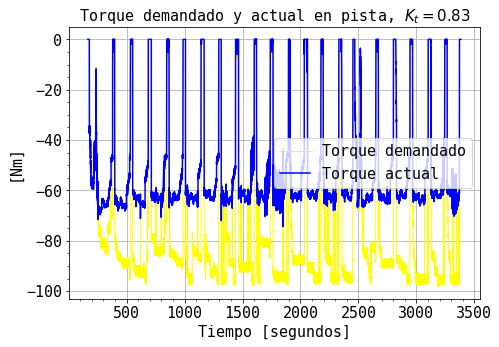

In [ ]:

import matplotlib.pyplot as plt
import numpy as np
p = 'prueba_carga_pancho_130222_173408.csv'
tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)

# ax4.set_ylim(0, 240)
ax1.set_title("Torque demandado y actual en pista, $K_{t}=0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
ax1.set_ylabel("[Nm]", fontsize=15)
line2, = ax1.plot(tm_p, -abs(dF_p['1. Torque demand value Nm (0.0625)']),linewidth=1, color='yellow', label="Torque demandado")
line3, = ax1.plot(tm_p, -abs(dF_p['1. Torque actual value Nm (0.0625)']), color='blue',linewidth=1.5, label="Torque actual")



# line3, = ax1.plot((butter_lowpass_filter((100*D[140000:142000]), 3, 304, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (pin/1000),linewidth=1, color='blue', label="$P_{batería}$")
# line5, = ax1.plot(tm_p, (butter_lowpass_filter((pot_salida/1000), 3, 104, 3)),linewidth=1, color='magenta', label="$P_{salida}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 204, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")
ax2.minorticks_on()
ax1.minorticks_on()
# # ax3.minorticks_on()
# # ax4.minorticks_on()
# # line2.set_zorder(-1)
# .set_zorder(-4)
# line5.set_zorder(1)
# line3.set_zorder(-1)
# line4.set_zorder(-1) 
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line3]
ax1.legend(handles=lns, loc='best',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
# ax2.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

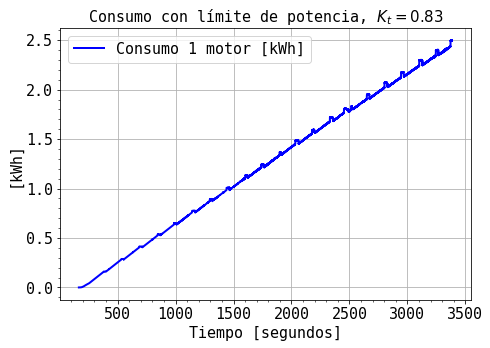

In [ ]:
from scipy import integrate

d_DIRECTA = 'prueba_carga_pancho_130222_173408.csv'
tm = Ts(d_DIRECTA)#[3450:]   #[4000:8000]#[5600:9700]
dF_DIRECTA = lect_var(d_DIRECTA)#[3450:]   #[4000:8000]#[5600:9700

x1 = tm
y1 = (dF_DIRECTA['1. Battery Current A (0.0625)']) / 3600
y_int1 = integrate.cumtrapz(y1, x1, initial=0)
y_int1 = dF_DIRECTA['1. Battery Voltage V (0.0625)']  * y_int1


plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)

# ax1.set_ylim(35, 65)
# ax2.set_ylim(0, 40)
ax1.set_title("Consumo con límite de potencia, $K_{t}=0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[kWh]", fontsize=15)
line1, = ax1.plot(tm, y_int1/1000, color='blue', linewidth=2, label="Consumo 1 motor [kWh]")
# line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line1]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

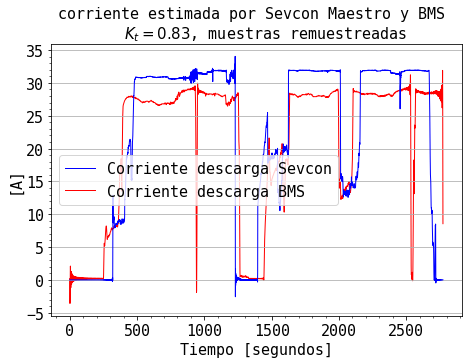

In [ ]:
dd1 = 'current_260122_150545.csv'
dd2 = 'current2_260122_153530.csv'
dd3 = 'current2_260122_172331.csv'
dd4 = 'current2_260122_173957.csv'
dd1= pandas.read_csv(dd1 , sep=',', low_memory=False)
dd2= pandas.read_csv(dd2 , sep=',', low_memory=False)
dd3= pandas.read_csv(dd3 , sep=',', low_memory=False)
dd4= pandas.read_csv(dd4 , sep=',', low_memory=False)
D = np.nan_to_num(np.asarray(dd1['1. Battery Voltage V (0.0625)']))
sev = D
ddd1 = 'BMS02_vizcachas_20220126(5 vueltas).csv'
ddd2 = 'BMS01_vizcachas_20220126(10 vueltas).csv'
ddd3 = 'vizcachas-26012022-1.csv'
ddd1= pandas.read_csv(ddd1 , sep=';')
ddd2 = pandas.read_csv(ddd2 , sep='\s+')
ddd3 = pandas.read_csv(ddd3 , sep='\s+')

from scipy import signal
dd1 = 'current_260122_150545.csv'
dd1= pandas.read_csv(dd1 , sep=',', low_memory=False)
ibms = np.asarray(ddd2['Alod'])

D = np.nan_to_num(np.asarray(dd1['1. Battery Current A (0.0625)']))
sev = signal.resample(D, 3100)
bms = signal.resample(ibms, 3100)

fig, ax1 = plt.subplots(figsize=(12,5))
Fiempo = Ts('current_260122_150545.csv')

Fiempo = signal.resample(Fiempo, 3100)


fig.subplots_adjust(right=0.6)

ax1.set_title("corriente estimada por Sevcon Maestro y BMS \n  $K_{t}=0.83$, muestras remuestreadas", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[A]", fontsize=15)

line1, = ax1.plot(np.linspace(0,np.max(Fiempo), len(Fiempo)),np.asarray(sev[:]),linewidth=1, color='blue', label="Corriente descarga Sevcon")
line2, = ax1.plot(np.linspace(0,np.max(Fiempo), len(Fiempo)), np.asarray(np.roll(bms[:], 0)),linewidth=1, color='red', label="Corriente descarga BMS")

line2.set_zorder(-1)
ax1.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
lns = [line1, line2]
ax1.legend(handles=lns, loc='best',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()



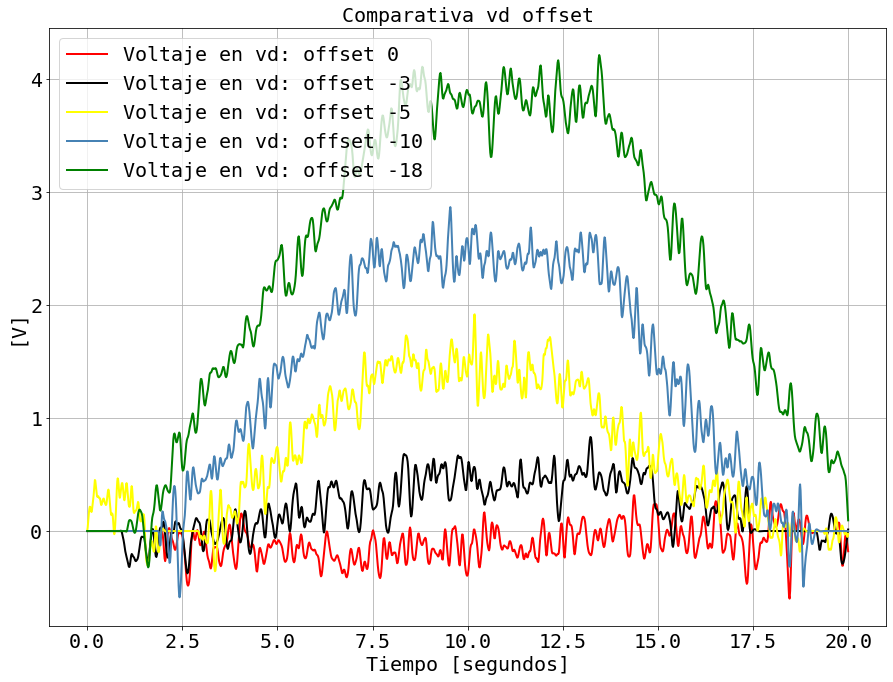

In [ ]:
prueba = 'master_slave_vacio_ofset0_5_070322_123135.csv'
prueba1 = 'master_slave_vacio_ofset10_5_070322_124318.csv'
prueba2 = 'master_slave_vacio_ofset18_5_070322_124738.csv'
prueba3 = 'master_slave_vacio_ofset5_5_070322_124031.csv'
prueba4 = 'master_slave_vacio_ofsetm3_070322_125209.csv'
tm = Ts(prueba)   #[4000:8000]#[5600:9700]
df = lect_var(prueba)  #[4000:8000]#[5600:9700]

tm1 = Ts(prueba1)   #[4000:8000]#[5600:9700]
df1 = lect_var(prueba1)  #[4000:8000]#[5600:9700]

tm2 = Ts(prueba2)   #[4000:8000]#[5600:9700]
df2 = lect_var(prueba2)  #[4000:8000]#[5600:9700]

tm3 = Ts(prueba3)   #[4000:8000]#[5600:9700]
df3 = lect_var(prueba3)  #[4000:8000]#[5600:9700]

tm4 = Ts(prueba4)   #[4000:8000]#[5600:9700]
df4 = lect_var(prueba4)  #[4000:8000]#[5600:9700]
fig6, (ax7) = plt.subplots(figsize=(15, 11))
ax7.set_title('Comparativa vd offset', fontsize=20)
ud3 = butter_lowpass_filter((df['1. Ud V (0.0625)'])[0:1300], 2, 30, 3) #1300

ud10 = butter_lowpass_filter((df1['1. Ud V (0.0625)'])[7600:9200], 2, 30, 3) #1600
ud18 = butter_lowpass_filter((df2['1. Ud V (0.0625)'])[0:1300], 2, 30, 3)#1400
ud5 = butter_lowpass_filter((df3['1. Ud V (0.0625)'])[2000:3800], 2, 30, 3)
ud0 = butter_lowpass_filter((df4['1. Ud V (0.0625)'])[0:1300], 2, 30, 3)#1280


ax7.plot(np.linspace(0,20,len(ud0)), ud0, color='red', linewidth=2, 
         label='Voltaje en vd: offset 0')
ax7.plot(np.linspace(0,20,len(ud3)), ud3, color='black', linewidth=2, 
         label='Voltaje en vd: offset -3')
ax7.plot(np.linspace(0,20,len(ud5)), ud5, color='yellow', linewidth=2, 
         label='Voltaje en vd: offset -5')
ax7.plot(np.linspace(0,20,len(ud10)), (ud10), color='steelblue', linewidth=2, 
         label='Voltaje en vd: offset -10')
ax7.plot(np.linspace(0,20,len(ud18)), (ud18), color='green', linewidth=2, 
         label='Voltaje en vd: offset -18')

ax7.set_xlabel('Tiempo [segundos]', fontsize=20)
ax7.set_ylabel('[V]', color='black', fontsize=20)
ax7.legend(loc='best', prop={'size': 20})
ax7.grid(True)
ax7.tick_params(axis='x', labelsize=20)
ax7.tick_params(axis='y', labelsize=20)
ax7.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax7.patch.set_visible(False)
plt.show()

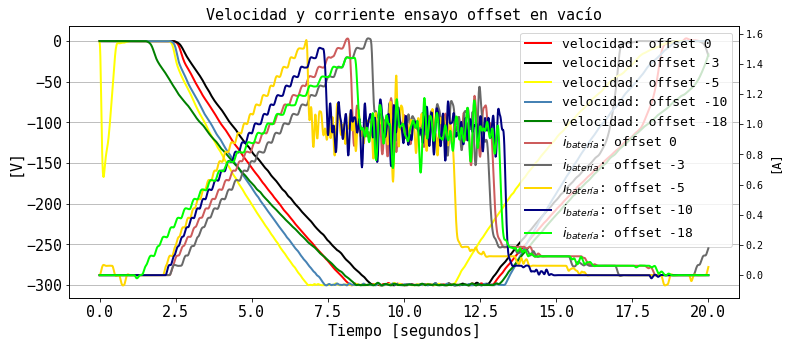

In [ ]:
v3 = butter_lowpass_filter((df['1. Velocity RPM (1)'])[0:1300], 2, 30, 3) #1300
v10 = butter_lowpass_filter((df1['1. Velocity RPM (1)'])[7600:9200], 2, 30, 3) #1600
v18 = butter_lowpass_filter((df2['1. Velocity RPM (1)'])[0:1300], 2, 30, 3)#1400
v5 = butter_lowpass_filter((df3['1. Velocity RPM (1)'])[2100:3800], 2, 30, 3)
v0 = butter_lowpass_filter((df4['1. Velocity RPM (1)'])[0:1300], 2, 30, 3)#1280


i3 = butter_lowpass_filter((df['1. Battery Current A (0.0625)'])[0:1300], 2, 30, 3) #1300
i10 = butter_lowpass_filter((df1['1. Battery Current A (0.0625)'])[7600:9200], 2, 30, 3) #1600
i18 = butter_lowpass_filter((df2['1. Battery Current A (0.0625)'])[0:1300], 2, 30, 3)#1400
i5 = butter_lowpass_filter((df3['1. Battery Current A (0.0625)'])[2100:3800], 2, 30, 3)
i0 = butter_lowpass_filter((df4['1. Battery Current A (0.0625)'])[0:1300], 2, 30, 3)#1280
fig, ax7 = plt.subplots(figsize=(12,5))
ax2 = ax7.twinx()


ax7.set_title('Velocidad y corriente ensayo offset en vacío', fontsize=15)
line1, =ax7.plot(np.linspace(0,20,len(v0)), v0, color='red', linewidth=2, 
         label='velocidad: offset 0')
line2, =ax7.plot(np.linspace(0,20,len(v3)), v3, color='black', linewidth=2, 
         label='velocidad: offset -3')
line3, =ax7.plot(np.linspace(0,20,len(v5)), v5, color='yellow', linewidth=2, 
         label='velocidad: offset -5')
line4, =ax7.plot(np.linspace(0,20,len(v10)), (v10), color='steelblue', linewidth=2, 
         label='velocidad: offset -10')
line5, =ax7.plot(np.linspace(0,20,len(v18)), (v18), color='green', linewidth=2, 
         label='velocidad: offset -18')

line6, = ax2.plot(np.linspace(0,20,len(i0)), i0, color='indianred', linewidth=2, 
         label='$i_{batería}$: offset 0')
line7, =ax2.plot(np.linspace(0,20,len(i3)), i3, color='dimgray', linewidth=2, 
         label='$i_{batería}$: offset -3')
line8, =ax2.plot(np.linspace(0,20,len(i5)), i5, color='gold', linewidth=2, 
         label='$i_{batería}$: offset -5')
line9, =ax2.plot(np.linspace(0,20,len(i10)), (i10), color='navy', linewidth=2, 
         label='$i_{batería}$: offset -10')
line10, =ax2.plot(np.linspace(0,20,len(i18)), (i18), color='lime', linewidth=2, 
         label='$i_{batería}$: offset -18')
ax7.set_ylabel('[RPM]', fontsize=12)
ax2.set_ylabel('[A]', fontsize=12)

ax7.set_xlabel('Tiempo [segundos]', fontsize=15)
ax7.set_ylabel('[V]', color='black', fontsize=15)
# ax7.legend(loc='lower right', prop={'size': 12})
# ax7.grid(True)
ax7.tick_params(axis='x', labelsize=15)
ax7.tick_params(axis='y', labelsize=15)
lns = [line1, line2, line3, line4, line5, line6, line7, line8, line9, line10]
ax7.legend(handles=lns, loc='upper right',  prop={'size': 13})
ax7.grid(axis='y', which='major')
# ax7.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax2.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax2.patch.set_visible(False)
plt.show()

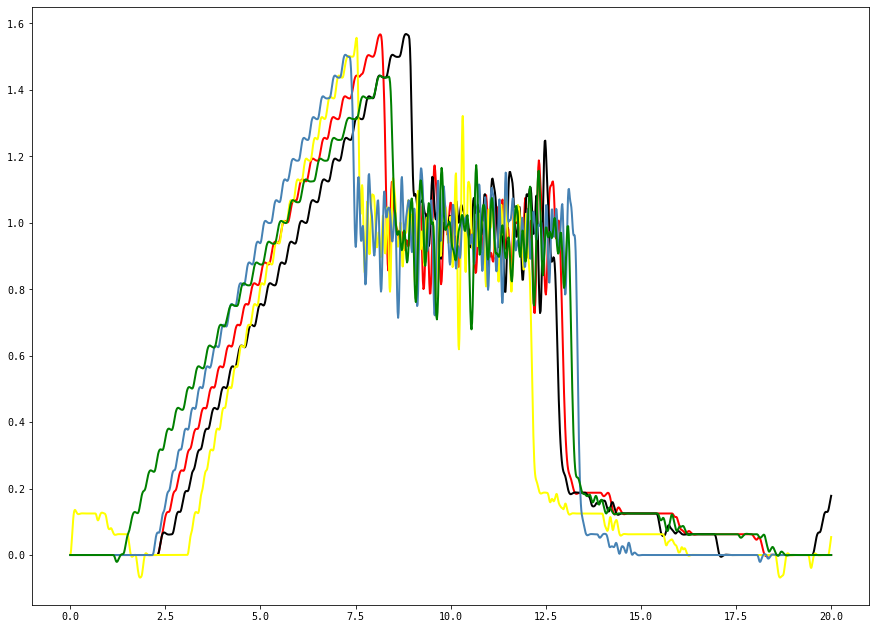

VACIO CON LIMITE 1 MOTOR

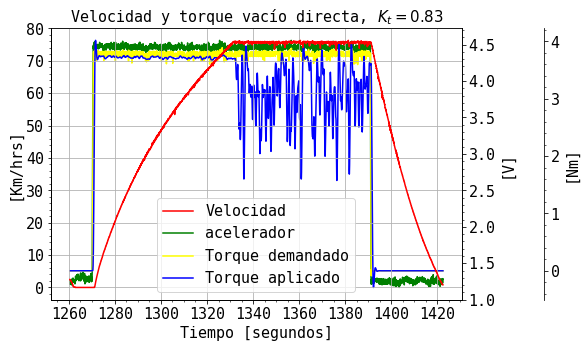

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# p = 'prueba_carga_pancho_130222_173408.csv'
# p = 'vizcachas_220122_182408.csv'
# d_DIRECTA = 'master_slave_UD_650_5_0_dir_250222_124248.csv'

p = 'master_slave_UD_650_5_0_dir_250222_124248.csv'
tm_p= Ts(p)[3400:]#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)[3400:]#[12000:16200]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("Velocidad y torque vacío directa, $K_{t}=0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[Km/hrs]", fontsize=15)
ax2.set_ylabel("[V]", fontsize=15)
ax3.set_ylabel("[Nm]", fontsize=15)

line1, = ax1.plot(tm_p, Rpm2KmHrs(dF_p['1. Velocity RPM (1)']), color='red', label="Velocidad")
line2, = ax2.plot(tm_p, (dF_p['1. Throttle Input Voltage V (0.00390625)']), color='green', label="acelerador")
line3, = ax3.plot(tm_p, butter_lowpass_filter((dF_p['1. Torque demand value Nm (0.0625)']), 3, 8, 3), color='yellow', label="Torque demandado")
line4, = ax3.plot(tm_p, butter_lowpass_filter((dF_p['1. Torque actual value Nm (0.0625)']), 3, 110, 3), color='blue', label="Torque aplicado")
line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
ax3.tick_params(axis='x', labelsize=15)
ax3.tick_params(axis='y', labelsize=15)
lns = [line1, line2, line3, line4]
ax1.legend(handles=lns, loc='lower center',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

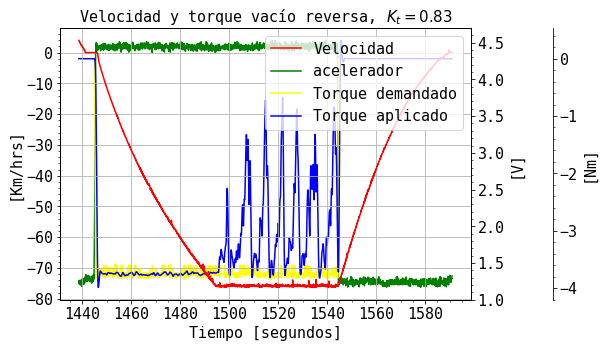

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# p = 'prueba_carga_pancho_130222_173408.csv'
# p = 'master_slave_UD_650_5_0_dir_250222_124248.csv'
p = 'master_slave_UD_650_5_0_rev_250222_124537.csv'

tm_p= Ts(p)[7500:]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)[7500:]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("Velocidad y torque vacío reversa, $K_{t}=0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[Km/hrs]", fontsize=15)
ax2.set_ylabel("[V]", fontsize=15)
ax3.set_ylabel("[Nm]", fontsize=15)

line1, = ax1.plot(tm_p, Rpm2KmHrs(dF_p['1. Velocity RPM (1)']), color='red', label="Velocidad")
line2, = ax2.plot(tm_p, (dF_p['1. Throttle Input Voltage V (0.00390625)']), color='green', label="acelerador")
line3, = ax3.plot(tm_p, butter_lowpass_filter((dF_p['1. Torque demand value Nm (0.0625)']), 3, 8, 3), color='yellow', label="Torque demandado")
line4, = ax3.plot(tm_p, butter_lowpass_filter((dF_p['1. Torque actual value Nm (0.0625)']), 3, 110, 3), color='blue', label="Torque aplicado")
# ax1.set_zorder(1)
# ax2.set_zorder(1)
# line3.set_zorder(1)
# line4.set_zorder(1)

# line2.set_zorder(-1)
# line3.set_zorder(-1)
# line4.set_zorder(-1)

# line5.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
ax3.tick_params(axis='x', labelsize=15)
ax3.tick_params(axis='y', labelsize=15)
lns = [line1, line2, line3, line4]
ax1.legend(handles=lns, loc='upper right',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

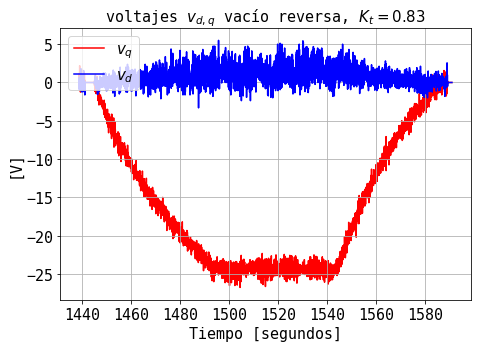

In [ ]:



import matplotlib.pyplot as plt
import numpy as np
p = 'prueba_PARQUE6_150122_141238.csv'
# p = 'prueba_PARQUE6_160122_201026.csv'
p = 'master_slave_UD_650_5_0_rev_250222_124537.csv'
tm_p= Ts(p)[7500:]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)[7500:]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
fig.subplots_adjust(right=0.6)
# ax1.spines["right"].set_position(("axes", 1.2))
ax1.set_title("voltajes $v_{d,q}$ vacío reversa, $K_{t} = 0.83$", fontsize=15) 
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[V]", fontsize=15)
# ax2.set_ylabel("[V]", fontsize=10)
# ax1.set_ylim(-6, 22)
# ax2.set_ylim(-6, 30)
line1, = ax1.plot(tm_p, (dF_p['1. Uq V (0.0625)']), color='red', label="$v_{q}$")
line2, = ax1.plot(tm_p, dF_p['1. Ud V (0.0625)'], color='blue', label="$v_{d}$")
line1.set_zorder(-1)
# line2.set_zorder(-1)
# ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line1, line2]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

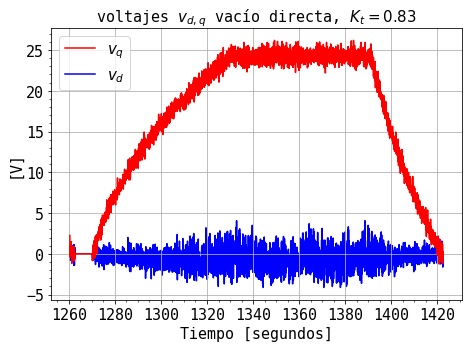

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# p = 'prueba_carga_pancho_130222_173408.csv'
# p = 'master_slave_UD_650_5_0_dir_250222_124248.csv'
# p = 'master_slave_UD_650_5_0_rev_250222_124537.csv'

# tm_p= Ts(p)[7500:]   #[4000:8000]#[5600:9700]
# dF_p = lect_var(p)[7500:]   #[4000:8000]#[5600:9700]]


p = 'master_slave_UD_650_5_0_dir_250222_124248.csv'
tm_p= Ts(p)[3400:]#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)[3400:]#[12000:16200]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax1.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
# ax1.set_title("Corriente y tensión $DC$ en ensayo en pista con límite de potencia", fontsize=12)    
# ax1.set_xlabel("Tiempo [segundos]", fontsize=12)
ax1.set_title("voltajes $v_{d,q}$ vacío directa, $K_{t} = 0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[V]", fontsize=15)
# ax2.set_ylabel("[V]", fontsize=10)
# ax1.set_ylim(-6, 22)
# ax2.set_ylim(-6, 30)
# line1, = ax1.plot(tm, abs(Rpm2KmHrs(dF_p['1. Velocity RPM (1)'])), color='green', label="$V[Km/hrs]$")
line2, = ax1.plot(tm_p, (dF_p['1. Uq V (0.0625)']), color='red', label="$v_{q}$")
line3, = ax1.plot(tm_p, dF_p['1. Ud V (0.0625)'], color='blue', label="$v_{d}$")
line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line3]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

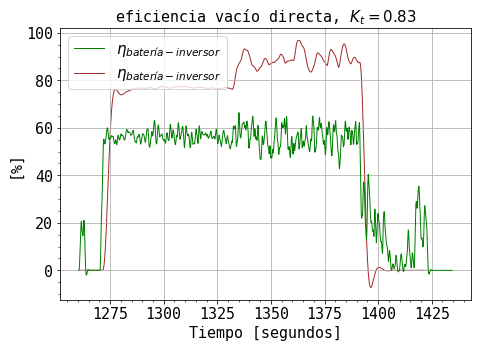

In [ ]:
# tm = Ts(d_DIRECTA)[3400:]
import matplotlib.pyplot as plt
import numpy as np
# d_DIRECTA = 'master_slave_UD_650_5_0_dir_250222_124248.csv'
p = 'master_slave_UD_650_5_0_dir_250222_124248.csv'

tm_p = Ts(p)[3400:]
dF_p = lect_var(p)[3400:]
# p = 'master_slave_UD_650_5_0_rev_250222_124537.csv'
# tm_p= Ts(p)[7500:]   #[4000:8000]#[5600:9700]
# dF_p = lect_var(p)[7500:]   #[4000:8000]#[5600:9700]]
BatV = (np.asarray(dF_p['1. Battery Voltage V (0.0625)']))
BatI = (np.asarray(dF_p['1. Battery Current A (0.0625)']))
Iq = (np.asarray(dF_p['1. Iq A (0.0625)']))
Uq = (np.asarray(dF_p['1. Uq V (0.0625)']))
Id = (np.asarray(dF_p['1. Id A (0.0625)']))
Ud = (np.asarray(dF_p['1. Ud V (0.0625)']))
Te = (np.asarray(dF_p['1. Torque actual value Nm (0.0625)']))
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad((np.asarray(dF_p['1. Velocity RPM (1)'])))


pot_salida = Te * rad 
pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)

DS = abs(pot_salida / pin)

plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
fig.subplots_adjust(right=0.6)
# ax2 = ax1.twinx()
ax1.set_title("eficiencia vacío directa, $K_{t}=0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[%]", fontsize=15)
# ax1.set_ylabel("[kW]", fontsize=13)
line1, = ax1.plot(tm_p, (butter_lowpass_filter(100*D[:], 3, 124, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (butter_lowpass_filter((pin/1000), 3, 124, 3)),linewidth=1, color='blue', label="$P_{batería}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 124, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")
# line5, = ax1.plot(tm_p, (butter_lowpass_filter((pot_salida/1000), 3, 204, 3)),linewidth=1, color='magenta', label="$P_{salida}$")

line2, = ax1.plot(tm_p, (butter_lowpass_filter(100*DS[:], 3, 524, 3)),linewidth=1, color='brown', label="$\eta_{batería-inversor}$")

ax2.minorticks_on()
ax1.minorticks_on()
line2.set_zorder(-1)
line4.set_zorder(-1)
line3.set_zorder(-1)
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
# lns = [line4, line3, line5]
lns = [line1, line2]

ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

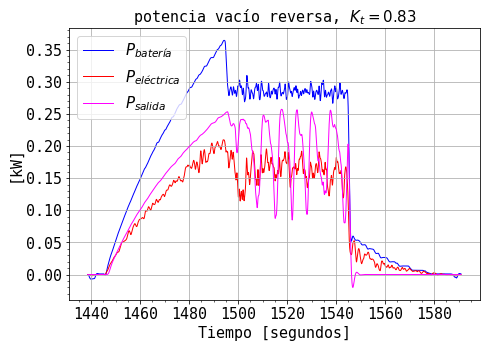

In [ ]:
# tm = Ts(d_DIRECTA)[3400:]
import matplotlib.pyplot as plt
import numpy as np
# d_DIRECTA = 'master_slave_UD_650_5_0_dir_250222_124248.csv'
# p = 'master_slave_UD_650_5_0_dir_250222_124248.csv'

# tm_p = Ts(p)[3400:]
# dF_p = lect_var(p)[3400:]


p = 'master_slave_UD_650_5_0_rev_250222_124537.csv'
tm_p = Ts(p)[7500:]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)[7500:]   #[4000:8000]#[5600:9700]
# p = 'master_slave_UD_650_5_0_rev_250222_124537.csv'
# tm_p= Ts(p)[7500:]   #[4000:8000]#[5600:9700]
# dF_p = lect_var(p)[7500:]   #[4000:8000]#[5600:9700]]
BatV = (np.asarray(dF_p['1. Battery Voltage V (0.0625)']))
BatI = (np.asarray(dF_p['1. Battery Current A (0.0625)']))
Iq = (np.asarray(dF_p['1. Iq A (0.0625)']))
Uq = (np.asarray(dF_p['1. Uq V (0.0625)']))
Id = (np.asarray(dF_p['1. Id A (0.0625)']))
Ud = (np.asarray(dF_p['1. Ud V (0.0625)']))
Te = (np.asarray(dF_p['1. Torque actual value Nm (0.0625)']))
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad((np.asarray(dF_p['1. Velocity RPM (1)'])))


pot_salida = Te * rad 
pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
fig.subplots_adjust(right=0.6)
# ax2 = ax1.twinx()
ax1.set_title("potencia vacío reversa, $K_{t}=0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax2.set_ylabel("[%]", fontsize=15)
ax1.set_ylabel("[kW]", fontsize=15)
# line2, = ax2.plot(tm_p, (butter_lowpass_filter(100*D[:], 3, 124, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
line4, = ax1.plot(tm_p, (butter_lowpass_filter((pin/1000), 3, 124, 3)),linewidth=1, color='blue', label="$P_{batería}$")
line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 124, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")
line5, = ax1.plot(tm_p, (butter_lowpass_filter((pot_salida/1000), 3, 204, 3)),linewidth=1, color='magenta', label="$P_{salida}$")
ax2.minorticks_on()
ax1.minorticks_on()
line2.set_zorder(-1)
line4.set_zorder(-1)
line3.set_zorder(-1)
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
lns = [line4, line3, line5]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

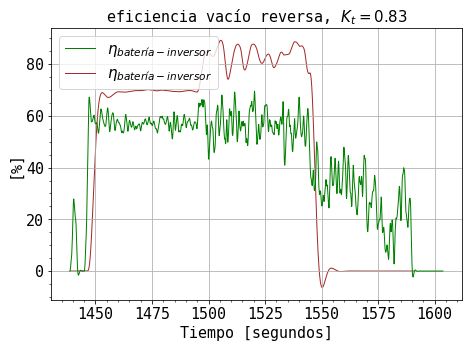

In [ ]:
# tm = Ts(d_DIRECTA)[3400:]
import matplotlib.pyplot as plt
import numpy as np
# d_DIRECTA = 'master_slave_UD_650_5_0_dir_250222_124248.csv'


p = 'master_slave_UD_650_5_0_rev_250222_124537.csv'
tm_p = Ts(p)[7500:]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)[7500:]   #[4000:8000]#[5600:9700]


# p = 'master_slave_UD_650_5_0_dir_250222_124248.csv'

# tm_p = Ts(p)[3400:]
# dF_p = lect_var(p)[3400:]

# p = 'master_slave_UD_650_5_0_rev_250222_124537.csv'
# tm_p= Ts(p)[7500:]   #[4000:8000]#[5600:9700]
# dF_p = lect_var(p)[7500:]   #[4000:8000]#[5600:9700]]
BatV = (np.asarray(dF_p['1. Battery Voltage V (0.0625)']))
BatI = (np.asarray(dF_p['1. Battery Current A (0.0625)']))
Iq = (np.asarray(dF_p['1. Iq A (0.0625)']))
Uq = (np.asarray(dF_p['1. Uq V (0.0625)']))
Id = (np.asarray(dF_p['1. Id A (0.0625)']))
Ud = (np.asarray(dF_p['1. Ud V (0.0625)']))
Te = (np.asarray(dF_p['1. Torque actual value Nm (0.0625)']))
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad((np.asarray(dF_p['1. Velocity RPM (1)'])))


pot_salida = Te * rad 
pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)

DS = abs(pot_salida / pin)

plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
fig.subplots_adjust(right=0.6)
# ax2 = ax1.twinx()
ax1.set_title("eficiencia vacío reversa, $K_{t}=0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[%]", fontsize=15)
# ax1.set_ylabel("[kW]", fontsize=13)
line1, = ax1.plot(tm_p, (butter_lowpass_filter(100*D[:], 3, 124, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (butter_lowpass_filter((pin/1000), 3, 124, 3)),linewidth=1, color='blue', label="$P_{batería}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 124, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")
# line5, = ax1.plot(tm_p, (butter_lowpass_filter((pot_salida/1000), 3, 204, 3)),linewidth=1, color='magenta', label="$P_{salida}$")

line2, = ax1.plot(tm_p, (butter_lowpass_filter(100*DS[:], 3, 524, 3)),linewidth=1, color='brown', label="$\eta_{batería-inversor}$")

ax2.minorticks_on()
ax1.minorticks_on()
line2.set_zorder(-1)
line4.set_zorder(-1)
line3.set_zorder(-1)
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
# lns = [line4, line3, line5]
lns = [line1, line2]

ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

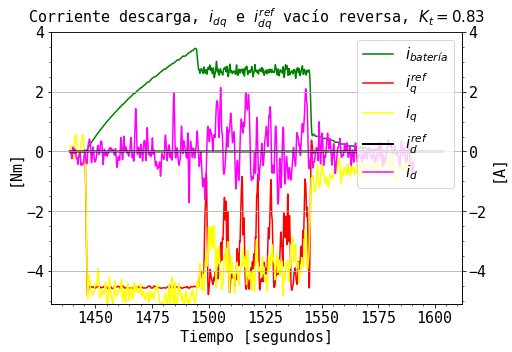

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
d_REVERSA = 'master_slave_UD_650_5_0_rev_250222_124537.csv'
tm = Ts(d_REVERSA)[7500:]   #[4000:8000]#[5600:9700]
dF_REVERSA = lect_var(d_REVERSA)[7500:]   #[4000:8000]#[5600:9700]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax1.set_ylim(-5.1, 4)
ax2.set_ylim(-5.1, 4)
ax1.set_title("Corriente descarga, $i_{dq}$ e $i^{ref}_{dq}$ vacío reversa, $K_{t}=0.83$", fontsize=15)       
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[Nm]", fontsize=15)
ax2.set_ylabel("[A]", fontsize=15)
# line1, = ax1.plot(tm, butter_lowpass_filter((dF_REVERSA['1. Torque actual value Nm (0.0625)']), 3, 100, 3), color='red', label="Torque actual")
line2, = ax2.plot(tm, butter_lowpass_filter((dF_REVERSA['1. Battery Current A (0.0625)']), 3, 100, 3), color='green', label="$i_{batería}$")
line3, = ax2.plot(tm, butter_lowpass_filter((dF_REVERSA['1. Target Iq A (0.0625)']), 3, 100, 3), color='red', label="$i^{ref}_{q}$")
line4, = ax2.plot(tm, butter_lowpass_filter((dF_REVERSA['1. Iq A (0.0625)']), 3, 100, 3)+0.1, color='yellow', label="$i_{q}$")
line6, = ax2.plot(tm, butter_lowpass_filter((dF_REVERSA['1. Id A (0.0625)']), 3, 100, 3), color='magenta', label="$i_{d}$")
line5, = ax2.plot(tm, np.zeros(len(tm)), color='black',linewidth=2,  label="$i^{ref}_{d}$")

# line1.set_zorder(-1)
# line2.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
lns = [line2, line3, line4, line5, line6]
ax1.legend(handles=lns, loc='best',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

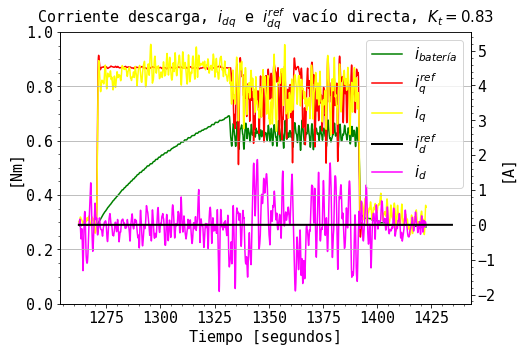

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# d_REVERSA = 'master_slave_UD_650_5_0_rev_250222_124537.csv'
# tm = Ts(d_REVERSA)[7500:]   #[4000:8000]#[5600:9700]
# dF_REVERSA = lect_var(d_REVERSA)[7500:]   #[4000:8000]#[5600:9700]


d_REVERSA = 'master_slave_UD_650_5_0_dir_250222_124248.csv'
tm = Ts(d_REVERSA)[3450:]   #[4000:8000]#[5600:9700]
dF_REVERSA = lect_var(d_REVERSA)[3450:]   #[4000:8000]#[5600:9700]

plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax1.set_ylim(-5.1, 4)
# ax2.set_ylim(-5.1, 4)
ax1.set_title("Corriente descarga, $i_{dq}$ e $i^{ref}_{dq}$ vacío directa, $K_{t}=0.83$", fontsize=15)       
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[Nm]", fontsize=15)
ax2.set_ylabel("[A]", fontsize=15)
# line1, = ax1.plot(tm, butter_lowpass_filter((dF_REVERSA['1. Torque actual value Nm (0.0625)']), 3, 100, 3), color='red', label="Torque actual")
line2, = ax2.plot(tm, butter_lowpass_filter((dF_REVERSA['1. Battery Current A (0.0625)']), 3, 100, 3), color='green', label="$i_{batería}$")
line3, = ax2.plot(tm, butter_lowpass_filter((dF_REVERSA['1. Target Iq A (0.0625)']), 3, 100, 3), color='red', label="$i^{ref}_{q}$")
line4, = ax2.plot(tm, butter_lowpass_filter((dF_REVERSA['1. Iq A (0.0625)']), 3, 100, 3)+0.1, color='yellow', label="$i_{q}$")
line6, = ax2.plot(tm, butter_lowpass_filter((dF_REVERSA['1. Id A (0.0625)']), 3, 100, 3), color='magenta', label="$i_{d}$")
line5, = ax2.plot(tm, np.zeros(len(tm)), color='black',linewidth=2,  label="$i^{ref}_{d}$")

# line1.set_zorder(-1)
# line2.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
lns = [line2, line3, line4, line5, line6]
ax1.legend(handles=lns, loc='best',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()


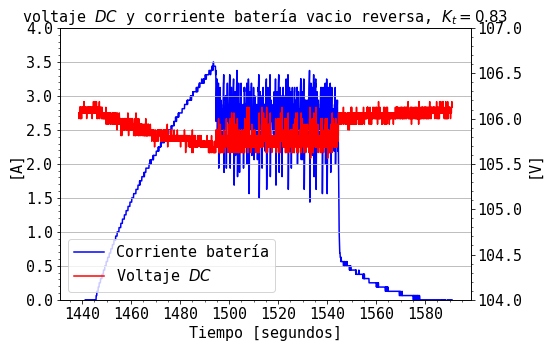

In [ ]:
d_DIRECTA = 'master_slave_UD_650_5_0_rev_250222_124537.csv'
tm = Ts(d_DIRECTA)[7500:]    #[4000:8000]#[5600:9700]
dF_DIRECTA = lect_var(d_DIRECTA)[7500:]    #[4000:8000]#[5600:9700]

# d_REVERSA = 'master_slave_UD_650_5_0_rev_250222_124537.csv'
# tm = Ts(d_REVERSA)[7500:]   #[4000:8000]#[5600:9700]
# dF_REVERSA = lect_var(d_REVERSA)[7500:]   #[4000:8000]#[5600:9700]

plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax1.set_ylim(0, 4)
ax2.set_ylim(104, 107)
ax1.set_title("voltaje $DC$ y corriente batería vacio reversa, $K_{t} = 0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[A]", fontsize=15)
ax2.set_ylabel("[V]", fontsize=15)
line1, = ax1.plot(tm, (dF_DIRECTA['1. Battery Current A (0.0625)']), color='blue', label="Corriente batería")
line2, = ax2.plot(tm, (dF_DIRECTA['1. Battery Voltage V (0.0625)']), color='red', label="Voltaje $DC$")
line1.set_zorder(-1)
line2.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)

lns = [line1, line2]
ax1.legend(handles=lns, loc='lower left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')
ax2.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

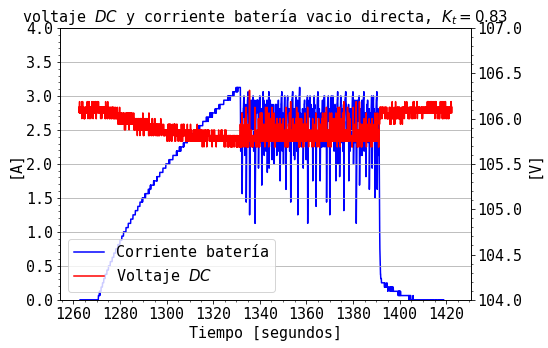

In [ ]:
d_DIRECTA = 'master_slave_UD_650_5_0_dir_250222_124248.csv'
tm = Ts(d_DIRECTA)[3450:]   #[4000:8000]#[5600:9700]
dF_DIRECTA = lect_var(d_DIRECTA)[3450:]   #[4000:8000]#[5600:9700]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax1.set_ylim(0, 4)
ax2.set_ylim(104, 107)
ax1.set_title("voltaje $DC$ y corriente batería vacio directa, $K_{t} = 0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[A]", fontsize=15)
ax2.set_ylabel("[V]", fontsize=15)
line1, = ax1.plot(tm, (dF_DIRECTA['1. Battery Current A (0.0625)']), color='blue', label="Corriente batería")
line2, = ax2.plot(tm, (dF_DIRECTA['1. Battery Voltage V (0.0625)']), color='red', label="Voltaje $DC$")
line1.set_zorder(-1)
line2.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)

lns = [line1, line2]
ax1.legend(handles=lns, loc='lower left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')
ax2.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

taco1

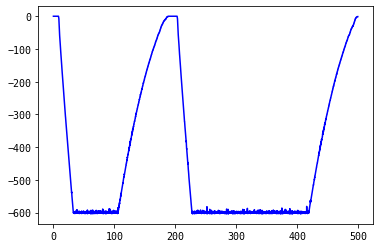

In [ ]:
d_REVERSA600 = 'master_slave_600_10_050322_123234.csv'
tm600 = Ts(d_REVERSA600)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_REVERSA600 = lect_var(d_REVERSA600)#[12000:16200]   #[4000:8000]#[5600:9700]]
plt.plot(tm600, dF_REVERSA600['1. Velocity RPM (1)'], color='blue', label="Velocidad limite 200[RPM] Maestro")


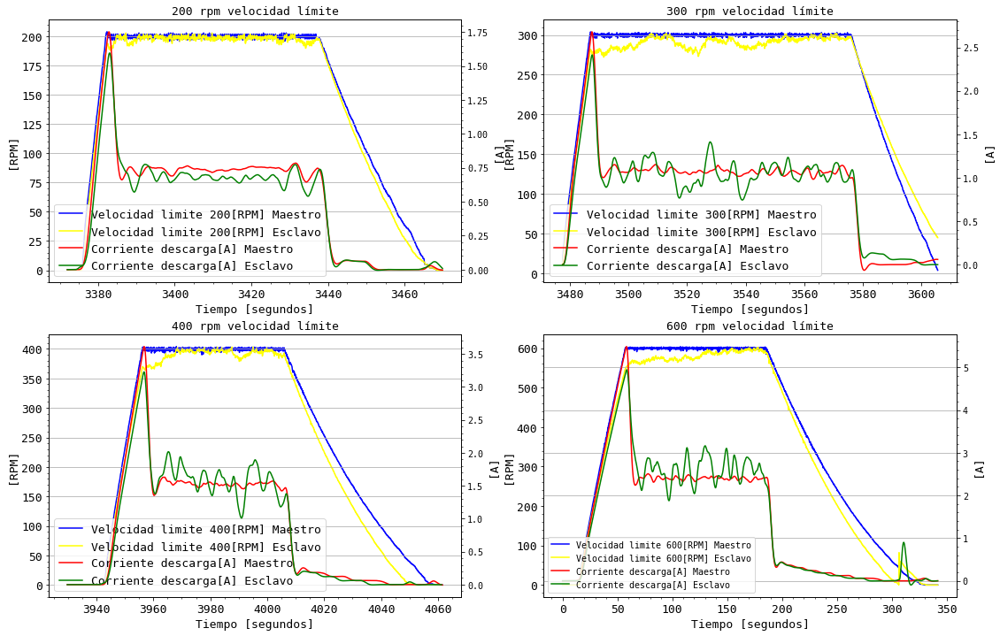

In [ ]:
d_REVERSA300 = 'master_slave_400_10_050322_122018.csv'
tm300 = Ts(d_REVERSA300)[4600:6300]   #[4000:8000]#[5600:9700]
dF_REVERSA300 = lect_var(d_REVERSA300)[4600:6300]   #[4000:8000]#[5600:9700]]
# plt.plot(tm300, abs(dF_REVERSA300['1. Velocity RPM (1)']))
# plt.plot(tm300, abs(dF_REVERSA300['2. Velocity RPM (1)']))
d_REVERSA200 = 'master_slave_400_10_050322_122018.csv'
tm200 = Ts(d_REVERSA200)[3200:4500]   #[4000:8000]#[5600:9700]
dF_REVERSA200 = lect_var(d_REVERSA200)[3200:4500]   #[4000:8000]#[5600:9700]]
# plt.plot(tm200, (abs(dF_REVERSA200['1. Velocity RPM (1)'])))
# plt.plot(tm200, (abs(dF_REVERSA200['2. Velocity RPM (1)'])))


d_REVERSA400 = 'master_slave_400_10_050322_122018.csv'
tm400= Ts(d_REVERSA400)[10600:]   #[4000:8000]#[5600:9700]
dF_REVERSA400 = lect_var(d_REVERSA400)[10600:]   #[4000:8000]#[5600:9700]]
# plt.plot((abs(dF_REVERSA['1. Velocity RPM (1)'])))
# plt.plot((abs(dF_REVERSA['2. Velocity RPM (1)'])))

# plt.plot(tm400, (abs(dF_REVERSA400['1. Velocity RPM (1)'])))
# plt.plot(tm400, (abs(dF_REVERSA400['2. Velocity RPM (1)'])))
d_REVERSA600 = 'master_slave_600_10_050322_123017.csv'
tm600 = Ts(d_REVERSA600)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_REVERSA600 = lect_var(d_REVERSA600)#[12000:16200]   #[4000:8000]#[5600:9700]]
# plt.plot(tm600, (abs(dF_REVERSA600['1. Velocity RPM (1)'])))
# plt.plot(tm600, (abs(dF_REVERSA600['2. Velocity RPM (1)'])))

fig, ((ax1, ax3), (ax4, ax5)) = plt.subplots(2, 2, figsize=(30, 12))
plt.title('Ensayo en vacío tacómetro')
ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax1.set_title("200 rpm velocidad límite", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[RPM]", fontsize=15)
ax2.set_ylabel("[A]", fontsize=15)

# butter_lowpass_filter(abs(np.asarray(dF_REVERSA['1. Battery Voltage V (0.0625)'])), 3, 200, 3)
# plt.plot(tm_prueba0, butter_lowpass_filter((dF_prueba0['1. Ud V (0.0625)']), 3, 200, 3), color='red', label="Corriente batería")

line1, = ax1.plot(tm200, abs(dF_REVERSA200['1. Velocity RPM (1)']), color='blue', label="Velocidad limite 200[RPM] Maestro")
line5, = ax1.plot(tm200, abs(dF_REVERSA200['2. Velocity RPM (1)']), color='yellow', label="Velocidad limite 200[RPM] Esclavo")
line25, = ax2.plot(tm200, butter_lowpass_filter(abs(np.asarray(dF_REVERSA200['1. Battery Current A (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
line35, = ax2.plot(tm200, butter_lowpass_filter(abs(np.asarray(dF_REVERSA200['2. Battery Current A (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
# line25, = ax2.plot(tm200, butter_lowpass_filter(abs(np.asarray(dF_REVERSA200['1. Ud V (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
# line35, = ax2.plot(tm200, butter_lowpass_filter(abs(np.asarray(dF_REVERSA200['2. Ud V (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
line1.set_zorder(-1)
line2.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
lns = [line1, line5, line25, line35]
ax1.legend(handles=lns, loc='lower left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')

ax9 = ax3.twinx()
fig.subplots_adjust(right=0.6)
ax3.set_title("300 rpm velocidad límite", fontsize=13)    
ax3.set_xlabel("Tiempo [segundos]", fontsize=13)
ax3.set_ylabel("[RPM]", fontsize=13)
ax9.set_ylabel("[A]", fontsize=13)
line19, = ax3.plot(tm300, (abs(dF_REVERSA300['1. Velocity RPM (1)'])), color='blue', label="Velocidad limite 300[RPM] Maestro")
line53, = ax3.plot(tm300, (abs(dF_REVERSA300['2. Velocity RPM (1)'])), color='yellow', label="Velocidad limite 300[RPM] Esclavo")
line119, = ax9.plot(tm300, butter_lowpass_filter(abs(np.asarray(dF_REVERSA300['1. Battery Current A (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
line153, = ax9.plot(tm300, butter_lowpass_filter(abs(np.asarray(dF_REVERSA300['2. Battery Current A (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
line19.set_zorder(-1)
line53.set_zorder(-1)
ax3.minorticks_on()
ax9.minorticks_on()
ax3.tick_params(axis='x', labelsize=13)
ax3.tick_params(axis='y', labelsize=13)
lns = [line19, line53, line119, line153]
ax3.legend(handles=lns, loc='lower left',  prop={'size': 13})
ax3.grid(axis='y', which='major')
ax9.grid(axis='x', which='major')

ax10 = ax4.twinx()
fig.subplots_adjust(right=0.6)
ax4.set_title("400 rpm velocidad límite", fontsize=13)    
ax4.set_xlabel("Tiempo [segundos]", fontsize=13)
ax4.set_ylabel("[RPM]", fontsize=13)
ax10.set_ylabel("[A]", fontsize=13)
line11, = ax4.plot(tm400, (abs(dF_REVERSA400['1. Velocity RPM (1)'])), color='blue', label="Velocidad limite 400[RPM] Maestro")
line51, = ax4.plot(tm400, (abs(dF_REVERSA400['2. Velocity RPM (1)'])), color='yellow', label="Velocidad limite 400[RPM] Esclavo")
line511, = ax10.plot(tm400, butter_lowpass_filter(abs(np.asarray(dF_REVERSA400['1. Battery Current A (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
line512, = ax10.plot(tm400, butter_lowpass_filter(abs(np.asarray(dF_REVERSA400['2. Battery Current A (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
# line511, = ax10.plot(tm400, butter_lowpass_filter(abs(np.asarray(dF_REVERSA400['1. Ud V (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
# line512, = ax10.plot(tm400, butter_lowpass_filter(abs(np.asarray(dF_REVERSA400['2. Ud V (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
line11.set_zorder(-1)
line51.set_zorder(-1)
ax4.minorticks_on()
ax10.minorticks_on()
ax4.tick_params(axis='x', labelsize=13)
ax4.tick_params(axis='y', labelsize=13)
lns = [line11, line51, line511, line512]
ax4.legend(handles=lns, loc='lower left',  prop={'size': 13})
ax4.grid(axis='y', which='major')
ax10.grid(axis='x', which='major')

ax11 = ax5.twinx()
fig.subplots_adjust(right=0.6)
ax5.set_title("600 rpm velocidad límite", fontsize=13)    
ax5.set_xlabel("Tiempo [segundos]", fontsize=13)
ax5.set_ylabel("[RPM]", fontsize=13)
ax11.set_ylabel("[A]", fontsize=13)
line14, = ax5.plot(tm600, (abs(dF_REVERSA600['1. Velocity RPM (1)'])), color='blue', label="Velocidad limite 600[RPM] Maestro")
line54, = ax5.plot(tm600, (abs(dF_REVERSA600['2. Velocity RPM (1)'])), color='yellow', label="Velocidad limite 600[RPM] Esclavo")
line541, = ax11.plot(tm600, butter_lowpass_filter(abs(np.asarray(dF_REVERSA600['1. Battery Current A (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
line542, = ax11.plot(tm600, butter_lowpass_filter(abs(np.asarray(dF_REVERSA600['2. Battery Current A (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
# line541, = ax5.plot(tm600, butter_lowpass_filter(abs(np.asarray(dF_REVERSA600['1. Ud V (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
# line541, = ax11.plot(tm600, butter_lowpass_filter(abs(np.asarray(dF_REVERSA600['2. Ud V (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
line14.set_zorder(-1)
line54.set_zorder(-1)
ax5.minorticks_on()
ax11.minorticks_on()
ax5.tick_params(axis='x', labelsize=13)
ax5.tick_params(axis='y', labelsize=13)
lns = [line14, line54,line541, line542]
ax11.legend(handles=lns, loc='lower left',  prop={'size': 10})
ax11.grid(axis='y', which='major')
ax11.grid(axis='x', which='major')
# ax2.set_zorder(1)  # default zorder is 0 for ax1 and ax2
# ax1.patch.set_visible(False)
plt.show()

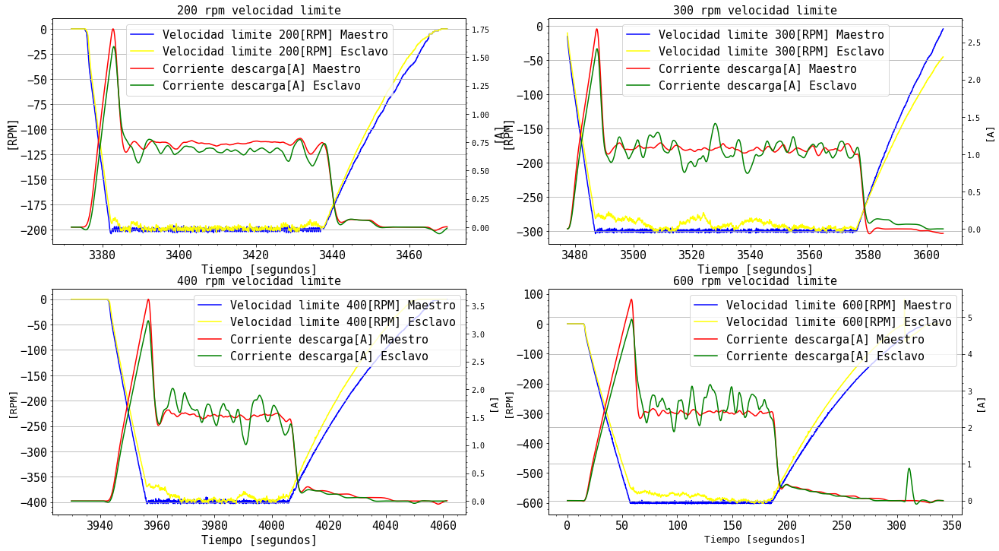

In [ ]:
d_REVERSA300 = 'master_slave_400_10_050322_122018.csv'
tm300 = Ts(d_REVERSA300)[4600:6300]   #[4000:8000]#[5600:9700]
dF_REVERSA300 = lect_var(d_REVERSA300)[4600:6300]   #[4000:8000]#[5600:9700]]
# plt.plot(tm300, abs(dF_REVERSA300['1. Velocity RPM (1)']))
# plt.plot(tm300, abs(dF_REVERSA300['2. Velocity RPM (1)']))
d_REVERSA200 = 'master_slave_400_10_050322_122018.csv'
tm200 = Ts(d_REVERSA200)[3200:4500]   #[4000:8000]#[5600:9700]
dF_REVERSA200 = lect_var(d_REVERSA200)[3200:4500]   #[4000:8000]#[5600:9700]]
# plt.plot(tm200, (abs(dF_REVERSA200['1. Velocity RPM (1)'])))
# plt.plot(tm200, (abs(dF_REVERSA200['2. Velocity RPM (1)'])))


d_REVERSA400 = 'master_slave_400_10_050322_122018.csv'
tm400= Ts(d_REVERSA400)[10600:]   #[4000:8000]#[5600:9700]
dF_REVERSA400 = lect_var(d_REVERSA400)[10600:]   #[4000:8000]#[5600:9700]]
# plt.plot((abs(dF_REVERSA['1. Velocity RPM (1)'])))
# plt.plot((abs(dF_REVERSA['2. Velocity RPM (1)'])))

# plt.plot(tm400, (abs(dF_REVERSA400['1. Velocity RPM (1)'])))
# plt.plot(tm400, (abs(dF_REVERSA400['2. Velocity RPM (1)'])))
d_REVERSA600 = 'master_slave_600_10_050322_123017.csv'
tm600 = Ts(d_REVERSA600)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_REVERSA600 = lect_var(d_REVERSA600)#[12000:16200]   #[4000:8000]#[5600:9700]]
# plt.plot(tm600, (abs(dF_REVERSA600['1. Velocity RPM (1)'])))
# plt.plot(tm600, (abs(dF_REVERSA600['2. Velocity RPM (1)'])))

fig, ((ax1, ax3), (ax4, ax5)) = plt.subplots(2, 2, figsize=(35, 12))
plt.title('Ensayo en vacío tacómetro')
ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax1.set_title("200 rpm velocidad limite", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[RPM]", fontsize=15)
ax2.set_ylabel("[A]", fontsize=15)

# butter_lowpass_filter(abs(np.asarray(dF_REVERSA['1. Battery Voltage V (0.0625)'])), 3, 200, 3)
# plt.plot(tm_prueba0, butter_lowpass_filter((dF_prueba0['1. Ud V (0.0625)']), 3, 200, 3), color='red', label="Corriente batería")

line1, = ax1.plot(tm200, (dF_REVERSA200['1. Velocity RPM (1)']), color='blue', label="Velocidad limite 200[RPM] Maestro")
line5, = ax1.plot(tm200, (dF_REVERSA200['2. Velocity RPM (1)']), color='yellow', label="Velocidad limite 200[RPM] Esclavo")
line25, = ax2.plot(tm200, butter_lowpass_filter((np.asarray(dF_REVERSA200['1. Battery Current A (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
line35, = ax2.plot(tm200, butter_lowpass_filter((np.asarray(dF_REVERSA200['2. Battery Current A (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
# line25, = ax2.plot(tm200, butter_lowpass_filter(abs(np.asarray(dF_REVERSA200['1. Ud V (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
# line35, = ax2.plot(tm200, butter_lowpass_filter(abs(np.asarray(dF_REVERSA200['2. Ud V (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
line1.set_zorder(-1)
line2.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
lns = [line1, line5, line25, line35]
ax1.legend(handles=lns, loc='best',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')

ax9 = ax3.twinx()
fig.subplots_adjust(right=0.6)
ax3.set_title("300 rpm velocidad limite", fontsize=15)    
ax3.set_xlabel("Tiempo [segundos]", fontsize=15)
ax3.set_ylabel("[RPM]", fontsize=15)
ax9.set_ylabel("[A]", fontsize=13)
line19, = ax3.plot(tm300, ((dF_REVERSA300['1. Velocity RPM (1)'])), color='blue', label="Velocidad limite 300[RPM] Maestro")
line53, = ax3.plot(tm300, ((dF_REVERSA300['2. Velocity RPM (1)'])), color='yellow', label="Velocidad limite 300[RPM] Esclavo")
line119, = ax9.plot(tm300, butter_lowpass_filter((np.asarray(dF_REVERSA300['1. Battery Current A (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
line153, = ax9.plot(tm300, butter_lowpass_filter((np.asarray(dF_REVERSA300['2. Battery Current A (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
line19.set_zorder(-1)
line53.set_zorder(-1)
ax3.minorticks_on()
ax9.minorticks_on()
ax3.tick_params(axis='x', labelsize=15)
ax3.tick_params(axis='y', labelsize=15)
lns = [line19, line53, line119, line153]
ax3.legend(handles=lns, loc='best',  prop={'size': 15})
ax3.grid(axis='y', which='major')
ax9.grid(axis='x', which='major')

ax10 = ax4.twinx()
fig.subplots_adjust(right=0.6)
ax4.set_title("400 rpm velocidad limite", fontsize=15)    
ax4.set_xlabel("Tiempo [segundos]", fontsize=15)
ax4.set_ylabel("[RPM]", fontsize=13)
ax10.set_ylabel("[A]", fontsize=13)
line11, = ax4.plot(tm400, ((dF_REVERSA400['1. Velocity RPM (1)'])), color='blue', label="Velocidad limite 400[RPM] Maestro")
line51, = ax4.plot(tm400, ((dF_REVERSA400['2. Velocity RPM (1)'])), color='yellow', label="Velocidad limite 400[RPM] Esclavo")
line511, = ax10.plot(tm400, butter_lowpass_filter((np.asarray(dF_REVERSA400['1. Battery Current A (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
line512, = ax10.plot(tm400, butter_lowpass_filter((np.asarray(dF_REVERSA400['2. Battery Current A (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
# line511, = ax10.plot(tm400, butter_lowpass_filter(abs(np.asarray(dF_REVERSA400['1. Ud V (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
# line512, = ax10.plot(tm400, butter_lowpass_filter(abs(np.asarray(dF_REVERSA400['2. Ud V (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
line11.set_zorder(-1)
line51.set_zorder(-1)
ax4.minorticks_on()
ax10.minorticks_on()
ax4.tick_params(axis='x', labelsize=15)
ax4.tick_params(axis='y', labelsize=15)
lns = [line11, line51, line511, line512]
ax4.legend(handles=lns, loc='upper right',  prop={'size': 15})
ax4.grid(axis='y', which='major')
ax10.grid(axis='x', which='major')

ax11 = ax5.twinx()
fig.subplots_adjust(right=0.6)
ax5.set_title("600 rpm velocidad limite", fontsize=15)    
ax5.set_xlabel("Tiempo [segundos]", fontsize=13)
ax5.set_ylabel("[RPM]", fontsize=13)
ax11.set_ylabel("[A]", fontsize=13)
line14, = ax5.plot(tm600, ((dF_REVERSA600['1. Velocity RPM (1)'])), color='blue', label="Velocidad limite 600[RPM] Maestro")
line54, = ax5.plot(tm600, ((dF_REVERSA600['2. Velocity RPM (1)'])), color='yellow', label="Velocidad limite 600[RPM] Esclavo")
line541, = ax11.plot(tm600, butter_lowpass_filter((np.asarray(dF_REVERSA600['1. Battery Current A (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
line542, = ax11.plot(tm600, butter_lowpass_filter((np.asarray(dF_REVERSA600['2. Battery Current A (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
# line541, = ax5.plot(tm600, butter_lowpass_filter(abs(np.asarray(dF_REVERSA600['1. Ud V (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
# line541, = ax11.plot(tm600, butter_lowpass_filter(abs(np.asarray(dF_REVERSA600['2. Ud V (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
line14.set_zorder(-1)
line54.set_zorder(-1)
ax5.minorticks_on()
ax11.minorticks_on()
ax5.tick_params(axis='x', labelsize=15)
ax5.tick_params(axis='y', labelsize=15)
lns = [line14, line54,line541, line542]
ax11.legend(handles=lns, loc='best',  prop={'size': 15})
ax11.grid(axis='y', which='major')
ax11.grid(axis='x', which='major')
plt.show()

In [ ]:
# master_slave_tito_5_120322_182310.csv
# master_slave_tito_4_120322_181918.csv
# master_slave_tito_3_120322_181557.csv
# master_slave_tito_2_120322_181217.csv
# master_slave_tito_1_120322_180724.csv
# 12-35-20220506134439-32247-data.csv
# 12-36-20220506134349-32247-data.csv
# 12-30-20220506134248-32247-data.csv


In [ ]:
dd1 = '12-35-20220506134439-32247-data.csv'
dd1 = pandas.read_csv(dd1 , sep=',')
dd2 = '12-36-20220506134349-32247-data.csv'
dd2 = pandas.read_csv(dd2 , sep=',')
dd3 = '12-30-20220506134248-32247-data.csv'
dd3 = pandas.read_csv(dd3 , sep=',')
# plt.plot(dd1['speed (km/h)'])
# plt.plot(dd2['speed (km/h)'])
# plt.plot(dd3['speed (km/h)'])
# plt.plot(TE1)

In [ ]:
print(len(dd1['speed (km/h)']))
print(len(dd2['speed (km/h)']))
print(len(dd3['speed (km/h)']))

123
130
120


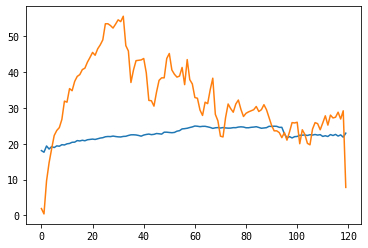

In [ ]:


from scipy import signal
d = int(len(dd3['speed (km/h)']))
Te1 =  abs(Rpm2KmHrs(dF_p['1. Velocity RPM (1)'][:10690]))
Te1 = Te1[~np.isnan(Te1)]
TE1= signal.resample(Te1, d)
plt.plot(TE1)
plt.plot(dd3['speed (km/h)'])

In [ ]:

from scipy import signal
d = int(len(dd2['speed (km/h)']))
Te1 =  abs(Rpm2KmHrs(dF_p['1. Velocity RPM (1)'][11401:18000]))
Te1 = Te1[~np.isnan(Te1)]
TE1= signal.resample(Te1, d)
plt.plot(TE1)
plt.plot(dd2['speed (km/h)'])

ValueError: invalid number of data points (0) specified

In [ ]:

from scipy import signal
d = int(len(dd1['speed (km/h)']))
Te1 =  abs(Rpm2KmHrs(dF_p['1. Velocity RPM (1)'][19300:26000]))
Te1 = Te1[~np.isnan(Te1)]
TE1= signal.resample(Te1, d)
plt.plot(TE1)
plt.plot(dd1['speed (km/h)'])


ValueError: invalid number of data points (0) specified

In [ ]:
dd1 = '12-35-20220506134439-32247-data.csv'
dd1 = pandas.read_csv(dd1 , sep=',')
dd2 = '12-36-20220506134349-32247-data.csv'
dd2 = pandas.read_csv(dd2 , sep=',')
dd3 = '12-30-20220506134248-32247-data.csv'
dd3 = pandas.read_csv(dd3 , sep=',')

In [ ]:
from scipy import signal

d = int(len(dd1['speed (km/h)']))
Te1 =  abs(Rpm2KmHrs(dF_p['1. Velocity RPM (1)'][19300:26000]))
Te1 = Te1[~np.isnan(Te1)]
TE1= signal.resample(Te1, d)


# d = int(len(dd2['speed (km/h)']))
# Te1 =  abs(Rpm2KmHrs(dF_p['1. Velocity RPM (1)'][11401:18000]))
# Te1 = Te1[~np.isnan(Te1)]
# TE2= signal.resample(Te1, d)



# d = int(len(dd3['speed (km/h)']))
# Te1 =  abs(Rpm2KmHrs(dF_p['1. Velocity RPM (1)'][:10690]))
# Te1 = Te1[~np.isnan(Te1)]
# TE3= signal.resample(Te1, d)

# import matplotlib.pyplot as plt
# import numpy as np

# plt.rcParams["font.family"] = "monospace"
# fig, ax1 = plt.subplots(figsize=(15,5))

# fig.subplots_adjust(right=0.6)

# ax1.set_title("Estimacion de velocidad mecánica en pista", fontsize=13)    
# ax1.set_xlabel("Tiempo [segundos]", fontsize=13)
# ax1.set_ylabel("[Km/hrs]", fontsize=13)
# line1, = ax1.plot(TE1, color='red',linewidth=2, label="$V[Km/hrs]$ invesor ensayo 1")
# line2, = ax1.plot(dd1['speed (km/h)'],linewidth=0.9, color='tomato', label="$V[Km/hrs]$ GPS ensayo 1")

# line3, = ax1.plot(TE2, color='blue',linewidth=2, label="$V[Km/hrs]$ inversor ensayo 2")
# line4, = ax1.plot(dd2['speed (km/h)'],linewidth=0.9, color='royalblue', label="$V[Km/hrs]$ GPS ensayo 2")

# line5, = ax1.plot(TE3, color='green',linewidth=2, label="$V[Km/hrs]$ inversor ensayo 3")
# line6, = ax1.plot(dd3['speed (km/h)'], color='lime',linewidth=0.9, label="$V[Km/hrs]$ GPS ensayo 3")


# line3.set_zorder(-1)
# ax1.minorticks_on()

# ax1.tick_params(axis='x', labelsize=13)
# ax1.tick_params(axis='y', labelsize=13)
# lns = [line1, line2, line3,line4, line5, line6]
# ax1.legend(handles=lns, loc='lower left',  prop={'size': 11})
# ax1.grid(axis='y', which='major')
# ax1.grid(axis='x', which='major')

# ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
# ax1.patch.set_visible(False)
# plt.show()

ValueError: invalid number of data points (0) specified

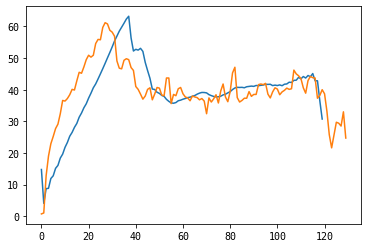

In [ ]:
)
# plt.plot(TE1)
# plt.plot(dd2['speed (km/h)'])


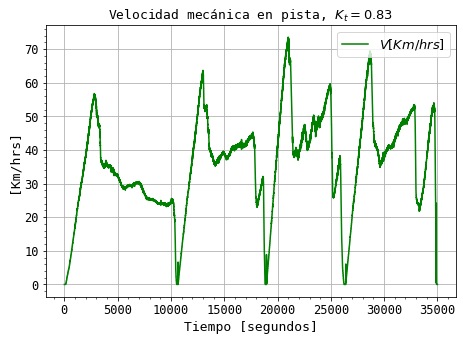

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# master_slave_tito_5_120322_182310.csv
# master_slave_tito_4_120322_181918.csv
# master_slave_tito_3_120322_181557.csv
# master_slave_tito_2_120322_181217.csv
# master_slave_tito_1_120322_180724.csv
p = 'master_slave_tito_5_120322_182310.csv'
tm_p= Ts(p)
dF_p = lect_var(p)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))

fig.subplots_adjust(right=0.6)

ax1.set_title("Velocidad mecánica en pista, $K_{t} = 0.83$", fontsize=13)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=13)
ax1.set_ylabel("[Km/hrs]", fontsize=13)
line1, = ax1.plot(abs(Rpm2KmHrs(dF_p['1. Velocity RPM (1)'][:])), color='green', label="$V[Km/hrs]$")

line3.set_zorder(-1)
ax1.minorticks_on()

ax1.tick_params(axis='x', labelsize=12)
ax1.tick_params(axis='y', labelsize=12)
lns = [line1]
ax1.legend(handles=lns, loc='upper right',  prop={'size': 13})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
plt.show()

MAESTRO Y ESCLAVO

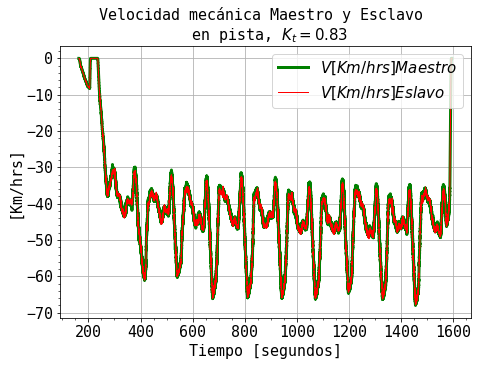

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'

tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))

fig.subplots_adjust(right=0.6)

ax1.set_title("Velocidad mecánica Maestro y Esclavo \n en pista, $K_{t} = 0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[Km/hrs]", fontsize=15)

line1, = ax1.plot(tm_p, (Rpm2KmHrs(dF_p['1. Velocity RPM (1)'])),linewidth=3, color='green', label="$V[Km/hrs] Maestro$")
line2, = ax1.plot(tm_p, (Rpm2KmHrs(dF_p['2. Velocity RPM (1)'])),linewidth=1, color='red', label="$V[Km/hrs] Eslavo$")

line3.set_zorder(-1)
ax1.minorticks_on()

ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)

lns = [line1, line2]
ax1.legend(handles=lns, loc='upper right',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
# ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

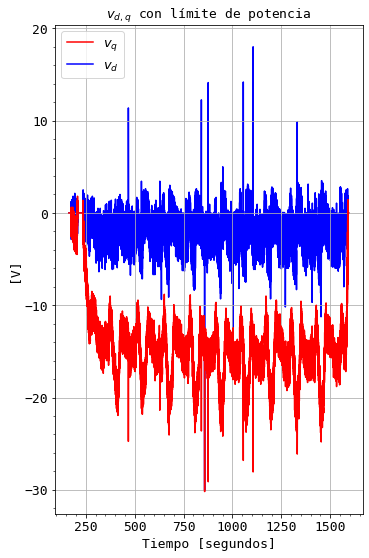

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'
tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
# d_DIRECTA = 'master_slave_UD_650_5_0_dir_250222_124248.csv'
# tm = Ts(d_DIRECTA)[3400:]   #[4000:8000]#[5600:9700]
# dF_DIRECTA = lect_var(d_DIRECTA)[3400:]   #[4000:8000]#[5600:9700]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(9,9))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
# ax1.set_title("Corriente y tensión $DC$ en ensayo en pista con límite de potencia", fontsize=12)    
# ax1.set_xlabel("Tiempo [segundos]", fontsize=12)

ax1.set_title("$v_{d,q}$ con límite de potencia", fontsize=13)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=13)
ax1.set_ylabel("[V]", fontsize=13)
# ax2.set_ylabel("[V]", fontsize=10)
# ax1.set_ylim(-6, 22)
# ax2.set_ylim(-6, 30)
# line1, = ax1.plot(tm, abs(Rpm2KmHrs(dF_p['1. Velocity RPM (1)'])), color='green', label="$V[Km/hrs]$")
line2, = ax1.plot(tm_p, dF_p['2. Uq V (0.0625)'], color='red', label="$v_{q}$")
line3, = ax1.plot(tm_p, dF_p['2. Ud V (0.0625)'], color='blue', label="$v_{d}$")
line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=13)
ax1.tick_params(axis='y', labelsize=13)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line3]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 13})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
plt.show()

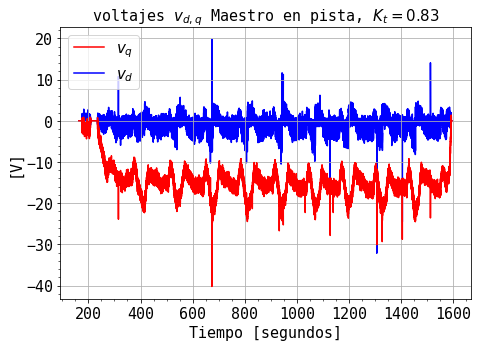

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'
tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
# d_DIRECTA = 'master_slave_UD_650_5_0_dir_250222_124248.csv'
# tm = Ts(d_DIRECTA)[3400:]   #[4000:8000]#[5600:9700]
# dF_DIRECTA = lect_var(d_DIRECTA)[3400:]   #[4000:8000]#[5600:9700]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
# ax1.set_title("Corriente y tensión $DC$ en ensayo en pista con límite de potencia", fontsize=12)    
# ax1.set_xlabel("Tiempo [segundos]", fontsize=12)

ax1.set_title("voltajes $v_{d,q}$ Maestro en pista, $K_{t} = 0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[V]", fontsize=15)
# ax2.set_ylabel("[V]", fontsize=10)
# ax1.set_ylim(-6, 22)
# ax2.set_ylim(-6, 30)
# line1, = ax1.plot(tm, abs(Rpm2KmHrs(dF_p['1. Velocity RPM (1)'])), color='green', label="$V[Km/hrs]$")
line2, = ax1.plot(tm_p, dF_p['1. Uq V (0.0625)'], color='red', label="$v_{q}$")
line3, = ax1.plot(tm_p, dF_p['1. Ud V (0.0625)'], color='blue', label="$v_{d}$")
line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line3]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

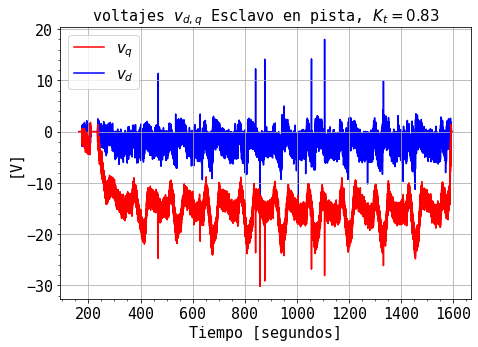

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'
tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
# d_DIRECTA = 'master_slave_UD_650_5_0_dir_250222_124248.csv'
# tm = Ts(d_DIRECTA)[3400:]   #[4000:8000]#[5600:9700]
# dF_DIRECTA = lect_var(d_DIRECTA)[3400:]   #[4000:8000]#[5600:9700]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
# ax1.set_title("Corriente y tensión $DC$ en ensayo en pista con límite de potencia", fontsize=12)    
# ax1.set_xlabel("Tiempo [segundos]", fontsize=12)

ax1.set_title("voltajes $v_{d,q}$ Esclavo en pista, $K_{t} = 0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[V]", fontsize=15)
# ax2.set_ylabel("[V]", fontsize=10)
# ax1.set_ylim(-6, 22)
# ax2.set_ylim(-6, 30)
# line1, = ax1.plot(tm, abs(Rpm2KmHrs(dF_p['1. Velocity RPM (1)'])), color='green', label="$V[Km/hrs]$")
line2, = ax1.plot(tm_p, dF_p['2. Uq V (0.0625)'], color='red', label="$v_{q}$")
line3, = ax1.plot(tm_p, dF_p['2. Ud V (0.0625)'], color='blue', label="$v_{d}$")
line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line3]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.patch.set_visible(False)

plt.show()

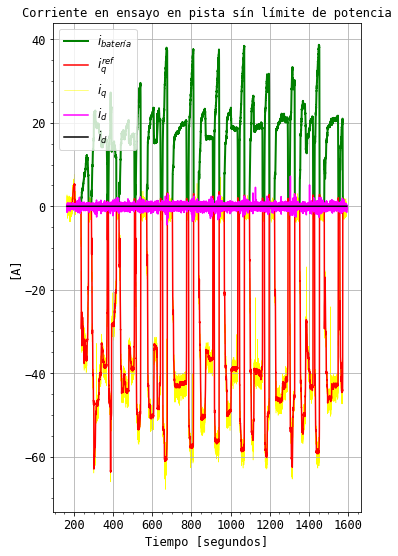

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'

tm_p= Ts(p)#[:3000]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[:3000]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(9,9))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)

# ax4.set_ylim(0, 240)
ax1.set_title("Corriente en ensayo en pista sín límite de potencia", fontsize=12)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=12)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
ax1.set_ylabel("[A]", fontsize=12)
line2, = ax1.plot(tm_p, (dF_p['1. Battery Current A (0.0625)']),linewidth=2, color='green', label="$i_{batería}$")
line3, = ax1.plot(tm_p, (dF_p['1. Iq A (0.0625)']), color='yellow',linewidth=0.5, label="$i_{q}$")
line4, = ax1.plot(tm_p, (butter_lowpass_filter(dF_p['1. Target Iq A (0.0625)'], 3, 100, 3)), color='red', label="$i^{ref}_{q}$")
line7, = ax1.plot(tm_p, butter_lowpass_filter((dF_p['1. Id A (0.0625)']), 3, 50, 3), color='magenta', label="$i_{d}$")
line7, = ax1.plot(tm_p, butter_lowpass_filter((dF_p['1. Target Id A (0.0625)']), 3, 50, 3), color='black', label="$i_{d}$")

line3.set_zorder(-1)
line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=12)
ax1.tick_params(axis='y', labelsize=12)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line4, line3, line6, line7]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 12})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')

plt.show()

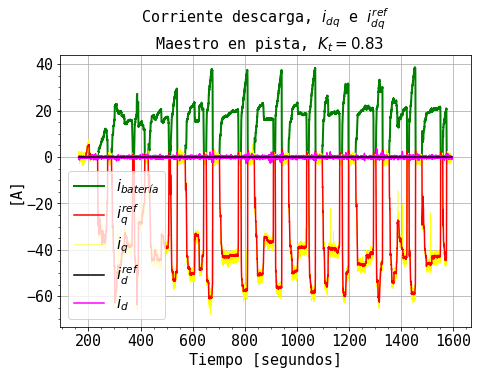

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'
tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)

# ax4.set_ylim(0, 240)
ax1.set_title("Corriente descarga, $i_{dq}$ e $i^{ref}_{dq}$ \n Maestro en pista, $K_{t}=0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
ax1.set_ylabel("[A]", fontsize=15)
line2, = ax1.plot(tm_p, (dF_p['1. Battery Current A (0.0625)']),linewidth=2, color='green', label="$i_{batería}$")
line3, = ax1.plot(tm_p, (dF_p['1. Iq A (0.0625)']), color='yellow',linewidth=0.5, label="$i_{q}$")
line4, = ax1.plot(tm_p, (butter_lowpass_filter(dF_p['1. Target Iq A (0.0625)'], 3, 100, 3)), color='red', label="$i^{ref}_{q}$")
line7, = ax1.plot(tm_p, butter_lowpass_filter((dF_p['1. Id A (0.0625)']), 3, 100, 3), color='magenta', label="$i_{d}$")
line6, = ax1.plot(tm_p, (dF_p['1. Target Id A (0.0625)']), color='black', label="$i^{ref}_{d}$")
# ax3.set_ylabel("[Nm]", fontsize=12)
# ax4.set_ylabel("[A]", fontsize=10)
# line1, = ax1.plot(tm_p, Rpm2KmHrs(abs(dF_p['1. Velocity RPM (1)'])),linewidth=3, color='red', label="Velocidad")
# line4, = ax1.plot(tm_p, -abs(dF_p['1. Torque demand value Nm (0.0625)']), color='yellow',linewidth=0.5,  label="$T^{ref}_{em}$")
# line5, = ax1.plot(tm_p, -abs(dF_p['1. Torque actual value Nm (0.0625)']), color='blue',linewidth=1,  label="$T_{em}$")
# line5, = ax1.plot(tm_p, abs(dF_p['1. Iq A (0.0625)']), color='red', label="Corriente batería")
# plt.plot(tm_p, butter_lowpass_filter(abs(dF_p['1. Iq A (0.0625)']), 3, 200, 3), color='red', label="Corriente batería")
# line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
# lns = [line4, line5]
lns = [line2, line4, line3, line6, line7]
ax1.legend(handles=lns, loc='best',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.patch.set_visible(False)

plt.show()

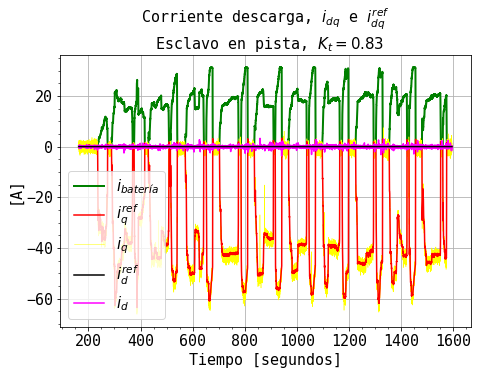

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'
tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)

# ax4.set_ylim(0, 240)
ax1.set_title("Corriente descarga, $i_{dq}$ e $i^{ref}_{dq}$ \n Esclavo en pista, $K_{t}=0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
ax1.set_ylabel("[A]", fontsize=15)
line2, = ax1.plot(tm_p, (dF_p['2. Battery Current A (0.0625)']),linewidth=2, color='green', label="$i_{batería}$")
line3, = ax1.plot(tm_p, (dF_p['2. Iq A (0.0625)']), color='yellow',linewidth=0.5, label="$i_{q}$")
line4, = ax1.plot(tm_p, (butter_lowpass_filter(dF_p['2. Target Iq A (0.0625)'], 3, 100, 3)), color='red', label="$i^{ref}_{q}$")
line7, = ax1.plot(tm_p, butter_lowpass_filter((dF_p['2. Id A (0.0625)']), 3, 100, 3), color='magenta', label="$i_{d}$")
line6, = ax1.plot(tm_p, (dF_p['2. Target Id A (0.0625)']), color='black', label="$i^{ref}_{d}$")
# ax3.set_ylabel("[Nm]", fontsize=12)
# ax4.set_ylabel("[A]", fontsize=10)
# line1, = ax1.plot(tm_p, Rpm2KmHrs(abs(dF_p['1. Velocity RPM (1)'])),linewidth=3, color='red', label="Velocidad")
# line4, = ax1.plot(tm_p, -abs(dF_p['1. Torque demand value Nm (0.0625)']), color='yellow',linewidth=0.5,  label="$T^{ref}_{em}$")
# line5, = ax1.plot(tm_p, -abs(dF_p['1. Torque actual value Nm (0.0625)']), color='blue',linewidth=1,  label="$T_{em}$")
# line5, = ax1.plot(tm_p, abs(dF_p['1. Iq A (0.0625)']), color='red', label="Corriente batería")
# plt.plot(tm_p, butter_lowpass_filter(abs(dF_p['1. Iq A (0.0625)']), 3, 200, 3), color='red', label="Corriente batería")
# line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
# lns = [line4, line5]
lns = [line2, line4, line3, line6, line7]
ax1.legend(handles=lns, loc='best',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.patch.set_visible(False)

plt.show()

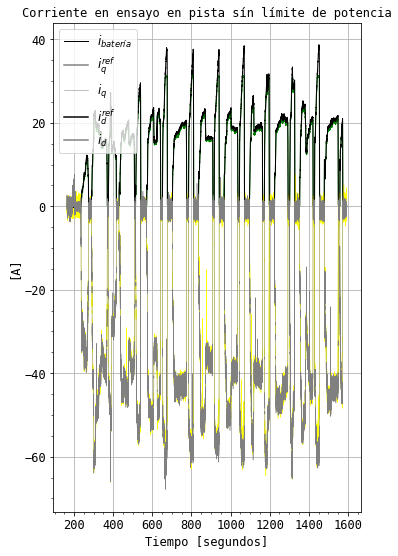

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'

tm_p= Ts(p)#[:3000]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[:3000]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(9,9))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)

# ax4.set_ylim(0, 240)
ax1.set_title("Corriente en ensayo en pista sín límite de potencia", fontsize=12)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=12)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
ax1.set_ylabel("[A]", fontsize=12)
line2, = ax1.plot(tm_p, (dF_p['2. Battery Current A (0.0625)']),linewidth=1, color='green', label="$i_{batería}$")
line3, = ax1.plot(tm_p, (dF_p['2. Iq A (0.0625)']), color='yellow',linewidth=0.5, label="$i_{q}$")
# line4, = ax1.plot(tm_p, (butter_lowpass_filter(dF_p['2. Target Iq A (0.0625)'], 3, 100, 3)), color='red', label="$i^{ref}_{q}$")
# line7, = ax1.plot(tm_p, butter_lowpass_filter((dF_p['2. Id A (0.0625)']), 3, 50, 3), color='magenta', label="$i_{d}$")
# line7, = ax1.plot(tm_p, butter_lowpass_filter((dF_p['2. Target Id A (0.0625)']), 3, 50, 3), color='black', label="$i_{d}$")
line2, = ax1.plot(tm_p, (dF_p['1. Battery Current A (0.0625)']),linewidth=1, color='black', label="$i_{batería}$")
line3, = ax1.plot(tm_p, (dF_p['1. Iq A (0.0625)']), color='grey',linewidth=0.5, label="$i_{q}$")
# line4, = ax1.plot(tm_p, (butter_lowpass_filter(dF_p['1. Target Iq A (0.0625)'], 3, 100, 3)), color='grey', label="$i^{ref}_{q}$")
# line7, = ax1.plot(tm_p, butter_lowpass_filter((dF_p['1. Id A (0.0625)']), 3, 50, 3), color='grey', label="$i_{d}$")
# line7, = ax1.plot(tm_p, butter_lowpass_filter((dF_p['1. Target Id A (0.0625)']), 3, 50, 3), color='grey', label="$i_{d}$")
# # line3.set_zorder(-1)
line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=12)
ax1.tick_params(axis='y', labelsize=12)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line4, line3, line6, line7]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 12})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')

plt.show()

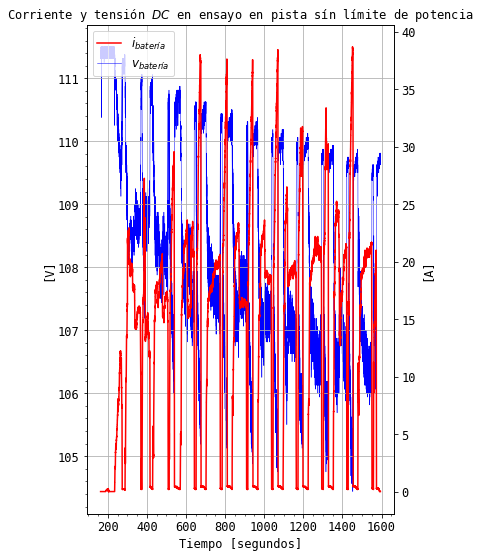

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

p = 'master_slave_pancho_1_120322_175724.csv'
tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(9,9))
ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("Corriente y tensión $DC$ en ensayo en pista sín límite de potencia", fontsize=12)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=12)
ax1.set_ylabel("[V]", fontsize=12)
ax2.set_ylabel("[A]", fontsize=12)
line3, = ax1.plot(tm_p, abs(dF_p['1. Battery Voltage V (0.0625)']), color='blue',linewidth=0.5, label="$v_{batería}$")
line2, = ax2.plot(tm_p, abs(dF_p['1. Battery Current A (0.0625)']),linewidth=1.5, color='red', label="$i_{batería}$")
line3.set_zorder(-1)
line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=12)
ax1.tick_params(axis='y', labelsize=12)
ax2.tick_params(axis='x', labelsize=12)
ax2.tick_params(axis='y', labelsize=12)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line3]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 12})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')

plt.show()

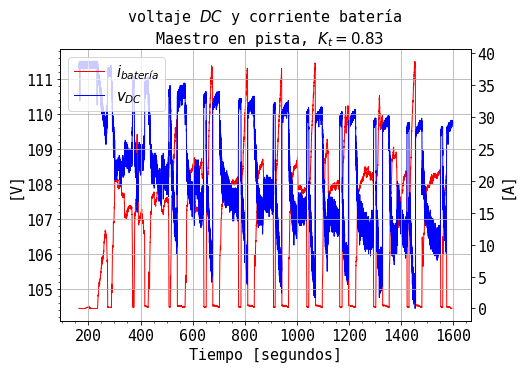

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'
tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)

ax1.set_title("voltaje $DC$ y corriente batería \n Maestro en pista, $K_{t} = 0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)

ax1.set_ylabel("[V]", fontsize=15)
ax2.set_ylabel("[A]", fontsize=15)
line3, = ax1.plot(tm_p, abs(dF_p['1. Battery Voltage V (0.0625)']), color='blue',linewidth=1, label="$v_{DC}$")
line2, = ax2.plot(tm_p, abs(dF_p['1. Battery Current A (0.0625)']),linewidth=1, color='red', label="$i_{batería}$")
line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line3]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

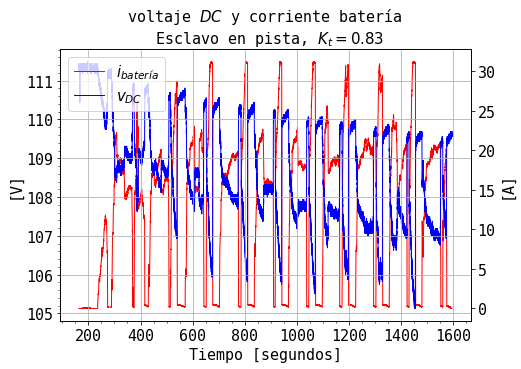

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'
tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)

ax1.set_title("voltaje $DC$ y corriente batería \n Esclavo en pista, $K_{t} = 0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)

ax1.set_ylabel("[V]", fontsize=15)
ax2.set_ylabel("[A]", fontsize=15)
line3, = ax1.plot(tm_p, abs(dF_p['2. Battery Voltage V (0.0625)']), color='blue',linewidth=1, label="$v_{DC}$")
line2, = ax2.plot(tm_p, abs(dF_p['2. Battery Current A (0.0625)']),linewidth=1, color='red', label="$i_{batería}$")
line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line3]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

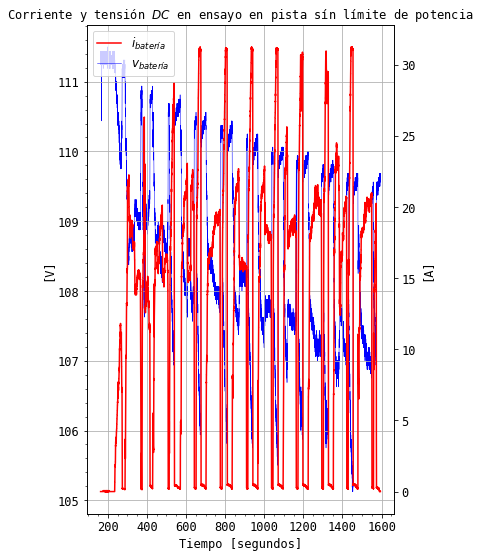

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

p = 'master_slave_pancho_1_120322_175724.csv'
tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(9,9))
ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("Corriente y tensión $DC$ en ensayo en pista sín límite de potencia", fontsize=12)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=12)
ax1.set_ylabel("[V]", fontsize=12)
ax2.set_ylabel("[A]", fontsize=12)
line3, = ax1.plot(tm_p, abs(dF_p['2. Battery Voltage V (0.0625)']), color='blue',linewidth=0.5, label="$v_{batería}$")
line2, = ax2.plot(tm_p, abs(dF_p['2. Battery Current A (0.0625)']),linewidth=1.5, color='red', label="$i_{batería}$")
line3.set_zorder(-1)
line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=12)
ax1.tick_params(axis='y', labelsize=12)
ax2.tick_params(axis='x', labelsize=12)
ax2.tick_params(axis='y', labelsize=12)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line3]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 12})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')

plt.show()

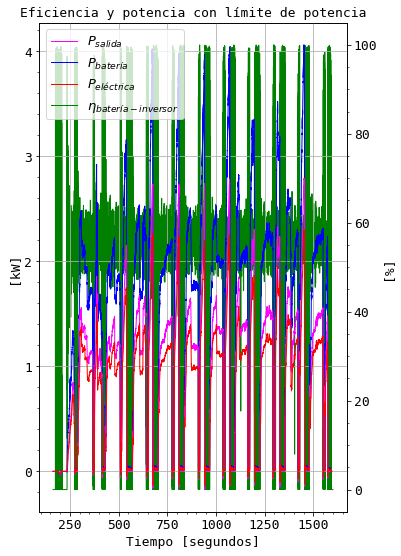

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'
# p = 'master_slave_carga_vizcachas_jose_270222_165945.csv'


tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

BatV = (np.asarray(dF_p['1. Battery Voltage V (0.0625)']))
BatI = (np.asarray(dF_p['1. Battery Current A (0.0625)']))
Iq = (np.asarray(dF_p['1. Iq A (0.0625)']))
Uq = (np.asarray(dF_p['1. Uq V (0.0625)']))
Id = (np.asarray(dF_p['1. Id A (0.0625)']))
Ud = (np.asarray(dF_p['1. Ud V (0.0625)']))


Te = (np.asarray(dF_p['1. Torque actual value Nm (0.0625)']))
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad((np.asarray(dF_p['1. Velocity RPM (1)'])))


pot_salida = Te * rad 

pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(9,9))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
ax2 = ax1.twinx()

# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(0, 120)
# ax2.set_ylim(0, 3.9)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("Eficiencia y potencia con límite de potencia", fontsize=13)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=13)
ax2.set_ylabel("[%]", fontsize=13)
ax1.set_ylabel("[kW]", fontsize=13)
line2, = ax2.plot(tm_p, (100*D[:]),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line3, = ax1.plot((butter_lowpass_filter((100*D[140000:142000]), 3, 304, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
line4, = ax1.plot(tm_p, (pin/1000),linewidth=1, color='blue', label="$P_{batería}$")
line5, = ax1.plot(tm_p, (butter_lowpass_filter((pot_salida/1000), 3, 104, 3)),linewidth=1, color='magenta', label="$P_{salida}$")
line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 204, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")
ax2.minorticks_on()
ax1.minorticks_on()
# # ax3.minorticks_on()
# # ax4.minorticks_on()
# # line2.set_zorder(-1)
# .set_zorder(-4)
# line5.set_zorder(1)
# line3.set_zorder(-1)
# line4.set_zorder(-1) 
ax1.tick_params(axis='x', labelsize=13)
ax1.tick_params(axis='y', labelsize=13)
ax2.tick_params(axis='x', labelsize=13)
ax2.tick_params(axis='y', labelsize=13)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line5, line4, line3,  line2]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 13})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
# ax2.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

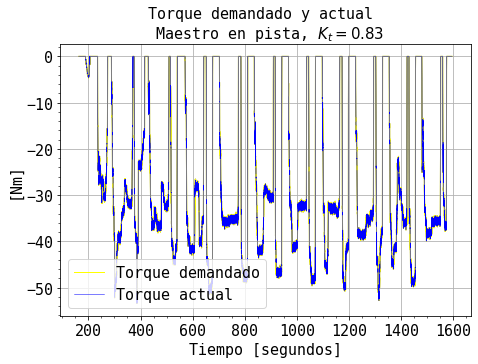

In [ ]:

import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'
tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)

# ax4.set_ylim(0, 240)
ax1.set_title("Torque demandado y actual \n Maestro en pista, $K_{t}=0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
ax1.set_ylabel("[Nm]", fontsize=15)
line2, = ax1.plot(tm_p, -abs(dF_p['1. Torque demand value Nm (0.0625)']),linewidth=1, color='gray', label="Torque demandado")
line3, = ax1.plot(tm_p, -abs(dF_p['1. Torque actual value Nm (0.0625)']), color='black',linewidth=0.5, label="Torque actual")

line2, = ax1.plot(tm_p, -abs(dF_p['1. Torque demand value Nm (0.0625)']),linewidth=1, color='yellow', label="Torque demandado")
line3, = ax1.plot(tm_p, -abs(dF_p['1. Torque actual value Nm (0.0625)']), color='blue',linewidth=0.5, label="Torque actual")
# line3, = ax1.plot((butter_lowpass_filter((100*D[140000:142000]), 3, 304, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (pin/1000),linewidth=1, color='blue', label="$P_{batería}$")
# line5, = ax1.plot(tm_p, (butter_lowpass_filter((pot_salida/1000), 3, 104, 3)),linewidth=1, color='magenta', label="$P_{salida}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 204, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")
ax2.minorticks_on()
ax1.minorticks_on()
# # ax3.minorticks_on()
# # ax4.minorticks_on()
# # line2.set_zorder(-1)
# .set_zorder(-4)
# line5.set_zorder(1)
# line3.set_zorder(-1)
# line4.set_zorder(-1) 
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line3]
ax1.legend(handles=lns, loc='best',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
# ax2.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

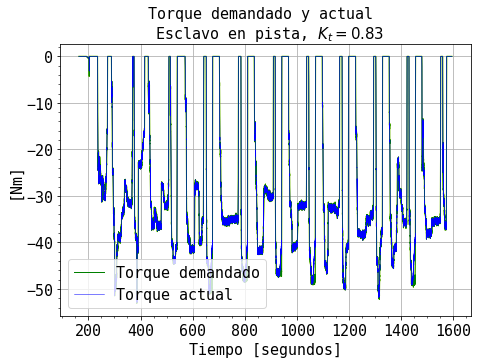

In [ ]:

import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'
tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)

# ax4.set_ylim(0, 240)
ax1.set_title("Torque demandado y actual \n Esclavo en pista, $K_{t}=0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
ax1.set_ylabel("[Nm]", fontsize=15)
line2, = ax1.plot(tm_p, -abs(dF_p['2. Torque demand value Nm (0.0625)']),linewidth=1, color='yellow', label="Torque demandado")
line3, = ax1.plot(tm_p, -abs(dF_p['2. Torque actual value Nm (0.0625)']), color='blue',linewidth=0.5, label="Torque actual")

line2, = ax1.plot(tm_p, -abs(dF_p['2. Torque demand value Nm (0.0625)']),linewidth=1, color='green', label="Torque demandado")
line3, = ax1.plot(tm_p, -abs(dF_p['2. Torque actual value Nm (0.0625)']), color='blue',linewidth=0.5, label="Torque actual")
# line3, = ax1.plot((butter_lowpass_filter((100*D[140000:142000]), 3, 304, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (pin/1000),linewidth=1, color='blue', label="$P_{batería}$")
# line5, = ax1.plot(tm_p, (butter_lowpass_filter((pot_salida/1000), 3, 104, 3)),linewidth=1, color='magenta', label="$P_{salida}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 204, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")
ax2.minorticks_on()
ax1.minorticks_on()
# # ax3.minorticks_on()
# # ax4.minorticks_on()
# # line2.set_zorder(-1)
# .set_zorder(-4)
# line5.set_zorder(1)
# line3.set_zorder(-1)
# line4.set_zorder(-1) 
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line3]
ax1.legend(handles=lns, loc='best',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
# ax2.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

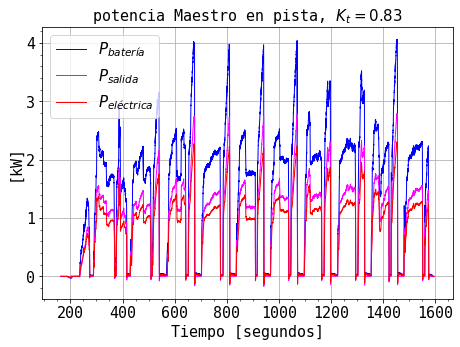

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'
# p = 'master_slave_carga_vizcachas_jose_270222_165945.csv'


tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

BatV = (np.asarray(dF_p['1. Battery Voltage V (0.0625)']))
BatI = (np.asarray(dF_p['1. Battery Current A (0.0625)']))
Iq = (np.asarray(dF_p['1. Iq A (0.0625)']))
Uq = (np.asarray(dF_p['1. Uq V (0.0625)']))
Id = (np.asarray(dF_p['1. Id A (0.0625)']))
Ud = (np.asarray(dF_p['1. Ud V (0.0625)']))


Te = (np.asarray(dF_p['1. Torque actual value Nm (0.0625)']))
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad((np.asarray(dF_p['1. Velocity RPM (1)'])))


pot_salida = Te * rad 

pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)
DS = abs(pot_salida / pin)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax2 = ax1.twinx()

# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(0, 120)
# ax2.set_ylim(0, 3.9)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("potencia Maestro en pista, $K_{t}=0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
# ax1.set_ylabel("[%]", fontsize=13)
ax1.set_ylabel("[kW]", fontsize=15)
# line2, = ax2.plot(tm_p, (100*D[:]),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line1, = ax2.plot(tm_p, (100*DS[:]),linewidth=1, color='green', label="$\eta_{batería-inversor}$")

# line3, = ax1.plot((butter_lowpass_filter((100*D[140000:142000]), 3, 304, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
line4, = ax1.plot(tm_p, (pin/1000),linewidth=1, color='blue', label="$P_{batería}$")
line5, = ax1.plot(tm_p, (butter_lowpass_filter((pot_salida/1000), 3, 104, 3)),linewidth=1, color='magenta', label="$P_{salida}$")
line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 204, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")
ax2.minorticks_on()
ax1.minorticks_on()
# # ax3.minorticks_on()
# # ax4.minorticks_on()
# # line2.set_zorder(-1)
# .set_zorder(-4)
# line5.set_zorder(1)
# line3.set_zorder(-1)
# line4.set_zorder(-1) 
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line4, line5,  line3]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
# ax2.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

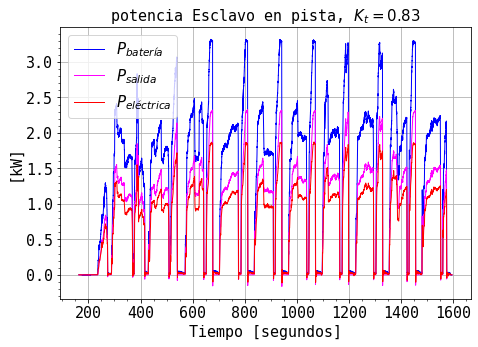

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'
# p = 'master_slave_carga_vizcachas_jose_270222_165945.csv'


tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

BatV = (np.asarray(dF_p['2. Battery Voltage V (0.0625)']))
BatI = (np.asarray(dF_p['2. Battery Current A (0.0625)']))
Iq = (np.asarray(dF_p['2. Iq A (0.0625)']))
Uq = (np.asarray(dF_p['2. Uq V (0.0625)']))
Id = (np.asarray(dF_p['2. Id A (0.0625)']))
Ud = (np.asarray(dF_p['2. Ud V (0.0625)']))


Te = (np.asarray(dF_p['2. Torque actual value Nm (0.0625)']))
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad((np.asarray(dF_p['2. Velocity RPM (1)'])))


pot_salida = Te * rad 

pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)
DS = abs(pot_salida / pin)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax2 = ax1.twinx()

# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(0, 120)
# ax2.set_ylim(0, 3.9)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("potencia Esclavo en pista, $K_{t}=0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
# ax1.set_ylabel("[%]", fontsize=13)
ax1.set_ylabel("[kW]", fontsize=15)
# line2, = ax2.plot(tm_p, (100*D[:]),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line1, = ax2.plot(tm_p, (100*DS[:]),linewidth=1, color='green', label="$\eta_{batería-inversor}$")

# line3, = ax1.plot((butter_lowpass_filter((100*D[140000:142000]), 3, 304, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
line4, = ax1.plot(tm_p, (pin/1000),linewidth=1, color='blue', label="$P_{batería}$")
line5, = ax1.plot(tm_p, (butter_lowpass_filter((pot_salida/1000), 3, 104, 3)),linewidth=1, color='magenta', label="$P_{salida}$")
line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 204, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")
ax2.minorticks_on()
ax1.minorticks_on()
# # ax3.minorticks_on()
# # ax4.minorticks_on()
# # line2.set_zorder(-1)
# .set_zorder(-4)
# line5.set_zorder(1)
# line3.set_zorder(-1)
# line4.set_zorder(-1) 
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line4, line5,  line3]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
# ax2.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

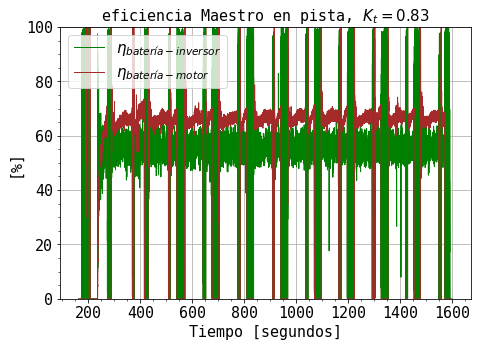

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'
# p = 'master_slave_carga_vizcachas_jose_270222_165945.csv'


tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

BatV = (np.asarray(dF_p['1. Battery Voltage V (0.0625)']))
BatI = (np.asarray(dF_p['1. Battery Current A (0.0625)']))
Iq = (np.asarray(dF_p['1. Iq A (0.0625)']))
Uq = (np.asarray(dF_p['1. Uq V (0.0625)']))
Id = (np.asarray(dF_p['1. Id A (0.0625)']))
Ud = (np.asarray(dF_p['1. Ud V (0.0625)']))


Te = (np.asarray(dF_p['1. Torque actual value Nm (0.0625)']))
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad((np.asarray(dF_p['1. Velocity RPM (1)'])))


pot_salida = Te * rad 

pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)
DS = abs(pot_salida / pin)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax2 = ax1.twinx()

# ax4.spines["right"].set_position(("axes", 1.2))
ax1.set_ylim(0, 100)
# ax2.set_ylim(0, 3.9)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("eficiencia Maestro en pista, $K_{t}=0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[%]", fontsize=15)
# ax1.set_ylabel("[kW]", fontsize=13)

line2, = ax1.plot(tm_p, (100*D[:]),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
line1, = ax1.plot(tm_p, (100*DS[:]),linewidth=1, color='brown', label="$\eta_{batería-motor}$")

# line3, = ax1.plot((butter_lowpass_filter((100*D[140000:142000]), 3, 304, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (pin/1000),linewidth=1, color='blue', label="$P_{batería}$")
# line5, = ax1.plot(tm_p, (butter_lowpass_filter((pot_salida/1000), 3, 104, 3)),linewidth=1, color='magenta', label="$P_{salida}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 204, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")
ax2.minorticks_on()
ax1.minorticks_on()
# # ax3.minorticks_on()
# # ax4.minorticks_on()
# # line2.set_zorder(-1)
# .set_zorder(-4)
# line5.set_zorder(1)
# line3.set_zorder(-1)
# line4.set_zorder(-1) 
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line1]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
# ax2.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

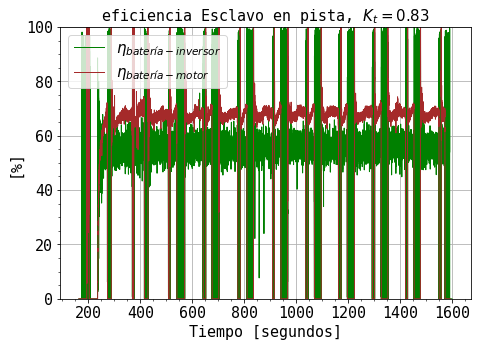

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'
# p = 'master_slave_carga_vizcachas_jose_270222_165945.csv'


tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

BatV = (np.asarray(dF_p['2. Battery Voltage V (0.0625)']))
BatI = (np.asarray(dF_p['2. Battery Current A (0.0625)']))
Iq = (np.asarray(dF_p['2. Iq A (0.0625)']))
Uq = (np.asarray(dF_p['2. Uq V (0.0625)']))
Id = (np.asarray(dF_p['2. Id A (0.0625)']))
Ud = (np.asarray(dF_p['2. Ud V (0.0625)']))


Te = (np.asarray(dF_p['2. Torque actual value Nm (0.0625)']))
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad((np.asarray(dF_p['2. Velocity RPM (1)'])))


pot_salida = Te * rad 

pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)
DS = abs(pot_salida / pin)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax2 = ax1.twinx()

# ax4.spines["right"].set_position(("axes", 1.2))
ax1.set_ylim(0, 100)
# ax2.set_ylim(0, 3.9)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("eficiencia Esclavo en pista, $K_{t}=0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[%]", fontsize=15)
# ax1.set_ylabel("[kW]", fontsize=13)

line2, = ax1.plot(tm_p, (100*D[:]),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
line1, = ax1.plot(tm_p, (100*DS[:]),linewidth=1, color='brown', label="$\eta_{batería-motor}$")

# line3, = ax1.plot((butter_lowpass_filter((100*D[140000:142000]), 3, 304, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (pin/1000),linewidth=1, color='blue', label="$P_{batería}$")
# line5, = ax1.plot(tm_p, (butter_lowpass_filter((pot_salida/1000), 3, 104, 3)),linewidth=1, color='magenta', label="$P_{salida}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 204, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")
ax2.minorticks_on()
ax1.minorticks_on()
# # ax3.minorticks_on()
# # ax4.minorticks_on()
# # line2.set_zorder(-1)
# .set_zorder(-4)
# line5.set_zorder(1)
# line3.set_zorder(-1)
# line4.set_zorder(-1) 
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line1]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
# ax2.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

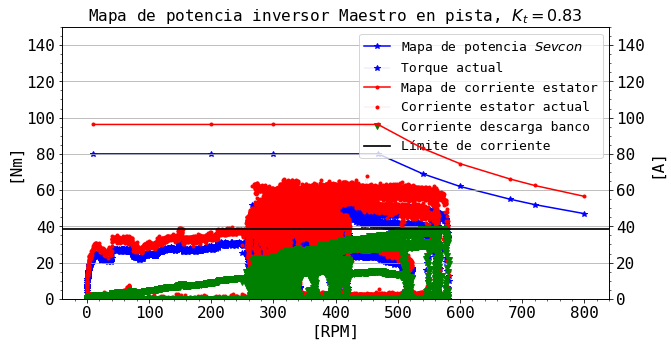

In [ ]:




import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'
# p = 'master_slave_carga_vizcachas_jose_270222_165945.csv'


# tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_REVERSA= lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

fig, ax1 = plt.subplots(figsize=(16,5))
ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax1.set_ylim(0, 150)
ax2.set_ylim(0, 150)
ax1.set_title("Mapa de potencia inversor Maestro en pista, $K_{t} = 0.83$", fontsize=16)    
ax1.set_xlabel("[RPM]", fontsize=16)
ax1.set_ylabel("[Nm]", fontsize=16)
ax2.set_ylabel("[A]", fontsize=16)
line1, = ax1.plot(abs(dF_REVERSA['1. Velocity RPM (1)']), abs(dF_REVERSA['1. Torque actual value Nm (0.0625)']), linewidth=0.09,color='blue', marker = '*', label="Torque actual")
line2, = ax1.plot(RPM_MAP, np.asarray(T_MAP), linewidth=1.5,color='blue', marker = '*', label="Mapa de potencia $Sevcon$")
line3, = ax2.plot(abs(dF_REVERSA['1. Velocity RPM (1)']), abs(dF_REVERSA['1. Iq A (0.0625)']), linewidth=0.09,color='red', marker = '.', label="Corriente estator actual")
line4, = ax2.plot(RPM_MAP, np.asarray(T_MAP) / 0.8314, linewidth=1.5,color='red', marker = '.', label="Mapa de corriente estator")
line5, = ax2.plot(abs(dF_REVERSA['1. Velocity RPM (1)']), dF_REVERSA['1. Battery Current A (0.0625)'], linewidth=0.09,color='green', marker = 'v', label="Corriente descarga banco")
l2 = ax2.axhline(y = 4e3 / 104  ,color = 'black', linestyle = '-',linewidth=1.7, label='Límite de corriente')
line1.set_zorder(-1)
line2.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
ax2.tick_params(axis='x', labelsize=16)
ax2.tick_params(axis='y', labelsize=16)
lns = [line2, line1, line4, line3, line5, l2]
ax1.legend(handles=lns, loc='upper right',  prop={'size': 13})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')
# ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
# ax1.patch.set_visible(False)
# ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

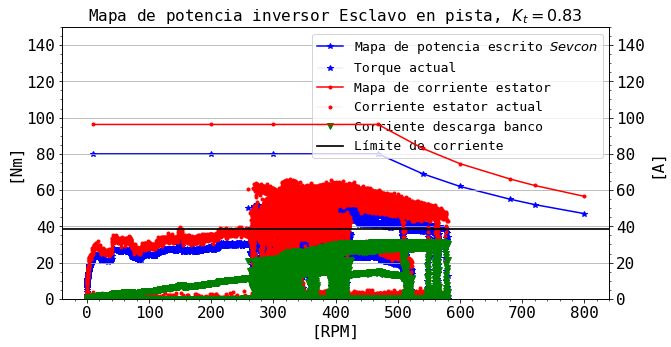

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'
# p = 'master_slave_carga_vizcachas_jose_270222_165945.csv'


# tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_REVERSA= lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

fig, ax1 = plt.subplots(figsize=(16,5))
ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax1.set_ylim(0, 150)
ax2.set_ylim(0, 150)
ax1.set_title("Mapa de potencia inversor Esclavo en pista, $K_{t} = 0.83$", fontsize=16)    
ax1.set_xlabel("[RPM]", fontsize=16)
ax1.set_ylabel("[Nm]", fontsize=16)
ax2.set_ylabel("[A]", fontsize=16)
line1, = ax1.plot(abs(dF_REVERSA['2. Velocity RPM (1)']), abs(dF_REVERSA['2. Torque actual value Nm (0.0625)']), linewidth=0.09,color='blue', marker = '*', label="Torque actual")
line2, = ax1.plot(RPM_MAP, np.asarray(T_MAP), linewidth=1.5,color='blue', marker = '*', label="Mapa de potencia escrito $Sevcon$")
line3, = ax2.plot(abs(dF_REVERSA['2. Velocity RPM (1)']), abs(dF_REVERSA['2. Iq A (0.0625)']), linewidth=0.09,color='red', marker = '.', label="Corriente estator actual")
line4, = ax2.plot(RPM_MAP, np.asarray(T_MAP) / 0.8314, linewidth=1.5,color='red', marker = '.', label="Mapa de corriente estator")
line5, = ax2.plot(abs(dF_REVERSA['2. Velocity RPM (1)']), dF_REVERSA['2. Battery Current A (0.0625)'], linewidth=0.09,color='green', marker = 'v', label="Corriente descarga banco")
l2 = ax2.axhline(y = 4e3 / 104  ,color = 'black', linestyle = '-',linewidth=1.7, label='Límite de corriente')
line1.set_zorder(-1)
line2.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
ax2.tick_params(axis='x', labelsize=16)
ax2.tick_params(axis='y', labelsize=16)
lns = [line2, line1, line4, line3, line5, l2]
ax1.legend(handles=lns, loc='upper right',  prop={'size': 13})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')
# ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
# ax1.patch.set_visible(False)
ax1.patch.set_visible(False)

plt.show()

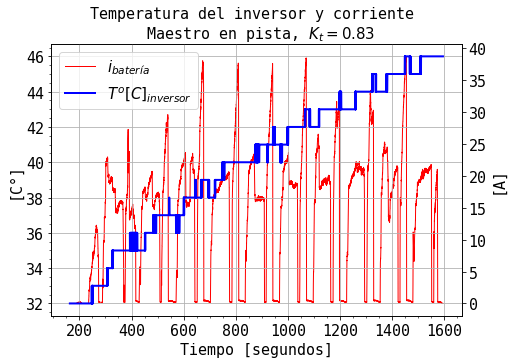

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'
tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax1.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
# ax1.set_ylim(35, 65)
# ax2.set_ylim(0, 40)
ax1.set_title("Temperatura del inversor y corriente \n Maestro en pista, $K_{t} = 0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[C°]", fontsize=15)
ax2.set_ylabel("[A]", fontsize=15)
line1, = ax1.plot(tm_p, dF_p['1. Heatsink Temperature DegC (1)'], color='blue',linewidth=2, label="$T^{o}[C]_{inversor}$")
line2, = ax2.plot(tm_p, abs(dF_p['1. Battery Current A (0.0625)']), color='red',linewidth=1, label="$i_{batería}$")
# line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line1]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

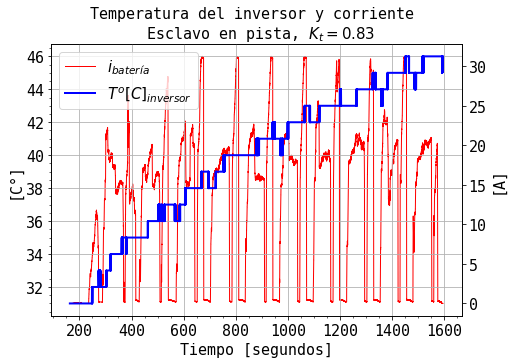

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
p = 'master_slave_pancho_1_120322_175724.csv'
tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax1.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
# ax1.set_ylim(35, 65)
# ax2.set_ylim(0, 40)
ax1.set_title("Temperatura del inversor y corriente \n Esclavo en pista, $K_{t} = 0.83$", fontsize=15)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=15)
ax1.set_ylabel("[C°]", fontsize=15)
ax2.set_ylabel("[A]", fontsize=15)
line1, = ax1.plot(tm_p, dF_p['2. Heatsink Temperature DegC (1)'], color='blue',linewidth=2, label="$T^{o}[C]_{inversor}$")
line2, = ax2.plot(tm_p, abs(dF_p['2. Battery Current A (0.0625)']), color='red',linewidth=1, label="$i_{batería}$")
# line3.set_zorder(-1)
# line5.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
# ax4.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
# ax3.tick_params(axis='x', labelsize=12)
# ax3.tick_params(axis='y', labelsize=12)
lns = [line2, line1]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 15})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

In [ ]:
def Ts1(file):
    df = pandas.read_csv(file, sep=',', low_memory=False)
    # df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
    # df = df.loc[:, ~df.columns.str.contains('^CONTROLLER_CONFIG')]
    time = df['Time (s).1']
    mins = time.loc[time.idxmin()] 
    maxs = time.loc[time.idxmax()] 
    d = np.asarray(time).astype(float)
    # d = np.nan_to_num(d)
    # d = d[d != 0]
    # tf = np.max(d)
    # t0 = np.min(d)
    t = np.linspace(mins, maxs, len(time))
    t = np.linspace(0, maxs-mins, len(time))
    return t

p1 = 'master_slave_carga_vizcachas_jose_270222_141131.csv'
p2 = 'master_slave_carga_vizcachas_jose_270222_142532.csv'
p3 = 'master_slave_carga_vizcachas_jose_270222_165945.csv'
# 'master_slave_carga_vizcachas_jose_270222_141131.csv'
tm_p1 = Ts(p1)
dF1 = lect_var(p1)
tm_p2 = Ts1(p2)
dF2 = lect_var(p2)
tm_p3 = Ts(p3)
dF3 = lect_var(p3)


In [ ]:
t1 = (np.max(tm_p1)- np.min(tm_p1))# / 60
t2 = (np.max(tm_p2)- np.min(tm_p2)) #/ 60
# t5 = (np.max(tm_p5)- np.min(tm_p5)) #/ 60
t3 = (np.max(tm_p3)- np.min(tm_p3)) #/ 60
print(t1)
print(t2)
print(t3)

4294.947
718.7801
3415.4278


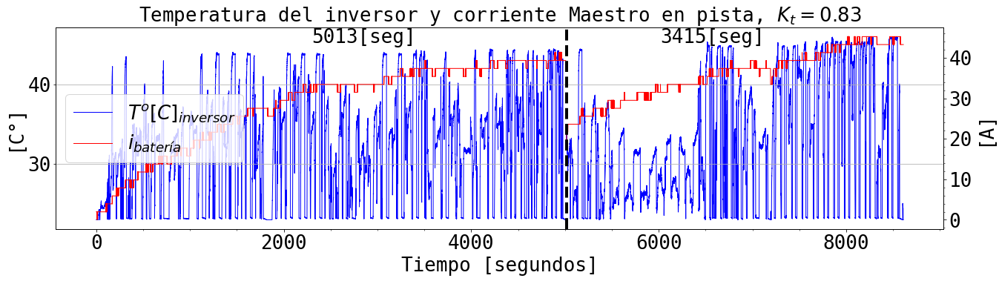

In [ ]:
import matplotlib.transforms as transforms

import matplotlib.transforms as transforms

tt1 = np.linspace(0, np.max(tm_p1), len(tm_p1))
tt2 = np.linspace(np.max(tm_p1), np.max(tm_p1)+np.max(tm_p2), len(tm_p2))
tt3 = np.linspace(np.max(tm_p1)+np.max(tm_p2), np.max(tm_p1)+np.max(tm_p2)+np.max(tm_p3), len(tm_p3))
time1 = np.concatenate((tt1, tt2, tt3), axis=0)

corte = np.max(tm_p1)+np.max(tm_p2)
temp1 = np.asarray(dF1['1. Heatsink Temperature DegC (1)'])
temp2 = np.asarray(dF2['1. Heatsink Temperature DegC (1)'])
temp3 = np.asarray(dF3['1. Heatsink Temperature DegC (1)'])
Temp = np.concatenate((temp1, temp2, temp3), axis=0)

bat_I1 = np.asarray(dF1['1. Battery Current A (0.0625)'])
bat_I2 = np.asarray(dF2['1. Battery Current A (0.0625)'])
bat_I3 = np.asarray(dF3['1. Battery Current A (0.0625)'])
bat_I = np.concatenate((bat_I1, bat_I2, bat_I3), axis=0)

bat_V1 = np.asarray(dF1['1. Battery Voltage V (0.0625)'])
bat_V2 = np.asarray(dF2['1. Battery Voltage V (0.0625)'])
bat_V3 = np.asarray(dF3['1. Battery Voltage V (0.0625)'])
bat_V = np.concatenate((bat_V1, bat_V2, bat_V3), axis=0)

bat_V[bat_V == 0.e+00] = np.mean(bat_V)
bat_V[bat_V < 100] = np.mean(bat_V)


plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(35,5))
ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()
# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("Temperatura del inversor y corriente Maestro en pista, $K_{t} = 0.83$", fontsize=26)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=26)
ax1.set_ylabel("[C°]", fontsize=26)
ax2.set_ylabel("[A]", fontsize=26)
line1, = ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=1, label="$T^{o}[C]_{inversor}$")
line2, = ax1.plot(time1[:], abs(Temp[:]), color='red',linewidth=1, label="$i_{batería}$")
ax1.axvline(x=corte,
            linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
#             linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p1)-2000, 0.9, str(int(t1+t2))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p1)+np.max(tm_p2)+1000, 0.9, str(int((t3)))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
# axes2.set_xticks()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
ax2.tick_params(axis='x', labelsize=26)
ax2.tick_params(axis='y', labelsize=26)
lns = [line1, line2]
ax1.legend(handles=lns, loc='center left',  prop={'size': 26})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

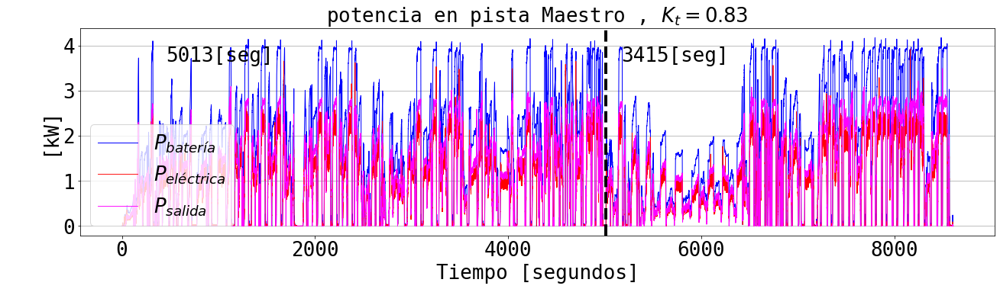

In [ ]:
import matplotlib.transforms as transforms

tt1 = np.linspace(0, np.max(tm_p1), len(tm_p1))
tt2 = np.linspace(np.max(tm_p1), np.max(tm_p1)+np.max(tm_p2), len(tm_p2))
tt3 = np.linspace(np.max(tm_p1)+np.max(tm_p2), np.max(tm_p1)+np.max(tm_p2)+np.max(tm_p3), len(tm_p3))
time1 = np.concatenate((tt1, tt2, tt3), axis=0)



tem1 = np.asarray(dF1['1. Torque actual value Nm (0.0625)'])
tem2 = np.asarray(dF2['1. Torque actual value Nm (0.0625)'])
tem3 = np.asarray(dF3['1. Torque actual value Nm (0.0625)'])
tem = np.concatenate((tem1, tem2, tem3), axis=0)
v1 = np.asarray(dF1['1. Velocity RPM (1)'])
v2 = np.asarray(dF2['1. Velocity RPM (1)'])
v3 = np.asarray(dF3['1. Velocity RPM (1)'])
v = np.concatenate((v1, v2, v3), axis=0)


ud1 = np.asarray(dF1['1. Ud V (0.0625)'])
ud2 = np.asarray(dF2['1. Ud V (0.0625)'])
ud3 = np.asarray(dF3['1. Ud V (0.0625)'])
ud = np.concatenate((ud1,ud2, ud3), axis=0)

uq1 = np.asarray(dF1['1. Uq V (0.0625)'])
uq2 = np.asarray(dF2['1. Uq V (0.0625)'])
uq3 = np.asarray(dF3['1. Uq V (0.0625)'])
uq = np.concatenate((uq1, uq2, uq3), axis=0)

iq1 = np.asarray(butter_lowpass_filter(dF1['1. Iq A (0.0625)'], 3, 624, 3))
iq2 = np.asarray(butter_lowpass_filter(dF2['1. Iq A (0.0625)'], 3, 624, 3))
iq3 = np.asarray(butter_lowpass_filter(dF3['1. Iq A (0.0625)'], 3, 624, 3))
Iq = np.concatenate((iq1, iq2, iq3), axis=0)


id1 = np.asarray(butter_lowpass_filter(dF1['1. Id A (0.0625)'], 3, 624, 3))
id2 = np.asarray(butter_lowpass_filter(dF2['1. Id A (0.0625)'], 3, 624, 3))
id3 = np.asarray(butter_lowpass_filter(dF3['1. Id A (0.0625)'], 3, 624, 3))
# id2 = np.asarray(dF2['1. Id A (0.0625)'])
# id4 = np.asarray(dF4['1. Id A (0.0625)'])
# id5 = np.asarray(dF5['1. Id A (0.0625)'])
# id7 = np.asarray(dF7['1. Id A (0.0625)'])
id = np.concatenate((id1, id2, id3), axis=0)

bat_I1 =  np.asarray(butter_lowpass_filter(dF1['1. Battery Current A (0.0625)'], 3, 624, 3))
bat_I2 =  np.asarray(butter_lowpass_filter(dF2['1. Battery Current A (0.0625)'], 3, 624, 3))
bat_I3 =  np.asarray(butter_lowpass_filter(dF3['1. Battery Current A (0.0625)'], 3, 624, 3))
bat_I = np.concatenate((bat_I1, bat_I2, bat_I3), axis=0)

# bat_I2 =  np.asarray(dF2['1. Battery Current A (0.0625)'])
# bat_I4 = np.asarray(dF4['1. Battery Current A (0.0625)'])
# bat_I5 = np.asarray(dF5['1. Battery Current A (0.0625)'])
# bat_I7 = np.asarray(dF7['1. Battery Current A (0.0625)'])
# bat_I = np.concatenate((bat_I7, bat_I5, bat_I2, bat_I4), axis=0)
bat_V1 = np.asarray(dF1['1. Battery Voltage V (0.0625)'])
bat_V2 = np.asarray(dF2['1. Battery Voltage V (0.0625)'])
bat_V3 = np.asarray(dF3['1. Battery Voltage V (0.0625)'])
bat_V = np.concatenate((bat_V1, bat_V2, bat_V3), axis=0)

BatV = bat_V
BatI = bat_I
Iq = Iq
Uq = uq
Id = id
Ud = ud
Te = (tem)
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad(v)


pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
pot_salida = Te * rad 
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)

DD = np.asarray(pot_salida) / np.asarray(pin)

# DD = abs(pot / pin)
DD[DD > 0.99999999999999] = np.mean(DD)
DD[DD == 0.e+00] = np.mean(DD)
DD[DD == 0] = np.mean(DD)
DD[DD == np.inf] = np.mean(DD)
DD = np.nan_to_num(DD)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(35,5))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax2 = ax1.twinx()


# line2, = ax2.plot(tm_p, (butter_lowpass_filter(100*D[:], 3, 124, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (butter_lowpass_filter((pin/1000), 3, 124, 3)),linewidth=1, color='blue', label="$P_{batería}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 124, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")

# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(0, 100)}
# ax1.set_ylim(0, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("potencia en pista Maestro , $K_{t} = 0.83$", fontsize=26)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=26)
ax1.set_ylabel("[kW]", fontsize=26)
# ax1.set_ylabel("[%]", fontsize=13)
# line4, = ax1.plot(time1, abs((100*D[:])),linewidth=0.9, color='green', label="$\eta_{batería-inversor}$")
# line2, = ax1.plot(time1, abs((100*DD[:])),linewidth=0.9, color='brown', label="$\eta_{batería-motor}$")

line4, = ax1.plot(time1, abs(pin/1000),linewidth=1, color='blue', label="$P_{batería}$")
line3, = ax1.plot(time1, abs(pot/1000),linewidth=0.9, color='red', label="$P_{eléctrica}$")
line5, = ax1.plot(time1, abs(pot_salida/1000),linewidth=0.9, color='magenta', label="$P_{salida}$")


ax1.axvline(x=corte,
            linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
#             linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p1)-5500, 0.91, str(int(t1+t2))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p1)+np.max(tm_p2)-1500, 0.91, str(int((t3)))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
# axes2.set_xticks()
ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line4,line3,line5]
ax1.legend(handles=lns, loc='lower left',  prop={'size': 26})
ax1.grid(axis='y', which='major')
# ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

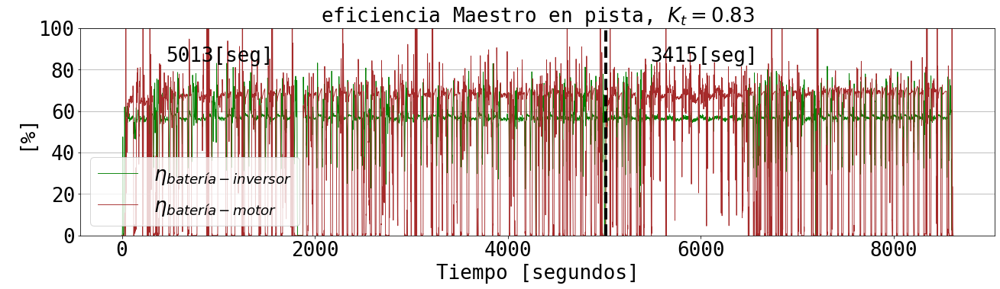

In [ ]:
import matplotlib.transforms as transforms

tt1 = np.linspace(0, np.max(tm_p1), len(tm_p1))
tt2 = np.linspace(np.max(tm_p1), np.max(tm_p1)+np.max(tm_p2), len(tm_p2))
tt3 = np.linspace(np.max(tm_p1)+np.max(tm_p2), np.max(tm_p1)+np.max(tm_p2)+np.max(tm_p3), len(tm_p3))
time1 = np.concatenate((tt1, tt2, tt3), axis=0)



tem1 = np.asarray(dF1['1. Torque actual value Nm (0.0625)'])
tem2 = np.asarray(dF2['1. Torque actual value Nm (0.0625)'])
tem3 = np.asarray(dF3['1. Torque actual value Nm (0.0625)'])
tem = np.concatenate((tem1, tem2, tem3), axis=0)
v1 = np.asarray(dF1['1. Velocity RPM (1)'])
v2 = np.asarray(dF2['1. Velocity RPM (1)'])
v3 = np.asarray(dF3['1. Velocity RPM (1)'])
v = np.concatenate((v1, v2, v3), axis=0)


ud1 = np.asarray(dF1['1. Ud V (0.0625)'])
ud2 = np.asarray(dF2['1. Ud V (0.0625)'])
ud3 = np.asarray(dF3['1. Ud V (0.0625)'])
ud = np.concatenate((ud1,ud2, ud3), axis=0)

uq1 = np.asarray(dF1['1. Uq V (0.0625)'])
uq2 = np.asarray(dF2['1. Uq V (0.0625)'])
uq3 = np.asarray(dF3['1. Uq V (0.0625)'])
uq = np.concatenate((uq1, uq2, uq3), axis=0)

iq1 = np.asarray(butter_lowpass_filter(dF1['1. Iq A (0.0625)'], 3, 624, 3))
iq2 = np.asarray(butter_lowpass_filter(dF2['1. Iq A (0.0625)'], 3, 624, 3))
iq3 = np.asarray(butter_lowpass_filter(dF3['1. Iq A (0.0625)'], 3, 624, 3))
Iq = np.concatenate((iq1, iq2, iq3), axis=0)


id1 = np.asarray(butter_lowpass_filter(dF1['1. Id A (0.0625)'], 3, 624, 3))
id2 = np.asarray(butter_lowpass_filter(dF2['1. Id A (0.0625)'], 3, 624, 3))
id3 = np.asarray(butter_lowpass_filter(dF3['1. Id A (0.0625)'], 3, 624, 3))
# id2 = np.asarray(dF2['1. Id A (0.0625)'])
# id4 = np.asarray(dF4['1. Id A (0.0625)'])
# id5 = np.asarray(dF5['1. Id A (0.0625)'])
# id7 = np.asarray(dF7['1. Id A (0.0625)'])
id = np.concatenate((id1, id2, id3), axis=0)

bat_I1 =  np.asarray(butter_lowpass_filter(dF1['1. Battery Current A (0.0625)'], 3, 624, 3))
bat_I2 =  np.asarray(butter_lowpass_filter(dF2['1. Battery Current A (0.0625)'], 3, 624, 3))
bat_I3 =  np.asarray(butter_lowpass_filter(dF3['1. Battery Current A (0.0625)'], 3, 624, 3))
bat_I = np.concatenate((bat_I1, bat_I2, bat_I3), axis=0)

# bat_I2 =  np.asarray(dF2['1. Battery Current A (0.0625)'])
# bat_I4 = np.asarray(dF4['1. Battery Current A (0.0625)'])
# bat_I5 = np.asarray(dF5['1. Battery Current A (0.0625)'])
# bat_I7 = np.asarray(dF7['1. Battery Current A (0.0625)'])
# bat_I = np.concatenate((bat_I7, bat_I5, bat_I2, bat_I4), axis=0)
bat_V1 = np.asarray(dF1['1. Battery Voltage V (0.0625)'])
bat_V2 = np.asarray(dF2['1. Battery Voltage V (0.0625)'])
bat_V3 = np.asarray(dF3['1. Battery Voltage V (0.0625)'])
bat_V = np.concatenate((bat_V1, bat_V2, bat_V3), axis=0)

BatV = bat_V
BatI = bat_I
Iq = Iq
Uq = uq
Id = id
Ud = ud
Te = (tem)
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad(v)


pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
pot_salida = Te * rad 
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)

DD = np.asarray(pot_salida) / np.asarray(pin)

# DD = abs(pot / pin)
DD[DD > 0.99999999999999] = np.mean(DD)
DD[DD == 0.e+00] = np.mean(DD)
DD[DD == 0] = np.mean(DD)
DD[DD == np.inf] = np.mean(DD)
DD = np.nan_to_num(DD)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(35,5))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax2 = ax1.twinx()

# line2, = ax2.plot(tm_p, (butter_lowpass_filter(100*D[:], 3, 124, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (butter_lowpass_filter((pin/1000), 3, 124, 3)),linewidth=1, color='blue', label="$P_{batería}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 124, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")

# ax4.spines["right"].set_position(("axes", 1.2))
ax1.set_ylim(0, 100)
# ax1.set_ylim(0, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("eficiencia Maestro en pista, $K_{t} = 0.83$", fontsize=26)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=26)
# ax1.set_ylabel("[kW]", fontsize=13)
ax1.set_ylabel("[%]", fontsize=26)



line4, = ax1.plot(time1, butter_lowpass_filter(abs((100*D[:])), 3, 624, 3),linewidth=0.9, color='green', label="$\eta_{batería-inversor}$")
line2, = ax1.plot(time1, butter_lowpass_filter(abs((100*DD[:])), 3, 624, 3),linewidth=0.9, color='brown', label="$\eta_{batería-motor}$")

# line4, = ax1.plot(time1, ,linewidth=0.9, color='green', label="$\eta_{batería-inversor}$")
# line2, = ax1.plot(time1, ,linewidth=0.9, color='brown', label="$\eta_{batería-motor}$")

# line4, = ax1.plot(time1, abs(pin/1000),linewidth=1, color='blue', label="$P_{batería}$")
# line3, = ax1.plot(time1, abs(pot/1000),linewidth=1, color='red', label="$P_{eléctrica}$")
# line5, = ax1.plot(time1, abs(pot_salida/1000),linewidth=1, color='magenta', label="$P_{salida}$")



ax1.axvline(x=corte,
            linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
#             linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p1)-5500, 0.91, str(int(t1+t2))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p1)+np.max(tm_p2)-1200, 0.91, str(int((t3)))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
# axes2.set_xticks()
# ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line4,line2]
ax1.legend(handles=lns, loc='lower left',  prop={'size': 26})
ax1.grid(axis='y', which='major')
# ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

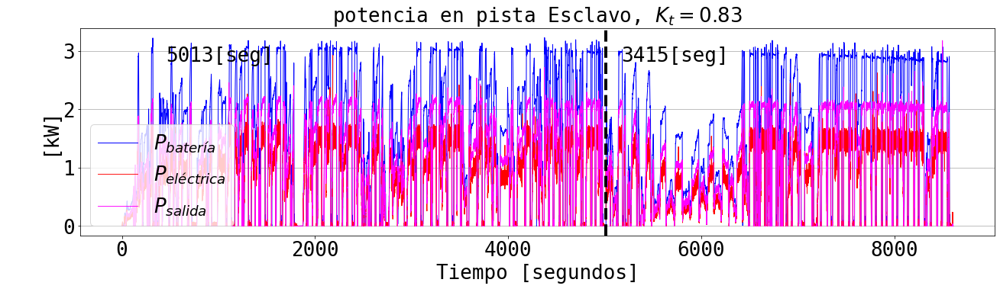

In [ ]:
import matplotlib.transforms as transforms

tt1 = np.linspace(0, np.max(tm_p1), len(tm_p1))
tt2 = np.linspace(np.max(tm_p1), np.max(tm_p1)+np.max(tm_p2), len(tm_p2))
tt3 = np.linspace(np.max(tm_p1)+np.max(tm_p2), np.max(tm_p1)+np.max(tm_p2)+np.max(tm_p3), len(tm_p3))
time1 = np.concatenate((tt1, tt2, tt3), axis=0)



tem1 = np.asarray(dF1['2. Torque actual value Nm (0.0625)'])
tem2 = np.asarray(dF2['2. Torque actual value Nm (0.0625)'])
tem3 = np.asarray(dF3['2. Torque actual value Nm (0.0625)'])
tem = np.concatenate((tem1, tem2, tem3), axis=0)
v1 = np.asarray(dF1['2. Velocity RPM (1)'])
v2 = np.asarray(dF2['2. Velocity RPM (1)'])
v3 = np.asarray(dF3['2. Velocity RPM (1)'])
v = np.concatenate((v1, v2, v3), axis=0)


ud1 = np.asarray(dF1['2. Ud V (0.0625)'])
ud2 = np.asarray(dF2['2. Ud V (0.0625)'])
ud3 = np.asarray(dF3['2. Ud V (0.0625)'])
ud = np.concatenate((ud1,ud2, ud3), axis=0)

uq1 = np.asarray(dF1['2. Uq V (0.0625)'])
uq2 = np.asarray(dF2['2. Uq V (0.0625)'])
uq3 = np.asarray(dF3['2. Uq V (0.0625)'])
uq = np.concatenate((uq1, uq2, uq3), axis=0)

iq1 = 0.9*np.asarray(butter_lowpass_filter(Fd1['2. Iq A (0.0625)'], 3, 14, 3))
iq2 = 0.9*np.asarray(butter_lowpass_filter(Fd2['2. Iq A (0.0625)'], 3, 14, 3))
iq3 = 0.9*np.asarray(butter_lowpass_filter(Fd3['2. Iq A (0.0625)'], 3, 14, 3))
Iq = np.concatenate((iq1, iq2, iq3), axis=0)

id1 = np.asarray(butter_lowpass_filter(dF1['2. Id A (0.0625)'], 3, 624, 3))
id2 = np.asarray(butter_lowpass_filter(dF2['2. Id A (0.0625)'], 3, 624, 3))
id3 = np.asarray(butter_lowpass_filter(dF3['2. Id A (0.0625)'], 3, 624, 3))
# id2 = np.asarray(dF2['1. Id A (0.0625)'])
# id4 = np.asarray(dF4['1. Id A (0.0625)'])
# id5 = np.asarray(dF5['1. Id A (0.0625)'])
# id7 = np.asarray(dF7['1. Id A (0.0625)'])
id = np.concatenate((id1, id2, id3), axis=0)

bat_I1 =  np.asarray(butter_lowpass_filter(dF1['2. Battery Current A (0.0625)'], 3, 624, 3))
bat_I2 =  np.asarray(butter_lowpass_filter(dF2['2. Battery Current A (0.0625)'], 3, 624, 3))
bat_I3 =  np.asarray(butter_lowpass_filter(dF3['2. Battery Current A (0.0625)'], 3, 624, 3))
bat_I = np.concatenate((bat_I1, bat_I2, bat_I3), axis=0)

# bat_I2 =  np.asarray(dF2['1. Battery Current A (0.0625)'])
# bat_I4 = np.asarray(dF4['1. Battery Current A (0.0625)'])
# bat_I5 = np.asarray(dF5['1. Battery Current A (0.0625)'])
# bat_I7 = np.asarray(dF7['1. Battery Current A (0.0625)'])
# bat_I = np.concatenate((bat_I7, bat_I5, bat_I2, bat_I4), axis=0)
bat_V1 = np.asarray(dF1['2. Battery Voltage V (0.0625)'])
bat_V2 = np.asarray(dF2['2. Battery Voltage V (0.0625)'])
bat_V3 = np.asarray(dF3['2. Battery Voltage V (0.0625)'])
bat_V = np.concatenate((bat_V1, bat_V2, bat_V3), axis=0)

BatV = bat_V
BatI = bat_I
Iq = Iq
Uq = uq
Id = id
Ud = ud
Te = (tem)
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad(v)


pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
pot_salida = Te * rad 
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)

DD = np.asarray(pot_salida) / np.asarray(pin)

# DD = abs(pot / pin)
DD[DD > 0.99999999999999] = np.mean(DD)
DD[DD == 0.e+00] = np.mean(DD)
DD[DD == 0] = np.mean(DD)
DD[DD == np.inf] = np.mean(DD)
DD = np.nan_to_num(DD)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(35,5))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax2 = ax1.twinx()


# line2, = ax2.plot(tm_p, (butter_lowpass_filter(100*D[:], 3, 124, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (butter_lowpass_filter((pin/1000), 3, 124, 3)),linewidth=1, color='blue', label="$P_{batería}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 124, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")

# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(0, 100)}
# ax1.set_ylim(0, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("potencia en pista Esclavo, $K_{t} = 0.83$", fontsize=26)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=26)
ax1.set_ylabel("[kW]", fontsize=26)
# ax1.set_ylabel("[%]", fontsize=13)
# line4, = ax1.plot(time1, abs((100*D[:])),linewidth=0.9, color='green', label="$\eta_{batería-inversor}$")
# line2, = ax1.plot(time1, abs((100*DD[:])),linewidth=0.9, color='brown', label="$\eta_{batería-motor}$")

line4, = ax1.plot(time1, abs(pin/1000),linewidth=1, color='blue', label="$P_{batería}$")
line3, = ax1.plot(time1, abs(pot/1000),linewidth=0.9, color='red', label="$P_{eléctrica}$")
line5, = ax1.plot(time1, abs(pot_salida/1000),linewidth=0.9, color='magenta', label="$P_{salida}$")


ax1.axvline(x=corte,
            linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
#             linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p1)-5500, 0.91, str(int(t1+t2))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p1)+np.max(tm_p2)-1500, 0.91, str(int((t3)))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
# axes2.set_xticks()
ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line4,line3,line5]
ax1.legend(handles=lns, loc='lower left',  prop={'size': 26})
ax1.grid(axis='y', which='major')
# ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

C:\Users\luisd\AppData\Local\Temp\ipykernel_4784\3341492286.py:2: DtypeWarning: Columns (0,1,2) have mixed types. Specify dtype option on import or set low_memory=False.
  Fd1= pd.read_csv(Fd1 , sep=',')


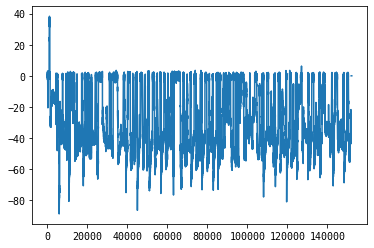

In [ ]:
p1 = 'master_slave_carga_vizcachas_jose_270222_141131.csv'
p2 = 'master_slave_carga_vizcachas_jose_270222_142532.csv'
p3 = 'master_slave_carga_vizcachas_jose_270222_165945.csv'


Fd1 = p1 = 'master_slave_carga_vizcachas_jose_270222_141131.csv'
Fd1= pd.read_csv(Fd1 , sep=',')
# d = Fd1['2. Iq A (0.0625)']
if 'P' in Fd1['2. Iq A (0.0625)'].values:
    d = np.asarray(Fd1['2. Iq A (0.0625)'])
    Fd1 = Fd1.drop(['2. Iq A (0.0625)'], axis = 1)
    dd = np.where(d == 'P')
    d[dd[0][0]:] = 0
    Fd1.insert(loc=0, column='2. Iq A (0.0625)', value=d)
    Fd1['2. Iq A (0.0625)'] = Fd1['2. Iq A (0.0625)'].astype('float')

Fd2 = 'master_slave_carga_vizcachas_jose_270222_142532.csv'
Fd2= pd.read_csv(Fd2 , sep=',')
# d = Fd1['2. Iq A (0.0625)']
if 'P' in Fd2['2. Iq A (0.0625)'].values:
    d = np.asarray(Fd2['2. Iq A (0.0625)'])
    Fd2 = Fd2.drop(['2. Iq A (0.0625)'], axis = 1)
    dd = np.where(d == 'P')
    d[dd[0][0]:] = 0
    Fd2.insert(loc=0, column='2. Iq A (0.0625)', value=d)
    Fd2['2. Iq A (0.0625)'] = Fd2['2. Iq A (0.0625)'].astype('float')

Fd3 = 'master_slave_carga_vizcachas_jose_270222_165945.csv'
Fd3= pd.read_csv(Fd3 , sep=',')
# d = Fd1['2. Iq A (0.0625)']
if 'P' in Fd3['2. Iq A (0.0625)'].values:
    d = np.asarray(Fd3['2. Iq A (0.0625)'])
    Fd3 = Fd3.drop(['2. Iq A (0.0625)'], axis = 1)
    dd = np.where(d == 'P')
    d[dd[0][0]:] = 0
    Fd3.insert(loc=0, column='2. Iq A (0.0625)', value=d)
    Fd3['2. Iq A (0.0625)'] = Fd3['2. Iq A (0.0625)'].astype('float')
    
# d = Fd1['2. Iq A (0.0625)']
# plt.plot(np.asarray(d))

C:\Users\luisd\AppData\Local\Temp\ipykernel_4532\842045152.py:7: DtypeWarning: Columns (0,1,2) have mixed types. Specify dtype option on import or set low_memory=False.
  Fd1= pd.read_csv(Fd1 , sep=',')
C:\Users\luisd\AppData\Local\Temp\ipykernel_4532\842045152.py:18: DtypeWarning: Columns (0,1,2) have mixed types. Specify dtype option on import or set low_memory=False.
  Fd2= pd.read_csv(Fd2 , sep=',')
C:\Users\luisd\AppData\Local\Temp\ipykernel_4532\842045152.py:29: DtypeWarning: Columns (0,1,2) have mixed types. Specify dtype option on import or set low_memory=False.
  Fd3= pd.read_csv(Fd3 , sep=',')


In [ ]:
Fd1 = 'master_slave_carga_vizcachas_jose_270222_141131.csv'
Fd1= pd.read_csv(Fd1 , sep=',')
d = Fd1['2. Iq A (0.0625)']
# plt.plot(np.asarray(d)
# )
# dd2 = 'bms_7_5.csv'
# dd1= pd.read_csv(dd1 , sep=';')
# dd2 = 'bms_7_5.csv'
# dd1= pd.read_csv(dd1 , sep=';')

C:\Users\luisd\AppData\Local\Temp\ipykernel_4532\1391787602.py:2: DtypeWarning: Columns (0,1,2) have mixed types. Specify dtype option on import or set low_memory=False.
  Fd1= pd.read_csv(Fd1 , sep=',')


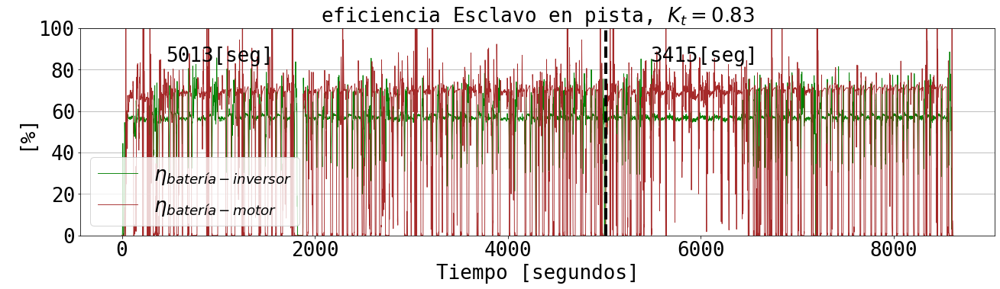

In [ ]:
import matplotlib.transforms as transforms

tt1 = np.linspace(0, np.max(tm_p1), len(tm_p1))
tt2 = np.linspace(np.max(tm_p1), np.max(tm_p1)+np.max(tm_p2), len(tm_p2))
tt3 = np.linspace(np.max(tm_p1)+np.max(tm_p2), np.max(tm_p1)+np.max(tm_p2)+np.max(tm_p3), len(tm_p3))
time1 = np.concatenate((tt1, tt2, tt3), axis=0)



tem1 = np.asarray(dF1['2. Torque actual value Nm (0.0625)'])
tem2 = np.asarray(dF2['2. Torque actual value Nm (0.0625)'])
tem3 = np.asarray(dF3['2. Torque actual value Nm (0.0625)'])
tem = np.concatenate((tem1, tem2, tem3), axis=0)
v1 = np.asarray(dF1['2. Velocity RPM (1)'])
v2 = np.asarray(dF2['2. Velocity RPM (1)'])
v3 = np.asarray(dF3['2. Velocity RPM (1)'])
v = np.concatenate((v1, v2, v3), axis=0)


ud1 = np.asarray(dF1['2. Ud V (0.0625)'])
ud2 = np.asarray(dF2['2. Ud V (0.0625)'])
ud3 = np.asarray(dF3['2. Ud V (0.0625)'])
ud = np.concatenate((ud1,ud2, ud3), axis=0)

uq1 = np.asarray(dF1['2. Uq V (0.0625)'])
uq2 = np.asarray(dF2['2. Uq V (0.0625)'])
uq3 = np.asarray(dF3['2. Uq V (0.0625)'])
uq = np.concatenate((uq1, uq2, uq3), axis=0)

iq1 = np.asarray(butter_lowpass_filter(Fd1['2. Iq A (0.0625)'], 3, 624, 3))
iq2 = np.asarray(butter_lowpass_filter(Fd2['2. Iq A (0.0625)'], 3, 624, 3))
iq3 = np.asarray(butter_lowpass_filter(Fd3['2. Iq A (0.0625)'], 3, 624, 3))
Iq = np.concatenate((iq1, iq2, iq3), axis=0)


id1 = np.asarray(butter_lowpass_filter(dF1['2. Id A (0.0625)'], 3, 624, 3))
id2 = np.asarray(butter_lowpass_filter(dF2['2. Id A (0.0625)'], 3, 624, 3))
id3 = np.asarray(butter_lowpass_filter(dF3['2. Id A (0.0625)'], 3, 624, 3))
# id2 = np.asarray(dF2['1. Id A (0.0625)'])
# id4 = np.asarray(dF4['1. Id A (0.0625)'])
# id5 = np.asarray(dF5['1. Id A (0.0625)'])
# id7 = np.asarray(dF7['1. Id A (0.0625)'])
id = np.concatenate((id1, id2, id3), axis=0)

bat_I1 =  np.asarray(butter_lowpass_filter(dF1['2. Battery Current A (0.0625)'], 3, 624, 3))
bat_I2 =  np.asarray(butter_lowpass_filter(dF2['2. Battery Current A (0.0625)'], 3, 624, 3))
bat_I3 =  np.asarray(butter_lowpass_filter(dF3['2. Battery Current A (0.0625)'], 3, 624, 3))
bat_I = np.concatenate((bat_I1, bat_I2, bat_I3), axis=0)

# bat_I2 =  np.asarray(dF2['1. Battery Current A (0.0625)'])
# bat_I4 = np.asarray(dF4['1. Battery Current A (0.0625)'])
# bat_I5 = np.asarray(dF5['1. Battery Current A (0.0625)'])
# bat_I7 = np.asarray(dF7['1. Battery Current A (0.0625)'])
# bat_I = np.concatenate((bat_I7, bat_I5, bat_I2, bat_I4), axis=0)
bat_V1 = np.asarray(dF1['2. Battery Voltage V (0.0625)'])
bat_V2 = np.asarray(dF2['2. Battery Voltage V (0.0625)'])
bat_V3 = np.asarray(dF3['2. Battery Voltage V (0.0625)'])
bat_V = np.concatenate((bat_V1, bat_V2, bat_V3), axis=0)

BatV = bat_V
BatI = bat_I
Iq = Iq
Uq = uq
Id = id
Ud = ud
Te = (tem)
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad(v)


pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
pot_salida = Te * rad 
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)

DD = np.asarray(pot_salida) / np.asarray(pin)

# DD = abs(pot / pin)
DD[DD > 0.99999999999999] = np.mean(DD)
DD[DD == 0.e+00] = np.mean(DD)
DD[DD == 0] = np.mean(DD)
DD[DD == np.inf] = np.mean(DD)
DD = np.nan_to_num(DD)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(35,5))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax2 = ax1.twinx()

# line2, = ax2.plot(tm_p, (butter_lowpass_filter(100*D[:], 3, 124, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (butter_lowpass_filter((pin/1000), 3, 124, 3)),linewidth=1, color='blue', label="$P_{batería}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 124, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")

# ax4.spines["right"].set_position(("axes", 1.2))
ax1.set_ylim(0, 100)
# ax1.set_ylim(0, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("eficiencia Esclavo en pista, $K_{t} = 0.83$", fontsize=26)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=26)
# ax1.set_ylabel("[kW]", fontsize=13)
ax1.set_ylabel("[%]", fontsize=26)



line4, = ax1.plot(time1, butter_lowpass_filter(abs((100*D[:])), 3, 624, 3),linewidth=0.9, color='green', label="$\eta_{batería-inversor}$")
line2, = ax1.plot(time1, butter_lowpass_filter(abs((100*DD[:])), 3, 624, 3),linewidth=0.9, color='brown', label="$\eta_{batería-motor}$")

# line4, = ax1.plot(time1, ,linewidth=0.9, color='green', label="$\eta_{batería-inversor}$")
# line2, = ax1.plot(time1, ,linewidth=0.9, color='brown', label="$\eta_{batería-motor}$")

# line4, = ax1.plot(time1, abs(pin/1000),linewidth=1, color='blue', label="$P_{batería}$")
# line3, = ax1.plot(time1, abs(pot/1000),linewidth=1, color='red', label="$P_{eléctrica}$")
# line5, = ax1.plot(time1, abs(pot_salida/1000),linewidth=1, color='magenta', label="$P_{salida}$")



ax1.axvline(x=corte,
            linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
#             linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p1)-5500, 0.91, str(int(t1+t2))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p1)+np.max(tm_p2)-1200, 0.91, str(int((t3)))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
# axes2.set_xticks()
# ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line4,line2]
ax1.legend(handles=lns, loc='lower left',  prop={'size': 26})
ax1.grid(axis='y', which='major')
# ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

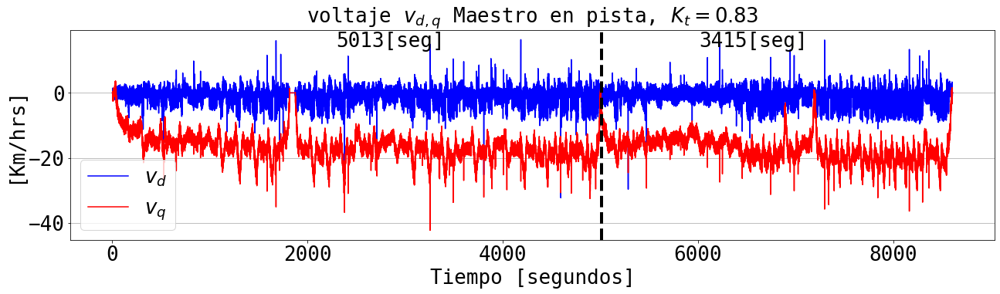

In [ ]:
import matplotlib.transforms as transforms

tt1 = np.linspace(0, np.max(tm_p1), len(tm_p1))
tt2 = np.linspace(np.max(tm_p1), np.max(tm_p1)+np.max(tm_p2), len(tm_p2))
tt3 = np.linspace(np.max(tm_p1)+np.max(tm_p2), np.max(tm_p1)+np.max(tm_p2)+np.max(tm_p3), len(tm_p3))
time1 = np.concatenate((tt1, tt2, tt3), axis=0)

ud1 = np.asarray(dF1['1. Ud V (0.0625)'])
ud2 = np.asarray(dF2['1. Ud V (0.0625)'])
ud3 = np.asarray(dF3['1. Ud V (0.0625)'])
ud = np.concatenate((ud1, ud2, ud3), axis=0)

uq1 = np.asarray(dF1['1. Uq V (0.0625)'])
uq2 = np.asarray(dF2['1. Uq V (0.0625)'])
uq3 = np.asarray(dF3['1. Uq V (0.0625)'])
uq = np.concatenate((uq1, uq2, uq3), axis=0)

# ['1. Uq V (0.0625)']

# uq2 = np.asarray(dF2['1. Uq V (0.0625)'])
# uq4 = np.asarray(dF4['1. Uq V (0.0625)'])
# uq5 = np.asarray(dF5['1. Uq V (0.0625)'])
# uq7 = np.asarray(dF7['1. Uq V (0.0625)'])
# uq = np.concatenate((uq7, uq5,uq2, uq4), axis=0)

plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(35,5))
# ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()
# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
# con límite de potencia
ax1.set_title("voltaje $v_{d,q}$ Maestro en pista, $K_{t} = 0.83$", fontsize=26)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=26)
ax1.set_ylabel("[Km/hrs]", fontsize=26)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
# ax1.set_ylabel("[V]", fontsize=12)
line1, = ax1.plot(time1[:], ud, color='blue', label="$v_{d}$")
line2, = ax1.plot(time1[:], uq, color='red', label="$v_{q}$")

ax1.axvline(x=corte,
            linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
#             linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p1)-2000, 0.9, str(int(t1+t2))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p1)+np.max(tm_p2)+1000, 0.9, str(int((t3)))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
# axes2.set_xticks()
# ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line1, line2]
ax1.legend(handles=lns, loc='best',  prop={'size': 26})
ax1.grid(axis='y', which='major')
# ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

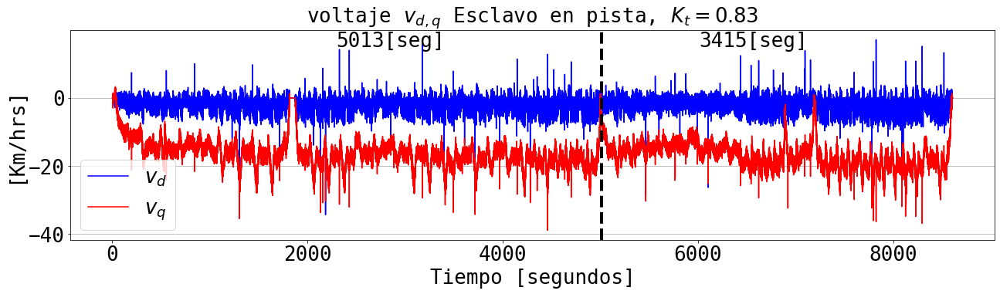

In [ ]:
import matplotlib.transforms as transforms

tt1 = np.linspace(0, np.max(tm_p1), len(tm_p1))
tt2 = np.linspace(np.max(tm_p1), np.max(tm_p1)+np.max(tm_p2), len(tm_p2))
tt3 = np.linspace(np.max(tm_p1)+np.max(tm_p2), np.max(tm_p1)+np.max(tm_p2)+np.max(tm_p3), len(tm_p3))
time1 = np.concatenate((tt1, tt2, tt3), axis=0)

ud1 = np.asarray(dF1['2. Ud V (0.0625)'])
ud2 = np.asarray(dF2['2. Ud V (0.0625)'])
ud3 = np.asarray(dF3['2. Ud V (0.0625)'])
ud = np.concatenate((ud1, ud2, ud3), axis=0)

uq1 = np.asarray(dF1['2. Uq V (0.0625)'])
uq2 = np.asarray(dF2['2. Uq V (0.0625)'])
uq3 = np.asarray(dF3['2. Uq V (0.0625)'])
uq = np.concatenate((uq1, uq2, uq3), axis=0)

# ['1. Uq V (0.0625)']

# uq2 = np.asarray(dF2['1. Uq V (0.0625)'])
# uq4 = np.asarray(dF4['1. Uq V (0.0625)'])
# uq5 = np.asarray(dF5['1. Uq V (0.0625)'])
# uq7 = np.asarray(dF7['1. Uq V (0.0625)'])
# uq = np.concatenate((uq7, uq5,uq2, uq4), axis=0)

plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(35,5))
# ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()
# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
# con límite de potencia
ax1.set_title("voltaje $v_{d,q}$ Esclavo en pista, $K_{t} = 0.83$", fontsize=26)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=26)
ax1.set_ylabel("[Km/hrs]", fontsize=26)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
# ax1.set_ylabel("[V]", fontsize=12)
line1, = ax1.plot(time1[:], ud, color='blue', label="$v_{d}$")
line2, = ax1.plot(time1[:], uq, color='red', label="$v_{q}$")

ax1.axvline(x=corte,
            linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
#             linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p1)-2000, 0.9, str(int(t1+t2))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p1)+np.max(tm_p2)+1000, 0.9, str(int((t3)))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
# axes2.set_xticks()
# ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line1, line2]
ax1.legend(handles=lns, loc='best',  prop={'size': 26})
ax1.grid(axis='y', which='major')
# ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

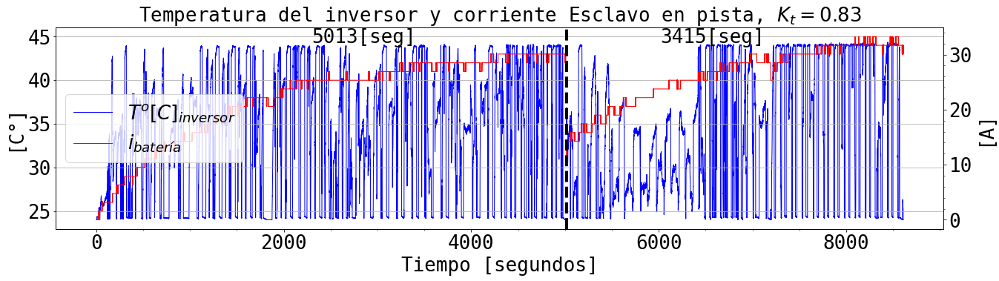

In [ ]:
import matplotlib.transforms as transforms

tt1 = np.linspace(0, np.max(tm_p1), len(tm_p1))
tt2 = np.linspace(np.max(tm_p1), np.max(tm_p1)+np.max(tm_p2), len(tm_p2))
tt3 = np.linspace(np.max(tm_p1)+np.max(tm_p2), np.max(tm_p1)+np.max(tm_p2)+np.max(tm_p3), len(tm_p3))
time1 = np.concatenate((tt1, tt2, tt3), axis=0)

temp1 = np.asarray(dF1['2. Heatsink Temperature DegC (1)'])
temp2 = np.asarray(dF2['2. Heatsink Temperature DegC (1)'])
temp3 = np.asarray(dF3['2. Heatsink Temperature DegC (1)'])
Temp = np.concatenate((temp1, temp2, temp3), axis=0)

bat_I1 = np.asarray(dF1['2. Battery Current A (0.0625)'])
bat_I2 = np.asarray(dF2['2. Battery Current A (0.0625)'])
bat_I3 = np.asarray(dF3['2. Battery Current A (0.0625)'])
bat_I = np.concatenate((bat_I1, bat_I2, bat_I3), axis=0)

bat_V1 = np.asarray(dF1['2. Battery Voltage V (0.0625)'])
bat_V2 = np.asarray(dF2['2. Battery Voltage V (0.0625)'])
bat_V3 = np.asarray(dF3['2. Battery Voltage V (0.0625)'])
bat_V = np.concatenate((bat_V1, bat_V2, bat_V3), axis=0)

bat_V[bat_V == 0.e+00] = np.mean(bat_V)
bat_V[bat_V < 100] = np.mean(bat_V)


plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(35,5))
ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()
# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("Temperatura del inversor y corriente Esclavo en pista, $K_{t} = 0.83$", fontsize=26)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=26)
ax1.set_ylabel("[C°]", fontsize=26)
ax2.set_ylabel("[A]", fontsize=26)
line1, = ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=1, label="$T^{o}[C]_{inversor}$")
line2, = ax1.plot(time1[:], abs(Temp[:]), color='red',linewidth=1, label="$i_{batería}$")
ax1.axvline(x=corte,
            linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
#             linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p1)-2000, 0.9, str(int(t1+t2))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p1)+np.max(tm_p2)+1000, 0.9, str(int((t3)))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
# axes2.set_xticks()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
ax2.tick_params(axis='x', labelsize=26)
ax2.tick_params(axis='y', labelsize=26)
lns = [line1, line2]
ax1.legend(handles=lns, loc='center left',  prop={'size': 26})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

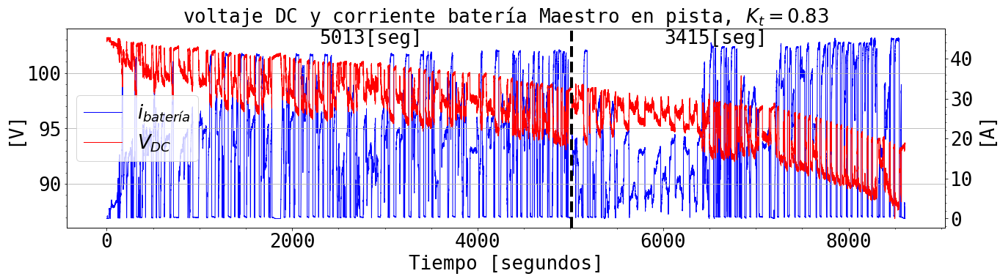

In [ ]:
import matplotlib.transforms as transforms

tt1 = np.linspace(0, np.max(tm_p1), len(tm_p1))
tt2 = np.linspace(np.max(tm_p1), np.max(tm_p1)+np.max(tm_p2), len(tm_p2))
tt3 = np.linspace(np.max(tm_p1)+np.max(tm_p2), np.max(tm_p1)+np.max(tm_p2)+np.max(tm_p3), len(tm_p3))
time1 = np.concatenate((tt1, tt2, tt3), axis=0)


bat_I1 = np.asarray(dF1['1. Battery Current A (0.0625)'])
bat_I2 = np.asarray(dF2['1. Battery Current A (0.0625)'])
bat_I3 = np.asarray(dF3['1. Battery Current A (0.0625)'])
bat_I = np.concatenate((bat_I1, bat_I2, bat_I3), axis=0)
bat_V1 = np.asarray(dF1['1. Battery Voltage V (0.0625)'])
bat_V2 = np.asarray(dF2['1. Battery Voltage V (0.0625)'])
bat_V3 = np.asarray(dF3['1. Battery Voltage V (0.0625)'])
bat_V = np.concatenate((bat_V1, bat_V2, bat_V3), axis=0)
# bat_V[bat_V == 0.e+00] = np.mean(bat_V)
# bat_V[bat_V < 100] = np.mean(bat_V)
import matplotlib.transforms as transforms
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(35,5))
ax2 = ax1.twinx()
# axes2 = ax1.twiny()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()

# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("voltaje DC y corriente batería Maestro en pista, $K_{t} = 0.83$", fontsize=26)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=26)
ax2.set_ylabel("[A]", fontsize=26)
ax1.set_ylabel("[V]", fontsize=26)
# ax1.plot(time1[:], Temp[:], color='blue', label="Corriente batería")
# ax1.plot(time1[:], bat_V[:], color='blue', label="Corriente batería")
# ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=2, label="$T^{o}[C]_{inversor}$")
# ax1.plot(time1[:], abs(Temp[:]), color='red',linewidth=2, label="$i_{batería}$")
line1, = ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=1, label='$i_{batería}$')
line2, = ax1.plot(time1[:], bat_V[:], color='red',linewidth=1, label='$V_{DC}$')

ax1.axvline(x=corte,
            linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
#             linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p1)-2000, 0.9, str(int(t1+t2))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p1)+np.max(tm_p2)+1000, 0.9, str(int((t3)))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
# axes2.set_xticks()
# axes2.minorticks_on()
# ax1.tick_params(axis='x', labelsize=12)
# ax1.tick_params(axis='y', labelsize=12)
# lns = [line1, line2]
# ax1.legend(handles=lns, loc='lower left',  prop={'size': 12})
# ax2.grid(axis='x', which='major')
# axes2.set_xlabel("x-axis 2")
# plt.grid(True)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
ax2.tick_params(axis='x', labelsize=26)
ax2.tick_params(axis='y', labelsize=26)
lns = [line1, line2]
ax1.legend(handles=lns, loc='center left',  prop={'size': 26})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

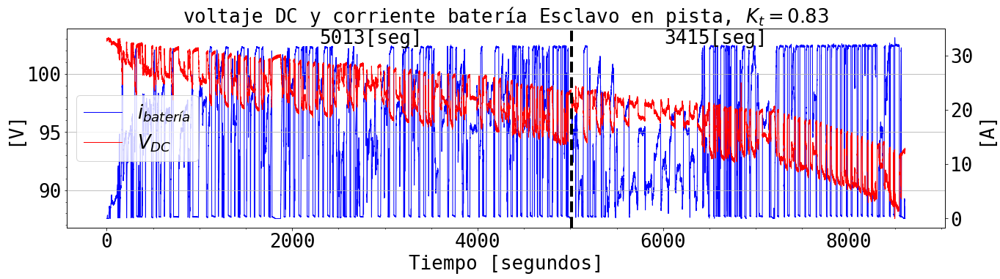

In [ ]:
import matplotlib.transforms as transforms

tt1 = np.linspace(0, np.max(tm_p1), len(tm_p1))
tt2 = np.linspace(np.max(tm_p1), np.max(tm_p1)+np.max(tm_p2), len(tm_p2))
tt3 = np.linspace(np.max(tm_p1)+np.max(tm_p2), np.max(tm_p1)+np.max(tm_p2)+np.max(tm_p3), len(tm_p3))
time1 = np.concatenate((tt1, tt2, tt3), axis=0)


bat_I1 = np.asarray(dF1['2. Battery Current A (0.0625)'])
bat_I2 = np.asarray(dF2['2. Battery Current A (0.0625)'])
bat_I3 = np.asarray(dF3['2. Battery Current A (0.0625)'])
bat_I = np.concatenate((bat_I1, bat_I2, bat_I3), axis=0)
bat_V1 = np.asarray(dF1['2. Battery Voltage V (0.0625)'])
bat_V2 = np.asarray(dF2['2. Battery Voltage V (0.0625)'])
bat_V3 = np.asarray(dF3['2. Battery Voltage V (0.0625)'])
bat_V = np.concatenate((bat_V1, bat_V2, bat_V3), axis=0)
# bat_V[bat_V == 0.e+00] = np.mean(bat_V)
# bat_V[bat_V < 100] = np.mean(bat_V)
import matplotlib.transforms as transforms
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(35,5))
ax2 = ax1.twinx()
# axes2 = ax1.twiny()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()

# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("voltaje DC y corriente batería Esclavo en pista, $K_{t} = 0.83$", fontsize=26)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=26)
ax2.set_ylabel("[A]", fontsize=26)
ax1.set_ylabel("[V]", fontsize=26)
# ax1.plot(time1[:], Temp[:], color='blue', label="Corriente batería")
# ax1.plot(time1[:], bat_V[:], color='blue', label="Corriente batería")
# ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=2, label="$T^{o}[C]_{inversor}$")
# ax1.plot(time1[:], abs(Temp[:]), color='red',linewidth=2, label="$i_{batería}$")
line1, = ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=1, label='$i_{batería}$')
line2, = ax1.plot(time1[:], bat_V[:], color='red',linewidth=1, label='$V_{DC}$')

ax1.axvline(x=corte,
            linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
#             linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p1)-2000, 0.9, str(int(t1+t2))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p1)+np.max(tm_p2)+1000, 0.9, str(int((t3)))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.minorticks_on()
ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
ax2.tick_params(axis='x', labelsize=26)
ax2.tick_params(axis='y', labelsize=26)
lns = [line1, line2]
ax1.legend(handles=lns, loc='center left',  prop={'size': 26})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

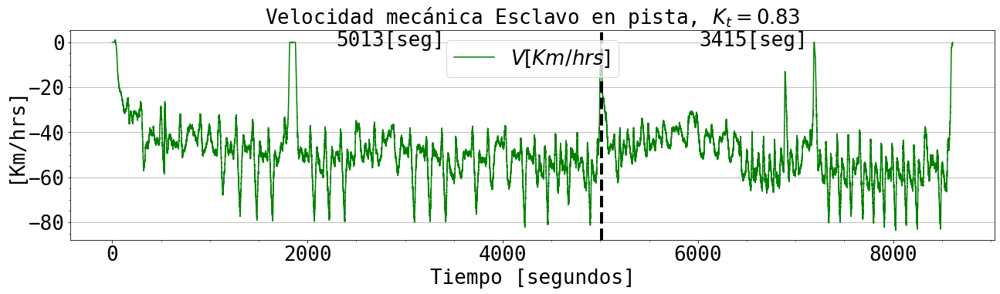

In [ ]:
import matplotlib.transforms as transforms

tt1 = np.linspace(0, np.max(tm_p1), len(tm_p1))
tt2 = np.linspace(np.max(tm_p1), np.max(tm_p1)+np.max(tm_p2), len(tm_p2))
tt3 = np.linspace(np.max(tm_p1)+np.max(tm_p2), np.max(tm_p1)+np.max(tm_p2)+np.max(tm_p3), len(tm_p3))
time1 = np.concatenate((tt1, tt2, tt3), axis=0)


v1 = np.asarray(dF1['2. Velocity RPM (1)'])
v2 = np.asarray(dF2['2. Velocity RPM (1)'])
v3 = np.asarray(dF3['2. Velocity RPM (1)'])
v = np.concatenate((v1,v2, v3), axis=0)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(35,5))
# ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()
# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("Velocidad mecánica Esclavo en pista, $K_{t} = 0.83$", fontsize=26)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=26)
ax1.set_ylabel("[Km/hrs]", fontsize=26)
ax1.set_ylabel("[Km/hrs]", fontsize=26)
# ax1.set_ylabel("[V]", fontsize=12)
line1, = ax1.plot(time1[:], (Rpm2KmHrs(v)), color='green', label="$V[Km/hrs]$")
ax1.axvline(x=corte,
            linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
#             linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p1)-2000, 0.9, str(int(t1+t2))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p1)+np.max(tm_p2)+1000, 0.9, str(int((t3)))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.minorticks_on()
# ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line1]
ax1.legend(handles=lns, loc='best',  prop={'size': 26})
ax1.grid(axis='y', which='major')
# ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

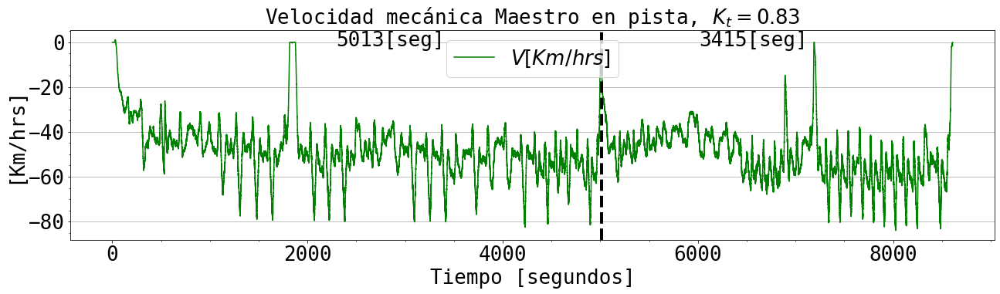

In [ ]:
import matplotlib.transforms as transforms

tt1 = np.linspace(0, np.max(tm_p1), len(tm_p1))
tt2 = np.linspace(np.max(tm_p1), np.max(tm_p1)+np.max(tm_p2), len(tm_p2))
tt3 = np.linspace(np.max(tm_p1)+np.max(tm_p2), np.max(tm_p1)+np.max(tm_p2)+np.max(tm_p3), len(tm_p3))
time1 = np.concatenate((tt1, tt2, tt3), axis=0)


v1 = np.asarray(dF1['1. Velocity RPM (1)'])
v2 = np.asarray(dF2['1. Velocity RPM (1)'])
v3 = np.asarray(dF3['1. Velocity RPM (1)'])
v = np.concatenate((v1,v2, v3), axis=0)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(35,5))
# ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()
# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("Velocidad mecánica Maestro en pista, $K_{t} = 0.83$", fontsize=26)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=26)
ax1.set_ylabel("[Km/hrs]", fontsize=26)
ax1.set_ylabel("[Km/hrs]", fontsize=26)
# ax1.set_ylabel("[V]", fontsize=12)
line1, = ax1.plot(time1[:], (Rpm2KmHrs(v)), color='green', label="$V[Km/hrs]$")
ax1.axvline(x=corte,
            linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
#             linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p1)-2000, 0.9, str(int(t1+t2))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p1)+np.max(tm_p2)+1000, 0.9, str(int((t3)))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.minorticks_on()
# ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line1]
ax1.legend(handles=lns, loc='best',  prop={'size': 26})
ax1.grid(axis='y', which='major')
# ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

5190.7432

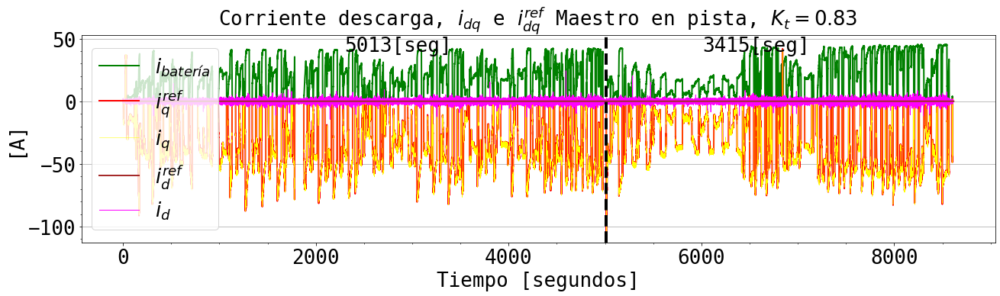

In [ ]:
import matplotlib.transforms as transforms

tt1 = np.linspace(0, np.max(tm_p1), len(tm_p1))
tt2 = np.linspace(np.max(tm_p1), np.max(tm_p1)+np.max(tm_p2), len(tm_p2))
tt3 = np.linspace(np.max(tm_p1)+np.max(tm_p2), np.max(tm_p1)+np.max(tm_p2)+np.max(tm_p3), len(tm_p3))
time1 = np.concatenate((tt1, tt2, tt3), axis=0)

corte = np.max(tm_p1)+np.max(tm_p2)

# iq2 = np.asarray(dF2['1. Iq A (0.0625)'])
# iq4 = np.asarray(dF4['1. Iq A (0.0625)'])
# iq5 = np.asarray(dF5['1. Iq A (0.0625)'])
# iq7 = np.asarray(dF7['1. Iq A (0.0625)'])
# Iq = np.concatenate((iq7, iq5, iq2, iq4), axis=0)

iq1 = np.asarray(butter_lowpass_filter(dF1['1. Iq A (0.0625)'], 3, 14, 3))
iq2 = np.asarray(butter_lowpass_filter(dF2['1. Iq A (0.0625)'], 3, 14, 3))
iq3 = np.asarray(butter_lowpass_filter(dF3['1. Iq A (0.0625)'], 3, 14, 3))
Iq = np.concatenate((iq1, iq2, iq3), axis=0)

# tiq2 = np.asarray(dF2['1. Target Iq A (0.0625)'])
# tiq4 = np.asarray(dF4['1. Target Iq A (0.0625)'])
# tiq5 = np.asarray(dF5['1. Target Iq A (0.0625)'])
# tiq7 = np.asarray(dF7['1. Target Iq A (0.0625)'])
# tiq = np.concatenate((tiq7, tiq5, tiq2, tiq4), axis=0)


tiq1 = np.asarray(butter_lowpass_filter(dF1['1. Target Iq A (0.0625)'], 3, 14, 3))
tiq2 = np.asarray(butter_lowpass_filter(dF2['1. Target Iq A (0.0625)'], 3, 14, 3))
tiq3 = np.asarray(butter_lowpass_filter(dF3['1. Target Iq A (0.0625)'], 3, 14, 3))
tiq = np.concatenate((tiq1, tiq2, tiq3), axis=0)

id1 = np.asarray(butter_lowpass_filter(dF1['1. Id A (0.0625)'], 3, 14, 3))
id2 = np.asarray(butter_lowpass_filter(dF2['1. Id A (0.0625)'], 3, 14, 3))
id3 = np.asarray(butter_lowpass_filter(dF3['1. Id A (0.0625)'], 3, 14, 3))
# id2 = np.asarray(dF2['1. Id A (0.0625)'])
# id4 = np.asarray(dF4['1. Id A (0.0625)'])
# id5 = np.asarray(dF5['1. Id A (0.0625)'])
# id7 = np.asarray(dF7['1. Id A (0.0625)'])
id = np.concatenate((id1, id2, id3), axis=0)

bat_I1 = np.asarray(dF1['1. Battery Current A (0.0625)'])
bat_I2 = np.asarray(dF2['1. Battery Current A (0.0625)'])
bat_I3 = np.asarray(dF3['1. Battery Current A (0.0625)'])
bat_I = np.concatenate((bat_I1, bat_I2, bat_I3), axis=0)

plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(35,5))
# ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()
# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("Corriente descarga, $i_{dq}$ e $i^{ref}_{dq}$ Maestro en pista, $K_{t} = 0.83$", fontsize=26)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=26)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
ax1.set_ylabel("[A]", fontsize=26)
# line1, = ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=1, label="$T^{o}[C]_{inversor}$")
# line2, = ax1.plot(time1[:], abs(Temp[:]), color='red',linewidth=1, label="$i_{batería}$")
line2, = ax1.plot(time1, bat_I, linewidth=2, color='green', label="$i_{batería}$")
line4, = ax1.plot(time1,(tiq) ,linewidth=2, color='red', label="$i^{ref}_{q}$")
line3, = ax1.plot(time1, (Iq), color='yellow',linewidth=0.5, label="$i_{q}$")
line7, = ax1.plot(time1, id,linewidth=1, color='magenta', label="$i_{d}$")
line1, = ax1.plot(time1, np.zeros(len(time1)),linewidth=2, color='brown', label="$i^{ref}_{d}$")

ax1.axvline(x=corte,
            linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
#             linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p1)-2000, 0.9, str(int(t1+t2))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p1)+np.max(tm_p2)+1000, 0.9, str(int((t3)))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)-380, 0.9, str(int(t2))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4)-1000, 0.9, str(int(t4))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)
ax1.minorticks_on()
# ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line2, line4, line3, line1, line7]
ax1.legend(handles=lns, loc='center left',  prop={'size': 26})
ax1.grid(axis='y', which='major')
# ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

In [ ]:
import numpy as np
import pandas as pd
150/(np.sqrt(3)*16*0.043)

125.87578543378471

In [ ]:
dd2 = 'bms_7_5.csv'
dd1= pd.read_csv(dd1 , sep=';')

TypeError: argument of type 'method' is not iterable

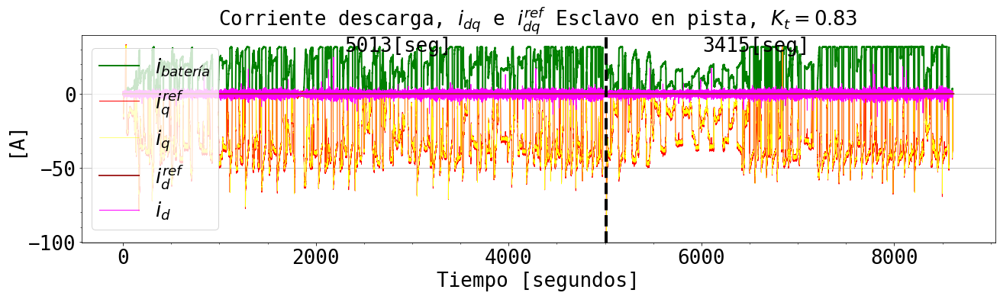

In [ ]:
import matplotlib.transforms as transforms

tt1 = np.linspace(0, np.max(tm_p1), len(tm_p1))
tt2 = np.linspace(np.max(tm_p1), np.max(tm_p1)+np.max(tm_p2), len(tm_p2))
tt3 = np.linspace(np.max(tm_p1)+np.max(tm_p2), np.max(tm_p1)+np.max(tm_p2)+np.max(tm_p3), len(tm_p3))
time1 = np.concatenate((tt1, tt2, tt3), axis=0)

corte = np.max(tm_p1)+np.max(tm_p2)

iq1 = 0.9*np.asarray(butter_lowpass_filter(Fd1['2. Iq A (0.0625)'], 3, 14, 3))
iq2 = 0.9*np.asarray(butter_lowpass_filter(Fd2['2. Iq A (0.0625)'], 3, 14, 3))
iq3 = 0.9*np.asarray(butter_lowpass_filter(Fd3['2. Iq A (0.0625)'], 3, 14, 3))
Iq = np.concatenate((iq1, iq2, iq3), axis=0)

# iq1 = np.asarray(butter_lowpass_filter(dF1['2. Iq A (0.0625)'], 3, 14, 3))
# iq2 = np.asarray(butter_lowpass_filter(dF2['2. Iq A (0.0625)'], 3, 14, 3))
# iq3 = np.asarray(butter_lowpass_filter(dF3['2. Iq A (0.0625)'], 3, 14, 3))
# Iq = np.concatenate((iq1, iq2, iq3), axis=0)

# tiq2 = np.asarray(dF2['1. Target Iq A (0.0625)'])
# tiq4 = np.asarray(dF4['1. Target Iq A (0.0625)'])
# tiq5 = np.asarray(dF5['1. Target Iq A (0.0625)'])
# tiq7 = np.asarray(dF7['1. Target Iq A (0.0625)'])
# tiq = np.concatenate((tiq7, tiq5, tiq2, tiq4), axis=0)


tiq1 = np.asarray(butter_lowpass_filter(dF1['2. Target Iq A (0.0625)'], 3, 14, 3))
tiq2 = np.asarray(butter_lowpass_filter(dF2['2. Target Iq A (0.0625)'], 3, 14, 3))
tiq3 = np.asarray(butter_lowpass_filter(dF3['2. Target Iq A (0.0625)'], 3,14, 3))
tiq = np.concatenate((tiq1, tiq2, tiq3), axis=0)

id1 = np.asarray(butter_lowpass_filter(dF1['2. Id A (0.0625)'], 3, 14, 3))
id2 = np.asarray(butter_lowpass_filter(dF2['2. Id A (0.0625)'], 3, 14, 3))
id3 = np.asarray(butter_lowpass_filter(dF3['2. Id A (0.0625)'], 3, 14, 3))
# id2 = np.asarray(dF2['1. Id A (0.0625)'])
# id4 = np.asarray(dF4['1. Id A (0.0625)'])
# id5 = np.asarray(dF5['1. Id A (0.0625)'])
# id7 = np.asarray(dF7['1. Id A (0.0625)'])
id = np.concatenate((id1, id2, id3), axis=0)

bat_I1 = np.asarray(dF1['2. Battery Current A (0.0625)'])
bat_I2 = np.asarray(dF2['2. Battery Current A (0.0625)'])
bat_I3 = np.asarray(dF3['2. Battery Current A (0.0625)'])
bat_I = np.concatenate((bat_I1, bat_I2, bat_I3), axis=0)

plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(35,5))
# ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()
# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("Corriente descarga, $i_{dq}$ e $i^{ref}_{dq}$ Esclavo en pista, $K_{t} = 0.83$", fontsize=26)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=26)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
ax1.set_ylabel("[A]", fontsize=26)
# line1, = ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=1, label="$T^{o}[C]_{inversor}$")
# line2, = ax1.plot(time1[:], abs(Temp[:]), color='red',linewidth=1, label="$i_{batería}$")
line2, = ax1.plot(time1, bat_I, linewidth=2, color='green', label="$i_{batería}$")

line4, = ax1.plot(time1, np.asarray(Iq) ,linewidth=1, color='red', label="$i^{ref}_{q}$")
line3, = ax1.plot(time1, 0.9*np.asarray(tiq), color='yellow',linewidth=0.5, label="$i_{q}$")

line7, = ax1.plot(time1, id,linewidth=1, color='magenta', label="$i_{d}$")
line1, = ax1.plot(time1, np.zeros(len(time1)),linewidth=2, color='brown', label="$i^{ref}_{d}$")

ax1.axvline(x=corte,
            linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
#             linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p1)-2000, 0.9, str(int(t1+t2))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p1)+np.max(tm_p2)+1000, 0.9, str(int((t3)))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)-380, 0.9, str(int(t2))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4)-1000, 0.9, str(int(t4))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)
ax1.minorticks_on()
# ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line2, line4, line3, line1, line7]
ax1.legend(handles=lns, loc='center left',  prop={'size': 26})
ax1.grid(axis='y', which='major')
# ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

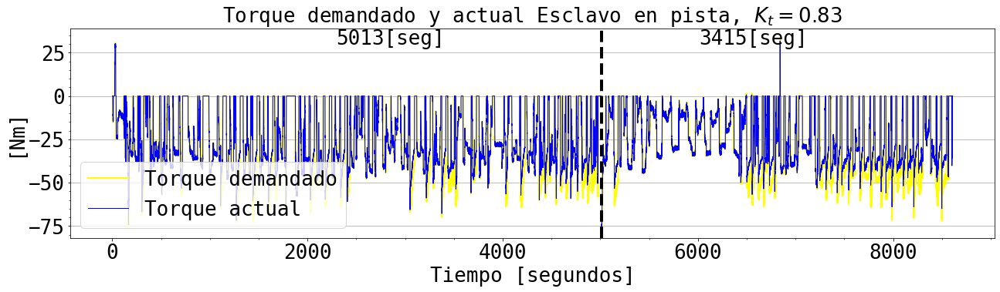

In [ ]:
import matplotlib.transforms as transforms

tt1 = np.linspace(0, np.max(tm_p1), len(tm_p1))
tt2 = np.linspace(np.max(tm_p1), np.max(tm_p1)+np.max(tm_p2), len(tm_p2))
tt3 = np.linspace(np.max(tm_p1)+np.max(tm_p2), np.max(tm_p1)+np.max(tm_p2)+np.max(tm_p3), len(tm_p3))
time1 = np.concatenate((tt1, tt2, tt3), axis=0)


# ['1. Uq V (0.0625)']
tdem1 = np.asarray(dF1['2. Torque demand value Nm (0.0625)'])
tdem2 = np.asarray(dF2['2. Torque demand value Nm (0.0625)'])
tdem3 = np.asarray(dF3['2. Torque demand value Nm (0.0625)'])
tdem = np.concatenate((tdem1, tdem2, tdem3), axis=0)
tem1 = np.asarray(dF1['2. Torque actual value Nm (0.0625)'])
tem2 = np.asarray(dF2['2. Torque actual value Nm (0.0625)'])
tem3 = np.asarray(dF3['2. Torque actual value Nm (0.0625)'])
tem = np.concatenate((tem1, tem2, tem3), axis=0)

plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(35,5))
# ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()
# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("Torque demandado y actual Esclavo en pista, $K_{t} = 0.83$", fontsize=26)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=26)
ax1.set_ylabel("[Nm]", fontsize=26)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
# ax1.set_ylabel("[V]", fontsize=12)
# line1, = ax1.plot(time1[:], (Rpm2KmHrs(v)), color='green', label="$V[Km/hrs]$")
# line1, = ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=1, label="$T^{o}[C]_{inversor}$")
# line2, = ax1.plot(time1[:], abs(Temp[:]), color='red',linewidth=1, label="$i_{batería}$")
# line2, = ax1.plot(time1, uq, color='red', label="$v_{q}$")
# line3, = ax1.plot(time1, ud, color='blue', label="$v_{d}$")

line4, = ax1.plot(time1, tdem, color='yellow',linewidth=2,  label="Torque demandado")
line5, = ax1.plot(time1, tem, color='blue',linewidth=1,  label="Torque actual")

ax1.axvline(x=corte,
            linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
#             linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p1)-2000, 0.9, str(int(t1+t2))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p1)+np.max(tm_p2)+1000, 0.9, str(int((t3)))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.minorticks_on()
# ax1.axvline(x=np.max(tm_p7),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.text(np.max(tm_p7)-1000, 0.8, str(int(t7))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)-600, 0.8, str(int(t5))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)-380, 0.8, str(int(t2))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4)-1000, 0.8, str(int(t4))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)
ax1.minorticks_on()
# ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line4,line5]
ax1.legend(handles=lns, loc='lower left',  prop={'size': 26})
ax1.grid(axis='y', which='major')
# ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

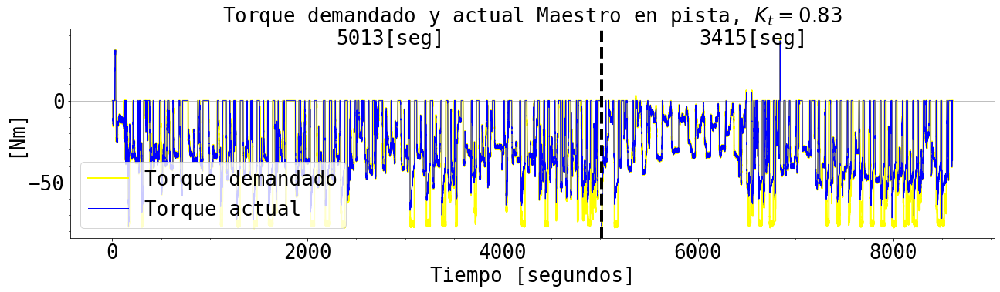

In [ ]:
import matplotlib.transforms as transforms

tt1 = np.linspace(0, np.max(tm_p1), len(tm_p1))
tt2 = np.linspace(np.max(tm_p1), np.max(tm_p1)+np.max(tm_p2), len(tm_p2))
tt3 = np.linspace(np.max(tm_p1)+np.max(tm_p2), np.max(tm_p1)+np.max(tm_p2)+np.max(tm_p3), len(tm_p3))
time1 = np.concatenate((tt1, tt2, tt3), axis=0)


# ['1. Uq V (0.0625)']
tdem1 = np.asarray(dF1['1. Torque demand value Nm (0.0625)'])
tdem2 = np.asarray(dF2['1. Torque demand value Nm (0.0625)'])
tdem3 = np.asarray(dF3['1. Torque demand value Nm (0.0625)'])
tdem = np.concatenate((tdem1, tdem2, tdem3), axis=0)
tem1 = np.asarray(dF1['1. Torque actual value Nm (0.0625)'])
tem2 = np.asarray(dF2['1. Torque actual value Nm (0.0625)'])
tem3 = np.asarray(dF3['1. Torque actual value Nm (0.0625)'])
tem = np.concatenate((tem1, tem2, tem3), axis=0)

plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(35,5))
# ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()
# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("Torque demandado y actual Maestro en pista, $K_{t} = 0.83$", fontsize=26)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=26)
ax1.set_ylabel("[Nm]", fontsize=26)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
# ax1.set_ylabel("[V]", fontsize=12)
# line1, = ax1.plot(time1[:], (Rpm2KmHrs(v)), color='green', label="$V[Km/hrs]$")
# line1, = ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=1, label="$T^{o}[C]_{inversor}$")
# line2, = ax1.plot(time1[:], abs(Temp[:]), color='red',linewidth=1, label="$i_{batería}$")
# line2, = ax1.plot(time1, uq, color='red', label="$v_{q}$")
# line3, = ax1.plot(time1, ud, color='blue', label="$v_{d}$")

line4, = ax1.plot(time1, tdem, color='yellow',linewidth=2,  label="Torque demandado")
line5, = ax1.plot(time1, tem, color='blue',linewidth=1,  label="Torque actual")

ax1.axvline(x=corte,
            linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
#             linewidth = 4, linestyle ="--", color="black")
ax1.text(np.max(tm_p1)-2000, 0.9, str(int(t1+t2))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.text(np.max(tm_p1)+np.max(tm_p2)+1000, 0.9, str(int((t3)))+'[seg]',size=26,color="black", verticalalignment='bottom', transform=trans)
ax1.minorticks_on()
# ax1.axvline(x=np.max(tm_p7),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.axvline(x=np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4),
#             linewidth = 4, linestyle ="--", color="black")
# ax1.text(np.max(tm_p7)-1000, 0.8, str(int(t7))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)-600, 0.8, str(int(t5))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)-380, 0.8, str(int(t2))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)+np.max(tm_p2)+np.max(tm_p4)-1000, 0.8, str(int(t4))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)
ax1.minorticks_on()
# ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line4,line5]
ax1.legend(handles=lns, loc='lower left',  prop={'size': 26})
ax1.grid(axis='y', which='major')
# ax2.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

71.58245000000001


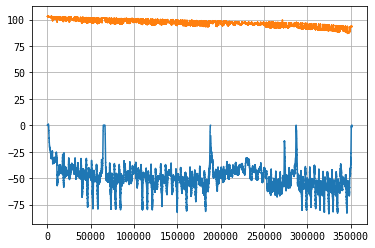

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

p =  'master_slave_carga_vizcachas_jose_270222_141131.csv'
p2 = 'master_slave_carga_vizcachas_jose_270222_142532.csv'
# p3 = 'master_slave_carga_vizcachas_jose_270222_163541.csv'
p4 = 'master_slave_carga_vizcachas_jose_270222_165945.csv'


tm_p= Ts(p)
dF_p = lect_var(p)
tm_p2 = Ts(p2)
dF_p2 = lect_var(p2)
# tm_p3 = Ts(p3)
# dF_p3 = lect_var(p3)
tm_p4 = Ts(p4)
dF_p4 = lect_var(p4)
# P = pandas.concat([dF_p['1. Velocity RPM (1)'], dF_p2['2. Velocity RPM (1)']])
P = np.concatenate((np.asarray(dF_p['1. Velocity RPM (1)']), (np.asarray(dF_p2['1. Velocity RPM (1)'])), (np.asarray(dF_p4['1. Velocity RPM (1)']))),axis = 0)
# P1 = np.concatenate((np.asarray(dF_p['1. Heatsink Temperature DegC (1)']), (np.asarray(dF_p2['1. Heatsink Temperature DegC (1)'])), (np.asarray(dF_p3['1. Heatsink Temperature DegC (1)'])), (np.asarray(dF_p4['1. Heatsink Temperature DegC (1)']))),axis = 0)
# P3 = np.concatenate((np.asarray(dF_p['1. Battery Current A (0.0625)']), (np.asarray(dF_p2['1. Battery Current A (0.0625)'])), (np.asarray(dF_p3['1. Battery Current A (0.0625)'])), (np.asarray(dF_p4['1. Battery Current A (0.0625)']))),axis = 0)
P3 = np.concatenate((np.asarray(dF_p['1. Battery Voltage V (0.0625)']), (np.asarray(dF_p2['1. Battery Voltage V (0.0625)'])), (np.asarray(dF_p4['1. Battery Voltage V (0.0625)']))),axis = 0)

# P = np.concatenate((np.asarray(dF_p['1. Heatsink Temperature DegC (1)']), (np.asarray(dF_p2['2. Heatsink Temperature DegC (1)']))),axis = 0)
# fig, ax1 = plt.subplots(figsize=(17,8))
# fig.subplots_adjust(right=0.6)
plt.plot(Rpm2KmHrs(P))
# plt.plot((P1))

plt.plot((P3))
# plt.plot((P1))

plt.grid(True)
# line1, = ax1.plot(tm_p, Rpm2KmHrs((dF_p['1. Velocity RPM (1)'])),linewidth=3, color='red', label="Velocidad")
# line2, = ax1.plot(tm_p, Rpm2KmHrs((dF_p['2. Velocity RPM (1)'])),linewidth=3, color='blue', label="Velocidad")
# ax1.grid(axis='y', which='major')
# # plt.show()
print((np.max(tm_p)-np.min(tm_p))/60)


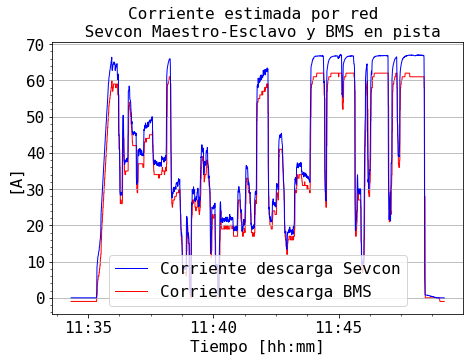

In [ ]:
dd1 = 'sevcon.csv'
dd2 = 'bms.csv'
dd1= pandas.read_csv(dd1 , sep=';')
dd2= pandas.read_csv(dd2 , sep=';')
t1 = np.linspace(0,1, len(dd1))
t2 = np.linspace(0,1, len(dd2))
e1 =  -dd1['der_battery_I'][4850:6600] - dd1['izq_battery_I'][4850:6600]
e2 = np.roll(dd2['Current'][5000:6750], 91)
from datetime import datetime as dt
from matplotlib import pyplot as plt, dates as mdates
from matplotlib.dates import DateFormatter

dd2['TIMESTAMP'] = pandas.to_datetime(dd2['TIMESTAMP'].str.split().str[-1])
T2 = dd2['TIMESTAMP'][5000:6750]

f = np.asarray(e1)-np.asarray(e2)
# plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))



# plt.rcParams["font.family"] = "monospace"
# fig, ax1 = plt.subplots(figsize=(9,9))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax1.spines["right"].set_position(("axes", 1.2))


ax1.set_title("Corriente estimada por red \n Sevcon Maestro-Esclavo y BMS en pista", fontsize=16)    
ax1.set_xlabel("Tiempo [hh:mm]", fontsize=16)
ax1.set_ylabel("[A]", fontsize=16)
# ax2.set_ylabel("[A]", fontsize=10)
# ax3.set_ylabel("[A]", fontsize=10)
line1, = ax1.plot(np.asarray(T2), np.asarray(e1),linewidth=1, color='blue', label="Corriente descarga Sevcon")
line2, = ax1.plot(np.asarray(T2),np.asarray(e2),linewidth=1, color='red', label="Corriente descarga BMS")
# line1.set_zorder(-1)
line2.set_zorder(-1)
# line3.set_zorder(-1)
# line4.set_zorder(-1)
# line6.set_zorder(-1)
# line2.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
lns = [line1, line2]
ax1.legend(handles=lns, loc='best',  prop={'size': 16})
ax1.grid(axis='y', which='major')
hh_mm = DateFormatter('%H:%M')
ax1.xaxis.set_major_formatter(hh_mm)
ax1.xaxis.set_major_formatter(hh_mm)
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

C:\Users\luisd\AppData\Local\Temp\ipykernel_4532\3863313362.py:3: DtypeWarning: Columns (0,1,2,4,88,100,124) have mixed types. Specify dtype option on import or set low_memory=False.
  dd1= pandas.read_csv(dd1 , sep=',')


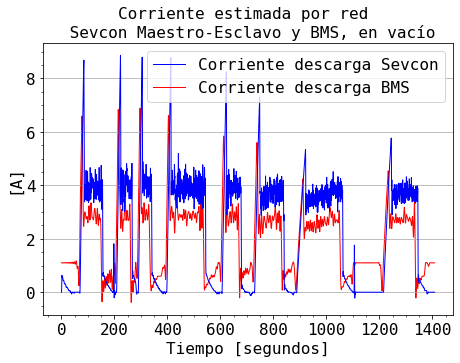

In [ ]:



from scipy import signal
dd1 = 'master_slave_500_current_050322_124523.csv'
dd1= pandas.read_csv(dd1 , sep=',')
ee = (dd1['2. Battery Current A (0.0625)'])+(dd1['1. Battery Current A (0.0625)'])
Fiempo = Ts('master_slave_500_current_050322_124523.csv')
D = butter_lowpass_filter(np.nan_to_num(ee[5000:]), 4, 133, 4)

dd2 = 'prueba2.csv'
dd2 = pandas.read_csv(dd2 , sep='\s+')

D1 = abs(dd2['Alod'])
sev = signal.resample(D, 3100)
BMS = signal.resample(D1, 3100)
Fiempo = signal.resample(Fiempo, 3100)


# plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))



# plt.rcParams["font.family"] = "monospace"
# fig, ax1 = plt.subplots(figsize=(9,9))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax1.spines["right"].set_position(("axes", 1.2))


ax1.set_title("Corriente estimada por red \n Sevcon Maestro-Esclavo y BMS, en vacío", fontsize=16)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=16)
ax1.set_ylabel("[A]", fontsize=16)
# ax2.set_ylabel("[A]", fontsize=10)
# ax3.set_ylabel("[A]", fontsize=10)
line1, = ax1.plot(np.linspace(0,np.max(Fiempo), len(Fiempo)),np.asarray(sev[:]),linewidth=1, color='blue', label="Corriente descarga Sevcon")
line2, = ax1.plot(np.linspace(0,np.max(Fiempo), len(Fiempo)), np.asarray(np.roll(BMS[:], 91)),linewidth=1, color='red', label="Corriente descarga BMS")
# line1.set_zorder(-1)
line2.set_zorder(-1)
# line3.set_zorder(-1)
# line4.set_zorder(-1)
# line6.set_zorder(-1)
# line2.set_zorder(-1)
ax1.minorticks_on()
# ax2.minorticks_on()
# ax3.minorticks_on()
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
lns = [line1, line2]
ax1.legend(handles=lns, loc='best',  prop={'size': 16})
ax1.grid(axis='y', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

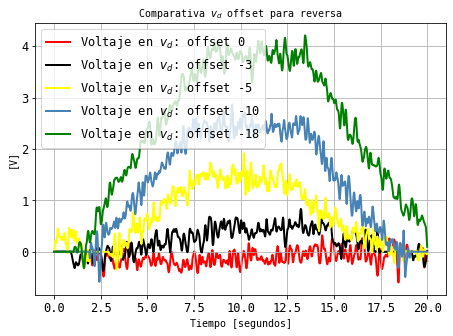

In [ ]:
prueba = 'master_slave_vacio_ofset0_5_070322_123135.csv'
prueba1 = 'master_slave_vacio_ofset10_5_070322_124318.csv'
prueba2 = 'master_slave_vacio_ofset18_5_070322_124738.csv'
prueba3 = 'master_slave_vacio_ofset5_5_070322_124031.csv'
prueba4 = 'master_slave_vacio_ofsetm3_070322_125209.csv'
tm = Ts(prueba)   #[4000:8000]#[5600:9700]
df = lect_var(prueba)  #[4000:8000]#[5600:9700]

tm1 = Ts(prueba1)   #[4000:8000]#[5600:9700]
df1 = lect_var(prueba1)  #[4000:8000]#[5600:9700]

tm2 = Ts(prueba2)   #[4000:8000]#[5600:9700]
df2 = lect_var(prueba2)  #[4000:8000]#[5600:9700]

tm3 = Ts(prueba3)   #[4000:8000]#[5600:9700]
df3 = lect_var(prueba3)  #[4000:8000]#[5600:9700]

tm4 = Ts(prueba4)   #[4000:8000]#[5600:9700]
df4 = lect_var(prueba4)  #[4000:8000]#[5600:9700]
# fig6, (ax7) = plt.subplots(figsize=(15, 11))
# ax7.set_title('Comparativa vd offset', fontsize=20)

ud3 = butter_lowpass_filter((df['1. Ud V (0.0625)'])[0:1300], 2, 30, 3) #1300
ud10 = butter_lowpass_filter((df1['1. Ud V (0.0625)'])[7600:9200], 2, 30, 3) #1600
ud18 = butter_lowpass_filter((df2['1. Ud V (0.0625)'])[0:1300], 2, 30, 3)#1400
ud5 = butter_lowpass_filter((df3['1. Ud V (0.0625)'])[2000:3800], 2, 30, 3)
ud0 = butter_lowpass_filter((df4['1. Ud V (0.0625)'])[0:1300], 2, 30, 3)#1280


# ax7.plot(np.linspace(0,20,len(ud0)), -ud0, color='red', linewidth=2, 
#          label='Voltaje en vd: offset 0')
# ax7.plot(np.linspace(0,20,len(ud3)), -ud3, color='black', linewidth=2, 
#          label='Voltaje en vd: offset -3')
# ax7.plot(np.linspace(0,20,len(ud5)), -ud5, color='yellow', linewidth=2, 
#          label='Voltaje en vd: offset -5')
# ax7.plot(np.linspace(0,20,len(ud10)), (-ud10), color='steelblue', linewidth=2, 
#          label='Voltaje en vd: offset -10')
# ax7.plot(np.linspace(0,20,len(ud18)), (-ud18), color='green', linewidth=2, 
#          label='Voltaje en vd: offset -18')


plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
fig.subplots_adjust(right=0.6)
# ax1.spines["right"].set_position(("axes", 1.2))
ax1.set_title("Comparativa $v_d$ offset para reversa", fontsize=10) 
ax1.set_xlabel("Tiempo [segundos]", fontsize=10)
ax1.set_ylabel("[V]", fontsize=10)


line1, = ax1.plot(np.linspace(0,20,len(ud0)), np.asarray(ud0), color='red', linewidth=2, label='Voltaje en $v_d$: offset 0')
line2, = ax1.plot(np.linspace(0,20,len(ud3)), np.asarray(ud3), color='black', linewidth=2, label='Voltaje en $v_d$: offset -3')
line3, = ax1.plot(np.linspace(0,20,len(ud5)), np.asarray(ud5), color='yellow', linewidth=2, label='Voltaje en $v_d$: offset -5')
line4, = ax1.plot(np.linspace(0,20,len(ud10)), np.asarray(ud10), color='steelblue', linewidth=2, label='Voltaje en $v_d$: offset -10')
line5, = ax1.plot(np.linspace(0,20,len(ud18)), np.asarray(ud18), color='green', linewidth=2, label='Voltaje en $v_d$: offset -18')
# line6, = ax1.plot(tm_p, dF_p['1. Ud V (0.0625)'], color='blue', label="$v_{d}$")
line1.set_zorder(-1)

ax1.tick_params(axis='x', labelsize=12)
ax1.tick_params(axis='y', labelsize=12)
lns = [line1, line2, line3, line4, line5]
ax1.legend(handles=lns, loc='upper left',  prop={'size': 12})
ax1.grid(axis='y', which='major')
ax1.grid(axis='x', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

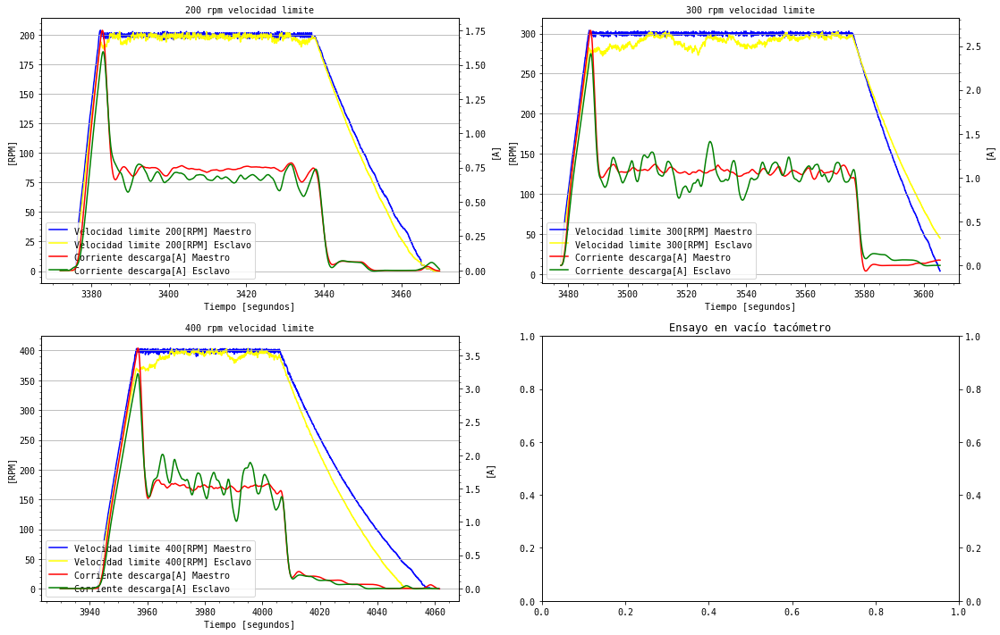

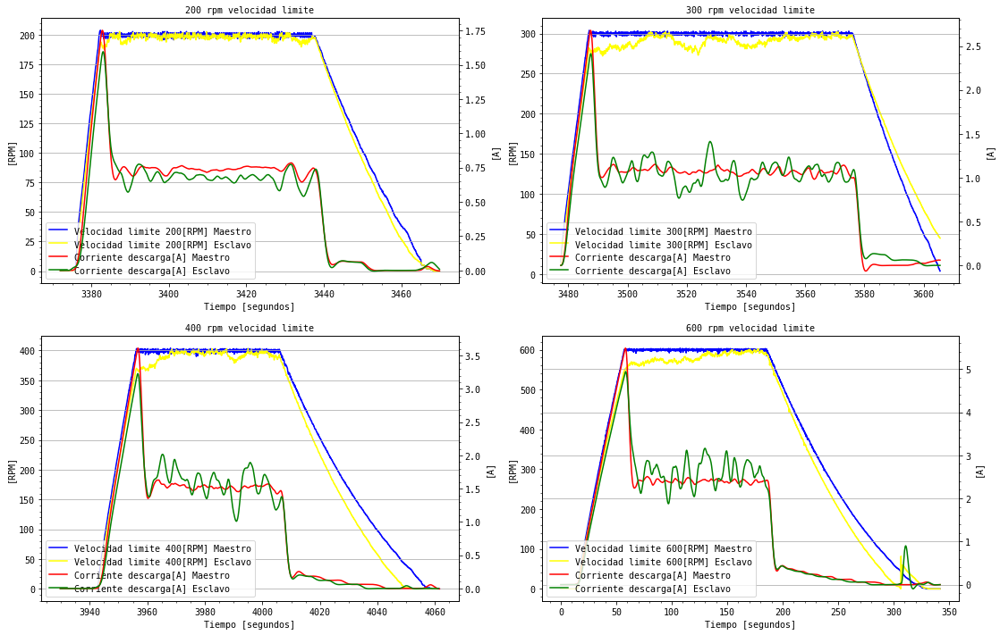

In [ ]:
d_REVERSA300 = 'master_slave_400_10_050322_122018.csv'
tm300 = Ts(d_REVERSA300)[4600:6300]   #[4000:8000]#[5600:9700]
dF_REVERSA300 = lect_var(d_REVERSA300)[4600:6300]   #[4000:8000]#[5600:9700]]
# plt.plot(tm300, abs(dF_REVERSA300['1. Velocity RPM (1)']))
# plt.plot(tm300, abs(dF_REVERSA300['2. Velocity RPM (1)']))
d_REVERSA200 = 'master_slave_400_10_050322_122018.csv'
tm200 = Ts(d_REVERSA200)[3200:4500]   #[4000:8000]#[5600:9700]
dF_REVERSA200 = lect_var(d_REVERSA200)[3200:4500]   #[4000:8000]#[5600:9700]]
# plt.plot(tm200, (abs(dF_REVERSA200['1. Velocity RPM (1)'])))
# plt.plot(tm200, (abs(dF_REVERSA200['2. Velocity RPM (1)'])))


d_REVERSA400 = 'master_slave_400_10_050322_122018.csv'
tm400= Ts(d_REVERSA400)[10600:]   #[4000:8000]#[5600:9700]
dF_REVERSA400 = lect_var(d_REVERSA400)[10600:]   #[4000:8000]#[5600:9700]]
# plt.plot((abs(dF_REVERSA['1. Velocity RPM (1)'])))
# plt.plot((abs(dF_REVERSA['2. Velocity RPM (1)'])))

# plt.plot(tm400, (abs(dF_REVERSA400['1. Velocity RPM (1)'])))
# plt.plot(tm400, (abs(dF_REVERSA400['2. Velocity RPM (1)'])))
d_REVERSA600 = 'master_slave_600_10_050322_123017.csv'
tm600 = Ts(d_REVERSA600)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_REVERSA600 = lect_var(d_REVERSA600)#[12000:16200]   #[4000:8000]#[5600:9700]]
# plt.plot(tm600, (abs(dF_REVERSA600['1. Velocity RPM (1)'])))
# plt.plot(tm600, (abs(dF_REVERSA600['2. Velocity RPM (1)'])))

fig, ((ax1, ax3), (ax4, ax5)) = plt.subplots(2, 2, figsize=(30, 12))
plt.title('Ensayo en vacío tacómetro')
ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax1.set_title("200 rpm velocidad limite", fontsize=10)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=10)
ax1.set_ylabel("[RPM]", fontsize=10)
ax2.set_ylabel("[A]", fontsize=10)

# butter_lowpass_filter(abs(np.asarray(dF_REVERSA['1. Battery Voltage V (0.0625)'])), 3, 200, 3)
# plt.plot(tm_prueba0, butter_lowpass_filter((dF_prueba0['1. Ud V (0.0625)']), 3, 200, 3), color='red', label="Corriente batería")

line1, = ax1.plot(tm200, abs(dF_REVERSA200['1. Velocity RPM (1)']), color='blue', label="Velocidad limite 200[RPM] Maestro")
line5, = ax1.plot(tm200, abs(dF_REVERSA200['2. Velocity RPM (1)']), color='yellow', label="Velocidad limite 200[RPM] Esclavo")
line25, = ax2.plot(tm200, butter_lowpass_filter(abs(np.asarray(dF_REVERSA200['1. Battery Current A (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
line35, = ax2.plot(tm200, butter_lowpass_filter(abs(np.asarray(dF_REVERSA200['2. Battery Current A (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
# line25, = ax2.plot(tm200, butter_lowpass_filter(abs(np.asarray(dF_REVERSA200['1. Ud V (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
# line35, = ax2.plot(tm200, butter_lowpass_filter(abs(np.asarray(dF_REVERSA200['2. Ud V (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
line1.set_zorder(-1)
line2.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=10)
ax1.tick_params(axis='y', labelsize=10)
lns = [line1, line5, line25, line35]
ax1.legend(handles=lns, loc='lower left',  prop={'size': 10})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')

ax9 = ax3.twinx()
fig.subplots_adjust(right=0.6)
ax3.set_title("300 rpm velocidad limite", fontsize=10)    
ax3.set_xlabel("Tiempo [segundos]", fontsize=10)
ax3.set_ylabel("[RPM]", fontsize=10)
ax9.set_ylabel("[A]", fontsize=10)
line19, = ax3.plot(tm300, (abs(dF_REVERSA300['1. Velocity RPM (1)'])), color='blue', label="Velocidad limite 300[RPM] Maestro")
line53, = ax3.plot(tm300, (abs(dF_REVERSA300['2. Velocity RPM (1)'])), color='yellow', label="Velocidad limite 300[RPM] Esclavo")
line119, = ax9.plot(tm300, butter_lowpass_filter(abs(np.asarray(dF_REVERSA300['1. Battery Current A (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
line153, = ax9.plot(tm300, butter_lowpass_filter(abs(np.asarray(dF_REVERSA300['2. Battery Current A (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
line19.set_zorder(-1)
line53.set_zorder(-1)
ax3.minorticks_on()
ax9.minorticks_on()
ax3.tick_params(axis='x', labelsize=10)
ax3.tick_params(axis='y', labelsize=10)
lns = [line19, line53, line119, line153]
ax3.legend(handles=lns, loc='lower left',  prop={'size': 10})
ax3.grid(axis='y', which='major')
ax9.grid(axis='x', which='major')

ax10 = ax4.twinx()
fig.subplots_adjust(right=0.6)
ax4.set_title("400 rpm velocidad limite", fontsize=10)    
ax4.set_xlabel("Tiempo [segundos]", fontsize=10)
ax4.set_ylabel("[RPM]", fontsize=10)
ax10.set_ylabel("[A]", fontsize=10)
line11, = ax4.plot(tm400, (abs(dF_REVERSA400['1. Velocity RPM (1)'])), color='blue', label="Velocidad limite 400[RPM] Maestro")
line51, = ax4.plot(tm400, (abs(dF_REVERSA400['2. Velocity RPM (1)'])), color='yellow', label="Velocidad limite 400[RPM] Esclavo")
line511, = ax10.plot(tm400, butter_lowpass_filter(abs(np.asarray(dF_REVERSA400['1. Battery Current A (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
line512, = ax10.plot(tm400, butter_lowpass_filter(abs(np.asarray(dF_REVERSA400['2. Battery Current A (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
# line511, = ax10.plot(tm400, butter_lowpass_filter(abs(np.asarray(dF_REVERSA400['1. Ud V (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
# line512, = ax10.plot(tm400, butter_lowpass_filter(abs(np.asarray(dF_REVERSA400['2. Ud V (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
line11.set_zorder(-1)
line51.set_zorder(-1)
ax4.minorticks_on()
ax10.minorticks_on()
ax4.tick_params(axis='x', labelsize=10)
ax4.tick_params(axis='y', labelsize=10)
lns = [line11, line51, line511, line512]
ax4.legend(handles=lns, loc='lower left',  prop={'size': 10})
ax4.grid(axis='y', which='major')
ax10.grid(axis='x', which='major')

ax11 = ax5.twinx()
# d_REVERSA300 = 'master_slave_400_10_050322_122018.csv'
tm300 = Ts(d_REVERSA300)[4600:6300]   #[4000:8000]#[5600:9700]
dF_REVERSA300 = lect_var(d_REVERSA300)[4600:6300]   #[4000:8000]#[5600:9700]]
# plt.plot(tm300, abs(dF_REVERSA300['1. Velocity RPM (1)']))
# plt.plot(tm300, abs(dF_REVERSA300['2. Velocity RPM (1)']))
d_REVERSA200 = 'master_slave_400_10_050322_122018.csv'
tm200 = Ts(d_REVERSA200)[3200:4500]   #[4000:8000]#[5600:9700]
dF_REVERSA200 = lect_var(d_REVERSA200)[3200:4500]   #[4000:8000]#[5600:9700]]
# plt.plot(tm200, (abs(dF_REVERSA200['1. Velocity RPM (1)'])))
# plt.plot(tm200, (abs(dF_REVERSA200['2. Velocity RPM (1)'])))


d_REVERSA400 = 'master_slave_400_10_050322_122018.csv'
tm400= Ts(d_REVERSA400)[10600:]   #[4000:8000]#[5600:9700]
dF_REVERSA400 = lect_var(d_REVERSA400)[10600:]   #[4000:8000]#[5600:9700]]
# plt.plot((abs(dF_REVERSA['1. Velocity RPM (1)'])))
# plt.plot((abs(dF_REVERSA['2. Velocity RPM (1)'])))

# plt.plot(tm400, (abs(dF_REVERSA400['1. Velocity RPM (1)'])))
# plt.plot(tm400, (abs(dF_REVERSA400['2. Velocity RPM (1)'])))
d_REVERSA600 = 'master_slave_600_10_050322_123017.csv'
tm600 = Ts(d_REVERSA600)#[12000:16200]   #[4000:8000]#[5600:9700]
dF_REVERSA600 = lect_var(d_REVERSA600)#[12000:16200]   #[4000:8000]#[5600:9700]]
# plt.plot(tm600, (abs(dF_REVERSA600['1. Velocity RPM (1)'])))
# plt.plot(tm600, (abs(dF_REVERSA600['2. Velocity RPM (1)'])))

fig, ((ax1, ax3), (ax4, ax5)) = plt.subplots(2, 2, figsize=(30, 12))
plt.title('Ensayo en vacío tacómetro')
ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax1.set_title("200 rpm velocidad limite", fontsize=10)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=10)
ax1.set_ylabel("[RPM]", fontsize=10)
ax2.set_ylabel("[A]", fontsize=10)

# butter_lowpass_filter(abs(np.asarray(dF_REVERSA['1. Battery Voltage V (0.0625)'])), 3, 200, 3)
# plt.plot(tm_prueba0, butter_lowpass_filter((dF_prueba0['1. Ud V (0.0625)']), 3, 200, 3), color='red', label="Corriente batería")

line1, = ax1.plot(tm200, abs(dF_REVERSA200['1. Velocity RPM (1)']), color='blue', label="Velocidad limite 200[RPM] Maestro")
line5, = ax1.plot(tm200, abs(dF_REVERSA200['2. Velocity RPM (1)']), color='yellow', label="Velocidad limite 200[RPM] Esclavo")
line25, = ax2.plot(tm200, butter_lowpass_filter(abs(np.asarray(dF_REVERSA200['1. Battery Current A (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
line35, = ax2.plot(tm200, butter_lowpass_filter(abs(np.asarray(dF_REVERSA200['2. Battery Current A (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
# line25, = ax2.plot(tm200, butter_lowpass_filter(abs(np.asarray(dF_REVERSA200['1. Ud V (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
# line35, = ax2.plot(tm200, butter_lowpass_filter(abs(np.asarray(dF_REVERSA200['2. Ud V (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
line1.set_zorder(-1)
line2.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=10)
ax1.tick_params(axis='y', labelsize=10)
lns = [line1, line5, line25, line35]
ax1.legend(handles=lns, loc='lower left',  prop={'size': 10})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')

ax9 = ax3.twinx()
fig.subplots_adjust(right=0.6)
ax3.set_title("300 rpm velocidad limite", fontsize=10)    
ax3.set_xlabel("Tiempo [segundos]", fontsize=10)
ax3.set_ylabel("[RPM]", fontsize=10)
ax9.set_ylabel("[A]", fontsize=10)
line19, = ax3.plot(tm300, (abs(dF_REVERSA300['1. Velocity RPM (1)'])), color='blue', label="Velocidad limite 300[RPM] Maestro")
line53, = ax3.plot(tm300, (abs(dF_REVERSA300['2. Velocity RPM (1)'])), color='yellow', label="Velocidad limite 300[RPM] Esclavo")
line119, = ax9.plot(tm300, butter_lowpass_filter(abs(np.asarray(dF_REVERSA300['1. Battery Current A (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
line153, = ax9.plot(tm300, butter_lowpass_filter(abs(np.asarray(dF_REVERSA300['2. Battery Current A (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
line19.set_zorder(-1)
line53.set_zorder(-1)
ax3.minorticks_on()
ax9.minorticks_on()
ax3.tick_params(axis='x', labelsize=10)
ax3.tick_params(axis='y', labelsize=10)
lns = [line19, line53, line119, line153]
ax3.legend(handles=lns, loc='lower left',  prop={'size': 10})
ax3.grid(axis='y', which='major')
ax9.grid(axis='x', which='major')

ax10 = ax4.twinx()
fig.subplots_adjust(right=0.6)
ax4.set_title("400 rpm velocidad limite", fontsize=10)    
ax4.set_xlabel("Tiempo [segundos]", fontsize=10)
ax4.set_ylabel("[RPM]", fontsize=10)
ax10.set_ylabel("[A]", fontsize=10)
line11, = ax4.plot(tm400, (abs(dF_REVERSA400['1. Velocity RPM (1)'])), color='blue', label="Velocidad limite 400[RPM] Maestro")
line51, = ax4.plot(tm400, (abs(dF_REVERSA400['2. Velocity RPM (1)'])), color='yellow', label="Velocidad limite 400[RPM] Esclavo")
line511, = ax10.plot(tm400, butter_lowpass_filter(abs(np.asarray(dF_REVERSA400['1. Battery Current A (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
line512, = ax10.plot(tm400, butter_lowpass_filter(abs(np.asarray(dF_REVERSA400['2. Battery Current A (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
# line511, = ax10.plot(tm400, butter_lowpass_filter(abs(np.asarray(dF_REVERSA400['1. Ud V (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
# line512, = ax10.plot(tm400, butter_lowpass_filter(abs(np.asarray(dF_REVERSA400['2. Ud V (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
line11.set_zorder(-1)
line51.set_zorder(-1)
ax4.minorticks_on()
ax10.minorticks_on()
ax4.tick_params(axis='x', labelsize=10)
ax4.tick_params(axis='y', labelsize=10)
lns = [line11, line51, line511, line512]
ax4.legend(handles=lns, loc='lower left',  prop={'size': 10})
ax4.grid(axis='y', which='major')
ax10.grid(axis='x', which='major')

ax11 = ax5.twinx()
fig.subplots_adjust(right=0.6)
ax5.set_title("600 rpm velocidad limite", fontsize=10)    
ax5.set_xlabel("Tiempo [segundos]", fontsize=10)
ax5.set_ylabel("[RPM]", fontsize=10)
ax11.set_ylabel("[A]", fontsize=10)
line14, = ax5.plot(tm600, (abs(dF_REVERSA600['1. Velocity RPM (1)'])), color='blue', label="Velocidad limite 600[RPM] Maestro")
line54, = ax5.plot(tm600, (abs(dF_REVERSA600['2. Velocity RPM (1)'])), color='yellow', label="Velocidad limite 600[RPM] Esclavo")
line541, = ax11.plot(tm600, butter_lowpass_filter(abs(np.asarray(dF_REVERSA600['1. Battery Current A (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
line542, = ax11.plot(tm600, butter_lowpass_filter(abs(np.asarray(dF_REVERSA600['2. Battery Current A (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
# line541, = ax5.plot(tm600, butter_lowpass_filter(abs(np.asarray(dF_REVERSA600['1. Ud V (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
# line541, = ax11.plot(tm600, butter_lowpass_filter(abs(np.asarray(dF_REVERSA600['2. Ud V (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
line14.set_zorder(-1)
line54.set_zorder(-1)
ax5.minorticks_on()
ax11.minorticks_on()
ax5.tick_params(axis='x', labelsize=10)
ax5.tick_params(axis='y', labelsize=10)
lns = [line14, line54,line541, line542]
ax11.legend(handles=lns, loc='lower left',  prop={'size': 10})
ax11.grid(axis='y', which='major')
ax11.grid(axis='x', which='major')
plt.show()
fig.subplots_adjust(right=0.6)
ax5.set_title("600 rpm velocidad limite", fontsize=10)    
ax5.set_xlabel("Tiempo [segundos]", fontsize=10)
ax5.set_ylabel("[RPM]", fontsize=10)
ax11.set_ylabel("[A]", fontsize=10)
line14, = ax5.plot(tm600, (abs(dF_REVERSA600['1. Velocity RPM (1)'])), color='blue', label="Velocidad limite 600[RPM] Maestro")
line54, = ax5.plot(tm600, (abs(dF_REVERSA600['2. Velocity RPM (1)'])), color='yellow', label="Velocidad limite 600[RPM] Esclavo")
line541, = ax11.plot(tm600, butter_lowpass_filter(abs(np.asarray(dF_REVERSA600['1. Battery Current A (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
line542, = ax11.plot(tm600, butter_lowpass_filter(abs(np.asarray(dF_REVERSA600['2. Battery Current A (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
# line541, = ax5.plot(tm600, butter_lowpass_filter(abs(np.asarray(dF_REVERSA600['1. Ud V (0.0625)'])), 3, 200, 3), color='red', label="Corriente descarga[A] Maestro")
# line541, = ax11.plot(tm600, butter_lowpass_filter(abs(np.asarray(dF_REVERSA600['2. Ud V (0.0625)'])), 3, 200, 3), color='green', label="Corriente descarga[A] Esclavo")
line14.set_zorder(-1)
line54.set_zorder(-1)
ax5.minorticks_on()
ax11.minorticks_on()
ax5.tick_params(axis='x', labelsize=10)
ax5.tick_params(axis='y', labelsize=10)
lns = [line14, line54,line541, line542]
ax11.legend(handles=lns, loc='lower left',  prop={'size': 10})
ax11.grid(axis='y', which='major')
ax11.grid(axis='x', which='major')
plt.show()

ERROR PI

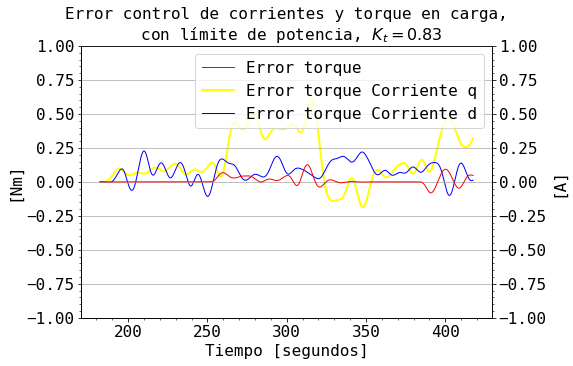

In [ ]:

# dd1 = 'master_slave_carga_vizcachas_jose_280222_185541.csv'



# dd1 = pandas.read_csv(dd1 , sep=',', low_memory=False)
# # # dd1 = dd1[600:1100]
# # plt.plot(abs(dd1['1. Battery Current A (0.0625)']))
# # plt.plot(butter_lowpass_filter(abs(dd1['1. Battery Current A (0.0625)']), 2, 100, 3))
# # plt.plot(butter_lowpass_filter(abs(dd1['1. Iq A (0.0625)']), 3, 100, 3))
# # plt.plot(butter_lowpass_filter(abs(dd1['1. Target Iq A (0.0625)']), 3, 100, 3))
# # plt.plot(butter_lowpass_filter(abs(dd1['1. Torque actual value Nm (0.0625)']), 2, 10, 3))
# # plt.plot(butter_lowpass_filter(abs(dd1['1. Torque demand value Nm (0.0625)']), 2, 10, 3))

# # plt.plot(Rpm2KmHrs(abs(dd1['1. Velocity RPM (1)'])))
# # plt.plot((df['1. Ud V (0.0625)']))
# # plt.plot(abs(df['1. Uq V (0.0625)']))
# # plt.plot(abs(df['1. Torque actual value Nm (0.0625)']))
# rq = (dd1['1. Target Iq A (0.0625)'])-(dd1['1. Iq A (0.0625)'])
# rq = butter_lowpass_filter(rq[:], 3, 1980, 6)
# plt.plot(rq)
# plt.grid(True)



import matplotlib.pyplot as plt
import numpy as np

d_REVERSA =  'master_slave_carga_vizcachas_jose_280222_185541.csv'
tm = Ts(d_REVERSA)[:]  #[4000:8000]#[5600:9700]
d_REVERSA = lect_var(d_REVERSA)[:]   #[4000:8000]#[5600:9700]
e = ((d_REVERSA['1. Torque demand value Nm (0.0625)'])) - ((d_REVERSA['1. Torque actual value Nm (0.0625)']))
et = ((d_REVERSA['1. Torque demand value Nm (0.0625)'])) - ((d_REVERSA['1. Torque actual value Nm (0.0625)']))
eq = ((d_REVERSA['1. Target Iq A (0.0625)'])) - ((d_REVERSA['1. Iq A (0.0625)']))
ed = ((d_REVERSA['1. Target Id A (0.0625)'])) - ((d_REVERSA['1. Id A (0.0625)']))
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
# ax3 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax1.set_ylim(-1,1)
ax2.set_ylim(-1, 1)
# ax3.set_ylim(-4, 5)
ax1.set_title("Error control de corrientes y torque en carga,\n con límite de potencia, $K_{t} = 0.83$", fontsize=16)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=16)
ax1.set_ylabel("[Nm]", fontsize=16)
ax2.set_ylabel("[A]", fontsize=16)
# ax3.set_ylabel("[A]", fontsize=10)
line1, = ax1.plot(tm[:12000] ,butter_lowpass_filter(et[:12000], 3, 1980, 6),linewidth=1, color='red', label="Error torque")
line2, = ax2.plot(tm[:12000] ,butter_lowpass_filter(eq[:12000], 3, 1980, 6),linewidth=2, color='yellow', label="Error torque Corriente q")
line3, = ax2.plot(tm[:12000], butter_lowpass_filter(ed[:12000], 3, 1980, 6),linewidth=1, color='blue', label="Error torque Corriente d")
# line1.set_zorder(-1)
line2.set_zorder(-1)
line3.set_zorder(-1)
# line4.set_zorder(-1)
# line6.set_zorder(-1)
# line2.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
# ax3.minorticks_on()
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
ax2.tick_params(axis='y', labelsize=16)

lns = [line1, line2, line3]
ax1.legend(handles=lns, loc='best',  prop={'size': 16})
ax1.grid(axis='y', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

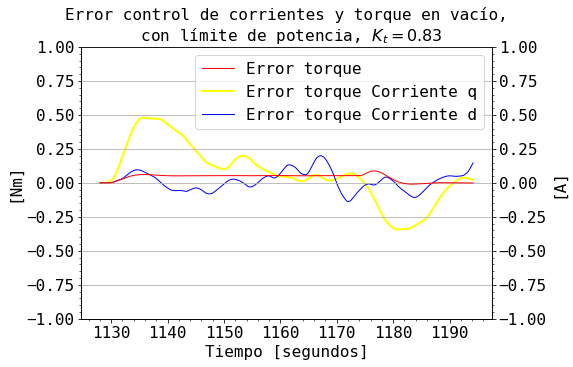

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
d_REVERSA = 'master_slave_UD_700_10_0_dir_250222_135507.csv'

d_REVERSA = 'master_slave_UD_800_5_0_dir_250222_123854.csv'
tm = Ts(d_REVERSA)[:]  #[4000:8000]#[5600:9700]
d_REVERSA = lect_var(d_REVERSA)[:]   #[4000:8000]#[5600:9700]
e = ((d_REVERSA['1. Torque demand value Nm (0.0625)'])) - ((d_REVERSA['1. Torque actual value Nm (0.0625)']))
et = ((d_REVERSA['1. Torque demand value Nm (0.0625)'])) - ((d_REVERSA['1. Torque actual value Nm (0.0625)']))
eq = ((d_REVERSA['1. Target Iq A (0.0625)'])) - ((d_REVERSA['1. Iq A (0.0625)']))
ed = ((d_REVERSA['1. Target Id A (0.0625)'])) - ((d_REVERSA['1. Id A (0.0625)']))
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
# ax3 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax1.set_ylim(-1,1)
ax2.set_ylim(-1, 1)
# ax3.set_ylim(-4, 5)
ax1.set_title("Error control de corrientes y torque en vacío,\n con límite de potencia, $K_{t} = 0.83$", fontsize=16)    
ax1.set_xlabel("Tiempo [segundos]", fontsize=16)
ax1.set_ylabel("[Nm]", fontsize=16)
ax2.set_ylabel("[A]", fontsize=16)
# ax3.set_ylabel("[A]", fontsize=10)
line1, = ax1.plot(tm, butter_lowpass_filter(et, 1, 550, 3),linewidth=1, color='red', label="Error torque")
line2, = ax2.plot(tm, butter_lowpass_filter(eq, 1, 550, 3),linewidth=2, color='yellow', label="Error torque Corriente q")
line3, = ax2.plot(tm, butter_lowpass_filter(ed, 1, 550, 3),linewidth=1, color='blue', label="Error torque Corriente d")
# line1.set_zorder(-1)
line2.set_zorder(-1)
line3.set_zorder(-1)
# line4.set_zorder(-1)
# line6.set_zorder(-1)
# line2.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
# ax3.minorticks_on()
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
ax2.tick_params(axis='y', labelsize=16)

lns = [line1, line2, line3]
ax1.legend(handles=lns, loc='best',  prop={'size': 16})
ax1.grid(axis='y', which='major')
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

CQARRETETA

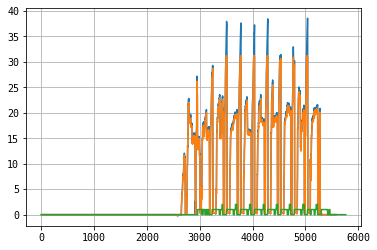

In [ ]:
import pandas as pd
dd1 = 'sevcon_7_5.csv'
dd2 = 'bms_7_5.csv'
dd1= pd.read_csv(dd1 , sep=';')
dd2= pd.read_csv(dd2 , sep=';')
plt.plot(-dd1['der_battery_I'][:])
plt.plot(-dd1['izq_battery_I'][:])
plt.plot(dd2['Current'][:])
plt.grid(True)

In [ ]:
sevcon = 'sevcon.csv'
bms = 'bms.csv'

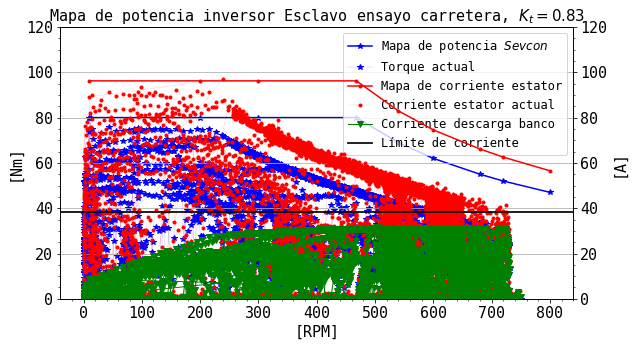

In [ ]:
dd1 = 'sevcon.csv'
dd2 = 'bms.csv'
dd1= pandas.read_csv(dd1 , sep=';')
dd2= pandas.read_csv(dd2 , sep=';')
# izq_motor_RPM
# der_torque_actual
# der_battery_I
# tm = Ts(d_REVERSA)#[7500:]   #[4000:8000]#[5600:9700]
# dF_REVERSA = lect_var(d_REVERSA)#[7500:]   #[4000:8000]#[5600:9700]
T_MAP = [80.0, 80.0, 80.0, 80.0, 69.0, 62.0, 55.0, 52.0, 47.0]
RPM_MAP = [10.0, 200, 300, 468, 540, 600, 680, 720, 800]
fig, ax1 = plt.subplots(figsize=(15,5))
trans = ax1.get_xaxis_transform()

ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax1.set_ylim(0, 120)
ax2.set_ylim(0, 120)
ax1.set_title("Mapa de potencia inversor Esclavo ensayo carretera, $K_{t} = 0.83$", fontsize=15)    
ax1.set_xlabel("[RPM]", fontsize=15)
ax1.set_ylabel("[Nm]", fontsize=15)
ax2.set_ylabel("[A]", fontsize=15)

line1, = ax1.plot(abs(dd1['izq_motor_RPM']), abs(dd1['izq_torque_actual']), linewidth=0.09,color='blue', marker = '*', label="Torque actual")
line2, = ax1.plot(RPM_MAP, np.asarray(T_MAP), linewidth=1.5,color='blue', marker = '*', label="Mapa de potencia $Sevcon$")
line3, = ax2.plot(abs(dd1['izq_motor_RPM']), abs(dd1['izq_I_quadrature']), linewidth=0.09,color='red', marker = '.', label="Corriente estator actual")
line4, = ax2.plot(RPM_MAP, np.asarray(T_MAP) / (np.sqrt(3)*16*0.03), linewidth=1.5,color='red', marker = '.', label="Mapa de corriente estator")
line5, = ax2.plot(abs(dd1['izq_motor_RPM']), -dd1['izq_battery_I'], linewidth=1,color='green', marker = 'v', label="Corriente descarga banco")
l2 = ax2.axhline(y = 4e3 / 104  ,color = 'black', linestyle = '-',linewidth=1.7, label='Límite de corriente')
# 0x4611,0: 0x12
# 0x4611,1: Pt 1 Max Torque: 80.0Nm (0x0500)
# 0x4611,2: Pt 1 Speed: 10RPM (0x000a)
# 0x4611,3: Pt 2 Max Torque: 80.0Nm (0x0500)
# 0x4611,4: Pt 2 Speed: 200RPM (0x00c8)
# 0x4611,5: Pt 3 Max Torque: 80.0Nm (0x0500)
# 0x4611,6: Pt 3 Speed: 300RPM (0x012c)
# 0x4611,7: Pt 4 Max Torque: 80.0Nm (0x0500)
# 0x4611,8: Pt 4 Speed: 468RPM (0x01d4)
# 0x4611,9: Pt 5 Max Torque: 69.0Nm (0x0450)
# 0x4611,10: Pt 5 Speed: 540RPM (0x021c)
# 0x4611,11: Pt 6 Max Torque: 62.0Nm (0x03e0)
# 0x4611,12: Pt 6 Speed: 600RPM (0x0258)
# 0x4611,13: Pt 7 Max Torque: 55.0Nm (0x0370)
# 0x4611,14: Pt 7 Speed: 680RPM (0x02a8)
# 0x4611,15: Pt 8 Max Torque: 52.0Nm (0x0340)
# 0x4611,16: Pt 8 Speed: 720RPM (0x02d0)
# 0x4611,17: Pt 9 Max Torque: 47.0Nm (0x02f0)
# 0x4611,18: Pt 9 Speed: 800RPM (0x0320)
# line1, = ax1.plot(abs(dF_REVERSA['1. Velocity RPM (1)']), abs(dF_REVERSA['1. Torque actual value Nm (0.0625)']), linewidth=0.09,color='blue', marker = '*', label="Torque actual")
# line2, = ax1.plot(RPM_MAP, np.asarray(T_MAP), linewidth=1.5,color='blue', marker = '*', label="Mapa de potencia escrito en Sevcon")
# line3, = ax2.plot(abs(dF_REVERSA['1. Velocity RPM (1)']), abs(dF_REVERSA['1. Iq A (0.0625)']), linewidth=0.09,color='red', marker = '.', label="Corriente estator actual")
# line4, = ax2.plot(RPM_MAP, np.asarray(T_MAP) / 0.8314, linewidth=1.5,color='red', marker = '.', label="Mapa de corriente de estator")
# line5, = ax2.plot(abs(dF_REVERSA['1. Velocity RPM (1)']), dF_REVERSA['1. Battery Current A (0.0625)'], linewidth=0.09,color='green', marker = 'v', label="Corriente descarga banco")
# l2 = ax2.axhline(y = 4e3 / 104  ,color = 'black', linestyle = '-',linewidth=1.7, label='Límite de corriente')
line1.set_zorder(-1)
line2.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
lns = [line2, line1, line4, line3, line5, l2]
ax1.legend(handles=lns, loc='upper right',  prop={'size': 12})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')
ax1.patch.set_visible(False)

plt.show()

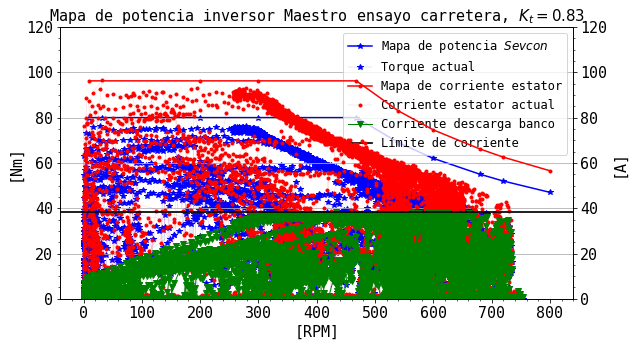

In [ ]:
dd1 = 'sevcon.csv'
dd2 = 'bms.csv'
dd1= pandas.read_csv(dd1 , sep=';')
dd2= pandas.read_csv(dd2 , sep=';')
# izq_motor_RPM
# der_torque_actual
# der_battery_I
# tm = Ts(d_REVERSA)#[7500:]   #[4000:8000]#[5600:9700]
# dF_REVERSA = lect_var(d_REVERSA)#[7500:]   #[4000:8000]#[5600:9700]
T_MAP = [80.0, 80.0, 80.0, 80.0, 69.0, 62.0, 55.0, 52.0, 47.0]
RPM_MAP = [10.0, 200, 300, 468, 540, 600, 680, 720, 800]
fig, ax1 = plt.subplots(figsize=(15,5))
ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax1.set_ylim(0, 120)
ax2.set_ylim(0, 120)
ax1.set_title("Mapa de potencia inversor Maestro ensayo carretera, $K_{t} = 0.83$", fontsize=15)    
ax1.set_xlabel("[RPM]", fontsize=15)
ax1.set_ylabel("[Nm]", fontsize=15)
ax2.set_ylabel("[A]", fontsize=15)
line1, = ax1.plot(abs(dd1['der_motor_RPM']), abs(dd1['der_torque_actual']), linewidth=0.09,color='blue', marker = '*', label="Torque actual")
line2, = ax1.plot(RPM_MAP, np.asarray(T_MAP), linewidth=1.5,color='blue', marker = '*', label="Mapa de potencia $Sevcon$")
line3, = ax2.plot(abs(dd1['der_motor_RPM']), abs(dd1['der_I_quadrature']), linewidth=0.09,color='red', marker = '.', label="Corriente estator actual")
line4, = ax2.plot(RPM_MAP, np.asarray(T_MAP) / (np.sqrt(3)*16*0.03), linewidth=1.5,color='red', marker = '.', label="Mapa de corriente estator")
line5, = ax2.plot(abs(dd1['der_motor_RPM']), -dd1['der_battery_I'], linewidth=1,color='green', marker = 'v', label="Corriente descarga banco")
l2 = ax2.axhline(y = 4e3 / 104  ,color = 'black', linestyle = '-',linewidth=1.7, label='Límite de corriente')
# 0x4611,0: 0x12
# 0x4611,1: Pt 1 Max Torque: 80.0Nm (0x0500)
# 0x4611,2: Pt 1 Speed: 10RPM (0x000a)
# 0x4611,3: Pt 2 Max Torque: 80.0Nm (0x0500)
# 0x4611,4: Pt 2 Speed: 200RPM (0x00c8)
# 0x4611,5: Pt 3 Max Torque: 80.0Nm (0x0500)
# 0x4611,6: Pt 3 Speed: 300RPM (0x012c)
# 0x4611,7: Pt 4 Max Torque: 80.0Nm (0x0500)
# 0x4611,8: Pt 4 Speed: 468RPM (0x01d4)
# 0x4611,9: Pt 5 Max Torque: 69.0Nm (0x0450)
# 0x4611,10: Pt 5 Speed: 540RPM (0x021c)
# 0x4611,11: Pt 6 Max Torque: 62.0Nm (0x03e0)
# 0x4611,12: Pt 6 Speed: 600RPM (0x0258)
# 0x4611,13: Pt 7 Max Torque: 55.0Nm (0x0370)
# 0x4611,14: Pt 7 Speed: 680RPM (0x02a8)
# 0x4611,15: Pt 8 Max Torque: 52.0Nm (0x0340)
# 0x4611,16: Pt 8 Speed: 720RPM (0x02d0)
# 0x4611,17: Pt 9 Max Torque: 47.0Nm (0x02f0)
# 0x4611,18: Pt 9 Speed: 800RPM (0x0320)
# line1, = ax1.plot(abs(dF_REVERSA['1. Velocity RPM (1)']), abs(dF_REVERSA['1. Torque actual value Nm (0.0625)']), linewidth=0.09,color='blue', marker = '*', label="Torque actual")
# line2, = ax1.plot(RPM_MAP, np.asarray(T_MAP), linewidth=1.5,color='blue', marker = '*', label="Mapa de potencia escrito en Sevcon")
# line3, = ax2.plot(abs(dF_REVERSA['1. Velocity RPM (1)']), abs(dF_REVERSA['1. Iq A (0.0625)']), linewidth=0.09,color='red', marker = '.', label="Corriente estator actual")
# line4, = ax2.plot(RPM_MAP, np.asarray(T_MAP) / 0.8314, linewidth=1.5,color='red', marker = '.', label="Mapa de corriente de estator")
# line5, = ax2.plot(abs(dF_REVERSA['1. Velocity RPM (1)']), dF_REVERSA['1. Battery Current A (0.0625)'], linewidth=0.09,color='green', marker = 'v', label="Corriente descarga banco")
# l2 = ax2.axhline(y = 4e3 / 104  ,color = 'black', linestyle = '-',linewidth=1.7, label='Límite de corriente')
line1.set_zorder(-1)
line2.set_zorder(-1)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
lns = [line2, line1, line4, line3, line5, l2]
ax1.legend(handles=lns, loc='upper right',  prop={'size': 12})
ax1.grid(axis='y', which='major')
ax2.grid(axis='x', which='major')
ax1.patch.set_visible(False)

plt.show()

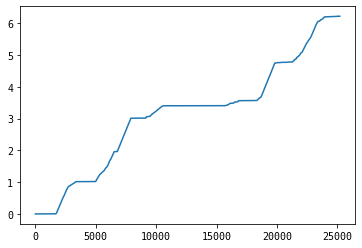

In [ ]:
from scipy import integrate

from datetime import datetime as dt
from matplotlib import pyplot as plt, dates as mdates
from matplotlib.dates import DateFormatter
dd1 = 'sevcon.csv'
dd2 = 'bms.csv'
dd1= pandas.read_csv(dd1 , sep=';')
dd2= pandas.read_csv(dd2 , sep=';')

# t1 = np.arange(0, 13000, 1, dtype=int)
# t1 = np.arange(0, 13000, 1, dtype=int)
t1 = np.linspace(0,13000, len(dd1))

t2 = np.linspace(0,13000, len(dd2))

ibms = (dd2['Current'][:])
I = -dd1['der_battery_I'][:]-dd1['izq_battery_I'][:]
# plt.plot(I[:9000])
x1 = t1
y1 = (I) / 3600
# np.linspace(np.min(), np.max(), len(y1))
y_int1 = integrate.cumtrapz(y1, x1, initial=0)
y_int1 = 100*y_int1
plt.plot(y_int1[:]/1000)

# x2 = t2
# y2 = (ibms) / 3600
# y_int2 = integrate.cumtrapz(y2, x2, initial=0)
# # y_int2 = 110 * y_int2
# plt.plot(y_int1[:])
# # plt.grid(True)
# # e = ibms-I

In [ ]:
T1[len(T1)-2]-T1[0]  
10800+ 2580
3634+2220+5580

11434

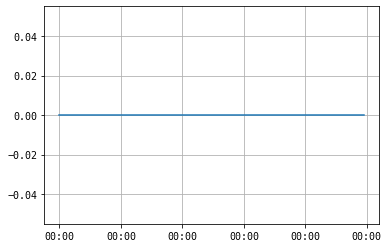

In [ ]:
from scipy import integrate

dd1 = 'sevcon.csv'
dd2 = 'bms.csv'
dd1= pandas.read_csv(dd1 , sep=';')
dd2= pandas.read_csv(dd2 , sep=';')

dd1['TIMESTAMP'] = pandas.to_datetime(dd1['TIMESTAMP'].str.split().str[-1])
T1 = dd1['TIMESTAMP'][:]

dd2['TIMESTAMP'] = pandas.to_datetime(dd2['TIMESTAMP'].str.split().str[-1])
T2 = dd2['TIMESTAMP'][:]

ibms = (dd2['Current'][:])
I = -dd1['der_battery_I'][:]-dd1['izq_battery_I'][:]
# plt.plot(I[:9000])
x1 = T1
y1 = (I) / 3600
y_int1 = integrate.cumtrapz(y1, x1, initial=0)
y_int1 = dd1['der_battery_V'][:] * y_int1
# plt.plot(y_int1[:8000])
x2 = T2
y2 = (ibms) / 3600
y_int2 = integrate.cumtrapz(y2, x2, initial=0)
y_int2 = 110 * y_int2

fig, ax = plt.subplots()
# ax.plot(T1, e1)
ax.plot(y_int1[:100])
# ax.plot(y_int2[:])
ax.grid(True)
hh_mm = DateFormatter('%H:%M')
ax.xaxis.set_major_formatter(hh_mm)
ax.xaxis.set_major_formatter(hh_mm)

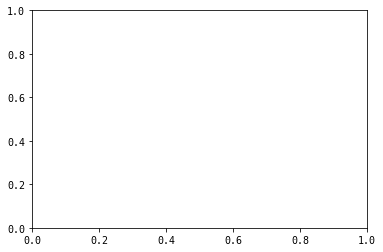

In [ ]:
from scipy import integrate
dd1 = 'sevcon.csv'
dd2 = 'bms.csv'
dd1= pandas.read_csv(dd1 , sep=';')
dd2= pandas.read_csv(dd2 , sep=';')
dd1['TIMESTAMP'] = pandas.to_datetime(dd1['TIMESTAMP'].str.split().str[-1])
T1 = dd1['TIMESTAMP'][:]
dd2['TIMESTAMP'] = pandas.to_datetime(dd2['TIMESTAMP'].str.split().str[-1])
T2 = dd2['TIMESTAMP'][:]
# e1 = -dd1['der_battery_I'][:]-dd1['izq_battery_I'][:]
# e2 = (dd2['Current'][:])
fig, ax = plt.subplots()
# ax.plot(e1)

Timedelta('0 days 00:37:50.727000')

In [ ]:
# (T2[10807:15339])
#  2022-06-24 12:23:38.030
#  2022-06-24 13:01:28.251 , 38min parado
 dd2['TIMESTAMP'][15339]-dd2['TIMESTAMP'][10807]

IndentationError: unexpected indent (1363167740.py, line 4)

In [ ]:
# (T2[15339:])
# 13:01:28.757
# 14:34:34.428 1hora y media

dd2['TIMESTAMP'][len(dd2['TIMESTAMP'])-2]-dd2['TIMESTAMP'][15339]

Timedelta('0 days 01:33:05.671000')

In [ ]:
60*60 +60*33

5580

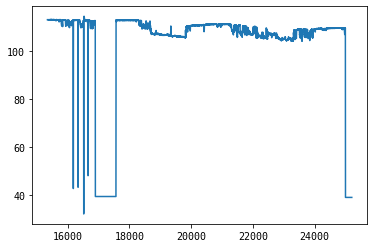

In [ ]:
plt.plot(dd1['der_battery_V'][15339:])

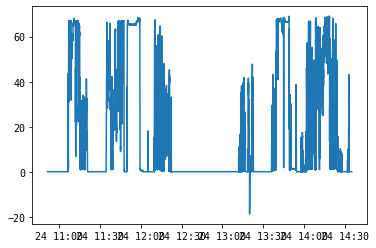

In [ ]:
from scipy import integrate

dd1 = 'sevcon.csv'
dd2 = 'bms.csv'
dd1= pandas.read_csv(dd1 , sep=';')
dd2= pandas.read_csv(dd2 , sep=';')

dd1['TIMESTAMP'] = pandas.to_datetime(dd1['TIMESTAMP'].str.split().str[-1])
T1 = dd1['TIMESTAMP'][:]
dd2['TIMESTAMP'] = pandas.to_datetime(dd2['TIMESTAMP'].str.split().str[-1])
T2 = dd2['TIMESTAMP'][:]


e1 = -dd1['der_battery_I'][:]-dd1['izq_battery_I'][:]
e2 = (dd2['Current'][:])

fig, ax = plt.subplots()
ax.plot(T1, e1)


In [ ]:
T1[8500]-T1[1400] 

Timedelta('0 days 01:00:34.181000')

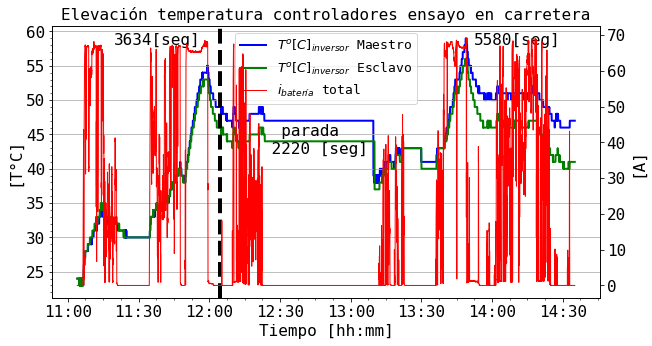

In [ ]:
from scipy import integrate
dd2 = 'sevcon.csv'
dd2= pandas.read_csv(dd2 , sep=';')
dd2['TIMESTAMP'] = pandas.to_datetime(dd2['TIMESTAMP'].str.split().str[-1])
T2 = dd2['TIMESTAMP'][:]
# ibms = (dd2['Current'][:])
# x2 = t2
# y2 = (ibms) / 3600
# y_int2 = integrate.cumtrapz(y2, x2, initial=0)
e1 = -dd1['der_battery_I'][:]-dd1['izq_battery_I'][:]

# y_int2 = 106 * y_int2
y_int2=dd2['der_inverter_temp']
y_int1=dd2['izq_inverter_temp']
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(16, 5))
trans = ax1.get_xaxis_transform()

fig.subplots_adjust(right=0.6)
# ax1.set_ylim(35, 65)
# fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax1.set_title("Elevación temperatura controladores ensayo en carretera", fontsize=16)    
ax1.set_xlabel("Tiempo [hh:mm]", fontsize=16)
ax1.set_ylabel("[T°C]", fontsize=16)
ax2.set_ylabel("[A]", fontsize=16)
line1, = ax1.plot(T2[1400:], abs(y_int2[1400:]), color='blue',linewidth=2, label="$T^{o}[C]_{inversor}$ Maestro")
line2, = ax1.plot(T2[1400:], abs(y_int1[1400:]), color='green',linewidth=2, label="$T^{o}[C]_{inversor}$ Esclavo")
line3, = ax2.plot(T2[1400:], abs(e1[1400:]), color='red',linewidth=1, label="$i_{batería}$ total")

ax1.axvline(x=T2[8500],
            linewidth = 4, linestyle ="--", color="black")

ax1.text(T2[3200], 0.92, str(3634)+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[20200], 0.92, str(int(5580))+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[10600], 0.52, '  parada\n 2220 [seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
# line2, = ax2.plot(tm, (dF_DIRECTA['1. Battery Voltage V (0.0625)']), color='red', label="Voltaje batería")
line1.set_zorder(-1)
ax1.minorticks_on()
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
ax2.tick_params(axis='x', labelsize=16)
ax2.tick_params(axis='y', labelsize=16)
lns = [line1, line2, line3]
ax1.legend(handles=lns, loc='upper center',  prop={'size': 13})
ax1.grid(axis='y', which='major')
hh_mm = DateFormatter('%H:%M')
ax1.xaxis.set_major_formatter(hh_mm)
ax1.xaxis.set_major_formatter(hh_mm)
ax1.patch.set_visible(False)

plt.show()

In [ ]:
from scipy import integrate

dd1 = 'sevcon.csv'
dd2 = 'bms.csv'
dd1= pandas.read_csv(dd1 , sep=';')
dd2= pandas.read_csv(dd2 , sep=';')

dd1['TIMESTAMP'] = pandas.to_datetime(dd1['TIMESTAMP'].str.split().str[-1])
T1 = dd1['TIMESTAMP'][:]
dd2['TIMESTAMP'] = pandas.to_datetime(dd2['TIMESTAMP'].str.split().str[-1])
T2 = dd2['TIMESTAMP'][:]


t1 = np.linspace(0,11434, len(dd1))
t2 = np.linspace(0,11434, len(dd2))
ibms = (dd2['Current'][:])
I = -dd1['der_battery_I'][:]-dd1['izq_battery_I'][:]
# plt.plot(I[:9000])
x1 = t1
y1 = (I) / 3600
y_int1 = integrate.cumtrapz(y1, x1, initial=0)
y_int1 = dd1['der_battery_V'][:] * y_int1
# plt.plot(y_int1[:8000])
x2 = t2
y2 = (ibms) / 3600
y_int2 = integrate.cumtrapz(y2, x2, initial=0)
y_int2 = 110 * y_int2

# fig, ax = plt.subplots()
# # ax.plot(T1, e1)
# ax.plot(y_int1[:])
# ax.plot(y_int2[:])
# ax.grid(True)
# hh_mm = DateFormatter('%H:%M')
# ax.xaxis.set_major_formatter(hh_mm)
# ax.xaxis.set_major_formatter(hh_mm)

plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(16, 5))
trans = ax1.get_xaxis_transform()

fig.subplots_adjust(right=0.6)
# ax1.set_ylim(35, 65)
# fig, ax1 = plt.subplots(figsize=(12,5))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax1.set_title("Consumo ensayo en carretera", fontsize=16)    
ax1.set_xlabel("Tiempo [hh:mm]", fontsize=16)
ax1.set_ylabel("[kWh]", fontsize=13)
# ax2.set_ylabel("[A]", fontsize=12)
line1, = ax1.plot(T2[:9000], y_int2[:9000]/1000, color='red',linewidth=2, label="Consumo ensayo carretera BMS")
line2, = ax1.plot(T1[:9000], y_int1[:9000]/1000, color='blue',linewidth=2, label="Consumo ensayo carretera Controladores")

# ax1.axvline(x=T2[8500],
#             linewidth = 4, linestyle ="--", color="black")

# ax1.text(T2[3200], 0.92, str(3634)+'[seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(T2[20200], 0.92, str(int(5580))+'[seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(T2[10600], 0.52, '  parada\n 2220 [seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.axvline(x=T1[8500],
#             linewidth = 4, linestyle ="--", color="black")
# ax1.text(T1[3200], 0.92, str(3634)+'[seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)-600, 0.9, str(int(t5))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)
# line2, = ax2.plot(tm, (dF_DIRECTA['1. Battery Voltage V (0.0625)']), color='red', label="Voltaje batería")
line1.set_zorder(-1)
ax1.minorticks_on()
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line2, line1]

ax1.legend(handles=lns, loc='best',  prop={'size': 13})
ax1.grid(axis='y', which='major')
hh_mm = DateFormatter('%H:%M')
ax1.xaxis.set_major_formatter(hh_mm)
ax1.xaxis.set_major_formatter(hh_mm)
ax1.patch.set_visible(False)

plt.show()

# fig, ax = plt.subplots()
# # ax.plot(T1, e1)
# # ax.plot(T1[:], y_int1[:])
# # ax.plot()
# hh_mm = DateFormatter('%H:%M')
# ax.xaxis.set_major_formatter(hh_mm)
# ax.xaxis.set_major_formatter(hh_mm)


FileNotFoundError: [Errno 2] No such file or directory: 'sevcon.csv'

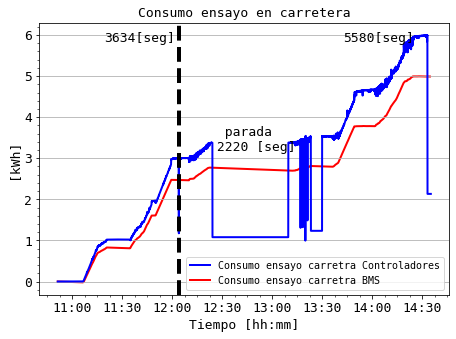

In [ ]:
from scipy import integrate

dd1 = 'sevcon.csv'
dd2 = 'bms.csv'
dd1= pandas.read_csv(dd1 , sep=';')
dd2= pandas.read_csv(dd2 , sep=';')

dd1['TIMESTAMP'] = pandas.to_datetime(dd1['TIMESTAMP'].str.split().str[-1])
T1 = dd1['TIMESTAMP'][:]
dd2['TIMESTAMP'] = pandas.to_datetime(dd2['TIMESTAMP'].str.split().str[-1])
T2 = dd2['TIMESTAMP'][:]


t1 = np.linspace(0,11434, len(dd1))
t2 = np.linspace(0,11434, len(dd2))
ibms = (dd2['Current'][:])
I = -dd1['der_battery_I'][:]-dd1['izq_battery_I'][:]
# plt.plot(I[:9000])
x1 = t1
y1 = (I) / 3600
y_int1 = integrate.cumtrapz(y1, x1, initial=0)
y_int1 = dd1['der_battery_V'][:] * y_int1
# plt.plot(y_int1[:8000])
x2 = t2
y2 = (ibms) / 3600
y_int2 = integrate.cumtrapz(y2, x2, initial=0)
y_int2 = 110 * y_int2

# fig, ax = plt.subplots()
# # ax.plot(T1, e1)
# ax.plot(y_int1[:])
# ax.plot(y_int2[:])
# ax.grid(True)
# hh_mm = DateFormatter('%H:%M')
# ax.xaxis.set_major_formatter(hh_mm)
# ax.xaxis.set_major_formatter(hh_mm)

plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(12, 5))
trans = ax1.get_xaxis_transform()

fig.subplots_adjust(right=0.6)
# ax1.set_ylim(35, 65)
# fig, ax1 = plt.subplots(figsize=(12,5))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
ax1.set_title("Consumo ensayo en carretera", fontsize=13)    
ax1.set_xlabel("Tiempo [hh:mm]", fontsize=13)
ax1.set_ylabel("[kWh]", fontsize=13)
# ax2.set_ylabel("[A]", fontsize=12)
line1, = ax1.plot(T2[:], y_int2[:]/1000, color='red',linewidth=2, label="Consumo ensayo carretra BMS")
line2, = ax1.plot(T1[:], y_int1[:]/1000, color='blue',linewidth=2, label="Consumo ensayo carretra Controladores")

ax1.axvline(x=T2[8500],
            linewidth = 4, linestyle ="--", color="black")

ax1.text(T2[3200], 0.92, str(3634)+'[seg]',size=13,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[20200], 0.92, str(int(5580))+'[seg]',size=13,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[10600], 0.52, '  parada\n 2220 [seg]',size=13,color="black", verticalalignment='bottom', transform=trans)
# ax1.axvline(x=T1[8500],
#             linewidth = 4, linestyle ="--", color="black")
# ax1.text(T1[3200], 0.92, str(3634)+'[seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)-600, 0.9, str(int(t5))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)
# line2, = ax2.plot(tm, (dF_DIRECTA['1. Battery Voltage V (0.0625)']), color='red', label="Voltaje batería")
line1.set_zorder(-1)
ax1.minorticks_on()
ax1.tick_params(axis='x', labelsize=13)
ax1.tick_params(axis='y', labelsize=13)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line2, line1]

ax1.legend(handles=lns, loc='best',  prop={'size': 10})
ax1.grid(axis='y', which='major')
hh_mm = DateFormatter('%H:%M')
ax1.xaxis.set_major_formatter(hh_mm)
ax1.xaxis.set_major_formatter(hh_mm)
plt.show()

# fig, ax = plt.subplots()
# # ax.plot(T1, e1)
# # ax.plot(T1[:], y_int1[:])
# # ax.plot()
# hh_mm = DateFormatter('%H:%M')
# ax.xaxis.set_major_formatter(hh_mm)
# ax.xaxis.set_major_formatter(hh_mm)


In [ ]:
T2 = dd2['TIMESTAMP'][:19000]
T2[8500]-T2[0]

Timedelta('0 days 01:13:10.647000')

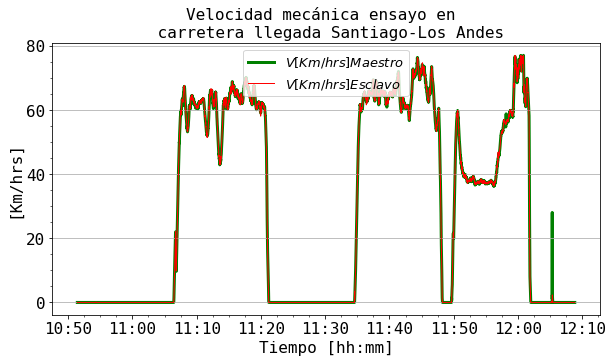

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# p = 'master_slave_pancho_1_120322_175724.csv'

# tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
# dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

from scipy import integrate
dd2 = 'sevcon.csv'
dd2= pandas.read_csv(dd2 , sep=';')
dd2['TIMESTAMP'] = pandas.to_datetime(dd2['TIMESTAMP'].str.split().str[-1])
T2 = dd2['TIMESTAMP'][:9000]
# ibms = (dd2['Current'][:])
# x2 = t2
# y2 = (ibms) / 3600
# y_int2 = integrate.cumtrapz(y2, x2, initial=0)
v1 = dd2['izq_motor_RPM'][:9000]
v2 = dd2['der_motor_RPM'][:9000]

plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(16,5))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
# ax1.set_title("Corriente y tensión $DC$ en ensayo en pista con límite de potencia", fontsize=12)    
# ax1.set_xlabel("Tiempo [segundos]", fontsize=12)

ax1.set_title("Velocidad mecánica ensayo en \n carretera llegada Santiago-Los Andes", fontsize=16)    
ax1.set_xlabel("Tiempo [hh:mm]", fontsize=16)
ax1.set_ylabel("[Km/hrs]", fontsize=16)
# ax2.set_ylabel("[V]", fontsize=10)
# ax1.set_ylim(-6, 22)
# ax2.set_ylim(-6, 30)
line1, = ax1.plot(T2[:9000], abs(Rpm2KmHrs(v1)),linewidth=3, color='green', label="$V[Km/hrs] Maestro$")
line2, = ax1.plot(T2[:9000], abs(Rpm2KmHrs(v2)),linewidth=1, color='red', label="$V[Km/hrs] Esclavo$")


# ax1.axvline(x=T2[8500],
#             linewidth = 4, linestyle ="--", color="black")

# ax1.text(T2[3200], 0.92, str(3634)+'[seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(T2[20200], 0.92, str(int(5580))+'[seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(T2[8000], 0.52, '  parada\n 2220 [seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.axvline(x=T1[8500],
#             linewidth = 4, linestyle ="--", color="black")

# ax1.text(T1[0], 0.92, str(3634)+'[seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)-600, 0.9, str(int(t5))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)


# line2, = ax2.plot(tm, (dF_DIRECTA['1. Battery Voltage V (0.0625)']), color='red', label="Voltaje batería")
line1.set_zorder(-1)
ax1.minorticks_on()
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line1, line2]
ax1.legend(handles=lns, loc='upper center',  prop={'size': 13})
ax1.grid(axis='y', which='major')
hh_mm = DateFormatter('%H:%M')
ax1.xaxis.set_major_formatter(hh_mm)
ax1.xaxis.set_major_formatter(hh_mm)
ax1.patch.set_visible(False)

plt.show()

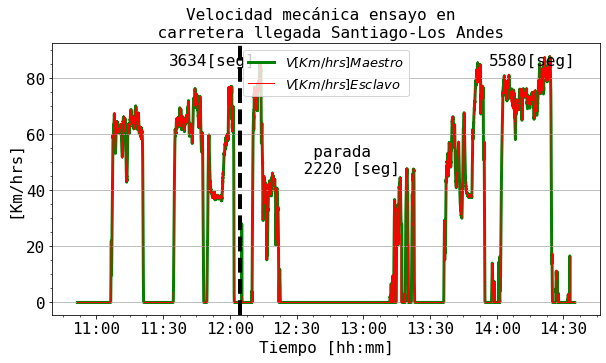

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# p = 'master_slave_pancho_1_120322_175724.csv'

# tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
# dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

from scipy import integrate
dd2 = 'sevcon.csv'
dd2= pandas.read_csv(dd2 , sep=';')
dd2['TIMESTAMP'] = pandas.to_datetime(dd2['TIMESTAMP'].str.split().str[-1])
T2 = dd2['TIMESTAMP']#[:13000]
# ibms = (dd2['Current'][:])
# x2 = t2
# y2 = (ibms) / 3600
# y_int2 = integrate.cumtrapz(y2, x2, initial=0)
v1 = dd2['izq_motor_RPM']#[:13000]
v2 = dd2['der_motor_RPM']#[:13000]

plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(16,5))
# ax2 = ax1.twinx()
# ax3 = ax1.twinx()
# ax4 = ax1.twinx()
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(-7, 60)
# ax2.set_ylim(-7, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
# ax1.set_title("Corriente y tensión $DC$ en ensayo en pista con límite de potencia", fontsize=12)    
# ax1.set_xlabel("Tiempo [segundos]", fontsize=12)

ax1.set_title("Velocidad mecánica ensayo en \n carretera llegada Santiago-Los Andes", fontsize=16)    
ax1.set_xlabel("Tiempo [hh:mm]", fontsize=16)
ax1.set_ylabel("[Km/hrs]", fontsize=16)
# ax2.set_ylabel("[V]", fontsize=10)
# ax1.set_ylim(-6, 22)
# ax2.set_ylim(-6, 30)
line1, = ax1.plot(T2[:], abs(Rpm2KmHrs(v1)),linewidth=3, color='green', label="$V[Km/hrs] Maestro$")
line2, = ax1.plot(T2[:], abs(Rpm2KmHrs(v2)),linewidth=1, color='red', label="$V[Km/hrs] Esclavo$")


ax1.axvline(x=T2[8500],
            linewidth = 4, linestyle ="--", color="black")

ax1.text(T2[2], 0.92, str(3634)+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[16000], 0.92, str(int(5580))+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[6500], 0.52, '  parada\n 2220 [seg]',size=16,color="black", verticalalignment='bottom', transform=trans)

# ax1.text(T1[0], 0.92, str(3634)+'[seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)-600, 0.9, str(int(t5))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)


# line2, = ax2.plot(tm, (dF_DIRECTA['1. Battery Voltage V (0.0625)']), color='red', label="Voltaje batería")
line1.set_zorder(-1)
ax1.minorticks_on()
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line1, line2]
ax1.legend(handles=lns, loc='upper center',  prop={'size': 13})
ax1.grid(axis='y', which='major')
hh_mm = DateFormatter('%H:%M')
ax1.xaxis.set_major_formatter(hh_mm)
ax1.xaxis.set_major_formatter(hh_mm)
ax1.patch.set_visible(False)

plt.show()

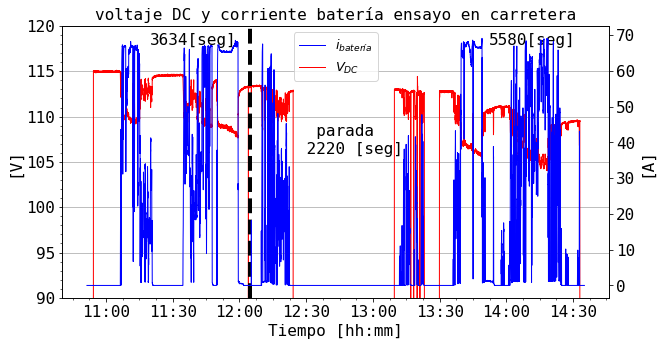

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# p = 'master_slave_pancho_1_120322_175724.csv'

# tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
# dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

from scipy import integrate
dd2 = 'sevcon.csv'
dd2= pandas.read_csv(dd2 , sep=';')
dd2['TIMESTAMP'] = pandas.to_datetime(dd2['TIMESTAMP'].str.split().str[-1])
T2 = dd2['TIMESTAMP'][:]
# ibms = (dd2['Current'][:])
# x2 = t2
# y2 = (ibms) / 3600
# y_int2 = integrate.cumtrapz(y2, x2, initial=0)
er1 = -dd2['der_battery_I'][:]- dd2['izq_battery_I'][:]
er2 = dd2['der_battery_V'][:]



import matplotlib.transforms as transforms
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(16,5))
ax2 = ax1.twinx()
# axes2 = ax1.twiny()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()

# ax1.set_ylim(0, 5)
ax1.set_ylim(90, 120)
ax1.set_title("voltaje DC y corriente batería ensayo en carretera", fontsize=16)    
ax1.set_xlabel("Tiempo [hh:mm]", fontsize=16)
ax2.set_ylabel("[A]", fontsize=16)
ax1.set_ylabel("[V]", fontsize=16)
# ax1.plot(time1[:], Temp[:], color='blue', label="Corriente batería")
# ax1.plot(time1[:], bat_V[:], color='blue', label="Corriente batería")
# ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=2, label="$T^{o}[C]_{inversor}$")
# ax1.plot(time1[:], abs(Temp[:]), color='red',linewidth=2, label="$i_{batería}$")
line1, = ax2.plot(T2[:], abs(er1[:]), color='blue',linewidth=1, label='$i_{batería}$')
line2, = ax1.plot(T2[:], er2[:], color='red',linewidth=1, label='$V_{DC}$')


ax1.axvline(x=T2[8500],
            linewidth = 4, linestyle ="--", color="black")

ax1.text(T2[3200], 0.92, str(3634)+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[20200], 0.92, str(int(5580))+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[11000], 0.52, '  parada\n 2220 [seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
# ax1.axvline(x=T1[8500],
#             linewidth = 4, linestyle ="--", color="black")

# ax1.text(T1[0], 0.92, str(3634)+'[seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)-600, 0.9, str(int(t5))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)

# line2, = ax2.plot(tm, (dF_DIRECTA['1. Battery Voltage V (0.0625)']), color='red', label="Voltaje batería")
line1.set_zorder(-1)
ax1.minorticks_on()
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
ax2.tick_params(axis='x', labelsize=16)
ax2.tick_params(axis='y', labelsize=16)
lns = [line1, line2]
ax1.legend(handles=lns, loc='upper center',  prop={'size': 13})
ax1.grid(axis='y', which='major')
hh_mm = DateFormatter('%H:%M')
ax1.xaxis.set_major_formatter(hh_mm)
ax1.xaxis.set_major_formatter(hh_mm)
ax1.patch.set_visible(False)

plt.show()

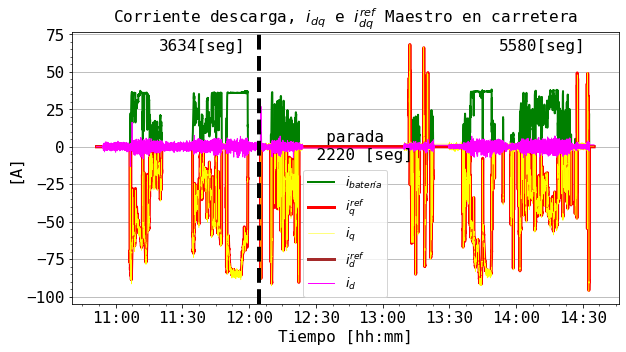

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# p = 'master_slave_pancho_1_120322_175724.csv'

# tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
# dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

from scipy import integrate
dd2 = 'sevcon.csv'
dd2= pandas.read_csv(dd2 , sep=';')
dd2['TIMESTAMP'] = pandas.to_datetime(dd2['TIMESTAMP'].str.split().str[-1])
T2 = dd2['TIMESTAMP'][:]
# ibms = (dd2['Current'][:])
# x2 = t2
# y2 = (ibms) / 3600
# y_int2 = integrate.cumtrapz(y2, x2, initial=0)
ib = -dd2['der_battery_I'][:]
tiq = dd2['der_target_I_quadrature'][:]
iq = dd2['der_I_quadrature'][:]
tid = dd2['der_target_I_direct'][:]
id = dd2['der_I_direct'][:]




import matplotlib.transforms as transforms
# axes2 = ax1.twiny()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()


plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(16,5))
# ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()
# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("Corriente descarga, $i_{dq}$ e $i^{ref}_{dq}$ Maestro en carretera", fontsize=16)    
ax1.set_xlabel("Tiempo [hh:mm]", fontsize=16)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
ax1.set_ylabel("[A]", fontsize=16)
# line1, = ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=1, label="$T^{o}[C]_{inversor}$")
# line2, = ax1.plot(time1[:], abs(Temp[:]), color='red',linewidth=1, label="$i_{batería}$")
line2, = ax1.plot(T2, ib, linewidth=2, color='green', label="$i_{batería}$")
line4, = ax1.plot(T2,(-tiq) ,linewidth=3, color='red', label="$i^{ref}_{q}$")
line3, = ax1.plot(T2, (-iq), color='yellow',linewidth=0.5, label="$i_{q}$")
line1, = ax1.plot(T2, tid,linewidth=3, color='brown', label="$i^{ref}_{d}$")
line7, = ax1.plot(T2, id,linewidth=1, color='magenta', label="$i_{d}$")


ax1.axvline(x=T2[8500],
            linewidth = 4, linestyle ="--", color="black")

ax1.text(T2[3200], 0.92, str(3634)+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[20200], 0.92, str(int(5580))+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[11000], 0.52, '  parada\n 2220 [seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
# ax1.axvline(x=T1[8500],
#             linewidth = 4, linestyle ="--", color="black")

# ax1.text(T1[0], 0.92, str(3634)+'[seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)-600, 0.9, str(int(t5))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)

# line2, = ax2.plot(tm, (dF_DIRECTA['1. Battery Voltage V (0.0625)']), color='red', label="Voltaje batería")
line1.set_zorder(-1)
ax1.minorticks_on()
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
ax2.tick_params(axis='x', labelsize=16)
ax2.tick_params(axis='y', labelsize=16)
lns = [line2,line4,line3, line1, line7]
ax1.legend(handles=lns, loc='lower center',  prop={'size': 13})
ax1.grid(axis='y', which='major')
hh_mm = DateFormatter('%H:%M')
ax1.xaxis.set_major_formatter(hh_mm)
ax1.xaxis.set_major_formatter(hh_mm)
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

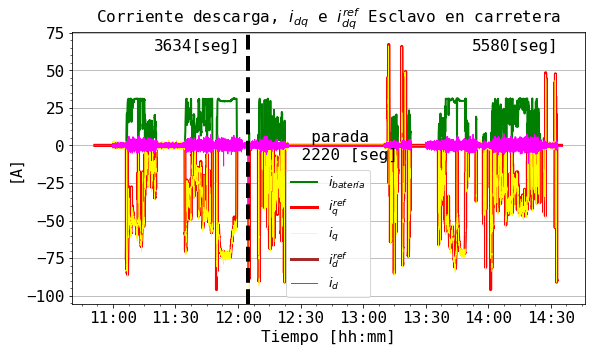

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# p = 'master_slave_pancho_1_120322_175724.csv'

# tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
# dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

from scipy import integrate
dd2 = 'sevcon.csv'
dd2= pandas.read_csv(dd2 , sep=';')
dd2['TIMESTAMP'] = pandas.to_datetime(dd2['TIMESTAMP'].str.split().str[-1])
T2 = dd2['TIMESTAMP'][:]
# ibms = (dd2['Current'][:])
# x2 = t2
# y2 = (ibms) / 3600
# y_int2 = integrate.cumtrapz(y2, x2, initial=0)
ib = -dd2['izq_battery_I'][:]
tiq = dd2['izq_target_I_quadrature'][:]
iq = dd2['izq_I_quadrature'][:]
tid = dd2['izq_target_I_direct'][:]
id = dd2['izq_I_direct'][:]




import matplotlib.transforms as transforms
# axes2 = ax1.twiny()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()


plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(15,5))
# ax2 = ax1.twinx()
fig.subplots_adjust(right=0.6)
trans = ax1.get_xaxis_transform()
# ax1.set_ylim(0, 5)
# ax2.set_ylim(100, 110)
ax1.set_title("Corriente descarga, $i_{dq}$ e $i^{ref}_{dq}$ Esclavo en carretera", fontsize=16)    
ax1.set_xlabel("Tiempo [hh:mm]", fontsize=16)
# ax1.set_ylabel("[Km/hrs]", fontsize=12)
ax1.set_ylabel("[A]", fontsize=15)
# line1, = ax2.plot(time1[:], abs(bat_I[:]), color='blue',linewidth=1, label="$T^{o}[C]_{inversor}$")
# line2, = ax1.plot(time1[:], abs(Temp[:]), color='red',linewidth=1, label="$i_{batería}$")
line2, = ax1.plot(T2, ib, linewidth=2, color='green', label="$i_{batería}$")
line4, = ax1.plot(T2,(-tiq) ,linewidth=3, color='red', label="$i^{ref}_{q}$")
line3, = ax1.plot(T2, (-iq), color='yellow',linewidth=0.5, label="$i_{q}$")
line1, = ax1.plot(T2, tid,linewidth=3, color='brown', label="$i^{ref}_{d}$")

line7, = ax1.plot(T2, id,linewidth=1, color='magenta', label="$i_{d}$")


ax1.axvline(x=T2[8500],
            linewidth = 4, linestyle ="--", color="black")

ax1.text(T2[3200], 0.92, str(3634)+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[20200], 0.92, str(int(5580))+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[11000], 0.52, '  parada\n 2220 [seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
# ax1.axvline(x=T1[8500],
#             linewidth = 4, linestyle ="--", color="black")

# ax1.text(T1[0], 0.92, str(3634)+'[seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)-600, 0.9, str(int(t5))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)

# line2, = ax2.plot(tm, (dF_DIRECTA['1. Battery Voltage V (0.0625)']), color='red', label="Voltaje batería")
line1.set_zorder(-1)
ax1.minorticks_on()
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
ax2.tick_params(axis='x', labelsize=16)
ax2.tick_params(axis='y', labelsize=16)
lns = [line2,line4,line3, line1, line7]
ax1.legend(handles=lns, loc='lower center',  prop={'size': 13})
ax1.grid(axis='y', which='major')
hh_mm = DateFormatter('%H:%M')
ax1.xaxis.set_major_formatter(hh_mm)
ax1.xaxis.set_major_formatter(hh_mm)
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

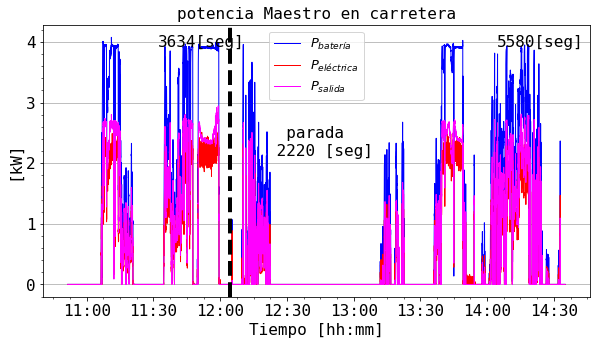

In [ ]:

import matplotlib.pyplot as plt
import numpy as np
# p = 'master_slave_pancho_1_120322_175724.csv'

# tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
# dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

from scipy import integrate
dd2 = 'sevcon.csv'
dd2= pandas.read_csv(dd2 , sep=';')
dd2['TIMESTAMP'] = pandas.to_datetime(dd2['TIMESTAMP'].str.split().str[-1])
T2 = dd2['TIMESTAMP'][:]
# ibms = (dd2['Current'][:])
# x2 = t2
# y2 = (ibms) / 3600
# y_int2 = integrate.cumtrapz(y2, x2, initial=0)
# ib = 
# tiq = dd2['izq_target_I_quadrature'][:]
# iq = dd2['izq_I_quadrature'][:]
# tid = dd2['izq_target_I_direct'][:]
# id = dd2['izq_I_direct'][:]


BatV = dd2['der_battery_V'][:]
BatI = -dd2['der_battery_I'][:]
Iq = -dd2['der_I_quadrature'][:]
Uq = dd2['der_V_quadrature'][:]
Id = dd2['der_I_direct'][:]
Ud = dd2['der_V_direct'][:]
Te = dd2['der_torque_actual'][:]
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad(dd2['der_motor_RPM'][:])

pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
pot_salida = Te * rad 
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)

DD = np.asarray(pot_salida) / np.asarray(pin)

# DD = abs(pot / pin)
DD[DD > 0.99999999999999] = np.mean(DD)
DD[DD == 0.e+00] = np.mean(DD)
DD[DD == 0] = np.mean(DD)
DD[DD == np.inf] = np.mean(DD)
DD = np.nan_to_num(DD)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(16,5))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax2 = ax1.twinx()
# line2, = ax2.plot(tm_p, (butter_lowpass_filter(100*D[:], 3, 124, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (butter_lowpass_filter((pin/1000), 3, 124, 3)),linewidth=1, color='blue', label="$P_{batería}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 124, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")

# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(0, 100)}
# ax1.set_ylim(0, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("potencia Maestro en carretera", fontsize=16)    
ax1.set_xlabel("Tiempo [hh:mm]", fontsize=16)
ax1.set_ylabel("[kW]", fontsize=16)
# ax1.set_ylabel("[%]", fontsize=13)
# line4, = ax1.plot(time1, abs((100*D[:])),linewidth=0.9, color='green', label="$\eta_{batería-inversor}$")
# line2, = ax1.plot(time1, abs((100*DD[:])),linewidth=0.9, color='brown', label="$\eta_{batería-motor}$")

line4, = ax1.plot(T2, abs(pin/1000),linewidth=1, color='blue', label="$P_{batería}$")
line3, = ax1.plot(T2, abs(pot/1000),linewidth=1, color='red', label="$P_{eléctrica}$")
line5, = ax1.plot(T2, abs(pot_salida/1000),linewidth=1, color='magenta', label="$P_{salida}$")



ax1.axvline(x=T2[8500],
            linewidth = 4, linestyle ="--", color="black")

ax1.text(T2[2], 0.92, str(3634)+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[18000], 0.92, str(int(5580))+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[6000], 0.52, '  parada\n 2220 [seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
# ax1.axvline(x=T1[8500],
#             linewidth = 4, linestyle ="--", color="black")

# ax1.text(T2[0], 0.6, str(3634)+'[seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)-600, 0.9, str(int(t5))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)

# line2, = ax2.plot(tm, (dF_DIRECTA['1. Battery Voltage V (0.0625)']), color='red', label="Voltaje batería")
line1.set_zorder(-1)
ax1.minorticks_on()
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
ax2.tick_params(axis='x', labelsize=16)
ax2.tick_params(axis='y', labelsize=16)
lns = [line4,line3, line5]
ax1.legend(handles=lns, loc='upper center',  prop={'size': 13})
ax1.grid(axis='y', which='major')
hh_mm = DateFormatter('%H:%M')
ax1.xaxis.set_major_formatter(hh_mm)
ax1.xaxis.set_major_formatter(hh_mm)
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

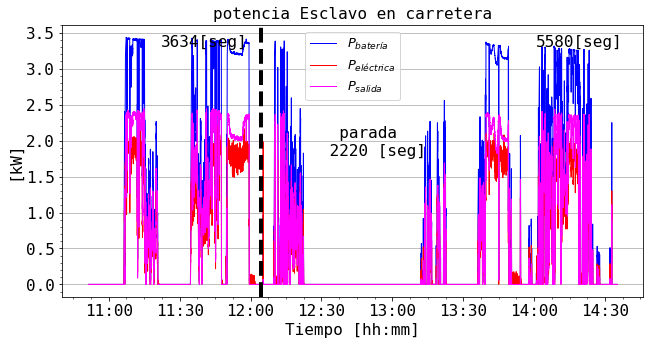

In [ ]:

import matplotlib.pyplot as plt
import numpy as np
# p = 'master_slave_pancho_1_120322_175724.csv'

# tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
# dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

from scipy import integrate
dd2 = 'sevcon.csv'
dd2= pandas.read_csv(dd2 , sep=';')
dd2['TIMESTAMP'] = pandas.to_datetime(dd2['TIMESTAMP'].str.split().str[-1])
T2 = dd2['TIMESTAMP'][:]
# ibms = (dd2['Current'][:])
# x2 = t2
# y2 = (ibms) / 3600
# y_int2 = integrate.cumtrapz(y2, x2, initial=0)
# ib = 
# tiq = dd2['izq_target_I_quadrature'][:]
# iq = dd2['izq_I_quadrature'][:]
# tid = dd2['izq_target_I_direct'][:]
# id = dd2['izq_I_direct'][:]


BatV = dd2['izq_battery_V'][:]
BatI = -dd2['izq_battery_I'][:]
Iq = -dd2['izq_I_quadrature'][:]
Uq = dd2['izq_V_quadrature'][:]
Id = dd2['izq_I_direct'][:]
Ud = dd2['izq_V_direct'][:]
Te = dd2['izq_torque_actual'][:]
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad(dd2['der_motor_RPM'][:])

pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
pot_salida = Te * rad 
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)

DD = np.asarray(pot_salida) / np.asarray(pin)

# DD = abs(pot / pin)
DD[DD > 0.99999999999999] = np.mean(DD)
DD[DD == 0.e+00] = np.mean(DD)
DD[DD == 0] = np.mean(DD)
DD[DD == np.inf] = np.mean(DD)
DD = np.nan_to_num(DD)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(17,5))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax2 = ax1.twinx()
# line2, = ax2.plot(tm_p, (butter_lowpass_filter(100*D[:], 3, 124, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (butter_lowpass_filter((pin/1000), 3, 124, 3)),linewidth=1, color='blue', label="$P_{batería}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 124, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")

# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(0, 100)}
# ax1.set_ylim(0, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("potencia Esclavo en carretera", fontsize=16)    
ax1.set_xlabel("Tiempo [hh:mm]", fontsize=16)
ax1.set_ylabel("[kW]", fontsize=16)
# ax1.set_ylabel("[%]", fontsize=13)
# line4, = ax1.plot(time1, abs((100*D[:])),linewidth=0.9, color='green', label="$\eta_{batería-inversor}$")
# line2, = ax1.plot(time1, abs((100*DD[:])),linewidth=0.9, color='brown', label="$\eta_{batería-motor}$")

line4, = ax1.plot(T2, abs(pin/1000),linewidth=1, color='blue', label="$P_{batería}$")
line3, = ax1.plot(T2, abs(pot/1000),linewidth=1, color='red', label="$P_{eléctrica}$")
line5, = ax1.plot(T2, abs(pot_salida/1000),linewidth=1, color='magenta', label="$P_{salida}$")


ax1.axvline(x=T2[8500],
            linewidth = 4, linestyle ="--", color="black")

ax1.text(T2[100], 0.92, str(3634)+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[20200], 0.92, str(int(5580))+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[9000], 0.52, '  parada\n 2220 [seg]',size=16,color="black", verticalalignment='bottom', transform=trans)

# ax1.axvline(x=T1[8500],
#             linewidth = 4, linestyle ="--", color="black")

# ax1.text(T2[0], 0.6, str(3634)+'[seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)-600, 0.9, str(int(t5))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)

# line2, = ax2.plot(tm, (dF_DIRECTA['1. Battery Voltage V (0.0625)']), color='red', label="Voltaje batería")
line1.set_zorder(-1)
ax1.minorticks_on()
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
ax2.tick_params(axis='x', labelsize=16)
ax2.tick_params(axis='y', labelsize=16)
lns = [line4,line3, line5]
ax1.legend(handles=lns, loc='upper center',  prop={'size': 13})
ax1.grid(axis='y', which='major')
hh_mm = DateFormatter('%H:%M')
ax1.xaxis.set_major_formatter(hh_mm)
ax1.xaxis.set_major_formatter(hh_mm)
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

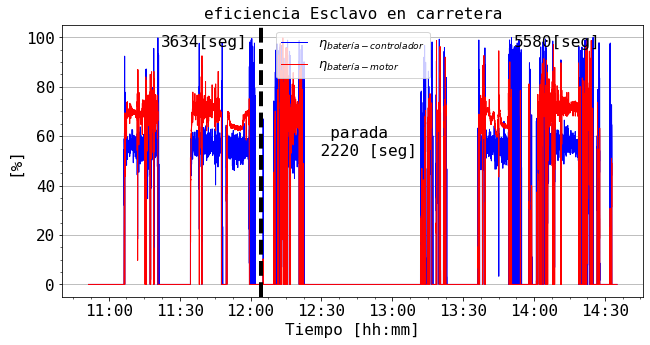

In [ ]:

import matplotlib.pyplot as plt
import numpy as np
# p = 'master_slave_pancho_1_120322_175724.csv'

# tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
# dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

from scipy import integrate
dd2 = 'sevcon.csv'
dd2= pandas.read_csv(dd2 , sep=';')
dd2['TIMESTAMP'] = pandas.to_datetime(dd2['TIMESTAMP'].str.split().str[-1])
T2 = dd2['TIMESTAMP'][:]
# ibms = (dd2['Current'][:])
# x2 = t2
# y2 = (ibms) / 3600
# y_int2 = integrate.cumtrapz(y2, x2, initial=0)
# ib = 
# tiq = dd2['izq_target_I_quadrature'][:]
# iq = dd2['izq_I_quadrature'][:]
# tid = dd2['izq_target_I_direct'][:]
# id = dd2['izq_I_direct'][:]


BatV = dd2['izq_battery_V'][:]
BatI = -dd2['izq_battery_I'][:]
Iq = -dd2['izq_I_quadrature'][:]
Uq = dd2['izq_V_quadrature'][:]
Id = dd2['izq_I_direct'][:]
Ud = dd2['izq_V_direct'][:]
Te = dd2['izq_torque_actual'][:]
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad(dd2['der_motor_RPM'][:])

pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
pot_salida = Te * rad 
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)

DD = np.asarray(pot_salida) / np.asarray(pin)

# DD = abs(pot / pin)
DD[DD > 0.99999999999999] = np.mean(DD)
DD[DD == 0.e+00] = np.mean(DD)
DD[DD == 0] = np.mean(DD)
DD[DD == np.inf] = np.mean(DD)
DD = np.nan_to_num(DD)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(17,5))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax2 = ax1.twinx()
# line2, = ax2.plot(tm_p, (butter_lowpass_filter(100*D[:], 3, 124, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (butter_lowpass_filter((pin/1000), 3, 124, 3)),linewidth=1, color='blue', label="$P_{batería}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 124, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")

# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(0, 100)}
# ax1.set_ylim(0, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("eficiencia Esclavo en carretera", fontsize=16)    
ax1.set_xlabel("Tiempo [hh:mm]", fontsize=16)
# ax1.set_ylabel("[kW]", fontsize=13)
ax1.set_ylabel("[%]", fontsize=16)
# line4, = ax1.plot(time1, abs((100*D[:])),linewidth=0.9, color='green', label="$\eta_{batería-inversor}$")
# line2, = ax1.plot(time1, abs((100*DD[:])),linewidth=0.9, color='brown', label="$\eta_{batería-motor}$")

line4, = ax1.plot(T2, abs(100*D),linewidth=1, color='blue', label="$\eta_{batería-controlador}$")
line3, = ax1.plot(T2, abs(100*DD),linewidth=1, color='red', label="$\eta_{batería-motor}$")
# line5, = ax1.plot(T2, abs(pot_salida/1000),linewidth=1, color='magenta', label="$P_{salida}$")


ax1.axvline(x=T2[8500],
            linewidth = 4, linestyle ="--", color="black")

ax1.text(T2[100], 0.92, str(3634)+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[19000], 0.92, str(int(5580))+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[8500], 0.52, '  parada\n 2220 [seg]',size=16,color="black", verticalalignment='bottom', transform=trans)

# ax1.text(T2[0], 0.6, str(3634)+'[seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)-600, 0.9, str(int(t5))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)

# line2, = ax2.plot(tm, (dF_DIRECTA['1. Battery Voltage V (0.0625)']), color='red', label="Voltaje batería")
line1.set_zorder(-1)
ax1.minorticks_on()
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line4,line3]
ax1.legend(handles=lns, loc='upper center',  prop={'size': 13})
ax1.grid(axis='y', which='major')
hh_mm = DateFormatter('%H:%M')
ax1.xaxis.set_major_formatter(hh_mm)
ax1.xaxis.set_major_formatter(hh_mm)
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

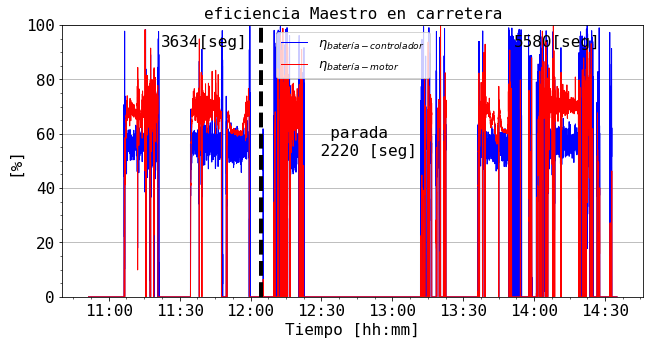

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# p = 'master_slave_pancho_1_120322_175724.csv'

# tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
# dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

from scipy import integrate
dd2 = 'sevcon.csv'
dd2= pandas.read_csv(dd2 , sep=';')
dd2['TIMESTAMP'] = pandas.to_datetime(dd2['TIMESTAMP'].str.split().str[-1])
T2 = dd2['TIMESTAMP'][:]
# ibms = (dd2['Current'][:])
# x2 = t2
# y2 = (ibms) / 3600
# y_int2 = integrate.cumtrapz(y2, x2, initial=0)
# ib = 
# tiq = dd2['izq_target_I_quadrature'][:]
# iq = dd2['izq_I_quadrature'][:]
# tid = dd2['izq_target_I_direct'][:]
# id = dd2['izq_I_direct'][:]


BatV = dd2['der_battery_V'][:]
BatI = -dd2['der_battery_I'][:]
Iq = -dd2['der_I_quadrature'][:]
Uq = dd2['der_V_quadrature'][:]
Id = dd2['der_I_direct'][:]
Ud = dd2['der_V_direct'][:]
Te = dd2['der_torque_actual'][:]
# kmhrs = Rpm2KmHrs((np.asarray(dF_p['1. Velocity RPM (1)'])))
rad = rpm2rad(dd2['der_motor_RPM'][:])

pot = (np.sqrt(3)*(Iq*Uq)+(Id*Ud))
pot = np.asarray(pot)
pot[pot == 0] = 1e-16
pin = (BatV * BatI)
pin = np.asarray(pin)
pin[pin == 0] = 1
pot_salida = Te * rad 
for i in range(len(pin)):
    if pin[i] == 0:
        pin[i] = 1
        pot[i] = 1e-16
D = abs(pot / pin)
D[D > 0.99999999999999] = np.mean(D)
D[D == 0.e+00] = np.mean(D)
D[D == 0] = np.mean(D)
D[D == np.inf] = np.mean(D)
D = np.nan_to_num(D)

DD = np.asarray(pot_salida) / np.asarray(pin)

# DD = abs(pot / pin)
DD[DD > 0.99999999999999] = np.mean(DD)
DD[DD == 0.e+00] = np.mean(DD)
DD[DD == 0] = np.mean(DD)
DD[DD == np.inf] = np.mean(DD)
DD = np.nan_to_num(DD)
plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(17,5))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax2 = ax1.twinx()
# line2, = ax2.plot(tm_p, (butter_lowpass_filter(100*D[:], 3, 124, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (butter_lowpass_filter((pin/1000), 3, 124, 3)),linewidth=1, color='blue', label="$P_{batería}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 124, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")

# ax4.spines["right"].set_position(("axes", 1.2))
ax1.set_ylim(0, 100)
# ax1.set_ylim(0, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("eficiencia Maestro en carretera", fontsize=16)    
ax1.set_xlabel("Tiempo [hh:mm]", fontsize=16)
ax1.set_ylabel("[%]", fontsize=16)
# ax1.set_ylabel("[%]", fontsize=13)
# line4, = ax1.plot(time1, abs((100*D[:])),linewidth=0.9, color='green', label="$\eta_{batería-inversor}$")
# line2, = ax1.plot(time1, abs((100*DD[:])),linewidth=0.9, color='brown', label="$\eta_{batería-motor}$")

line4, = ax1.plot(T2, abs(100*D),linewidth=1, color='blue', label="$\eta_{batería-controlador}$")
line3, = ax1.plot(T2, abs(100*DD),linewidth=1, color='red', label="$\eta_{batería-motor}$")
# line5, = ax1.plot(T2, abs(pot_salida/1000),linewidth=1, color='magenta', label="$P_{salida}$")
ax1.axvline(x=T2[8500],
            linewidth = 4, linestyle ="--", color="black")

ax1.text(T2[100], 0.92, str(3634)+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[19000], 0.92, str(int(5580))+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[8500], 0.52, '  parada\n 2220 [seg]',size=16,color="black", verticalalignment='bottom', transform=trans)

# ax1.text(T2[8500], 0.92, str(3634)+'[seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(T2[110], 0.92, str(int(5580))+'[seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(T2[100], 0.52, '  parada\n 2220 [seg]',size=12,color="black", verticalalignment='bottom', transform=trans)

# ax1.text(T2[0], 0.6, str(3634)+'[seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)-600, 0.9, str(int(t5))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)

# line2, = ax2.plot(tm, (dF_DIRECTA['1. Battery Voltage V (0.0625)']), color='red', label="Voltaje batería")
line1.set_zorder(-1)
ax1.minorticks_on()
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line4,line3]
ax1.legend(handles=lns, loc='upper center',  prop={'size': 13})
ax1.grid(axis='y', which='major')
hh_mm = DateFormatter('%H:%M')
ax1.xaxis.set_major_formatter(hh_mm)
ax1.xaxis.set_major_formatter(hh_mm)
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

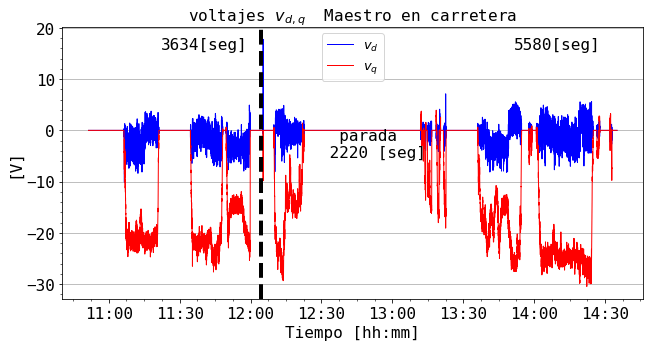

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# p = 'master_slave_pancho_1_120322_175724.csv'

# tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
# dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

from scipy import integrate
dd2 = 'sevcon.csv'
dd2= pandas.read_csv(dd2 , sep=';')
dd2['TIMESTAMP'] = pandas.to_datetime(dd2['TIMESTAMP'].str.split().str[-1])
T2 = dd2['TIMESTAMP'][:]
# ibms = (dd2['Current'][:])
# x2 = t2
# y2 = (ibms) / 3600
# y_int2 = integrate.cumtrapz(y2, x2, initial=0)
# ib = 
# tiq = dd2['izq_target_I_quadrature'][:]
# iq = dd2['izq_I_quadrature'][:]
# tid = dd2['izq_target_I_direct'][:]
# id = dd2['izq_I_direct'][:]


BatV = dd2['der_battery_V'][:]
BatI = -dd2['der_battery_I'][:]
Iq = -dd2['der_I_quadrature'][:]
Uq = dd2['der_V_quadrature'][:]
Id = dd2['der_I_direct'][:]
Ud = dd2['der_V_direct'][:]
Te = dd2['der_torque_actual'][:]
rad = rpm2rad(dd2['der_motor_RPM'][:])


plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(17,5))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax2 = ax1.twinx()
# line2, = ax2.plot(tm_p, (butter_lowpass_filter(100*D[:], 3, 124, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (butter_lowpass_filter((pin/1000), 3, 124, 3)),linewidth=1, color='blue', label="$P_{batería}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 124, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")

# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(0, 100)
# ax1.set_ylim(0, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("voltajes $v_{d,q}$  Maestro en carretera", fontsize=16)    
ax1.set_xlabel("Tiempo [hh:mm]", fontsize=16)
ax1.set_ylabel("[V]", fontsize=16)
# ax1.set_ylabel("[%]", fontsize=13)
# line4, = ax1.plot(time1, abs((100*D[:])),linewidth=0.9, color='green', label="$\eta_{batería-inversor}$")
# line2, = ax1.plot(time1, abs((100*DD[:])),linewidth=0.9, color='brown', label="$\eta_{batería-motor}$")

line4, = ax1.plot(T2, -Ud,linewidth=1, color='blue', label="$v_{d}$")
line3, = ax1.plot(T2, -Uq,linewidth=1, color='red', label="$v_{q}$")
# line5, = ax1.plot(T2, abs(pot_salida/1000),linewidth=1, color='magenta', label="$P_{salida}$")

# line1, = ax1.plot(time1[:], ud, color='blue', label="$v_{d}$")
# line2, = ax1.plot(time1[:], uq, color='red', label="$v_{q}$")

ax1.axvline(x=T2[8500],
            linewidth = 4, linestyle ="--", color="black")

ax1.text(T2[100], 0.92, str(3634)+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[19000], 0.92, str(int(5580))+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[9000], 0.52, '  parada\n 2220 [seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
# line2, = ax2.plot(tm, (dF_DIRECTA['1. Battery Voltage V (0.0625)']), color='red', label="Voltaje batería")
line1.set_zorder(-1)
ax1.minorticks_on()
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line4,line3]
ax1.legend(handles=lns, loc='upper center',  prop={'size': 13})
ax1.grid(axis='y', which='major')
hh_mm = DateFormatter('%H:%M')
ax1.xaxis.set_major_formatter(hh_mm)
ax1.xaxis.set_major_formatter(hh_mm)
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()

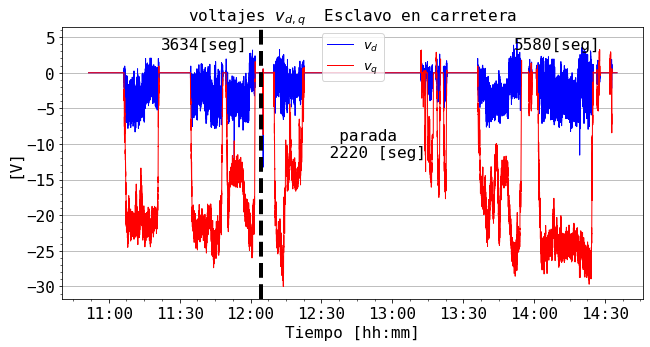

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# p = 'master_slave_pancho_1_120322_175724.csv'

# tm_p= Ts(p)#[12000:16200]   #[4000:8000]#[5600:9700]
# dF_p = lect_var(p)#[12000:16200]   #[4000:8000]#[5600:9700]]

from scipy import integrate
dd2 = 'sevcon.csv'
dd2= pandas.read_csv(dd2 , sep=';')
dd2['TIMESTAMP'] = pandas.to_datetime(dd2['TIMESTAMP'].str.split().str[-1])
T2 = dd2['TIMESTAMP'][:]
# ibms = (dd2['Current'][:])
# x2 = t2
# y2 = (ibms) / 3600
# y_int2 = integrate.cumtrapz(y2, x2, initial=0)
# ib = 
# tiq = dd2['izq_target_I_quadrature'][:]
# iq = dd2['izq_I_quadrature'][:]
# tid = dd2['izq_target_I_direct'][:]
# id = dd2['izq_I_direct'][:]


BatV = dd2['izq_battery_V'][:]
BatI = -dd2['izq_battery_I'][:]
Iq = -dd2['izq_I_quadrature'][:]
Uq = dd2['izq_V_quadrature'][:]
Id = dd2['izq_I_direct'][:]
Ud = dd2['izq_V_direct'][:]
Te = dd2['izq_torque_actual'][:]
rad = rpm2rad(dd2['izq_motor_RPM'][:])


plt.rcParams["font.family"] = "monospace"
fig, ax1 = plt.subplots(figsize=(17,5))
fig.subplots_adjust(right=0.6)
# ax3.spines["right"].set_position(("axes", 1.2))
# ax2 = ax1.twinx()
# line2, = ax2.plot(tm_p, (butter_lowpass_filter(100*D[:], 3, 124, 3)),linewidth=1, color='green', label="$\eta_{batería-inversor}$")
# line4, = ax1.plot(tm_p, (butter_lowpass_filter((pin/1000), 3, 124, 3)),linewidth=1, color='blue', label="$P_{batería}$")
# line3, = ax1.plot(tm_p, (butter_lowpass_filter(pot/1000, 3, 124, 3)),linewidth=1, color='red', label="$P_{eléctrica}$")

# ax4.spines["right"].set_position(("axes", 1.2))
# ax1.set_ylim(0, 100)
# ax1.set_ylim(0, 100)
# ax3.set_ylim(-7, 140)
# ax4.set_ylim(0, 240)
ax1.set_title("voltajes $v_{d,q}$  Esclavo en carretera", fontsize=16)    
ax1.set_xlabel("Tiempo [hh:mm]", fontsize=16)
ax1.set_ylabel("[V]", fontsize=16)
# ax1.set_ylabel("[%]", fontsize=13)
# line4, = ax1.plot(time1, abs((100*D[:])),linewidth=0.9, color='green', label="$\eta_{batería-inversor}$")
# line2, = ax1.plot(time1, abs((100*DD[:])),linewidth=0.9, color='brown', label="$\eta_{batería-motor}$")

line4, = ax1.plot(T2, -Ud,linewidth=1, color='blue', label="$v_{d}$")
line3, = ax1.plot(T2, -Uq,linewidth=1, color='red', label="$v_{q}$")
# line5, = ax1.plot(T2, abs(pot_salida/1000),linewidth=1, color='magenta', label="$P_{salida}$")

# line1, = ax1.plot(time1[:], ud, color='blue', label="$v_{d}$")
# line2, = ax1.plot(time1[:], uq, color='red', label="$v_{q}$")
ax1.axvline(x=T2[8500],
            linewidth = 4, linestyle ="--", color="black")

ax1.text(T2[100], 0.92, str(3634)+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[19000], 0.92, str(int(5580))+'[seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
ax1.text(T2[9000], 0.52, '  parada\n 2220 [seg]',size=16,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(T2[0], 0.6, str(3634)+'[seg]',size=12,color="black", verticalalignment='bottom', transform=trans)
# ax1.text(np.max(tm_p7)+np.max(tm_p5)-600, 0.9, str(int(t5))+'[seg]',size=11,color="black", verticalalignment='bottom', transform=trans)

# line2, = ax2.plot(tm, (dF_DIRECTA['1. Battery Voltage V (0.0625)']), color='red', label="Voltaje batería")
line1.set_zorder(-1)
ax1.minorticks_on()
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
# ax2.tick_params(axis='x', labelsize=12)
# ax2.tick_params(axis='y', labelsize=12)
lns = [line4,line3]
ax1.legend(handles=lns, loc='upper center',  prop={'size': 13})
ax1.grid(axis='y', which='major')
hh_mm = DateFormatter('%H:%M')
ax1.xaxis.set_major_formatter(hh_mm)
ax1.xaxis.set_major_formatter(hh_mm)
ax1.set_zorder(1)  # default zorder is 0 for ax1 and ax2
ax1.patch.set_visible(False)
plt.show()